# Prediction of travel products

## 1. 프로젝트 주제 : 여행 패키지 상품 신청 예측 프로젝트

* 해결하고자 하는 문제 : 어떤 특성에 따라 고객이 여행 패키지상품을 고객이 신청할 지 여부를 예측하여 회사의 광고비를 줄이고, 매출을 극대화하는 방향을 모색하고자 한다.    
* 데이터 
    * 데이콘의 데이터 (train : 1955개의 데이터)
    * 선정이유 : 코로나시국 이후로 관광을 많이 못한 사람들의 여행수요가 증가하고 있다. 많은 수요자 중 어떤 고객의 특성이 여행상품을 선택할 지 예측해보고자 한다.   
    * 사용할 Target 특성은 ProdTaken(여행 패키지 신청 여부)로, binary 분류문제이다.

## 2. Import Library and Data

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt

from catboost import CatBoostClassifier
from category_encoders import OneHotEncoder,OrdinalEncoder

from eli5.sklearn import PermutationImportance

from matplotlib import rcParams

from pdpbox.pdp import pdp_isolate, pdp_plot

import shap

import seaborn as sns
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer # 결측치를 평균으로 대체
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, plot_confusion_matrix, accuracy_score, f1_score,roc_curve, roc_auc_score
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.utils.class_weight import compute_sample_weight

from xgboost import XGBClassifier


In [2]:
raw_data = pd.read_csv('data/train.csv')
df = raw_data.copy()
df.head(5)

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken
0,1,28.0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,3.0,Married,3.0,0,1,0,1.0,Executive,20384.0,0
1,2,34.0,Self Enquiry,3,NaN,Small Business,Female,2,4.0,Deluxe,4.0,Single,1.0,1,5,1,0.0,Manager,19599.0,1
2,3,45.0,Company Invited,1,NaN,Salaried,Male,2,3.0,Deluxe,4.0,Married,2.0,0,4,1,0.0,Manager,NaN,0
3,4,29.0,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,4.0,Married,3.0,0,4,0,1.0,Executive,21274.0,1
4,5,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,3.0,Divorced,2.0,0,3,1,0.0,Manager,19907.0,0


In [3]:
# id만 없는 raw_data저장
raw_data = raw_data.drop(['id'],axis=1)

In [4]:
print(df.shape)

(1955, 20)


In [5]:
df.info() # 1955*20

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1955 entries, 0 to 1954
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        1955 non-null   int64  
 1   Age                       1861 non-null   float64
 2   TypeofContact             1945 non-null   object 
 3   CityTier                  1955 non-null   int64  
 4   DurationOfPitch           1853 non-null   float64
 5   Occupation                1955 non-null   object 
 6   Gender                    1955 non-null   object 
 7   NumberOfPersonVisiting    1955 non-null   int64  
 8   NumberOfFollowups         1942 non-null   float64
 9   ProductPitched            1955 non-null   object 
 10  PreferredPropertyStar     1945 non-null   float64
 11  MaritalStatus             1955 non-null   object 
 12  NumberOfTrips             1898 non-null   float64
 13  Passport                  1955 non-null   int64  
 14  PitchSat

### 특성 설명(데이콘)

id : 샘플 아이디  
Age : 나이  
TypeofContact : 고객의 제품 인지 방법 (회사의 홍보 or 스스로 검색)  
CityTier : 주거 중인 도시의 등급. (인구, 시설, 생활 수준 기준) (1등급 > 2등급 > 3등급)  
DurationOfPitch : 영업 사원이 고객에게 제공하는 프레젠테이션 기간  
Occupation : 직업  
Gender : 성별  
NumberOfPersonVisiting : 고객과 함께 여행을 계획 중인 총 인원  
NumberOfFollowups : 영업 사원의 프레젠테이션 후 이루어진 후속 조치 수  
ProductPitched : 영업 사원이 제시한 상품  
PreferredPropertyStar : 선호 호텔 숙박업소 등급  
MaritalStatus : 결혼여부  
NumberOfTrips : 평균 연간 여행 횟수  
Passport : 여권 보유 여부 (0: 없음, 1: 있음)  
PitchSatisfactionScore : 영업 사원의 프레젠테이션 만족도  
OwnCar : 자동차 보유 여부 (0: 없음, 1: 있음)  
NumberOfChildrenVisiting : 함께 여행을 계획 중인 5세 미만의 어린이 수  
Designation : (직업의) 직급  
MonthlyIncome : 월 급여  
ProdTaken : 여행 패키지 신청 여부 (0: 신청 안 함, 1: 신청함)  

## 3. 데이터를 이용한 가설, 기준모델(Baseline Model), 평가지표설명

* 가설(탐색적데이터분석)  
    * 가설1 : 결혼 후, 여행을 계획중인 아이들이 있으면 가족패키지에 대한 수요가 있어 패키지신청확률이 높을 것이다.  
    * 가설2 : 영업 사원의 프레젠테이션 만족도는 가족패키지에 대한 수요와 연관성이 높을 것이다.  
      
    
* 기준모델 및 평가지표설명
    * Baseline Model은 초기 최빈값인 0.79에서 Logistic Regression의 AUC Score로 변경

## 4. EDA & Datapreprocessing

    * Gender 컬럼의 'Fe Male'->'Female'로 수정  
    * 결측치제거  
    * unique 컬럼 제거(id)
    * age특성 age로 구간설정
    * DurationOfPitch을 구간별로 설정
    * Monthly Income을 구간별로 설정


In [6]:
# 결측치확인

df.isnull().sum()

id                            0
Age                          94
TypeofContact                10
CityTier                      0
DurationOfPitch             102
Occupation                    0
Gender                        0
NumberOfPersonVisiting        0
NumberOfFollowups            13
ProductPitched                0
PreferredPropertyStar        10
MaritalStatus                 0
NumberOfTrips                57
Passport                      0
PitchSatisfactionScore        0
OwnCar                        0
NumberOfChildrenVisiting     27
Designation                   0
MonthlyIncome               100
ProdTaken                     0
dtype: int64

In [7]:
def data_preprocessing(df_):
    
    # Gender 특성 데이터정리
    df_['Gender'] = df_['Gender'].str.replace('Fe Male', 'Female')
    
    df_ = df_.dropna()
    
    # 나이를 기준으로 나이대별 컬럼생성
    df_['Ages'] = (df_['Age']//10*10).astype(int)
    # Age컬럼 삭제하기(시각화 후 모델링 직전에 삭제.)
    
    df_['DurationOfPitchSection'] = pd.cut(df_['DurationOfPitch'], 
                                        bins = [0,5,10, 15, 20,25,30,35,40], 
                                        labels = ['~5', '~10', '~15', '~20','~25','~30','~35','~40'])

    
    df_['MonthlyIncomeSection'] = pd.cut(df_['MonthlyIncome'], 
                                        bins = [0,15000,20000, 25000, 30000,35000,40000,45000,50000,100000], 
                                        labels = ['~15000', '~20000', '~25000', '~30000','~35000','~40000','~45000','~50000','~100000'])

    # high cardinality로 불필요한 컬럼 삭제
    # df = df.drop(['id'],axis=1)
    
    return df_


In [8]:
# 테스트데이터도 추후 전처리 해줘야함!!!! 모델링하는거 봐서 더 잘 먹는걸로 전처리하기!

In [9]:
# 컬럼별 데이터내용 확인
df.describe()

,id,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,ProdTaken
count,1955.000000,1861.000000,1955.000000,1853.000000,1955.000000,1942.000000,1945.000000,1898.000000,1955.000000,1955.000000,1955.000000,1928.000000,1855.000000,1955.000000
mean,978.000000,37.462117,1.641432,15.524015,2.922762,3.718332,3.568638,3.255532,0.291049,3.067519,0.619437,1.213174,23624.108895,0.195908
std,564.504207,9.189948,0.908744,8.150057,0.712276,1.004095,0.793196,1.814698,0.454362,1.372915,0.485649,0.859450,5640.482258,0.397000
min,1.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000,0.000000
25%,489.500000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20390.000000,0.000000
50%,978.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22295.000000,0.000000
75%,1466.500000,43.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25558.000000,0.000000
max,1955.000000,61.000000,3.000000,36.000000,5.000000,6.000000,5.000000,19.000000,1.000000,5.000000,1.000000,3.000000,98678.000000,1.000000


In [10]:
# 컬럼별 데이터 내용 확인
for i in df.columns:
    print(df[i].value_counts())

1       1
1314    1
1312    1
1311    1
1310    1
       ..
648     1
647     1
646     1
645     1
1955    1
Name: id, Length: 1955, dtype: int64
35.0    96
33.0    88
32.0    86
37.0    84
36.0    84
34.0    79
38.0    74
41.0    74
30.0    70
29.0    68
31.0    68
28.0    62
39.0    61
40.0    57
42.0    55
45.0    53
43.0    53
27.0    51
46.0    42
26.0    42
44.0    41
51.0    36
49.0    32
47.0    31
25.0    31
53.0    30
50.0    29
54.0    27
48.0    26
52.0    24
24.0    24
23.0    23
55.0    23
22.0    20
56.0    17
21.0    17
19.0    16
59.0    14
20.0    13
60.0    12
58.0    11
57.0     9
18.0     5
61.0     3
Name: Age, dtype: int64
Self Enquiry       1379
Company Invited     566
Name: TypeofContact, dtype: int64
1    1283
3     582
2      90
Name: CityTier, dtype: int64
9.0     199
7.0     126
8.0     122
6.0     116
16.0    114
14.0    112
15.0    105
10.0    103
12.0     85
11.0     83
13.0     83
17.0     75
23.0     41
30.0     39
22.0     36
31.0     34
25.0     32


In [11]:
data = data_preprocessing(df).reset_index(drop=True)
data.head(5)

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,...,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken,Ages,DurationOfPitchSection,MonthlyIncomeSection
0,1,28.0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,...,0,1,0,1.0,Executive,20384.0,0,20,~10,~25000
1,4,29.0,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,...,0,4,0,1.0,Executive,21274.0,1,20,~10,~25000
2,5,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,...,0,3,1,0.0,Manager,19907.0,0,40,~10,~20000
3,6,32.0,Self Enquiry,1,29.0,Small Business,Male,4,4.0,Deluxe,...,1,5,1,1.0,Manager,24857.0,1,30,~30,~25000
4,7,43.0,Company Invited,3,8.0,Salaried,Male,3,3.0,Deluxe,...,0,3,1,2.0,Manager,20675.0,0,40,~10,~25000


## 5. Visualization

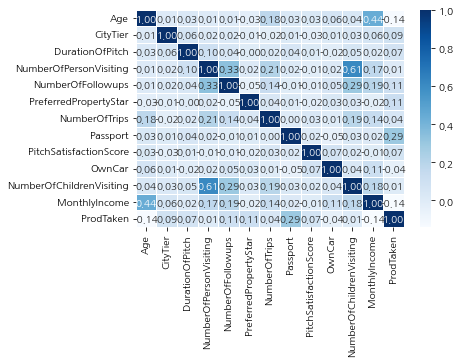

In [12]:
# 특성별 상관관계 히트맵으로 표현.

# seaborn setting
rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

sns.heatmap(data=raw_data.corr(), annot=True, fmt='.2f', linewidths=.5, cmap='Blues');

* 특성간 상관관계가 높을수록 진한색을 띄는데, 데이터를 확인시, 특성간 뚜렷한 상관관계가 보이지 않음을 확인하였다.   


* 타겟인 ProdTaken와 상관관계가 가장 높은 것은 여권소지유무로 0.32가 가장 높은 값이다.  
* 함께 여행을 계획 중인 5세 미만의 어린이 수 고객과 함께 여행을 계획 중인 총 인원은 0.6의 상관관계로 상관관계수치 중 가장 높은 값을 보인다.  


* 타겟의 상관관계가 음수로 나타난 경우  
    * 나이와 타겟의 상관관계 : 이는 고령일수록 패키지여행신청을 하지 않음을 보여준다.  
    * 차량과 타겟의 상관관계 : 차가 없는 경우가 패키지여행을 더 고려하는 것을 보여준다.
    * 월별소득과 타겟의 상관관계 : 소득이 적을 때 패키지여행을 더 고려하는 것을 보여준다.


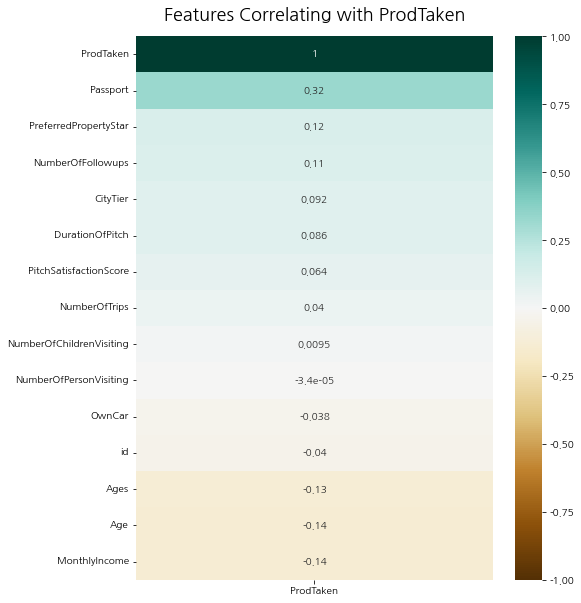

In [13]:
# 연관분석
from matplotlib import rc
rc('axes', unicode_minus=False)

plt.figure(figsize=(8, 10))
heatmap = sns.heatmap(data.corr()[['ProdTaken']].sort_values(by='ProdTaken', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with ProdTaken', fontdict={'fontsize':18}, pad=16);

In [14]:
# 범주형 변수는 주성분분석불가, 데이터를 수치형 데이터로 변경 후, 카테고리로 데이터타입을 변경하여 주성분분석에 사용
# 주성분분석을 통해 전체 열 중에 중요 열을 추리는 것이 목적EDA로 구간별로 구분한 컬럼을 카테고리화하기

category_data = data.drop(['MonthlyIncome','Age','DurationOfPitch'],axis=1)
category_data

category_data_fac = category_data.apply(lambda x: pd.factorize(x)[0])
category_data_fac = category_data.astype('category')

encoder = OrdinalEncoder()

category_data_fac_encoded = encoder.fit_transform(category_data_fac)

category_data_fac_encoded_catego = category_data_fac_encoded.astype('category')

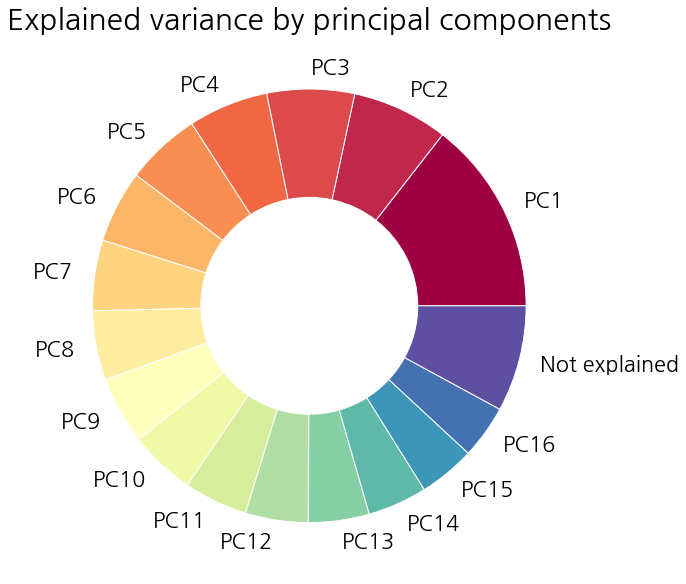

In [15]:
# 주성분분석을 통해 특정 컬럼이 주성분분석결과를 설명할 수 있다고 보여지지 않음

from psynlig import pca_explained_variance_pie
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

data_for_pca = scale(category_data_fac_encoded_catego)

pca = PCA(n_components=16) # 
pca.fit_transform(data_for_pca)

fig, axi = pca_explained_variance_pie(pca, cmap='Spectral')
axi.set_title('Explained variance by principal components',fontsize=30)

plt.show()


In [16]:
# 타겟 구성비율확인
print(data['ProdTaken'].value_counts())

print(data['ProdTaken'].value_counts(normalize=True))

0    1313
1     336
Name: ProdTaken, dtype: int64
0    0.79624
1    0.20376
Name: ProdTaken, dtype: float64


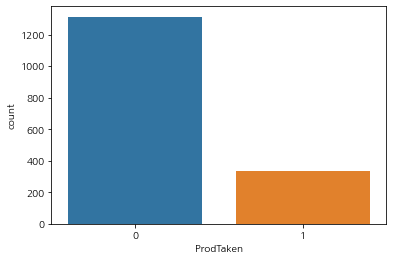

In [17]:
# 타겟의 imbalance 확인
%matplotlib inline

sns.countplot(x=data['ProdTaken']);

In [18]:
# ProdTaken이 1로 나온 특성별 분포확인(여행패키지 신청한 경우)

dataa = data[data['ProdTaken']==1]
dataa.shape

(336, 23)

In [19]:
data['Occupation'].value_counts()

Salaried          808
Small Business    693
Large Business    147
Free Lancer         1
Name: Occupation, dtype: int64

### 데이터 분포확인1

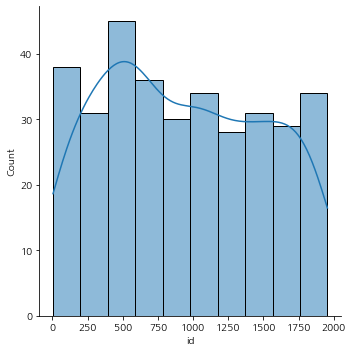

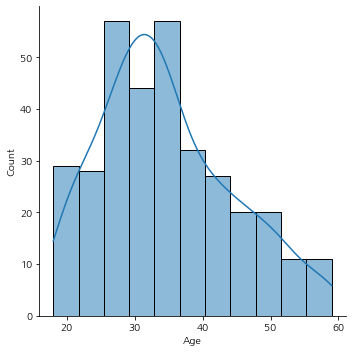

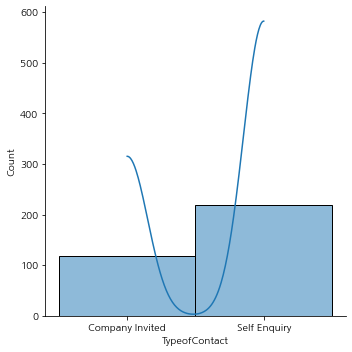

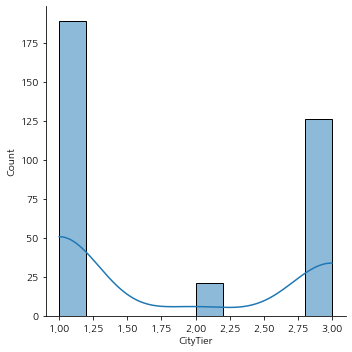

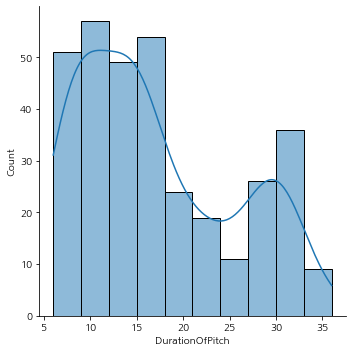

...

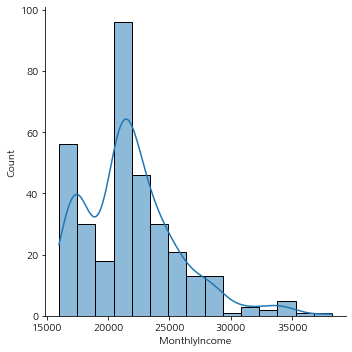

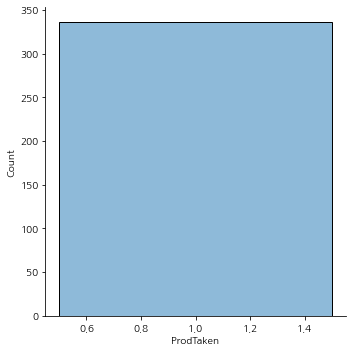

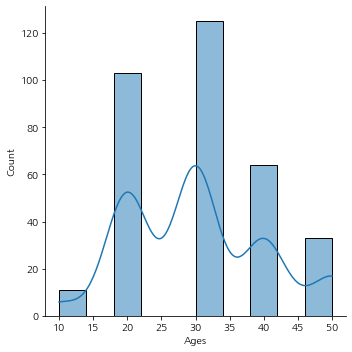

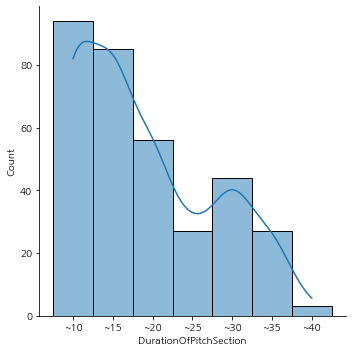

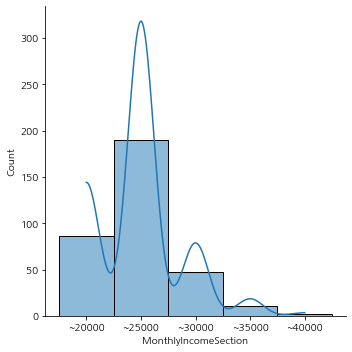

In [20]:
for i in dataa.columns:
    sns.displot(x=dataa[i],kde=True) # kde : 커널밀도추정. 커널함수와 데이터를 바탕으로 연속성있는 확률밀도함수를 추정하는것.

### 데이터 분포확인2

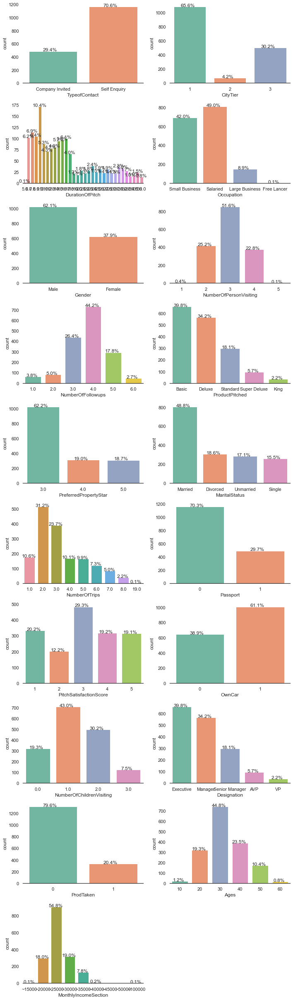

In [21]:
plt.figure(figsize=(10,50))

sns.set_theme(style="white") 
cols=['TypeofContact', 'CityTier', 'DurationOfPitch', 'Occupation', 'Gender',
       'NumberOfPersonVisiting', 'NumberOfFollowups', 'ProductPitched',
       'PreferredPropertyStar', 'MaritalStatus', 'NumberOfTrips', 'Passport',
       'PitchSatisfactionScore', 'OwnCar', 'NumberOfChildrenVisiting',
       'Designation', 'ProdTaken', 'Ages', 'MonthlyIncomeSection']
for i, variable in enumerate(cols):
                     ax=plt.subplot(15,2,i+1)
                     #order = data[variable].value_counts(ascending=False).index   
                     #sns.set_palette(list_palette[i]) # to set the palette
                     sns.set_palette('Set2')
                    
                     ax=sns.countplot(x=data[variable], data=data )
                     sns.despine(top=True,right=True,left=True) # 그래프위,양옆선삭제
                     for p in ax.patches:
                           percentage = '{:.1f}%'.format(100 * p.get_height()/len(data[variable]))
                           x = p.get_x() + p.get_width() / 2 - 0.05
                           y = p.get_y() + p.get_height()
                           plt.annotate(percentage, (x, y),ha='center') # 주석
                     plt.tight_layout()
                     #plt.title(cols[i].upper())
                                     

In [22]:
data['DurationOfPitch'].value_counts(normalize=True).head(10)

9.0     0.103699
7.0     0.069133
8.0     0.063675
6.0     0.061856
16.0    0.060643
15.0    0.058217
14.0    0.057004
10.0    0.053366
13.0    0.048514
12.0    0.047301
Name: DurationOfPitch, dtype: float64

### * 특성별 분포도 분석

회사 제품의 인지방법(TypeofContact) : 고객 스스로 검색이 70%로 반 회사의 홍보(30%)보다 2배 많음  
주거 중인 도시의 등급(CityTier)이 1등급이 가장 많은데, 생활수준이 가장 좋은 곳의 사람들을 대상으로 수집한 정보임을 알 수 있다.(1등급 > 2등급 > 3등급)  
영업 사원이 고객에게 제공하는 프레젠테이션 기간(DurationOfPitch)은 17이상으로는 급격히 떨어짐을 확인할 수 있다.  
조사된 사람들의 대부분의 직업(Occupation) 중 반은 직장인, 그리고 두번째는 작은사업을 하고 있다고 하는 경우가 많았고,  
Designation을 보면 가장 높은 직급이 Executive, Manager인 것으로 보아 생활수준이 좋은 사람들의 데이터라볼 수 있다.  
  
성별(Gender)은 60%이상이 남자고,  
고객과 함께 여행을 계획 중인 총 인원은 3명이 과반수를 넘었으며,   
프레젠테이션 후 이루어진 후속 조치 수(NumberOfFollowups)는 4점이 44%로 가장 높았고,  
영업 사원이 제시한 상품(ProductPitched)은 basic, delux순으로 많았으며,  
선호 호텔 숙박업소 등급(PreferredPropertyStar)은 3점이 가장 많았고,  
결혼여부(MaritalStatus)는 결혼한 경우가 많았다. (unmarried는 사실혼의 경우로 본다)  
평균 연간 여행 횟수(NumberOfTrips)는 2번, 그 다음 3번이 가장 많았고,   
여권 보유 여부(Passport)은 없는 경우가 70%를 넘었다.  
영업 사원의 프레젠테이션 만족도(PitchSatisfactionScore)는 3점이 가장 높았으며,  
자동차 보유 여부(OwnCar)는 있는 경우가 61%를 넘었다.  
함께 여행을 계획 중인 5세 미만의 어린이 수(NumberOfChildrenVisiting)는 1명, 2명 순으로 많았다.  
여행 패키지 신청 여부(ProdTaken)는 20%의 고객만이 진행됐고,  
나이대(Ages)는 30대가 44%로 가장 높았으며,  
월 급여구간(MonthlyIncomeSection)은 20000~25000이 가장 많았다.  

<AxesSubplot:xlabel='ProdTaken', ylabel='MonthlyIncome'>

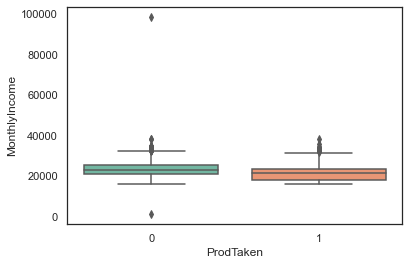

In [23]:
sns.boxplot(data=data, x="ProdTaken", y="MonthlyIncome")

### 데이터분포3

In [24]:
### Function to plot distributions and Boxplots of customers
rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

def plot(x,target='ProdTaken'):
    
    fig,axs = plt.subplots(2,2,figsize=(12,10))
    
    axs[0, 0].set_title(f'패키지상품 미선택한\n {x} 특성 분포도',fontsize=12,fontweight='bold')
    sns.histplot(data[(data[target] == 0)][x],ax=axs[0,0],color='teal')
    
    axs[0, 1].set_title(f"패키지상품 선택한\n {x}특성 분포도",fontsize=12,fontweight='bold')
    sns.histplot(data[(data[target] == 1)][x],ax=axs[0,1],color='orange')
    
    axs[1,0].set_title(f'패키지상품 선택한 {x} 특성 boxplot',fontsize=12,fontweight='bold')
    
    line = plt.Line2D((.1,.9),(.5,.5), color='grey', linewidth=1.5,linestyle='--')
    fig.add_artist(line)
    sns.boxplot(data=data, x=target, y=x, ax=axs[1,0],palette='gist_rainbow',showmeans=True)
    
    axs[1,1].set_title(f'이상치 제거한 {x} 특성의 boxplot',fontsize=12,fontweight='bold')
    sns.boxplot(data=data, x=target, y=x,ax=axs[1,1],showfliers=False,palette='gist_rainbow',showmeans=True) #turning off outliers from boxplot
    sns.despine(top=True,right=True,left=True) # to remove side line from graph
    
    plt.tight_layout(pad=4)
    plt.show()

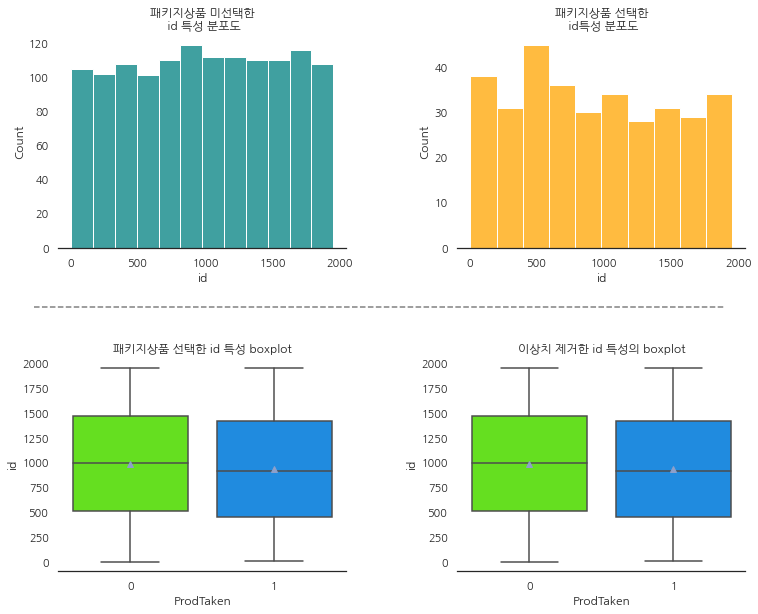

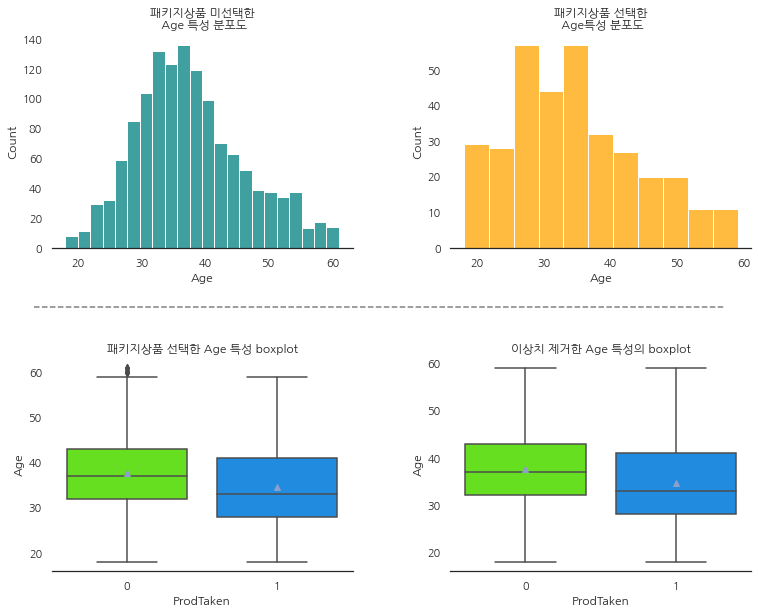

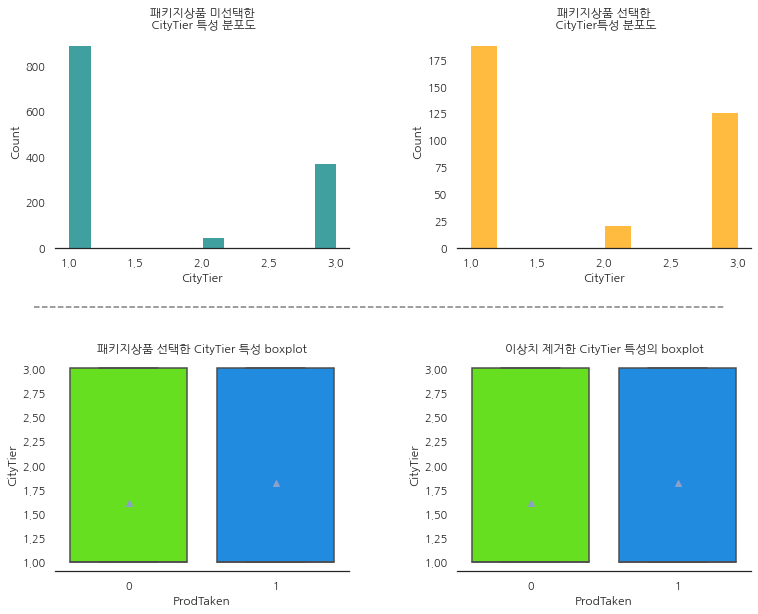

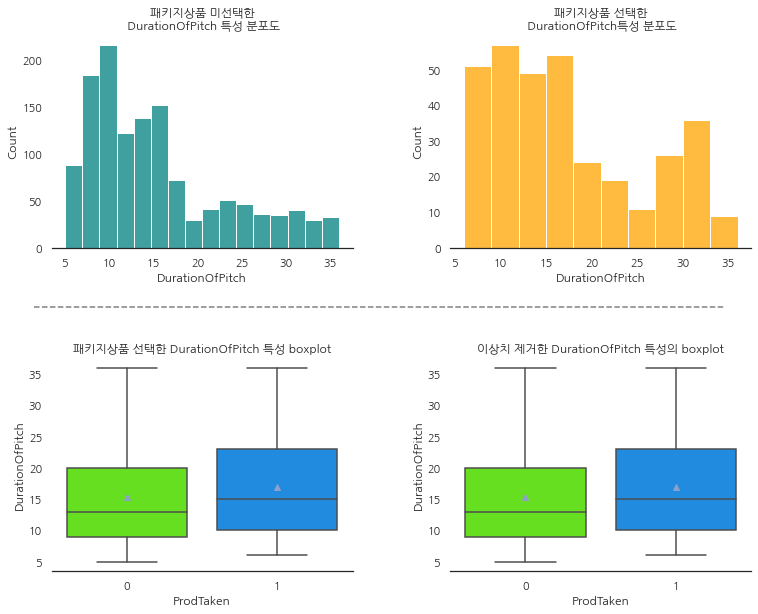

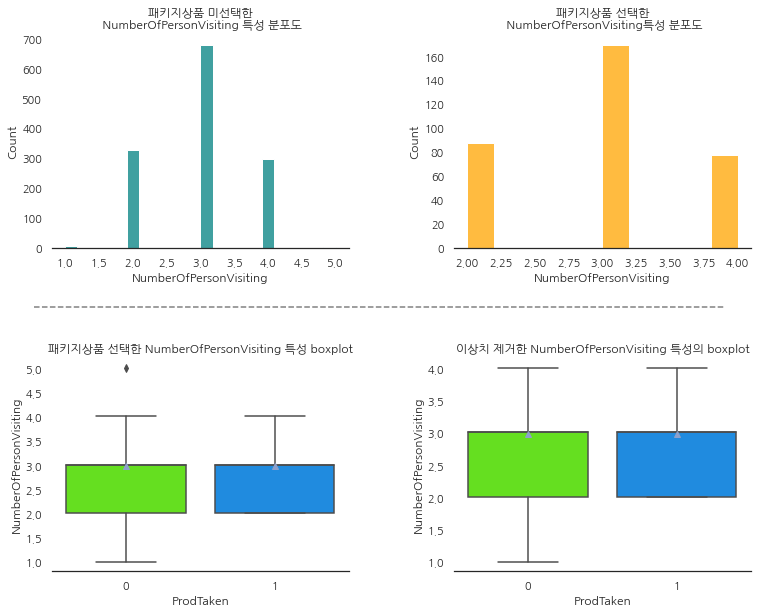

...

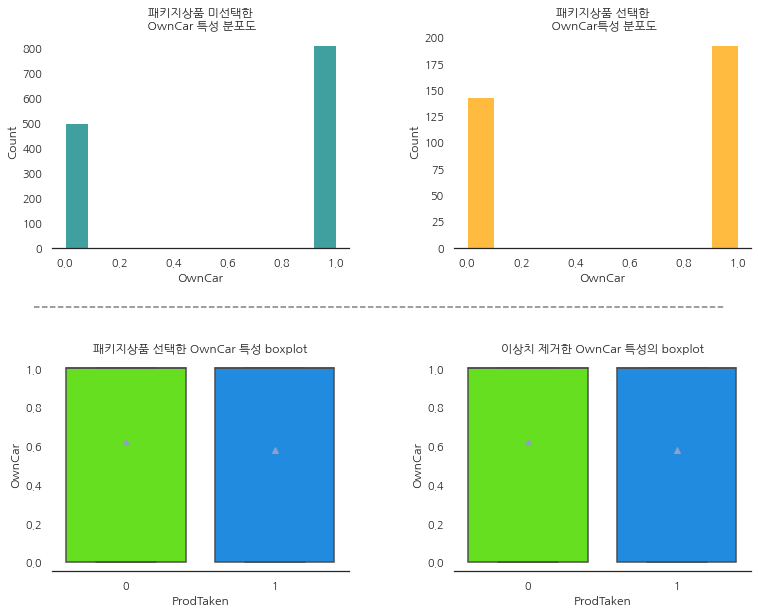

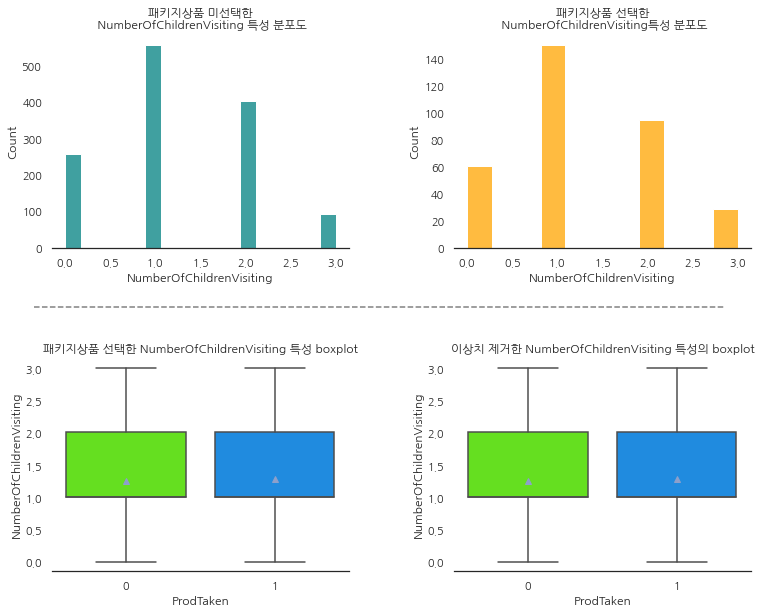

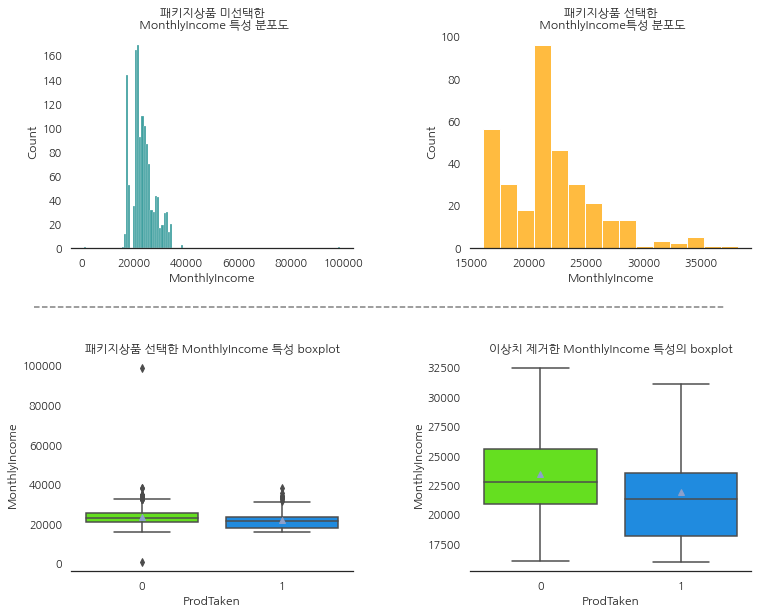

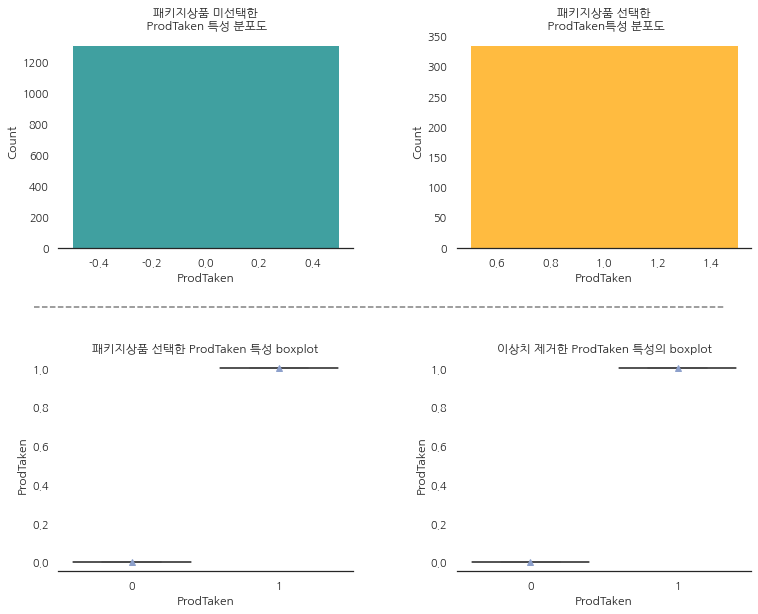

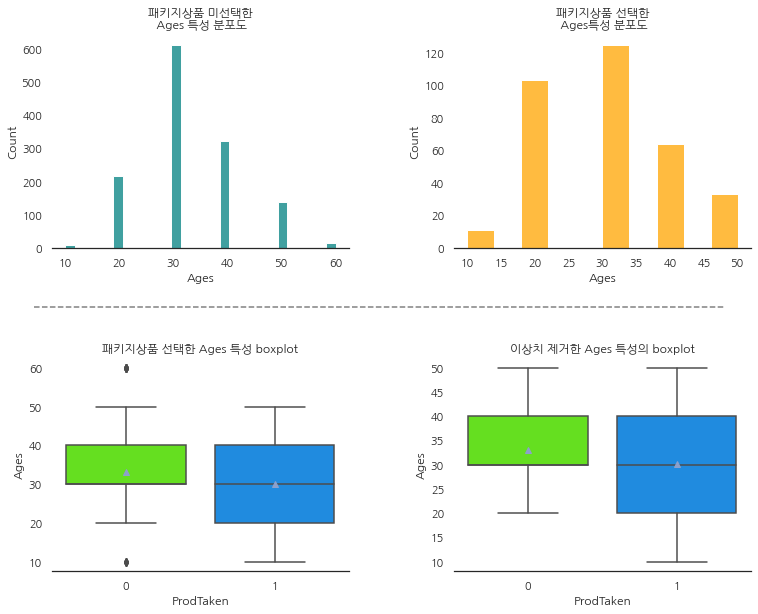

In [25]:
#select all quantitative columns for checking the spread
#list_col=  ['Age','DurationOfPitch','MonthlyIncome']

list_col=data.select_dtypes(include='number').columns.to_list()

#print(list_col)
#plt.figure(figsize=(14,23))

for j in range(len(list_col)):
   plot(list_col[j])
   

Text(0.5, 1.0, '패키지 미선택한 고객의 제품인지방법 비율')

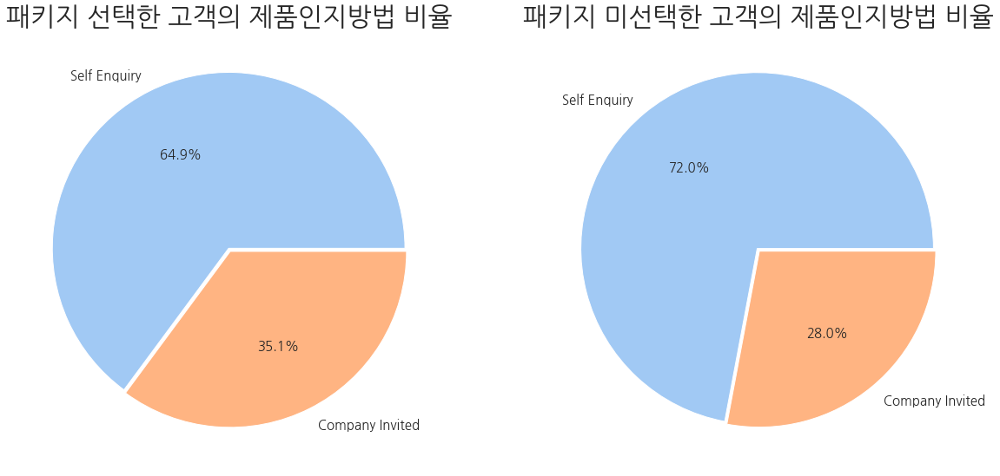

In [26]:
['TypeofContact','Occupation','Gender','ProductPitched','MaritalStatus','Designation']

# seaborn setting

rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

# 패키지 선택한 성 비율
yes = data[data.ProdTaken==1]

# 패키지 미선택한 성비율 
no = data[data.ProdTaken==0]

# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['TypeofContact'].value_counts()
labels=yes['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 고객의 제품인지방법 비율',fontsize=30)


pie_data=no['TypeofContact'].value_counts()
labels=no['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)

ax2.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 고객의 제품인지방법 비율',fontsize=30)


<AxesSubplot:xlabel='ProdTaken', ylabel='count'>

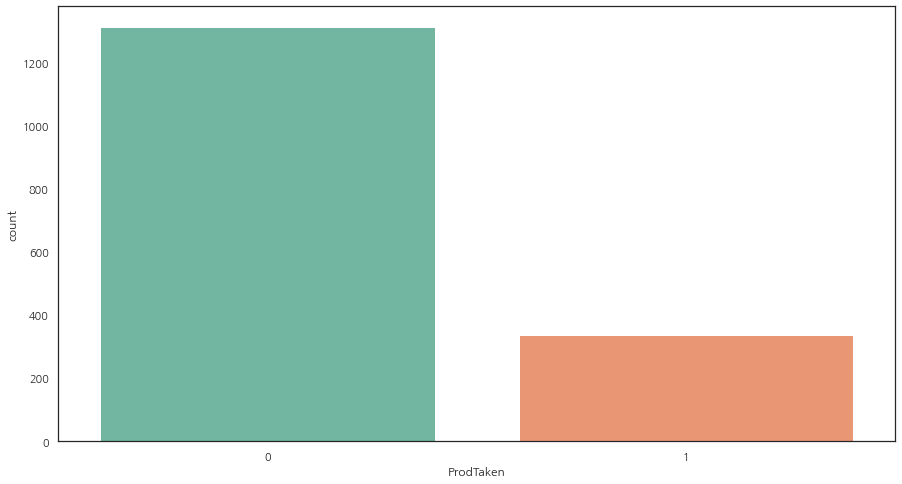

In [27]:
sns.countplot(data=data,x='ProdTaken')

### 가설1 : 결혼 후, 여행을 계획중인 아이들이 있으면 가족패키지에 대한 수요가 있어 여행상품신청확률이 높을 것이다.

In [28]:
# 결혼한 경우의 데이터를 추린다.
condition=data[(data.MaritalStatus=='Married')] #| (data.MaritalStatus=='Divorced')]
condition['MaritalStatus'].value_counts()

Married    804
Name: MaritalStatus, dtype: int64

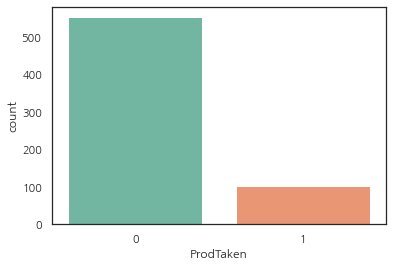

In [29]:
# 함께 여행을 계획 중인 5세 미만의 어린이 수가 있는 경우의 조건을 추가한다.
data_travel_children = condition[condition['NumberOfChildrenVisiting']>0]

# 타겟의 imbalance 확인
%matplotlib inline

sns.countplot(x=data_travel_children['ProdTaken']);

In [30]:
# 타겟 구성비율확인
print(data_travel_children['ProdTaken'].value_counts())
print(data_travel_children['ProdTaken'].value_counts(normalize=True))

0    552
1    102
Name: ProdTaken, dtype: int64
0    0.844037
1    0.155963
Name: ProdTaken, dtype: float64


해당가설의 최빈값은 당초 원데이터의 최빈값 정확도보다 0.5% 높아지는 것을 보이며, 이는 결혼 후, 여행에 계획중인 아이들이 여행상품선택과는 무관함을 보여준다.  
(결혼을 하고 애가 있는 경우(이혼한 경우도) 진행했으나 married와 비슷한 수치를 보였다.)

### 가설2 : 영업 사원의 프레젠테이션 만족도는 가족패키지에 대한 수요와 연관성이 높을 것이다.

In [31]:
# 결혼한 경우의 데이터를 추린다.
condition=data[(data.MaritalStatus=='Married')] #| (data.MaritalStatus=='Divorced')]
condition['MaritalStatus'].value_counts()

Married    804
Name: MaritalStatus, dtype: int64

In [32]:
# 가설2에 따른 영업사원의 프레젠테이션만족도는 가족패키지에 대한 수요를 높일 것이다로 했을 시, 최빈값보다 0.03이 오른 것을 확인할 수 있다.

condition2 = data[data['PitchSatisfactionScore']>=3]
condition2[condition2['NumberOfChildrenVisiting']>0]['ProdTaken'].value_counts(normalize=True)

0    0.768632
1    0.231368
Name: ProdTaken, dtype: float64

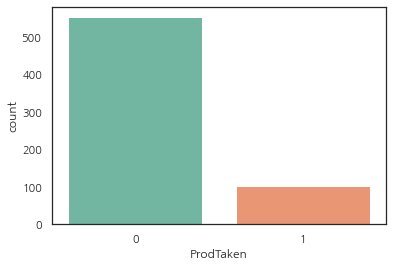

In [33]:

# 타겟의 imbalance 확인
%matplotlib inline

sns.countplot(x=data_travel_children['ProdTaken']);

<AxesSubplot:xlabel='ProdTaken', ylabel='MonthlyIncome'>

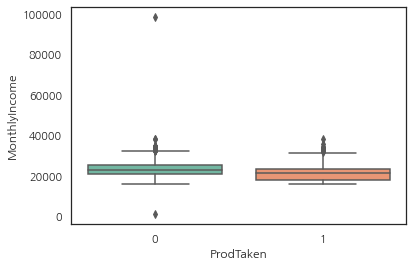

In [34]:
# 패키지여행상품선택여부와 소득의 관계표현
sns.boxplot(data=data, x="ProdTaken", y="MonthlyIncome")

In [35]:
data.describe()

,id,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,ProdTaken,Ages
count,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000
mean,979.323226,37.021225,1.646452,15.627653,2.970285,3.752577,3.565191,3.316555,0.297150,3.048514,0.610673,1.257732,23141.996968,0.203760,32.510612
std,561.717183,9.049227,0.912721,8.149520,0.704331,1.017758,0.787972,1.818987,0.457142,1.372873,0.487746,0.853130,4649.463051,0.402915,9.502365
min,1.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000,0.000000,10.000000
25%,492.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20764.000000,0.000000,30.000000
50%,978.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22359.000000,0.000000,30.000000
75%,1465.000000,43.000000,3.000000,21.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25266.000000,0.000000,40.000000
max,1955.000000,61.000000,3.000000,36.000000,5.000000,6.000000,5.000000,19.000000,1.000000,5.000000,1.000000,3.000000,98678.000000,1.000000,60.000000


Text(0.5, 1.0, '패키지 미선택한 고객의 상품인지방법 비율')

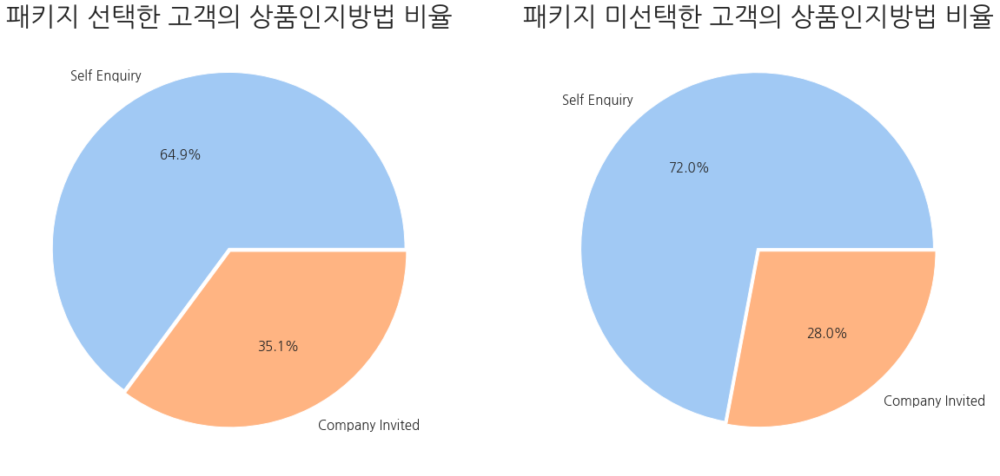

In [36]:
# seaborn setting

rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

# 패키지 선택한 성 비율
yes = data[data.ProdTaken==1]

# 패키지 미선택한 성비율 
no = data[data.ProdTaken==0]

# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['TypeofContact'].value_counts()
labels=yes['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 고객의 상품인지방법 비율',fontsize=30)


pie_data=no['TypeofContact'].value_counts()
labels=no['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)

ax2.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 고객의 상품인지방법 비율',fontsize=30)


Text(0.5, 1.0, '패키지 미선택한 결혼여부 비율')

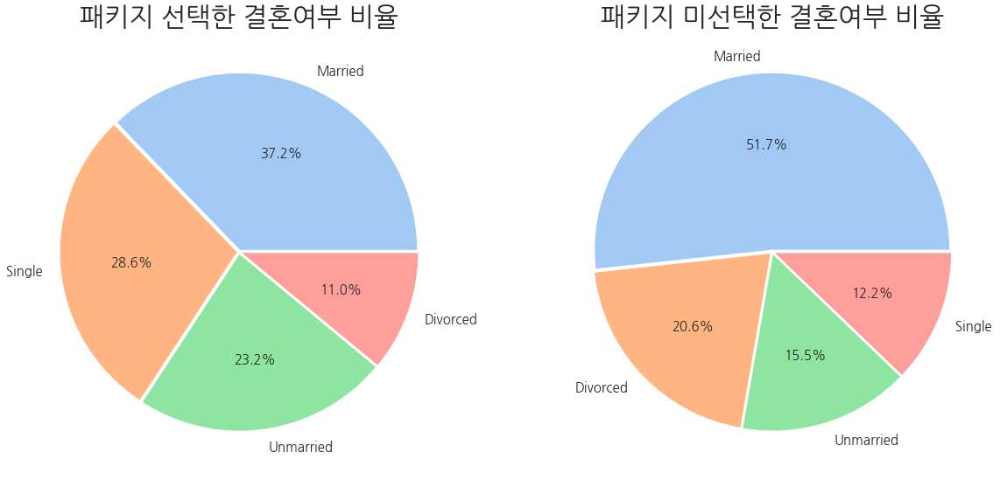

In [37]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['MaritalStatus'].value_counts()
labels=yes['MaritalStatus'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 결혼여부 비율',fontsize=30)


pie_data=no['MaritalStatus'].value_counts()
labels=no['MaritalStatus'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 결혼여부 비율',fontsize=30)


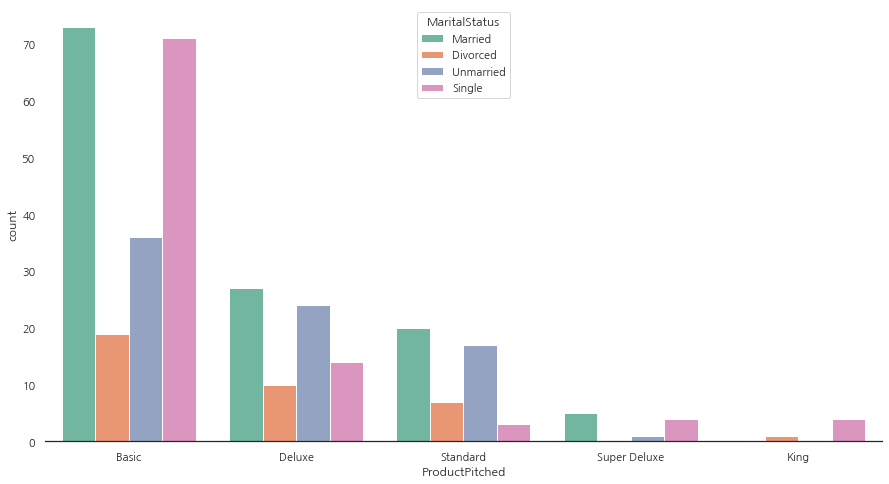

In [38]:
# 결혼상태별 영업사원판매상품과 비율
sns.countplot(x="ProductPitched", data=yes,  hue="MaritalStatus")
sns.despine(top=True,right=True,left=True) 

Text(0.5, 1.0, '패키지 미선택한 직급 비율')

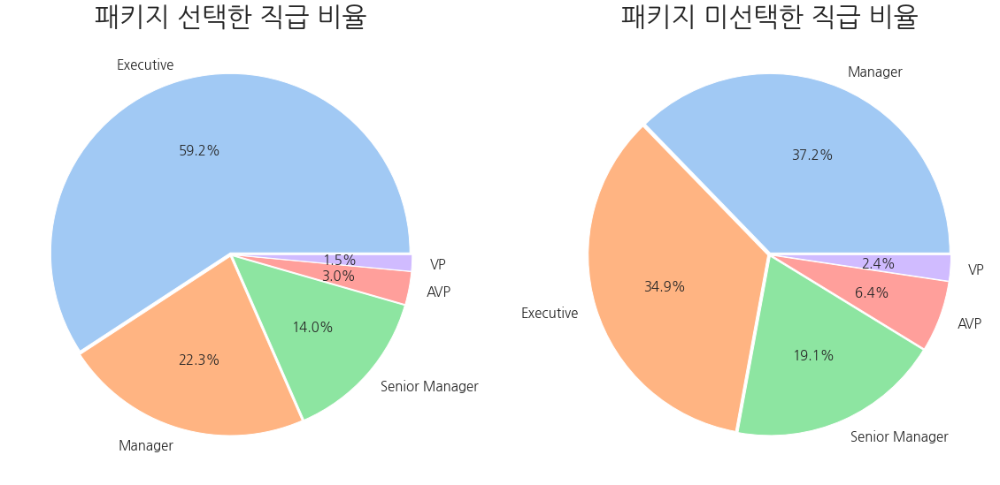

In [39]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['Designation'].value_counts()
labels=yes['Designation'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 직급 비율',fontsize=30)


pie_data=no['Designation'].value_counts()
labels=no['Designation'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 직급 비율',fontsize=30)


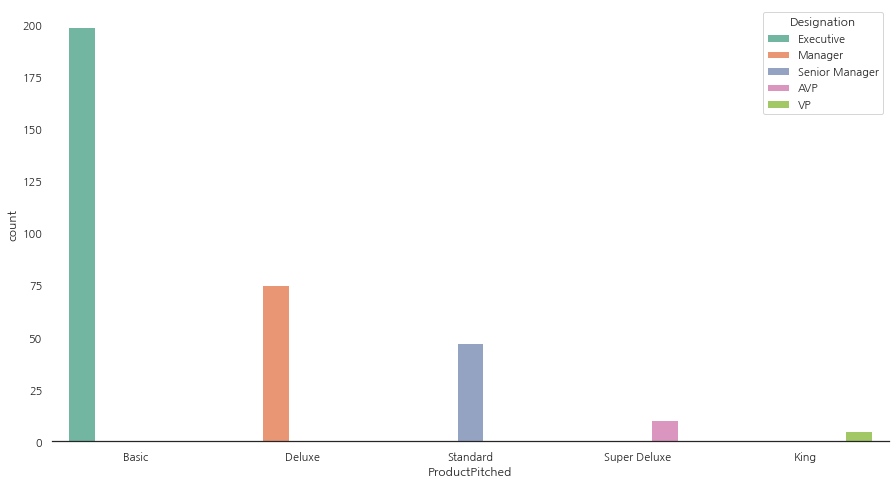

In [40]:
# 직급 영업사원판매상품과 비율
sns.countplot(x="ProductPitched", data=yes,  hue="Designation")
sns.despine(top=True,right=True,left=True) 

직함에 매니저라고 적어도 직업에 작은 사업, 큰 사업으로 기재된 경우가 많아, 직함은 큰 의미가 없는 것으로 파악하기로 한다.
(기업의 규모마다 매니저의 역할/역량이 다른 경우도 많으니 큰 의미를 두지 않기로 하며, 매니저 이상의 고객군으로 파악하기로 한다.)

In [41]:
# 매니저 직함의 직업 종류 분포
designation_manager = data[data['Designation']=='Manager']
designation_manager['Occupation'].value_counts()

Salaried          265
Small Business    256
Large Business     43
Name: Occupation, dtype: int64

In [42]:
# 경영진 직함의 직업 종류 분포
designation_executive = data[data['Designation']=='Executive']
designation_executive['Occupation'].value_counts()

Salaried          344
Small Business    248
Large Business     64
Free Lancer         1
Name: Occupation, dtype: int64

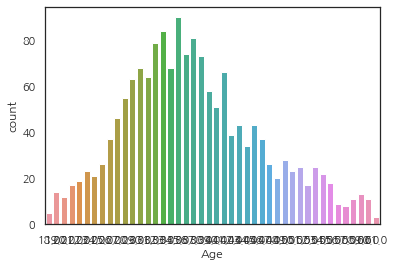

In [43]:
# 나이대 분포도

%matplotlib inline

sns.countplot(x=data['Age']);

In [44]:
# high cardinality 및 특성생성하고 난 후 베이스된 특성 제거
data = data.drop(['id','Age','MonthlyIncome','DurationOfPitch'],axis=1).reset_index(drop=True)

In [45]:
data.head()

,TypeofContact,CityTier,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,ProdTaken,Ages,DurationOfPitchSection,MonthlyIncomeSection
0,Company Invited,1,Small Business,Male,3,4.0,Basic,3.0,Married,3.0,0,1,0,1.0,Executive,0,20,~10,~25000
1,Company Invited,1,Small Business,Male,3,5.0,Basic,4.0,Married,3.0,0,4,0,1.0,Executive,1,20,~10,~25000
2,Self Enquiry,3,Salaried,Male,2,3.0,Deluxe,3.0,Divorced,2.0,0,3,1,0.0,Manager,0,40,~10,~20000
3,Self Enquiry,1,Small Business,Male,4,4.0,Deluxe,3.0,Divorced,3.0,1,5,1,1.0,Manager,1,30,~30,~25000
4,Company Invited,3,Salaried,Male,3,3.0,Deluxe,3.0,Married,2.0,0,3,1,2.0,Manager,0,40,~10,~25000


## 6. Modeling

### 모델의 유용성과 한계

* 목적 : 주어진 특성을 분석하여 패키지 여행을 신청할 지, 말 지 예측
* 유용성 : 잠재고객을 파악하여 영업/광고방향 설정 가능
* 한계 : 
* 모델링에 사용할 데이터는 아래의 4가지 종류로 각 모델링에 적용하였다.
    1. 전처리한 data  
    2. id값만 없앤 raw_data  
    3. EDA로 생성한 컬럼/데이터를 카테고리화하여 수치형으로 변경한 data
    4. id컬럼만 없앤 raw_data null값에 최빈값으로 대체하고, 수치 data를 없애고 카테고리화하여 수치형으로 변경한 data

    

In [46]:
# EDA로 구간별로 구분한 컬럼을 카테고리화하기
category_columns=['Ages','MonthlyIncomeSection','DurationOfPitchSection']
numerical_columns=['MonthlyIncome','Age','DurationOfPitch']

data[category_columns] = data[category_columns].astype('category')

In [47]:
# 1. 전처리한 data 훈련/검증셋 나누기

train, test = train_test_split(data, test_size=0.2, random_state=2)
train, val = train_test_split(train, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = data.columns.drop([target])

X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]
y_test = test[target]

train.shape, val.shape, test.shape

((1055, 19), (264, 19), (330, 19))

In [48]:
# 2. id컬럼만 없앤 raw_data 훈련/검증셋 나누기

train2, test2 = train_test_split(raw_data, test_size=0.2, random_state=2)
train2, val2 = train_test_split(train2, test_size=0.2, random_state=2)


target = 'ProdTaken'
features = raw_data.columns.drop([target])

X_train2 = train2[features]
y_train2 = train2[target]
X_val2 = val2[features]
y_val2 = val2[target]
X_test2 = test2[features]
y_test2 = test2[target]

train2.shape, val2.shape, test2.shape

((1251, 19), (313, 19), (391, 19))

In [49]:
# 3. EDA한 DATA의 수치데이터 없애고 카테고리화한 데이터로 훈련검증데이터셋 만들기

category_columns=['Ages','MonthlyIncomeSection','DurationOfPitchSection']
numerical_columns=['MonthlyIncome','Age','DurationOfPitch']

data[category_columns] = data[category_columns].astype('category')

# 카테고리화한 데이터를 수치형으로 변경하기
category_data=pd.get_dummies(data,drop_first=True)

# 훈련/검증셋 나누기

train_dumm, test_dumm = train_test_split(category_data, test_size=0.2, random_state=2)
train_dumm, val_dumm = train_test_split(train_dumm, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = category_data.columns.drop([target])

X_train_dumm = train_dumm[features]
y_train_dumm = train_dumm[target]
X_val_dumm = val_dumm[features]
y_val_dumm = val_dumm[target]
X_test_dumm = test_dumm[features]
y_test_dumm = test_dumm[target]

train_dumm.shape, val_dumm.shape, test_dumm.shape

((1055, 46), (264, 46), (330, 46))

In [50]:
### 4. raw_data에 수치형데이터 제거하고 수치형으로 변경(_get_dummies 말고 pd.factorize)후 category타입으로 변경하고 ordinal encoderㅅ


imputer=SimpleImputer(strategy='most_frequent')
result = imputer.fit_transform(raw_data)
imputed_df = pd.DataFrame(result, columns=raw_data.columns)

category_raw_data = imputed_df.drop(['MonthlyIncome','Age','DurationOfPitch'],axis=1)
category_raw_data 

category_data_ff = category_raw_data.apply(lambda x: pd.factorize(x)[0])
category_data_ff = category_raw_data.astype('category')

encoder = OrdinalEncoder()

category_data_ff_encoded = encoder.fit_transform(category_data_ff)

train_ff_encoded, test_ff_encoded = train_test_split(category_data_ff_encoded, test_size=0.2, random_state=2)
train_ff_encoded, val_ff_encoded = train_test_split(train_ff_encoded, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = category_data_ff_encoded.columns.drop([target])

X_train_ff_encoded = train_ff_encoded[features]
y_train_ff_encoded = train_ff_encoded[target]
X_val_ff_encoded = val_ff_encoded[features]
y_val_ff_encoded = val_ff_encoded[target]
X_test_ff_encoded = test_ff_encoded[features]
y_test_ff_encoded = test_ff_encoded[target]

train_ff_encoded.shape, val_ff_encoded.shape, test_ff_encoded.shape

((1251, 16), (313, 16), (391, 16))

### 1-1. Logistic Regression (AUC:0.77)

In [51]:
# logisticregression, ordinalencoder

pipe_log_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서ㅁ가 상관없어서 괜찮다!
    LogisticRegression(class_weight="balanced"))

pipe_log_o.fit(X_train, y_train)
y_pred = pipe_log_o.predict(X_val)

print('훈련 정확도 :', pipe_log_o.score(X_train,y_train))
print('검증 정확도 :', pipe_log_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

훈련 정확도 : 0.738388625592417
검증 정확도 : 0.7575757575757576
F1 score : 0.5844155844155845
AUC 점수 : 0.7743818681318682
REPORT               precision    recall  f1-score   support

           0       0.93      0.75      0.83       208
           1       0.46      0.80      0.58        56

    accuracy                           0.76       264
   macro avg       0.70      0.77      0.71       264
weighted avg       0.83      0.76      0.78       264



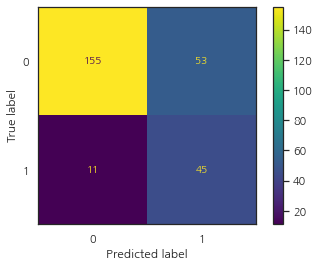

In [52]:
ConfusionMatrixDisplay.from_estimator(pipe_log_o,X_val,y_val)
plt.show()

In [53]:
tp = 14
tn = 200
fn = 42
fp = 8
total = tp+tn+fp+fn

In [54]:
# 1로 예측할 확률
y_train.value_counts(normalize=True)[1]

0.19146919431279621

### 1-2. Logistic Regression(null->most_frequent)  (AUC:0.75)

In [55]:
# logisticregression, ordinalencoder

pipe_log_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서ㅁ가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    LogisticRegression(class_weight="balanced",max_iter=1000))

pipe_log_o2.fit(X_train2, y_train2)
y_pred = pipe_log_o2.predict(X_val2)

print('훈련 정확도 :', pipe_log_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_log_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

훈련 정확도 : 0.7130295763389288
검증 정확도 : 0.7380191693290735
F1 score : 0.5684210526315789
AUC 점수 : 0.7540092658588738
REPORT               precision    recall  f1-score   support

           0       0.92      0.73      0.81       244
           1       0.45      0.78      0.57        69

    accuracy                           0.74       313
   macro avg       0.68      0.75      0.69       313
weighted avg       0.82      0.74      0.76       313



### 1-3. Logistic Regression Hyper Parameter Tuning (null->most_frequent) (AUC:0.73)

로지스틱회귀에는 실제로 조정할 중요한 파라미터가 없고, 때로는 다른 solver를 사용하여 성능이나 수렴에서 유용한 차이를 볼 수 있다.  
정규화(패널티)가 때때로 도움이 될 수 있다.  
cf. 모든 solver가 모든 정규화를 지원하지는 않음.  
C매개변수는 패널티강도를 제어하며 이또한 효과적일 수 있다.  
ex. C in [100, 10, 1.0, 0..1, 0.01]  

In [56]:
# logistic model hyper parameter tuning
model = LogisticRegression(max_iter=5000)
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1,  scoring='roc_auc',error_score=0)
grid_result = grid_search.fit(X_train_dumm, y_train_dumm)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.779987 using {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.771464 (0.058836) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.771493 (0.058826) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.771460 (0.059508) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.772290 (0.060100) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.772261 (0.060134) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.772291 (0.060217) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.776448 (0.058134) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.776391 (0.058141) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.774593 (0.056593) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.779987 (0.056937) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.779987 (0.056912) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.759334 (0.049596) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.763054 (0.065369) wit

In [57]:
# logistic model에 최적의 hyper parameter 적용

# 파라미터설명
# C = 정규화강도(값이 작을수록 더 강한 정규화 지정, penalty = 너무 많은 변수를 갖는 로지스틱모델에 벌점부과. 덜 기여하는 변수의 계수가 0으로 축소. 이것이 정규화임.
# solver = 최적화 문제에 사용할 알고리즘.클래스의 종류에따라 사용하는 알고리즘이 다름. max_iter = solver의 수렴하는데 최대 반복횟수)

log_reg_clf=LogisticRegression(C=0.1, penalty='l2',solver='newton-cg',class_weight='balanced', max_iter=1000)

log_reg_clf.fit(X_train_dumm, y_train_dumm)

y_pred = log_reg_clf.predict(X_val_dumm)

print('훈련 정확도 :', log_reg_clf.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', log_reg_clf.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm, y_pred))

훈련 정확도 : 0.7573459715639811
검증 정확도 : 0.75
F1 score : 0.5479452054794521
AUC 점수 : 0.7369505494505495
REPORT               precision    recall  f1-score   support

           0       0.91      0.76      0.83       208
           1       0.44      0.71      0.55        56

    accuracy                           0.75       264
   macro avg       0.68      0.74      0.69       264
weighted avg       0.81      0.75      0.77       264



### 1-4 Logistic Regression Hyper Parameter Tuning (null->most_frequent, category화한 data) (AUC:0.76)

In [58]:
# logistic model에 최적의 hyper parameter 적용

# 파라미터설명
# C = 정규화강도(값이 작을수록 더 강한 정규화 지정, penalty = 너무 많은 변수를 갖는 로지스틱모델에 벌점부과. 덜 기여하는 변수의 계수가 0으로 축소. 이것이 정규화임.
# solver = 최적화 문제에 사용할 알고리즘.클래스의 종류에따라 사용하는 알고리즘이 다름. max_iter = solver의 수렴하는데 최대 반복횟수)

log_reg_clf=LogisticRegression(C=0.1, penalty='l2',solver='newton-cg',class_weight='balanced', max_iter=1000)

log_reg_clf.fit(X_train_ff_encoded, y_train_ff_encoded)

y_pred = log_reg_clf.predict(X_val_ff_encoded)

print('훈련 정확도 :', log_reg_clf.score(X_train_ff_encoded,y_train_ff_encoded))
print('검증 정확도 :', log_reg_clf.score(X_val_ff_encoded, y_val_ff_encoded))
print('F1 score :', f1_score(y_val_ff_encoded, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_ff_encoded, y_pred))
print('REPORT',classification_report(y_val_ff_encoded, y_pred))

훈련 정확도 : 0.701039168665068
검증 정확도 : 0.7571884984025559
F1 score : 0.8288288288288288
AUC 점수 : 0.7611071513423615
REPORT               precision    recall  f1-score   support

           1       0.92      0.75      0.83       244
           2       0.47      0.77      0.58        69

    accuracy                           0.76       313
   macro avg       0.69      0.76      0.71       313
weighted avg       0.82      0.76      0.77       313



### 2-1. RandomForest  (AUC:0.70) 

In [59]:
#### randomforest_ordinal encoding

pipe_rf_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    RandomForestClassifier(random_state=2))

pipe_rf_o.fit(X_train, y_train)
y_pred = pipe_rf_o.predict(X_val)

print('훈련 정확도 :', pipe_rf_o.score(X_train,y_train))
print('검증 정확도 :', pipe_rf_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val,y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.875
F1 score : 0.5822784810126582
AUC 점수 : 0.7053571428571428
REPORT               precision    recall  f1-score   support

           0       0.86      1.00      0.93       208
           1       1.00      0.41      0.58        56

    accuracy                           0.88       264
   macro avg       0.93      0.71      0.75       264
weighted avg       0.89      0.88      0.85       264



### 2-2. RandomForest(null->most_frequent)  (AUC:0.74)

In [60]:
# randomforest_ordinal encoding

pipe_rf_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    RandomForestClassifier(random_state=2))

pipe_rf_o2.fit(X_train2, y_train2)
y_pred = pipe_rf_o2.predict(X_val2)

print('훈련 정확도 :', pipe_rf_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_rf_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2,y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8722044728434505
F1 score : 0.6363636363636365
AUC 점수 : 0.7413281064385839
REPORT               precision    recall  f1-score   support

           0       0.88      0.98      0.92       244
           1       0.85      0.51      0.64        69

    accuracy                           0.87       313
   macro avg       0.86      0.74      0.78       313
weighted avg       0.87      0.87      0.86       313



### 2-3. RandomForest Hyperparameter Tuning  (AUC:0.76)

In [61]:
###### pipe라인 랜덤포레스트 모델의 파라미터튜닝
pipe = make_pipeline(
      OrdinalEncoder(),
      RandomForestClassifier(random_state=2))

# 튜닝할 하이퍼파라미터의 범위를 지정
parameters = {'randomforestclassifier__max_depth': range(1, 5, 2), 
              'randomforestclassifier__max_features': range(1, 5, 2), 
              'randomforestclassifier__min_samples_leaf' : range(1, 5, 2)}
    
# 최적의 hyper parameter를 찾기 위한 RandomizedSearchCV
rf_classifier = RandomizedSearchCV(pipe, 
                                    param_distributions=parameters, #  param_distributions : 사전/사전목록
                                    n_iter=8, # 정수, 기본값=10인데, parameter만큼으로 8로함.
                                    cv=5, # 교차검증생성기 또는 반복가능 default=None
                                    scoring='roc_auc', # 평가방법
                                    verbose=1) # 진행상황표시. 높을수록 더 많은 메세지표시.
rf_classifier.fit(X_train, y_train);

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [62]:
# RandomSearchCV 결과 확인
print('Best Parameters :', rf_classifier.best_params_)
print('검증정확도 :', rf_classifier.best_score_)

Best Parameters : {'randomforestclassifier__min_samples_leaf': 3, 'randomforestclassifier__max_features': 1, 'randomforestclassifier__max_depth': 3}
검증정확도 : 0.7720971666373011


In [63]:
# randomforest_ordinal encoding

pipe_rf_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    RandomForestClassifier(random_state=2, min_samples_leaf=1, max_features=3, max_depth=3,class_weight="balanced"))

pipe_rf_o.fit(X_train, y_train)
y_pred = pipe_rf_o.predict(X_val)

print('훈련 정확도 :', pipe_rf_o.score(X_train,y_train))
print('검증 정확도 :', pipe_rf_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred,average='weighted'))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val,y_pred)) 

훈련 정확도 : 0.8132701421800947
검증 정확도 : 0.8068181818181818
F1 score : 0.8154318142078241
AUC 점수 : 0.7664835164835165
REPORT               precision    recall  f1-score   support

           0       0.91      0.84      0.87       208
           1       0.53      0.70      0.60        56

    accuracy                           0.81       264
   macro avg       0.72      0.77      0.74       264
weighted avg       0.83      0.81      0.82       264



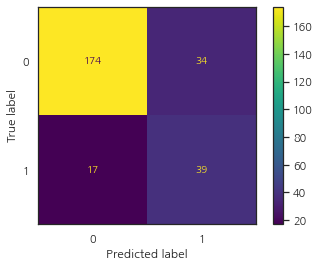

In [64]:
ConfusionMatrixDisplay.from_estimator(pipe_rf_o,X_val,y_val)
plt.show()

### 2-4. RandomForest Hyperparameter Tuning (null -> most_frequent)  (AUC:0.75)

In [65]:
###### pipe라인 랜덤포레스트 모델의 파라미터튜닝
pipe = make_pipeline(
      OrdinalEncoder(),
      SimpleImputer(strategy='most_frequent'),
      RandomForestClassifier(random_state=2))

# 튜닝할 하이퍼파라미터의 범위를 지정
parameters = {'randomforestclassifier__max_depth': range(1, 5, 2), 
              'randomforestclassifier__max_features': range(1, 5, 2), 
              'randomforestclassifier__min_samples_leaf' : range(1, 5, 2)}
    
# 최적의 hyper parameter를 찾기 위한 RandomizedSearchCV
rf_classifier = RandomizedSearchCV(pipe, 
                                    param_distributions=parameters, #  param_distributions : 사전/사전목록
                                    n_iter=8, # 정수, 기본값=10
                                    cv=5, # 교차검증생성기 또는 반복가능 default=None
                                    scoring='roc_auc', # 평가방법
                                    verbose=1) # 진행상황표시. 높을수록 더 많은 메세지표시.
rf_classifier.fit(X_train2, y_train2);

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [66]:
# RandomSearchCV 결과 확인
print('Best Parameters :', rf_classifier.best_params_)
print('검증정확도 :', rf_classifier.best_score_)

Best Parameters : {'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__max_features': 1, 'randomforestclassifier__max_depth': 3}
검증정확도 : 0.7670413999265978


In [67]:
# randomforest_ordinal encoding

pipe_rf_or = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),    
    RandomForestClassifier(random_state=2, min_samples_leaf=3, max_features=1, max_depth=3,class_weight='balanced'))

pipe_rf_or.fit(X_train2, y_train2)
y_pred = pipe_rf_or.predict(X_val2)

print('훈련 정확도 :', pipe_rf_or.score(X_train2,y_train2))
print('검증 정확도 :', pipe_rf_or.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2,y_pred))

훈련 정확도 : 0.7913669064748201
검증 정확도 : 0.7731629392971247
F1 score : 0.5798816568047337
AUC 점수 : 0.7505642670468045
REPORT               precision    recall  f1-score   support

           0       0.91      0.79      0.84       244
           1       0.49      0.71      0.58        69

    accuracy                           0.77       313
   macro avg       0.70      0.75      0.71       313
weighted avg       0.81      0.77      0.79       313



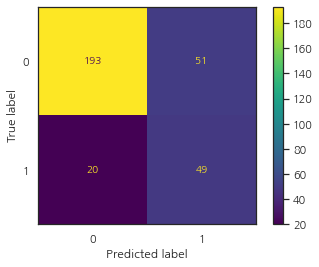

In [68]:
ConfusionMatrixDisplay.from_estimator(pipe_rf_or,X_val2,y_val2)
plt.show()

### 3-1. XGBoost  (AUC:0.73)

In [69]:
# from xgboost import XGBClassifier,XGBRegressor

pipe_xgb_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    XGBClassifier())

pipe_xgb_o.fit(X_train, y_train)
y_pred = pipe_xgb_o.predict(X_val)

print('훈련 정확도 :', pipe_xgb_o.score(X_train,y_train))
print('검증 정확도 :', pipe_xgb_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8712121212121212
F1 score : 0.6136363636363635
AUC 점수 : 0.7290521978021979
REPORT               precision    recall  f1-score   support

           0       0.88      0.98      0.92       208
           1       0.84      0.48      0.61        56

    accuracy                           0.87       264
   macro avg       0.86      0.73      0.77       264
weighted avg       0.87      0.87      0.86       264



### 3-2. XGBoost (null->most_frequent)  (AUC:0.76)

In [70]:
# from xgboost import XGBClassifier,XGBRegressor

pipe_xgb_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    XGBClassifier())

pipe_xgb_o2.fit(X_train2, y_train2)
y_pred = pipe_xgb_o2.predict(X_val2)

print('훈련 정확도 :', pipe_xgb_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_xgb_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8690095846645367
F1 score : 0.6611570247933884
AUC 점수 : 0.7652649085293418
REPORT               precision    recall  f1-score   support

           0       0.89      0.95      0.92       244
           1       0.77      0.58      0.66        69

    accuracy                           0.87       313
   macro avg       0.83      0.77      0.79       313
weighted avg       0.86      0.87      0.86       313



In [71]:
data['ProdTaken'].value_counts(normalize=True)

0    0.79624
1    0.20376
Name: ProdTaken, dtype: float64

In [72]:
ratio0 = data['ProdTaken'].value_counts(normalize=True)[0]
ratio1 = data['ProdTaken'].value_counts(normalize=True)[1]
ratio = ratio1/ratio0
ratio

0.2559025133282559

### 3-3. XGBoost Hyperparameter (null -> most_frequent) Tuning (AUC : 0.82)

In [73]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

In [74]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.->이 코딩과 무관하게 정확도 등 값은 동일하게 나옴.
xgb_tuned.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

y_pred = xgb_tuned.predict(X_val_dumm)

print('훈련 정확도 :', xgb_tuned.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', xgb_tuned.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm,y_pred)) 

훈련 정확도 : 0.8947867298578199
검증 정확도 : 0.8409090909090909
F1 score : 0.6818181818181818
AUC 점수 : 0.8272664835164836
REPORT               precision    recall  f1-score   support

           0       0.94      0.85      0.89       208
           1       0.59      0.80      0.68        56

    accuracy                           0.84       264
   macro avg       0.77      0.83      0.79       264
weighted avg       0.87      0.84      0.85       264



### 4-1. CatBoost  (AUC:0.72)

In [75]:
# catboost, ordinalencoder

pipe_cat_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    CatBoostClassifier(random_state=2))

pipe_cat_o.fit(X_train, y_train)
y_pred = pipe_cat_o.predict(X_val)

print('훈련 정확도 :', pipe_cat_o.score(X_train,y_train))
print('검증 정확도 :', pipe_cat_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

Learning rate set to 0.010541
0:	learn: 0.6857798	total: 55.4ms	remaining: 55.4s
1:	learn: 0.6790338	total: 55.9ms	remaining: 27.9s
2:	learn: 0.6728495	total: 56.7ms	remaining: 18.8s
3:	learn: 0.6673274	total: 57.2ms	remaining: 14.2s
4:	learn: 0.6606272	total: 57.8ms	remaining: 11.5s
5:	learn: 0.6547882	total: 58.3ms	remaining: 9.66s
6:	learn: 0.6499675	total: 58.9ms	remaining: 8.35s
7:	learn: 0.6447577	total: 59.4ms	remaining: 7.37s
8:	learn: 0.6386471	total: 59.9ms	remaining: 6.59s
9:	learn: 0.6339297	total: 60.2ms	remaining: 5.96s
10:	learn: 0.6271441	total: 60.6ms	remaining: 5.45s
11:	learn: 0.6223076	total: 61.2ms	remaining: 5.04s
12:	learn: 0.6158461	total: 61.7ms	remaining: 4.68s
13:	learn: 0.6102293	total: 62.2ms	remaining: 4.38s
14:	learn: 0.6056611	total: 62.6ms	remaining: 4.11s
15:	learn: 0.6001716	total: 63.1ms	remaining: 3.88s
16:	learn: 0.5949320	total: 63.6ms	remaining: 3.68s
17:	learn: 0.5895819	total: 64.1ms	remaining: 3.5s
18:	learn: 0.5855781	total: 64.6ms	remaining:

216:	learn: 0.3108701	total: 180ms	remaining: 650ms
217:	learn: 0.3103896	total: 181ms	remaining: 650ms
218:	learn: 0.3097134	total: 182ms	remaining: 649ms
219:	learn: 0.3088867	total: 183ms	remaining: 648ms
220:	learn: 0.3082446	total: 183ms	remaining: 646ms
221:	learn: 0.3079563	total: 184ms	remaining: 645ms
222:	learn: 0.3075082	total: 185ms	remaining: 643ms
223:	learn: 0.3071785	total: 185ms	remaining: 642ms
224:	learn: 0.3066467	total: 186ms	remaining: 641ms
225:	learn: 0.3060966	total: 187ms	remaining: 640ms
226:	learn: 0.3053326	total: 188ms	remaining: 639ms
227:	learn: 0.3046844	total: 188ms	remaining: 637ms
228:	learn: 0.3043976	total: 189ms	remaining: 635ms
229:	learn: 0.3039680	total: 189ms	remaining: 634ms
230:	learn: 0.3035882	total: 190ms	remaining: 632ms
231:	learn: 0.3030485	total: 190ms	remaining: 630ms
232:	learn: 0.3024816	total: 191ms	remaining: 628ms
233:	learn: 0.3020343	total: 191ms	remaining: 626ms
234:	learn: 0.3017741	total: 192ms	remaining: 625ms
235:	learn: 

408:	learn: 0.2464163	total: 290ms	remaining: 419ms
409:	learn: 0.2461601	total: 291ms	remaining: 419ms
410:	learn: 0.2457708	total: 292ms	remaining: 418ms
411:	learn: 0.2454708	total: 292ms	remaining: 417ms
412:	learn: 0.2452640	total: 293ms	remaining: 416ms
413:	learn: 0.2450488	total: 293ms	remaining: 415ms
414:	learn: 0.2447465	total: 294ms	remaining: 414ms
415:	learn: 0.2445591	total: 295ms	remaining: 414ms
416:	learn: 0.2441207	total: 295ms	remaining: 413ms
417:	learn: 0.2438688	total: 296ms	remaining: 412ms
418:	learn: 0.2435236	total: 296ms	remaining: 411ms
419:	learn: 0.2433061	total: 297ms	remaining: 410ms
420:	learn: 0.2432054	total: 298ms	remaining: 409ms
421:	learn: 0.2427413	total: 298ms	remaining: 408ms
422:	learn: 0.2426279	total: 299ms	remaining: 408ms
423:	learn: 0.2422416	total: 299ms	remaining: 407ms
424:	learn: 0.2420182	total: 300ms	remaining: 406ms
425:	learn: 0.2417256	total: 301ms	remaining: 405ms
426:	learn: 0.2414698	total: 301ms	remaining: 404ms
427:	learn: 

714:	learn: 0.1818574	total: 468ms	remaining: 187ms
715:	learn: 0.1817499	total: 469ms	remaining: 186ms
716:	learn: 0.1816735	total: 470ms	remaining: 186ms
717:	learn: 0.1814075	total: 471ms	remaining: 185ms
718:	learn: 0.1811794	total: 472ms	remaining: 184ms
719:	learn: 0.1811083	total: 473ms	remaining: 184ms
720:	learn: 0.1809505	total: 473ms	remaining: 183ms
721:	learn: 0.1808204	total: 474ms	remaining: 183ms
722:	learn: 0.1807769	total: 475ms	remaining: 182ms
723:	learn: 0.1807168	total: 476ms	remaining: 181ms
724:	learn: 0.1804783	total: 476ms	remaining: 181ms
725:	learn: 0.1804317	total: 477ms	remaining: 180ms
726:	learn: 0.1803065	total: 478ms	remaining: 179ms
727:	learn: 0.1801879	total: 478ms	remaining: 179ms
728:	learn: 0.1799383	total: 479ms	remaining: 178ms
729:	learn: 0.1797246	total: 480ms	remaining: 177ms
730:	learn: 0.1795161	total: 481ms	remaining: 177ms
731:	learn: 0.1793474	total: 481ms	remaining: 176ms
732:	learn: 0.1792351	total: 482ms	remaining: 176ms
733:	learn: 

훈련 정확도 : 0.9677725118483412
검증 정확도 : 0.8787878787878788
F1 score : 0.6097560975609756
AUC 점수 : 0.7208104395604396
REPORT               precision    recall  f1-score   support

           0       0.87      1.00      0.93       208
           1       0.96      0.45      0.61        56

    accuracy                           0.88       264
   macro avg       0.92      0.72      0.77       264
weighted avg       0.89      0.88      0.86       264



### 4-2. CatBoost (null->most_frequent)  (AUC:0.73)

In [76]:
# catboost, ordinalencoder

pipe_cat_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    CatBoostClassifier(random_state=2))

pipe_cat_o2.fit(X_train2, y_train2)
y_pred = pipe_cat_o2.predict(X_val2)

print('훈련 정확도 :', pipe_cat_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_cat_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

Learning rate set to 0.011336
0:	learn: 0.6862283	total: 1.15ms	remaining: 1.15s
1:	learn: 0.6781792	total: 2.19ms	remaining: 1.09s
2:	learn: 0.6706818	total: 2.99ms	remaining: 995ms
3:	learn: 0.6626050	total: 3.71ms	remaining: 923ms
4:	learn: 0.6554906	total: 4.41ms	remaining: 877ms
5:	learn: 0.6491532	total: 5.16ms	remaining: 854ms
6:	learn: 0.6430771	total: 5.87ms	remaining: 833ms
7:	learn: 0.6371943	total: 6.4ms	remaining: 794ms
8:	learn: 0.6305371	total: 7.17ms	remaining: 790ms
9:	learn: 0.6243917	total: 8.02ms	remaining: 794ms
10:	learn: 0.6187905	total: 9.03ms	remaining: 812ms
11:	learn: 0.6126062	total: 9.86ms	remaining: 812ms
12:	learn: 0.6069841	total: 11ms	remaining: 836ms
13:	learn: 0.6009946	total: 12ms	remaining: 847ms
14:	learn: 0.5962629	total: 12.9ms	remaining: 847ms
15:	learn: 0.5919106	total: 13.8ms	remaining: 848ms
16:	learn: 0.5868436	total: 14.9ms	remaining: 859ms
17:	learn: 0.5810364	total: 15.7ms	remaining: 859ms
18:	learn: 0.5756354	total: 16.7ms	remaining: 862

172:	learn: 0.3400111	total: 141ms	remaining: 673ms
173:	learn: 0.3393621	total: 142ms	remaining: 673ms
174:	learn: 0.3388654	total: 143ms	remaining: 672ms
175:	learn: 0.3380762	total: 143ms	remaining: 672ms
176:	learn: 0.3375331	total: 145ms	remaining: 672ms
177:	learn: 0.3369411	total: 146ms	remaining: 672ms
178:	learn: 0.3361387	total: 147ms	remaining: 672ms
179:	learn: 0.3354390	total: 147ms	remaining: 671ms
180:	learn: 0.3349605	total: 148ms	remaining: 671ms
181:	learn: 0.3348143	total: 149ms	remaining: 668ms
182:	learn: 0.3347571	total: 149ms	remaining: 665ms
183:	learn: 0.3341334	total: 150ms	remaining: 664ms
184:	learn: 0.3334631	total: 151ms	remaining: 663ms
185:	learn: 0.3330290	total: 151ms	remaining: 662ms
186:	learn: 0.3324075	total: 152ms	remaining: 661ms
187:	learn: 0.3322315	total: 153ms	remaining: 661ms
188:	learn: 0.3317836	total: 154ms	remaining: 660ms
189:	learn: 0.3310170	total: 155ms	remaining: 660ms
190:	learn: 0.3306068	total: 156ms	remaining: 660ms
191:	learn: 

373:	learn: 0.2639376	total: 324ms	remaining: 542ms
374:	learn: 0.2637420	total: 325ms	remaining: 541ms
375:	learn: 0.2632290	total: 326ms	remaining: 540ms
376:	learn: 0.2629374	total: 326ms	remaining: 539ms
377:	learn: 0.2627881	total: 327ms	remaining: 539ms
378:	learn: 0.2625861	total: 328ms	remaining: 538ms
379:	learn: 0.2622691	total: 329ms	remaining: 537ms
380:	learn: 0.2618952	total: 330ms	remaining: 536ms
381:	learn: 0.2615242	total: 330ms	remaining: 535ms
382:	learn: 0.2613233	total: 331ms	remaining: 534ms
383:	learn: 0.2611899	total: 332ms	remaining: 533ms
384:	learn: 0.2609226	total: 333ms	remaining: 533ms
385:	learn: 0.2606550	total: 334ms	remaining: 532ms
386:	learn: 0.2603984	total: 336ms	remaining: 532ms
387:	learn: 0.2601893	total: 337ms	remaining: 531ms
388:	learn: 0.2599990	total: 337ms	remaining: 530ms
389:	learn: 0.2597411	total: 338ms	remaining: 529ms
390:	learn: 0.2595839	total: 339ms	remaining: 528ms
391:	learn: 0.2593285	total: 340ms	remaining: 527ms
392:	learn: 

548:	learn: 0.2219272	total: 506ms	remaining: 415ms
549:	learn: 0.2217275	total: 507ms	remaining: 415ms
550:	learn: 0.2214490	total: 508ms	remaining: 414ms
551:	learn: 0.2212038	total: 509ms	remaining: 413ms
552:	learn: 0.2209820	total: 510ms	remaining: 412ms
553:	learn: 0.2205347	total: 511ms	remaining: 412ms
554:	learn: 0.2203869	total: 512ms	remaining: 411ms
555:	learn: 0.2202333	total: 513ms	remaining: 410ms
556:	learn: 0.2200987	total: 514ms	remaining: 409ms
557:	learn: 0.2198808	total: 515ms	remaining: 408ms
558:	learn: 0.2195213	total: 516ms	remaining: 407ms
559:	learn: 0.2192491	total: 517ms	remaining: 406ms
560:	learn: 0.2189160	total: 518ms	remaining: 406ms
561:	learn: 0.2187054	total: 519ms	remaining: 405ms
562:	learn: 0.2185629	total: 521ms	remaining: 404ms
563:	learn: 0.2182671	total: 522ms	remaining: 403ms
564:	learn: 0.2180363	total: 523ms	remaining: 403ms
565:	learn: 0.2177384	total: 524ms	remaining: 402ms
566:	learn: 0.2173325	total: 525ms	remaining: 401ms
567:	learn: 

729:	learn: 0.1846999	total: 688ms	remaining: 254ms
730:	learn: 0.1844785	total: 689ms	remaining: 254ms
731:	learn: 0.1843223	total: 690ms	remaining: 253ms
732:	learn: 0.1841214	total: 691ms	remaining: 252ms
733:	learn: 0.1839401	total: 691ms	remaining: 251ms
734:	learn: 0.1838358	total: 692ms	remaining: 250ms
735:	learn: 0.1836805	total: 693ms	remaining: 249ms
736:	learn: 0.1834668	total: 694ms	remaining: 248ms
737:	learn: 0.1833554	total: 695ms	remaining: 247ms
738:	learn: 0.1830395	total: 696ms	remaining: 246ms
739:	learn: 0.1828491	total: 697ms	remaining: 245ms
740:	learn: 0.1826154	total: 697ms	remaining: 244ms
741:	learn: 0.1823864	total: 698ms	remaining: 243ms
742:	learn: 0.1822658	total: 699ms	remaining: 242ms
743:	learn: 0.1821631	total: 700ms	remaining: 241ms
744:	learn: 0.1819870	total: 701ms	remaining: 240ms
745:	learn: 0.1817930	total: 702ms	remaining: 239ms
746:	learn: 0.1815220	total: 703ms	remaining: 238ms
747:	learn: 0.1812243	total: 703ms	remaining: 237ms
748:	learn: 

930:	learn: 0.1514197	total: 871ms	remaining: 64.6ms
931:	learn: 0.1512914	total: 873ms	remaining: 63.7ms
932:	learn: 0.1511679	total: 874ms	remaining: 62.7ms
933:	learn: 0.1510425	total: 875ms	remaining: 61.8ms
934:	learn: 0.1508577	total: 876ms	remaining: 60.9ms
935:	learn: 0.1507804	total: 877ms	remaining: 60ms
936:	learn: 0.1506641	total: 878ms	remaining: 59ms
937:	learn: 0.1504827	total: 879ms	remaining: 58.1ms
938:	learn: 0.1503707	total: 880ms	remaining: 57.2ms
939:	learn: 0.1501781	total: 881ms	remaining: 56.2ms
940:	learn: 0.1500189	total: 882ms	remaining: 55.3ms
941:	learn: 0.1498589	total: 882ms	remaining: 54.3ms
942:	learn: 0.1496984	total: 883ms	remaining: 53.4ms
943:	learn: 0.1495885	total: 885ms	remaining: 52.5ms
944:	learn: 0.1494361	total: 886ms	remaining: 51.6ms
945:	learn: 0.1493169	total: 887ms	remaining: 50.6ms
946:	learn: 0.1491640	total: 888ms	remaining: 49.7ms
947:	learn: 0.1489788	total: 889ms	remaining: 48.8ms
948:	learn: 0.1488402	total: 890ms	remaining: 47.8

### 4-3. CatBoost Hyper Parameter (null->most_frequent)  (AUC:0.67)

In [77]:
cbc=CatBoostClassifier(random_state=2)

grid = {'depth': [4,5,6,7,8,9, 10],
        'learning_rate' : [0.01,0.02,0.03,0.04],
        'iterations'    : [10, 20,30,40,50,60,70,80,90, 100]}

gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring ='roc_auc', cv = 5)

gscv.fit(X_train_dumm,y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

print(gscv.best_estimator_)
print(gscv.best_score_)
print(gscv.best_params_)



0:	learn: 0.6905347	total: 1.12ms	remaining: 10.1ms
1:	learn: 0.6887682	total: 2.44ms	remaining: 9.77ms
2:	learn: 0.6864353	total: 2.96ms	remaining: 6.91ms
3:	learn: 0.6843950	total: 3.71ms	remaining: 5.56ms
4:	learn: 0.6829401	total: 4.53ms	remaining: 4.53ms
5:	learn: 0.6809285	total: 5ms	remaining: 3.33ms
6:	learn: 0.6789119	total: 5.65ms	remaining: 2.42ms
7:	learn: 0.6770541	total: 6.29ms	remaining: 1.57ms
8:	learn: 0.6748544	total: 6.82ms	remaining: 757us
9:	learn: 0.6718537	total: 7.3ms	remaining: 0us
0:	learn: 0.6902819	total: 662us	remaining: 5.96ms
1:	learn: 0.6880097	total: 1.33ms	remaining: 5.31ms
2:	learn: 0.6855977	total: 2.04ms	remaining: 4.77ms
3:	learn: 0.6840293	total: 2.73ms	remaining: 4.09ms
4:	learn: 0.6820431	total: 3.22ms	remaining: 3.22ms
5:	learn: 0.6798705	total: 4.06ms	remaining: 2.71ms
6:	learn: 0.6774271	total: 4.6ms	remaining: 1.97ms
7:	learn: 0.6749609	total: 5.1ms	remaining: 1.27ms
8:	learn: 0.6727812	total: 5.66ms	remaining: 629us
9:	learn: 0.6708366	tota

0:	learn: 0.6819121	total: 974us	remaining: 8.77ms
1:	learn: 0.6734286	total: 2.45ms	remaining: 9.79ms
2:	learn: 0.6648261	total: 3.17ms	remaining: 7.41ms
3:	learn: 0.6567468	total: 4.03ms	remaining: 6.05ms
4:	learn: 0.6503099	total: 4.78ms	remaining: 4.78ms
5:	learn: 0.6434026	total: 5.63ms	remaining: 3.75ms
6:	learn: 0.6362322	total: 6.59ms	remaining: 2.82ms
7:	learn: 0.6289379	total: 7.85ms	remaining: 1.96ms
8:	learn: 0.6239214	total: 8.81ms	remaining: 979us
9:	learn: 0.6166798	total: 10.7ms	remaining: 0us
0:	learn: 0.6827924	total: 873us	remaining: 7.86ms
1:	learn: 0.6746736	total: 2.04ms	remaining: 8.15ms
2:	learn: 0.6666190	total: 2.82ms	remaining: 6.58ms
3:	learn: 0.6612200	total: 3.83ms	remaining: 5.75ms
4:	learn: 0.6568818	total: 4.87ms	remaining: 4.87ms
5:	learn: 0.6499515	total: 5.87ms	remaining: 3.92ms
6:	learn: 0.6413189	total: 6.72ms	remaining: 2.88ms
7:	learn: 0.6346541	total: 7.36ms	remaining: 1.84ms
8:	learn: 0.6293401	total: 7.96ms	remaining: 884us
9:	learn: 0.6222175

15:	learn: 0.6281094	total: 7.43ms	remaining: 1.86ms
16:	learn: 0.6251367	total: 8.53ms	remaining: 1.5ms
17:	learn: 0.6218493	total: 9.2ms	remaining: 1.02ms
18:	learn: 0.6189701	total: 9.76ms	remaining: 513us
19:	learn: 0.6164617	total: 10.3ms	remaining: 0us
0:	learn: 0.6879021	total: 659us	remaining: 12.5ms
1:	learn: 0.6836518	total: 1.48ms	remaining: 13.3ms
2:	learn: 0.6793048	total: 2.28ms	remaining: 12.9ms
3:	learn: 0.6762661	total: 2.88ms	remaining: 11.5ms
4:	learn: 0.6736955	total: 3.44ms	remaining: 10.3ms
5:	learn: 0.6696543	total: 4ms	remaining: 9.34ms
6:	learn: 0.6646009	total: 4.77ms	remaining: 8.86ms
7:	learn: 0.6605298	total: 5.54ms	remaining: 8.32ms
8:	learn: 0.6571029	total: 6.85ms	remaining: 8.37ms
9:	learn: 0.6525591	total: 8.1ms	remaining: 8.1ms
10:	learn: 0.6499546	total: 8.72ms	remaining: 7.13ms
11:	learn: 0.6464986	total: 9.26ms	remaining: 6.17ms
12:	learn: 0.6432993	total: 9.77ms	remaining: 5.26ms
13:	learn: 0.6391523	total: 10.4ms	remaining: 4.46ms
14:	learn: 0.63

0:	learn: 0.6829023	total: 518us	remaining: 9.86ms
1:	learn: 0.6763595	total: 1.17ms	remaining: 10.5ms
2:	learn: 0.6678791	total: 1.57ms	remaining: 8.91ms
3:	learn: 0.6608059	total: 1.99ms	remaining: 7.95ms
4:	learn: 0.6562009	total: 2.4ms	remaining: 7.2ms
5:	learn: 0.6488247	total: 2.81ms	remaining: 6.55ms
6:	learn: 0.6426999	total: 3.24ms	remaining: 6.01ms
7:	learn: 0.6363722	total: 3.7ms	remaining: 5.55ms
8:	learn: 0.6303715	total: 4.29ms	remaining: 5.24ms
9:	learn: 0.6226498	total: 4.73ms	remaining: 4.73ms
10:	learn: 0.6186599	total: 5.27ms	remaining: 4.31ms
11:	learn: 0.6146632	total: 5.84ms	remaining: 3.89ms
12:	learn: 0.6106197	total: 6.45ms	remaining: 3.48ms
13:	learn: 0.6044947	total: 6.92ms	remaining: 2.97ms
14:	learn: 0.5995392	total: 7.36ms	remaining: 2.45ms
15:	learn: 0.5944608	total: 7.81ms	remaining: 1.95ms
16:	learn: 0.5908659	total: 8.29ms	remaining: 1.46ms
17:	learn: 0.5876473	total: 8.74ms	remaining: 971us
18:	learn: 0.5838935	total: 9.18ms	remaining: 482us
19:	learn

16:	learn: 0.6622156	total: 7.8ms	remaining: 5.96ms
17:	learn: 0.6602360	total: 8.46ms	remaining: 5.64ms
18:	learn: 0.6586115	total: 8.96ms	remaining: 5.19ms
19:	learn: 0.6570232	total: 9.46ms	remaining: 4.73ms
20:	learn: 0.6553636	total: 10ms	remaining: 4.29ms
21:	learn: 0.6550257	total: 10.3ms	remaining: 3.74ms
22:	learn: 0.6535081	total: 11ms	remaining: 3.33ms
23:	learn: 0.6523302	total: 11.5ms	remaining: 2.88ms
24:	learn: 0.6507947	total: 12.2ms	remaining: 2.43ms
25:	learn: 0.6492147	total: 12.6ms	remaining: 1.94ms
26:	learn: 0.6480739	total: 13.1ms	remaining: 1.46ms
27:	learn: 0.6467879	total: 13.7ms	remaining: 981us
28:	learn: 0.6460702	total: 14.2ms	remaining: 490us
29:	learn: 0.6449754	total: 14.7ms	remaining: 0us
0:	learn: 0.6906923	total: 761us	remaining: 22.1ms
1:	learn: 0.6891871	total: 1.21ms	remaining: 17ms
2:	learn: 0.6873828	total: 1.67ms	remaining: 15.1ms
3:	learn: 0.6851986	total: 2.13ms	remaining: 13.9ms
4:	learn: 0.6839373	total: 3.09ms	remaining: 15.5ms
5:	learn: 0

6:	learn: 0.6678014	total: 4.96ms	remaining: 16.3ms
7:	learn: 0.6639474	total: 5.58ms	remaining: 15.4ms
8:	learn: 0.6609074	total: 6.11ms	remaining: 14.3ms
9:	learn: 0.6569902	total: 6.61ms	remaining: 13.2ms
10:	learn: 0.6540722	total: 7.18ms	remaining: 12.4ms
11:	learn: 0.6516107	total: 7.9ms	remaining: 11.8ms
12:	learn: 0.6489893	total: 8.49ms	remaining: 11.1ms
13:	learn: 0.6452073	total: 9.04ms	remaining: 10.3ms
14:	learn: 0.6419315	total: 9.6ms	remaining: 9.6ms
15:	learn: 0.6386940	total: 10.1ms	remaining: 8.84ms
16:	learn: 0.6364608	total: 10.5ms	remaining: 8.06ms
17:	learn: 0.6342282	total: 11.2ms	remaining: 7.44ms
18:	learn: 0.6317200	total: 11.6ms	remaining: 6.71ms
19:	learn: 0.6285106	total: 12ms	remaining: 5.98ms
20:	learn: 0.6254109	total: 12.4ms	remaining: 5.29ms
21:	learn: 0.6234819	total: 12.8ms	remaining: 4.64ms
22:	learn: 0.6211946	total: 13.2ms	remaining: 4ms
23:	learn: 0.6193152	total: 13.6ms	remaining: 3.4ms
24:	learn: 0.6180893	total: 14ms	remaining: 2.81ms
25:	lear

10:	learn: 0.6186599	total: 4.87ms	remaining: 8.41ms
11:	learn: 0.6146632	total: 5.78ms	remaining: 8.67ms
12:	learn: 0.6106197	total: 6.36ms	remaining: 8.32ms
13:	learn: 0.6044947	total: 7.08ms	remaining: 8.09ms
14:	learn: 0.5995392	total: 7.56ms	remaining: 7.56ms
15:	learn: 0.5944608	total: 8.02ms	remaining: 7.02ms
16:	learn: 0.5908659	total: 8.55ms	remaining: 6.54ms
17:	learn: 0.5876473	total: 9.01ms	remaining: 6.01ms
18:	learn: 0.5838935	total: 9.46ms	remaining: 5.48ms
19:	learn: 0.5809447	total: 9.89ms	remaining: 4.94ms
20:	learn: 0.5757587	total: 10.3ms	remaining: 4.41ms
21:	learn: 0.5726741	total: 10.7ms	remaining: 3.89ms
22:	learn: 0.5709322	total: 11.1ms	remaining: 3.39ms
23:	learn: 0.5676266	total: 11.5ms	remaining: 2.88ms
24:	learn: 0.5641423	total: 12ms	remaining: 2.39ms
25:	learn: 0.5625774	total: 12.4ms	remaining: 1.91ms
26:	learn: 0.5592944	total: 12.8ms	remaining: 1.42ms
27:	learn: 0.5571046	total: 13.2ms	remaining: 945us
28:	learn: 0.5551341	total: 13.6ms	remaining: 470

7:	learn: 0.6749609	total: 4.55ms	remaining: 18.2ms
8:	learn: 0.6727812	total: 5.31ms	remaining: 18.3ms
9:	learn: 0.6708366	total: 5.91ms	remaining: 17.7ms
10:	learn: 0.6679383	total: 6.35ms	remaining: 16.8ms
11:	learn: 0.6661731	total: 6.83ms	remaining: 15.9ms
12:	learn: 0.6644786	total: 7.27ms	remaining: 15.1ms
13:	learn: 0.6623818	total: 7.68ms	remaining: 14.3ms
14:	learn: 0.6600188	total: 8.07ms	remaining: 13.5ms
15:	learn: 0.6581906	total: 8.52ms	remaining: 12.8ms
16:	learn: 0.6567697	total: 8.93ms	remaining: 12.1ms
17:	learn: 0.6544902	total: 9.49ms	remaining: 11.6ms
18:	learn: 0.6524892	total: 10.1ms	remaining: 11.2ms
19:	learn: 0.6505861	total: 10.7ms	remaining: 10.7ms
20:	learn: 0.6489707	total: 11.2ms	remaining: 10.2ms
21:	learn: 0.6466648	total: 11.8ms	remaining: 9.67ms
22:	learn: 0.6448142	total: 12.4ms	remaining: 9.17ms
23:	learn: 0.6428001	total: 13ms	remaining: 8.66ms
24:	learn: 0.6414788	total: 13.5ms	remaining: 8.09ms
25:	learn: 0.6393143	total: 14ms	remaining: 7.53ms


12:	learn: 0.6444511	total: 7.61ms	remaining: 15.8ms
13:	learn: 0.6403340	total: 8.4ms	remaining: 15.6ms
14:	learn: 0.6367261	total: 8.93ms	remaining: 14.9ms
15:	learn: 0.6330946	total: 9.5ms	remaining: 14.3ms
16:	learn: 0.6303037	total: 10ms	remaining: 13.6ms
17:	learn: 0.6278334	total: 10.5ms	remaining: 12.8ms
18:	learn: 0.6247211	total: 10.9ms	remaining: 12.1ms
19:	learn: 0.6216368	total: 11.4ms	remaining: 11.4ms
20:	learn: 0.6184342	total: 11.9ms	remaining: 10.8ms
21:	learn: 0.6152894	total: 12.4ms	remaining: 10.2ms
22:	learn: 0.6128488	total: 13.1ms	remaining: 9.68ms
23:	learn: 0.6119793	total: 13.7ms	remaining: 9.11ms
24:	learn: 0.6094145	total: 14.1ms	remaining: 8.45ms
25:	learn: 0.6079227	total: 14.5ms	remaining: 7.82ms
26:	learn: 0.6062265	total: 15ms	remaining: 7.21ms
27:	learn: 0.6047663	total: 15.5ms	remaining: 6.64ms
28:	learn: 0.6026517	total: 16ms	remaining: 6.07ms
29:	learn: 0.6001616	total: 16.5ms	remaining: 5.49ms
30:	learn: 0.5971104	total: 17ms	remaining: 4.93ms
31:

0:	learn: 0.6846655	total: 579us	remaining: 22.6ms
1:	learn: 0.6781529	total: 1.47ms	remaining: 27.9ms
2:	learn: 0.6714474	total: 2.18ms	remaining: 26.9ms
3:	learn: 0.6648757	total: 3.03ms	remaining: 27.3ms
4:	learn: 0.6597102	total: 3.86ms	remaining: 27ms
5:	learn: 0.6541416	total: 4.54ms	remaining: 25.7ms
6:	learn: 0.6481915	total: 5.22ms	remaining: 24.6ms
7:	learn: 0.6420752	total: 5.8ms	remaining: 23.2ms
8:	learn: 0.6377768	total: 6.46ms	remaining: 22.2ms
9:	learn: 0.6303035	total: 6.98ms	remaining: 20.9ms
10:	learn: 0.6260510	total: 7.51ms	remaining: 19.8ms
11:	learn: 0.6217311	total: 7.96ms	remaining: 18.6ms
12:	learn: 0.6186046	total: 8.47ms	remaining: 17.6ms
13:	learn: 0.6144405	total: 9.02ms	remaining: 16.7ms
14:	learn: 0.6095678	total: 9.49ms	remaining: 15.8ms
15:	learn: 0.6068428	total: 10.1ms	remaining: 15.1ms
16:	learn: 0.6033755	total: 10.6ms	remaining: 14.3ms
17:	learn: 0.6007097	total: 11.2ms	remaining: 13.7ms
18:	learn: 0.5969215	total: 11.9ms	remaining: 13.1ms
19:	lea

0:	learn: 0.6827924	total: 499us	remaining: 19.5ms
1:	learn: 0.6746736	total: 1.16ms	remaining: 22ms
2:	learn: 0.6666190	total: 1.71ms	remaining: 21.1ms
3:	learn: 0.6612200	total: 2.17ms	remaining: 19.6ms
4:	learn: 0.6568818	total: 2.66ms	remaining: 18.6ms
5:	learn: 0.6499515	total: 3.22ms	remaining: 18.3ms
6:	learn: 0.6413189	total: 3.71ms	remaining: 17.5ms
7:	learn: 0.6346541	total: 4.17ms	remaining: 16.7ms
8:	learn: 0.6293401	total: 4.89ms	remaining: 16.8ms
9:	learn: 0.6222175	total: 5.52ms	remaining: 16.6ms
10:	learn: 0.6171846	total: 6ms	remaining: 15.8ms
11:	learn: 0.6119994	total: 6.46ms	remaining: 15.1ms
12:	learn: 0.6064521	total: 6.93ms	remaining: 14.4ms
13:	learn: 0.6024029	total: 7.4ms	remaining: 13.7ms
14:	learn: 0.5976015	total: 7.86ms	remaining: 13.1ms
15:	learn: 0.5934184	total: 8.34ms	remaining: 12.5ms
16:	learn: 0.5897529	total: 8.82ms	remaining: 11.9ms
17:	learn: 0.5869264	total: 9.31ms	remaining: 11.4ms
18:	learn: 0.5829918	total: 9.99ms	remaining: 11ms
19:	learn: 0

44:	learn: 0.6116095	total: 21.1ms	remaining: 2.34ms
45:	learn: 0.6103809	total: 21.7ms	remaining: 1.89ms
46:	learn: 0.6086664	total: 22.2ms	remaining: 1.42ms
47:	learn: 0.6070281	total: 23.1ms	remaining: 960us
48:	learn: 0.6056695	total: 23.6ms	remaining: 482us
49:	learn: 0.6045322	total: 24.3ms	remaining: 0us
0:	learn: 0.6905077	total: 562us	remaining: 27.5ms
1:	learn: 0.6883342	total: 1.03ms	remaining: 24.7ms
2:	learn: 0.6860759	total: 1.51ms	remaining: 23.7ms
3:	learn: 0.6844656	total: 2.06ms	remaining: 23.7ms
4:	learn: 0.6830671	total: 2.51ms	remaining: 22.6ms
5:	learn: 0.6808830	total: 3.12ms	remaining: 22.9ms
6:	learn: 0.6781440	total: 3.74ms	remaining: 23ms
7:	learn: 0.6758720	total: 4.19ms	remaining: 22ms
8:	learn: 0.6739132	total: 4.63ms	remaining: 21.1ms
9:	learn: 0.6715144	total: 5.02ms	remaining: 20.1ms
10:	learn: 0.6699364	total: 5.45ms	remaining: 19.3ms
11:	learn: 0.6679001	total: 5.85ms	remaining: 18.5ms
12:	learn: 0.6658409	total: 6.26ms	remaining: 17.8ms
13:	learn: 0.

0:	learn: 0.6879021	total: 510us	remaining: 25ms
1:	learn: 0.6836518	total: 1.16ms	remaining: 27.7ms
2:	learn: 0.6793048	total: 1.6ms	remaining: 25.1ms
3:	learn: 0.6762661	total: 2.05ms	remaining: 23.6ms
4:	learn: 0.6736955	total: 2.48ms	remaining: 22.3ms
5:	learn: 0.6696543	total: 2.95ms	remaining: 21.6ms
6:	learn: 0.6646009	total: 3.38ms	remaining: 20.8ms
7:	learn: 0.6605298	total: 3.96ms	remaining: 20.8ms
8:	learn: 0.6571029	total: 4.62ms	remaining: 21ms
9:	learn: 0.6525591	total: 5.23ms	remaining: 20.9ms
10:	learn: 0.6499546	total: 5.82ms	remaining: 20.6ms
11:	learn: 0.6464986	total: 6.55ms	remaining: 20.7ms
12:	learn: 0.6432993	total: 7.1ms	remaining: 20.2ms
13:	learn: 0.6391523	total: 7.67ms	remaining: 19.7ms
14:	learn: 0.6348834	total: 8.34ms	remaining: 19.5ms
15:	learn: 0.6312956	total: 8.79ms	remaining: 18.7ms
16:	learn: 0.6285331	total: 9.24ms	remaining: 17.9ms
17:	learn: 0.6254007	total: 9.75ms	remaining: 17.3ms
18:	learn: 0.6225289	total: 10.2ms	remaining: 16.6ms
19:	learn:

31:	learn: 0.5670362	total: 16.3ms	remaining: 9.15ms
32:	learn: 0.5650184	total: 17ms	remaining: 8.78ms
33:	learn: 0.5627232	total: 17.5ms	remaining: 8.22ms
34:	learn: 0.5607471	total: 18ms	remaining: 7.72ms
35:	learn: 0.5593331	total: 18.5ms	remaining: 7.18ms
36:	learn: 0.5570360	total: 19ms	remaining: 6.66ms
37:	learn: 0.5553006	total: 19.4ms	remaining: 6.14ms
38:	learn: 0.5521111	total: 19.9ms	remaining: 5.61ms
39:	learn: 0.5494765	total: 20.3ms	remaining: 5.09ms
40:	learn: 0.5478182	total: 20.8ms	remaining: 4.56ms
41:	learn: 0.5465462	total: 21.2ms	remaining: 4.04ms
42:	learn: 0.5443836	total: 21.7ms	remaining: 3.53ms
43:	learn: 0.5428092	total: 22.1ms	remaining: 3.02ms
44:	learn: 0.5402846	total: 22.6ms	remaining: 2.5ms
45:	learn: 0.5382139	total: 23ms	remaining: 2ms
46:	learn: 0.5369974	total: 23.4ms	remaining: 1.5ms
47:	learn: 0.5351073	total: 23.9ms	remaining: 993us
48:	learn: 0.5334482	total: 24.3ms	remaining: 495us
49:	learn: 0.5309418	total: 24.7ms	remaining: 0us
0:	learn: 0

11:	learn: 0.6082130	total: 5.78ms	remaining: 18.3ms
12:	learn: 0.6043634	total: 6.47ms	remaining: 18.4ms
13:	learn: 0.5994525	total: 6.88ms	remaining: 17.7ms
14:	learn: 0.5935733	total: 7.35ms	remaining: 17.1ms
15:	learn: 0.5903677	total: 7.83ms	remaining: 16.6ms
16:	learn: 0.5863396	total: 8.29ms	remaining: 16.1ms
17:	learn: 0.5825935	total: 8.73ms	remaining: 15.5ms
18:	learn: 0.5782206	total: 9.28ms	remaining: 15.1ms
19:	learn: 0.5742599	total: 9.73ms	remaining: 14.6ms
20:	learn: 0.5700981	total: 10.2ms	remaining: 14ms
21:	learn: 0.5693095	total: 10.4ms	remaining: 13.3ms
22:	learn: 0.5670085	total: 10.8ms	remaining: 12.7ms
23:	learn: 0.5634279	total: 11.3ms	remaining: 12.2ms
24:	learn: 0.5612086	total: 11.7ms	remaining: 11.7ms
25:	learn: 0.5579379	total: 12.2ms	remaining: 11.3ms
26:	learn: 0.5558438	total: 12.6ms	remaining: 10.8ms
27:	learn: 0.5542123	total: 13.1ms	remaining: 10.3ms
28:	learn: 0.5514276	total: 13.4ms	remaining: 9.74ms
29:	learn: 0.5493830	total: 13.9ms	remaining: 9.

7:	learn: 0.6749609	total: 3.58ms	remaining: 23.3ms
8:	learn: 0.6727812	total: 4.24ms	remaining: 24ms
9:	learn: 0.6708366	total: 4.7ms	remaining: 23.5ms
10:	learn: 0.6679383	total: 5.36ms	remaining: 23.9ms
11:	learn: 0.6661731	total: 5.99ms	remaining: 24ms
12:	learn: 0.6644786	total: 6.52ms	remaining: 23.6ms
13:	learn: 0.6623818	total: 7.03ms	remaining: 23.1ms
14:	learn: 0.6600188	total: 7.68ms	remaining: 23ms
15:	learn: 0.6581906	total: 8.33ms	remaining: 22.9ms
16:	learn: 0.6567697	total: 8.88ms	remaining: 22.5ms
17:	learn: 0.6544902	total: 9.51ms	remaining: 22.2ms
18:	learn: 0.6524892	total: 9.99ms	remaining: 21.6ms
19:	learn: 0.6505861	total: 10.4ms	remaining: 20.8ms
20:	learn: 0.6489707	total: 10.9ms	remaining: 20.2ms
21:	learn: 0.6466648	total: 11.3ms	remaining: 19.5ms
22:	learn: 0.6448142	total: 11.7ms	remaining: 18.9ms
23:	learn: 0.6428001	total: 12.2ms	remaining: 18.2ms
24:	learn: 0.6414788	total: 12.7ms	remaining: 17.7ms
25:	learn: 0.6393143	total: 13.1ms	remaining: 17.2ms
26:

50:	learn: 0.5621586	total: 22.3ms	remaining: 3.94ms
51:	learn: 0.5610489	total: 23.3ms	remaining: 3.58ms
52:	learn: 0.5594403	total: 23.8ms	remaining: 3.14ms
53:	learn: 0.5577446	total: 24.4ms	remaining: 2.71ms
54:	learn: 0.5570092	total: 25ms	remaining: 2.27ms
55:	learn: 0.5548212	total: 25.5ms	remaining: 1.82ms
56:	learn: 0.5535073	total: 25.9ms	remaining: 1.36ms
57:	learn: 0.5528190	total: 26.3ms	remaining: 908us
58:	learn: 0.5515735	total: 26.8ms	remaining: 453us
59:	learn: 0.5501901	total: 27.2ms	remaining: 0us
0:	learn: 0.6874545	total: 455us	remaining: 26.9ms
1:	learn: 0.6830122	total: 920us	remaining: 26.7ms
2:	learn: 0.6783680	total: 1.34ms	remaining: 25.5ms
3:	learn: 0.6754213	total: 1.76ms	remaining: 24.6ms
4:	learn: 0.6717120	total: 2.17ms	remaining: 23.9ms
5:	learn: 0.6676882	total: 2.58ms	remaining: 23.2ms
6:	learn: 0.6632333	total: 3ms	remaining: 22.7ms
7:	learn: 0.6585985	total: 3.42ms	remaining: 22.2ms
8:	learn: 0.6552787	total: 3.84ms	remaining: 21.8ms
9:	learn: 0.64

33:	learn: 0.5611211	total: 15.6ms	remaining: 11.9ms
34:	learn: 0.5587214	total: 16.2ms	remaining: 11.6ms
35:	learn: 0.5556867	total: 16.6ms	remaining: 11.1ms
36:	learn: 0.5538659	total: 17.1ms	remaining: 10.6ms
37:	learn: 0.5523879	total: 17.5ms	remaining: 10.1ms
38:	learn: 0.5492864	total: 18ms	remaining: 9.67ms
39:	learn: 0.5470465	total: 18.4ms	remaining: 9.2ms
40:	learn: 0.5442704	total: 18.8ms	remaining: 8.72ms
41:	learn: 0.5420238	total: 19.3ms	remaining: 8.25ms
42:	learn: 0.5407049	total: 19.7ms	remaining: 7.78ms
43:	learn: 0.5389684	total: 20.1ms	remaining: 7.31ms
44:	learn: 0.5376622	total: 20.5ms	remaining: 6.84ms
45:	learn: 0.5360784	total: 21ms	remaining: 6.38ms
46:	learn: 0.5338351	total: 21.4ms	remaining: 5.92ms
47:	learn: 0.5319664	total: 21.8ms	remaining: 5.45ms
48:	learn: 0.5305358	total: 22.2ms	remaining: 4.99ms
49:	learn: 0.5297029	total: 22.7ms	remaining: 4.54ms
50:	learn: 0.5276259	total: 23.3ms	remaining: 4.11ms
51:	learn: 0.5257611	total: 23.7ms	remaining: 3.65m

18:	learn: 0.6099735	total: 10.3ms	remaining: 22.1ms
19:	learn: 0.6059014	total: 10.8ms	remaining: 21.6ms
20:	learn: 0.6030603	total: 11.2ms	remaining: 20.8ms
21:	learn: 0.6006689	total: 11.6ms	remaining: 20.1ms
22:	learn: 0.5985078	total: 12.1ms	remaining: 19.5ms
23:	learn: 0.5952275	total: 12.5ms	remaining: 18.8ms
24:	learn: 0.5936120	total: 13ms	remaining: 18.2ms
25:	learn: 0.5914619	total: 13.4ms	remaining: 17.5ms
26:	learn: 0.5899043	total: 13.9ms	remaining: 17ms
27:	learn: 0.5876164	total: 14.4ms	remaining: 16.4ms
28:	learn: 0.5864045	total: 15ms	remaining: 16ms
29:	learn: 0.5837082	total: 15.5ms	remaining: 15.5ms
30:	learn: 0.5812887	total: 16ms	remaining: 15ms
31:	learn: 0.5797365	total: 16.5ms	remaining: 14.4ms
32:	learn: 0.5781344	total: 17ms	remaining: 13.9ms
33:	learn: 0.5754763	total: 17.5ms	remaining: 13.4ms
34:	learn: 0.5740234	total: 18ms	remaining: 12.8ms
35:	learn: 0.5721034	total: 18.4ms	remaining: 12.3ms
36:	learn: 0.5701774	total: 18.8ms	remaining: 11.7ms
37:	learn

48:	learn: 0.5337529	total: 20.7ms	remaining: 4.65ms
49:	learn: 0.5326763	total: 21.6ms	remaining: 4.33ms
50:	learn: 0.5307603	total: 22.1ms	remaining: 3.89ms
51:	learn: 0.5292416	total: 22.5ms	remaining: 3.46ms
52:	learn: 0.5273426	total: 23ms	remaining: 3.03ms
53:	learn: 0.5252923	total: 23.5ms	remaining: 2.61ms
54:	learn: 0.5239276	total: 24ms	remaining: 2.18ms
55:	learn: 0.5233320	total: 24.5ms	remaining: 1.75ms
56:	learn: 0.5215633	total: 24.9ms	remaining: 1.31ms
57:	learn: 0.5189081	total: 25.4ms	remaining: 874us
58:	learn: 0.5170478	total: 25.8ms	remaining: 437us
59:	learn: 0.5153223	total: 26.4ms	remaining: 0us
0:	learn: 0.6835179	total: 498us	remaining: 29.4ms
1:	learn: 0.6779032	total: 918us	remaining: 26.6ms
2:	learn: 0.6714056	total: 1.37ms	remaining: 26ms
3:	learn: 0.6638440	total: 1.87ms	remaining: 26.2ms
4:	learn: 0.6597925	total: 2.31ms	remaining: 25.4ms
5:	learn: 0.6541667	total: 2.85ms	remaining: 25.6ms
6:	learn: 0.6469003	total: 3.29ms	remaining: 24.9ms
7:	learn: 0.6

0:	learn: 0.6907833	total: 935us	remaining: 64.5ms
1:	learn: 0.6889185	total: 1.54ms	remaining: 52.4ms
2:	learn: 0.6869356	total: 2.12ms	remaining: 47.4ms
3:	learn: 0.6856566	total: 2.79ms	remaining: 46ms
4:	learn: 0.6841373	total: 3.33ms	remaining: 43.3ms
5:	learn: 0.6823728	total: 3.92ms	remaining: 41.8ms
6:	learn: 0.6802803	total: 4.46ms	remaining: 40.1ms
7:	learn: 0.6787584	total: 4.98ms	remaining: 38.6ms
8:	learn: 0.6769788	total: 5.66ms	remaining: 38.4ms
9:	learn: 0.6747483	total: 6.24ms	remaining: 37.5ms
10:	learn: 0.6731074	total: 6.71ms	remaining: 36ms
11:	learn: 0.6714805	total: 7.23ms	remaining: 34.9ms
12:	learn: 0.6697448	total: 7.73ms	remaining: 33.9ms
13:	learn: 0.6675965	total: 8.31ms	remaining: 33.3ms
14:	learn: 0.6657353	total: 8.86ms	remaining: 32.5ms
15:	learn: 0.6638827	total: 9.32ms	remaining: 31.5ms
16:	learn: 0.6622156	total: 9.84ms	remaining: 30.7ms
17:	learn: 0.6602360	total: 10.4ms	remaining: 30ms
18:	learn: 0.6586115	total: 11.1ms	remaining: 29.8ms
19:	learn:

25:	learn: 0.6035079	total: 15.2ms	remaining: 25.8ms
26:	learn: 0.6010802	total: 15.9ms	remaining: 25.3ms
27:	learn: 0.5995396	total: 17.1ms	remaining: 25.6ms
28:	learn: 0.5977664	total: 17.7ms	remaining: 25ms
29:	learn: 0.5962923	total: 18.3ms	remaining: 24.4ms
30:	learn: 0.5935604	total: 19.2ms	remaining: 24.2ms
31:	learn: 0.5922899	total: 20ms	remaining: 23.8ms
32:	learn: 0.5908082	total: 20.8ms	remaining: 23.3ms
33:	learn: 0.5889827	total: 21.3ms	remaining: 22.6ms
34:	learn: 0.5871611	total: 21.9ms	remaining: 21.9ms
35:	learn: 0.5860096	total: 22.4ms	remaining: 21.2ms
36:	learn: 0.5841040	total: 22.9ms	remaining: 20.5ms
37:	learn: 0.5827059	total: 23.6ms	remaining: 19.9ms
38:	learn: 0.5802388	total: 24.1ms	remaining: 19.1ms
39:	learn: 0.5784250	total: 24.6ms	remaining: 18.4ms
40:	learn: 0.5759849	total: 25ms	remaining: 17.7ms
41:	learn: 0.5749458	total: 25.7ms	remaining: 17.1ms
42:	learn: 0.5732992	total: 26.5ms	remaining: 16.6ms
43:	learn: 0.5720236	total: 27ms	remaining: 15.9ms
4

0:	learn: 0.6854113	total: 954us	remaining: 65.9ms
1:	learn: 0.6803765	total: 1.99ms	remaining: 67.8ms
2:	learn: 0.6738098	total: 2.54ms	remaining: 56.8ms
3:	learn: 0.6672597	total: 3.4ms	remaining: 56.1ms
4:	learn: 0.6635515	total: 4.05ms	remaining: 52.7ms
5:	learn: 0.6587741	total: 4.71ms	remaining: 50.2ms
6:	learn: 0.6538222	total: 5.31ms	remaining: 47.8ms
7:	learn: 0.6493824	total: 5.8ms	remaining: 45ms
8:	learn: 0.6441127	total: 6.27ms	remaining: 42.5ms
9:	learn: 0.6376721	total: 6.77ms	remaining: 40.6ms
10:	learn: 0.6342814	total: 7.21ms	remaining: 38.7ms
11:	learn: 0.6309364	total: 7.73ms	remaining: 37.4ms
12:	learn: 0.6275700	total: 8.3ms	remaining: 36.4ms
13:	learn: 0.6226703	total: 8.82ms	remaining: 35.3ms
14:	learn: 0.6191260	total: 9.35ms	remaining: 34.3ms
15:	learn: 0.6145625	total: 9.79ms	remaining: 33.1ms
16:	learn: 0.6113222	total: 10.4ms	remaining: 32.5ms
17:	learn: 0.6084118	total: 11ms	remaining: 31.7ms
18:	learn: 0.6049972	total: 11.6ms	remaining: 31.1ms
19:	learn: 

38:	learn: 0.5707157	total: 22.5ms	remaining: 17.9ms
39:	learn: 0.5693883	total: 23.2ms	remaining: 17.4ms
40:	learn: 0.5679933	total: 23.7ms	remaining: 16.8ms
41:	learn: 0.5660207	total: 24.2ms	remaining: 16.1ms
42:	learn: 0.5633154	total: 24.8ms	remaining: 15.6ms
43:	learn: 0.5617915	total: 25.3ms	remaining: 14.9ms
44:	learn: 0.5600905	total: 25.8ms	remaining: 14.3ms
45:	learn: 0.5587232	total: 26.4ms	remaining: 13.8ms
46:	learn: 0.5575227	total: 26.9ms	remaining: 13.2ms
47:	learn: 0.5556404	total: 27.4ms	remaining: 12.6ms
48:	learn: 0.5540251	total: 27.9ms	remaining: 12ms
49:	learn: 0.5519137	total: 28.5ms	remaining: 11.4ms
50:	learn: 0.5505540	total: 29.3ms	remaining: 10.9ms
51:	learn: 0.5487550	total: 29.9ms	remaining: 10.3ms
52:	learn: 0.5470719	total: 30.6ms	remaining: 9.83ms
53:	learn: 0.5452435	total: 31.4ms	remaining: 9.29ms
54:	learn: 0.5440740	total: 32ms	remaining: 8.73ms
55:	learn: 0.5435383	total: 32.7ms	remaining: 8.18ms
56:	learn: 0.5420382	total: 33.4ms	remaining: 7.63

64:	learn: 0.4831630	total: 34.7ms	remaining: 2.67ms
65:	learn: 0.4816821	total: 35.7ms	remaining: 2.16ms
66:	learn: 0.4798808	total: 36.2ms	remaining: 1.62ms
67:	learn: 0.4781665	total: 36.7ms	remaining: 1.08ms
68:	learn: 0.4756642	total: 37.3ms	remaining: 539us
69:	learn: 0.4748058	total: 37.8ms	remaining: 0us
0:	learn: 0.6827924	total: 487us	remaining: 33.6ms
1:	learn: 0.6746736	total: 950us	remaining: 32.3ms
2:	learn: 0.6666190	total: 1.38ms	remaining: 30.9ms
3:	learn: 0.6612200	total: 1.83ms	remaining: 30.3ms
4:	learn: 0.6568818	total: 2.28ms	remaining: 29.7ms
5:	learn: 0.6499515	total: 2.71ms	remaining: 28.9ms
6:	learn: 0.6413189	total: 3.13ms	remaining: 28.2ms
7:	learn: 0.6346541	total: 3.58ms	remaining: 27.7ms
8:	learn: 0.6293401	total: 4.05ms	remaining: 27.5ms
9:	learn: 0.6222175	total: 4.47ms	remaining: 26.9ms
10:	learn: 0.6171846	total: 4.96ms	remaining: 26.6ms
11:	learn: 0.6119994	total: 5.39ms	remaining: 26.1ms
12:	learn: 0.6064521	total: 5.84ms	remaining: 25.6ms
13:	learn

14:	learn: 0.6619454	total: 10.1ms	remaining: 43.6ms
15:	learn: 0.6596781	total: 11.1ms	remaining: 44.3ms
16:	learn: 0.6580188	total: 11.7ms	remaining: 43.5ms
17:	learn: 0.6558536	total: 12.4ms	remaining: 42.7ms
18:	learn: 0.6538147	total: 12.9ms	remaining: 41.4ms
19:	learn: 0.6517620	total: 13.4ms	remaining: 40.1ms
20:	learn: 0.6496515	total: 13.9ms	remaining: 39.1ms
21:	learn: 0.6476171	total: 14.4ms	remaining: 37.8ms
22:	learn: 0.6460507	total: 14.8ms	remaining: 36.7ms
23:	learn: 0.6450943	total: 15.3ms	remaining: 35.6ms
24:	learn: 0.6425421	total: 15.8ms	remaining: 34.8ms
25:	learn: 0.6416473	total: 16.4ms	remaining: 34ms
26:	learn: 0.6402385	total: 16.9ms	remaining: 33.2ms
27:	learn: 0.6390517	total: 17.4ms	remaining: 32.2ms
28:	learn: 0.6376295	total: 17.9ms	remaining: 31.4ms
29:	learn: 0.6359748	total: 18.3ms	remaining: 30.6ms
30:	learn: 0.6338997	total: 18.8ms	remaining: 29.8ms
31:	learn: 0.6322868	total: 19.3ms	remaining: 28.9ms
32:	learn: 0.6309795	total: 19.7ms	remaining: 28

61:	learn: 0.6108433	total: 30.5ms	remaining: 8.85ms
62:	learn: 0.6099384	total: 31.2ms	remaining: 8.42ms
63:	learn: 0.6094430	total: 31.9ms	remaining: 7.96ms
64:	learn: 0.6085173	total: 32.5ms	remaining: 7.5ms
65:	learn: 0.6074870	total: 33ms	remaining: 7ms
66:	learn: 0.6066405	total: 33.5ms	remaining: 6.51ms
67:	learn: 0.6056537	total: 34.1ms	remaining: 6.02ms
68:	learn: 0.6049992	total: 34.6ms	remaining: 5.52ms
69:	learn: 0.6041841	total: 35ms	remaining: 5ms
70:	learn: 0.6037349	total: 35.6ms	remaining: 4.52ms
71:	learn: 0.6025476	total: 36.2ms	remaining: 4.02ms
72:	learn: 0.6016789	total: 36.7ms	remaining: 3.52ms
73:	learn: 0.6004668	total: 37.1ms	remaining: 3.01ms
74:	learn: 0.5998630	total: 37.8ms	remaining: 2.52ms
75:	learn: 0.5990513	total: 38.3ms	remaining: 2.02ms
76:	learn: 0.5978668	total: 38.8ms	remaining: 1.51ms
77:	learn: 0.5967835	total: 39.4ms	remaining: 1.01ms
78:	learn: 0.5961435	total: 39.8ms	remaining: 504us
79:	learn: 0.5959255	total: 40.3ms	remaining: 0us
0:	learn

37:	learn: 0.5827059	total: 20.1ms	remaining: 22.2ms
38:	learn: 0.5802388	total: 20.7ms	remaining: 21.8ms
39:	learn: 0.5784250	total: 21.1ms	remaining: 21.1ms
40:	learn: 0.5759849	total: 21.8ms	remaining: 20.7ms
41:	learn: 0.5749458	total: 22.6ms	remaining: 20.5ms
42:	learn: 0.5732992	total: 23.2ms	remaining: 20ms
43:	learn: 0.5720236	total: 23.8ms	remaining: 19.4ms
44:	learn: 0.5699980	total: 24.4ms	remaining: 19ms
45:	learn: 0.5683481	total: 25.1ms	remaining: 18.5ms
46:	learn: 0.5672860	total: 25.6ms	remaining: 18ms
47:	learn: 0.5658079	total: 26.1ms	remaining: 17.4ms
48:	learn: 0.5636958	total: 26.6ms	remaining: 16.8ms
49:	learn: 0.5617263	total: 27.1ms	remaining: 16.2ms
50:	learn: 0.5604303	total: 27.8ms	remaining: 15.8ms
51:	learn: 0.5585993	total: 28.9ms	remaining: 15.6ms
52:	learn: 0.5570277	total: 29.6ms	remaining: 15.1ms
53:	learn: 0.5558064	total: 30.2ms	remaining: 14.5ms
54:	learn: 0.5549162	total: 30.6ms	remaining: 13.9ms
55:	learn: 0.5539778	total: 31.1ms	remaining: 13.3ms

0:	learn: 0.6854113	total: 532us	remaining: 42ms
1:	learn: 0.6803765	total: 1.4ms	remaining: 54.8ms
2:	learn: 0.6738098	total: 1.85ms	remaining: 47.5ms
3:	learn: 0.6672597	total: 2.31ms	remaining: 43.9ms
4:	learn: 0.6635515	total: 2.89ms	remaining: 43.3ms
5:	learn: 0.6587741	total: 3.34ms	remaining: 41.2ms
6:	learn: 0.6538222	total: 3.76ms	remaining: 39.3ms
7:	learn: 0.6493824	total: 4.21ms	remaining: 37.9ms
8:	learn: 0.6441127	total: 4.68ms	remaining: 36.9ms
9:	learn: 0.6376721	total: 5.09ms	remaining: 35.7ms
10:	learn: 0.6342814	total: 5.5ms	remaining: 34.5ms
11:	learn: 0.6309364	total: 5.96ms	remaining: 33.8ms
12:	learn: 0.6275700	total: 6.39ms	remaining: 32.9ms
13:	learn: 0.6226703	total: 6.86ms	remaining: 32.3ms
14:	learn: 0.6191260	total: 7.31ms	remaining: 31.7ms
15:	learn: 0.6145625	total: 7.73ms	remaining: 30.9ms
16:	learn: 0.6113222	total: 8.15ms	remaining: 30.2ms
17:	learn: 0.6084118	total: 8.62ms	remaining: 29.7ms
18:	learn: 0.6049972	total: 9.21ms	remaining: 29.6ms
19:	lear

25:	learn: 0.5957224	total: 12.9ms	remaining: 26.7ms
26:	learn: 0.5935061	total: 13.8ms	remaining: 27.2ms
27:	learn: 0.5909436	total: 14.3ms	remaining: 26.6ms
28:	learn: 0.5890981	total: 14.9ms	remaining: 26.2ms
29:	learn: 0.5872247	total: 15.4ms	remaining: 25.6ms
30:	learn: 0.5849398	total: 15.8ms	remaining: 25ms
31:	learn: 0.5826792	total: 16.3ms	remaining: 24.4ms
32:	learn: 0.5804360	total: 16.8ms	remaining: 23.9ms
33:	learn: 0.5789809	total: 17.2ms	remaining: 23.3ms
34:	learn: 0.5771457	total: 17.8ms	remaining: 22.9ms
35:	learn: 0.5765199	total: 18.4ms	remaining: 22.5ms
36:	learn: 0.5751838	total: 18.9ms	remaining: 21.9ms
37:	learn: 0.5735662	total: 19.3ms	remaining: 21.3ms
38:	learn: 0.5707157	total: 19.9ms	remaining: 20.9ms
39:	learn: 0.5693883	total: 20.4ms	remaining: 20.4ms
40:	learn: 0.5679933	total: 20.8ms	remaining: 19.8ms
41:	learn: 0.5660207	total: 21.3ms	remaining: 19.2ms
42:	learn: 0.5633154	total: 21.7ms	remaining: 18.7ms
43:	learn: 0.5617915	total: 22.1ms	remaining: 18

49:	learn: 0.5060016	total: 31.1ms	remaining: 18.7ms
50:	learn: 0.5047434	total: 32.1ms	remaining: 18.3ms
51:	learn: 0.5022680	total: 33ms	remaining: 17.8ms
52:	learn: 0.5003263	total: 33.8ms	remaining: 17.2ms
53:	learn: 0.4993906	total: 34.5ms	remaining: 16.6ms
54:	learn: 0.4985381	total: 35.2ms	remaining: 16ms
55:	learn: 0.4971475	total: 36ms	remaining: 15.4ms
56:	learn: 0.4961690	total: 37.1ms	remaining: 15ms
57:	learn: 0.4937948	total: 38ms	remaining: 14.4ms
58:	learn: 0.4916546	total: 38.6ms	remaining: 13.7ms
59:	learn: 0.4897351	total: 39.8ms	remaining: 13.3ms
60:	learn: 0.4879141	total: 40.8ms	remaining: 12.7ms
61:	learn: 0.4868846	total: 41.6ms	remaining: 12.1ms
62:	learn: 0.4853817	total: 42.2ms	remaining: 11.4ms
63:	learn: 0.4839501	total: 43.1ms	remaining: 10.8ms
64:	learn: 0.4831630	total: 43.9ms	remaining: 10.1ms
65:	learn: 0.4816821	total: 44.9ms	remaining: 9.53ms
66:	learn: 0.4798808	total: 45.7ms	remaining: 8.87ms
67:	learn: 0.4781665	total: 46.8ms	remaining: 8.25ms
68:

53:	learn: 0.5179275	total: 25.9ms	remaining: 12.5ms
54:	learn: 0.5163116	total: 26.6ms	remaining: 12.1ms
55:	learn: 0.5155167	total: 27.2ms	remaining: 11.6ms
56:	learn: 0.5135977	total: 27.6ms	remaining: 11.1ms
57:	learn: 0.5125093	total: 28ms	remaining: 10.6ms
58:	learn: 0.5106558	total: 28.5ms	remaining: 10.2ms
59:	learn: 0.5093536	total: 29.4ms	remaining: 9.79ms
60:	learn: 0.5065529	total: 29.9ms	remaining: 9.33ms
61:	learn: 0.5046966	total: 30.5ms	remaining: 8.86ms
62:	learn: 0.5035038	total: 31.3ms	remaining: 8.44ms
63:	learn: 0.5021460	total: 31.8ms	remaining: 7.95ms
64:	learn: 0.5008115	total: 32.2ms	remaining: 7.44ms
65:	learn: 0.4979945	total: 32.7ms	remaining: 6.93ms
66:	learn: 0.4971821	total: 33.1ms	remaining: 6.42ms
67:	learn: 0.4955895	total: 33.5ms	remaining: 5.92ms
68:	learn: 0.4935811	total: 33.9ms	remaining: 5.41ms
69:	learn: 0.4922452	total: 34.4ms	remaining: 4.91ms
70:	learn: 0.4901660	total: 34.8ms	remaining: 4.41ms
71:	learn: 0.4888109	total: 35.3ms	remaining: 3.

0:	learn: 0.6907833	total: 835us	remaining: 74.4ms
1:	learn: 0.6889185	total: 1.52ms	remaining: 67ms
2:	learn: 0.6869356	total: 1.97ms	remaining: 57.3ms
3:	learn: 0.6856566	total: 2.44ms	remaining: 52.4ms
4:	learn: 0.6841373	total: 2.86ms	remaining: 48.6ms
5:	learn: 0.6823728	total: 3.32ms	remaining: 46.5ms
6:	learn: 0.6802803	total: 3.76ms	remaining: 44.6ms
7:	learn: 0.6787584	total: 4.21ms	remaining: 43.1ms
8:	learn: 0.6769788	total: 4.69ms	remaining: 42.2ms
9:	learn: 0.6747483	total: 5.18ms	remaining: 41.4ms
10:	learn: 0.6731074	total: 5.7ms	remaining: 40.9ms
11:	learn: 0.6714805	total: 6.47ms	remaining: 42.1ms
12:	learn: 0.6697448	total: 7.05ms	remaining: 41.8ms
13:	learn: 0.6675965	total: 7.62ms	remaining: 41.4ms
14:	learn: 0.6657353	total: 8.18ms	remaining: 40.9ms
15:	learn: 0.6638827	total: 8.72ms	remaining: 40.4ms
16:	learn: 0.6622156	total: 9.23ms	remaining: 39.6ms
17:	learn: 0.6602360	total: 9.8ms	remaining: 39.2ms
18:	learn: 0.6586115	total: 10.4ms	remaining: 38.9ms
19:	lear

31:	learn: 0.5922899	total: 14.3ms	remaining: 25.9ms
32:	learn: 0.5908082	total: 15.2ms	remaining: 26.3ms
33:	learn: 0.5889827	total: 15.7ms	remaining: 25.9ms
34:	learn: 0.5871611	total: 16.3ms	remaining: 25.6ms
35:	learn: 0.5860096	total: 16.8ms	remaining: 25.1ms
36:	learn: 0.5841040	total: 17.2ms	remaining: 24.7ms
37:	learn: 0.5827059	total: 17.8ms	remaining: 24.4ms
38:	learn: 0.5802388	total: 18.4ms	remaining: 24.1ms
39:	learn: 0.5784250	total: 19ms	remaining: 23.7ms
40:	learn: 0.5759849	total: 19.5ms	remaining: 23.3ms
41:	learn: 0.5749458	total: 20.1ms	remaining: 23ms
42:	learn: 0.5732992	total: 20.6ms	remaining: 22.5ms
43:	learn: 0.5720236	total: 21ms	remaining: 22ms
44:	learn: 0.5699980	total: 21.5ms	remaining: 21.5ms
45:	learn: 0.5683481	total: 21.9ms	remaining: 21ms
46:	learn: 0.5672860	total: 22.4ms	remaining: 20.5ms
47:	learn: 0.5658079	total: 22.8ms	remaining: 20ms
48:	learn: 0.5636958	total: 23.4ms	remaining: 19.6ms
49:	learn: 0.5617263	total: 23.9ms	remaining: 19.1ms
50:	l

45:	learn: 0.5833623	total: 23.6ms	remaining: 22.5ms
46:	learn: 0.5813414	total: 24.4ms	remaining: 22.4ms
47:	learn: 0.5793425	total: 25ms	remaining: 21.9ms
48:	learn: 0.5778329	total: 25.5ms	remaining: 21.3ms
49:	learn: 0.5766282	total: 26ms	remaining: 20.8ms
50:	learn: 0.5751586	total: 26.4ms	remaining: 20.2ms
51:	learn: 0.5737644	total: 26.9ms	remaining: 19.7ms
52:	learn: 0.5722014	total: 27.3ms	remaining: 19.1ms
53:	learn: 0.5708702	total: 27.7ms	remaining: 18.5ms
54:	learn: 0.5696344	total: 28.1ms	remaining: 17.9ms
55:	learn: 0.5689883	total: 28.5ms	remaining: 17.3ms
56:	learn: 0.5673539	total: 28.9ms	remaining: 16.8ms
57:	learn: 0.5645622	total: 29.4ms	remaining: 16.2ms
58:	learn: 0.5631031	total: 29.8ms	remaining: 15.6ms
59:	learn: 0.5620006	total: 30.1ms	remaining: 15.1ms
60:	learn: 0.5611135	total: 30.6ms	remaining: 14.5ms
61:	learn: 0.5601476	total: 31ms	remaining: 14ms
62:	learn: 0.5585724	total: 31.4ms	remaining: 13.4ms
63:	learn: 0.5570453	total: 31.8ms	remaining: 12.9ms
6

2:	learn: 0.6728221	total: 1.82ms	remaining: 52.9ms
3:	learn: 0.6685257	total: 2.52ms	remaining: 54.2ms
4:	learn: 0.6649820	total: 3.1ms	remaining: 52.8ms
5:	learn: 0.6593723	total: 3.68ms	remaining: 51.5ms
6:	learn: 0.6523720	total: 4.09ms	remaining: 48.5ms
7:	learn: 0.6468978	total: 4.52ms	remaining: 46.3ms
8:	learn: 0.6423929	total: 4.97ms	remaining: 44.7ms
9:	learn: 0.6364194	total: 5.37ms	remaining: 43ms
10:	learn: 0.6320802	total: 5.77ms	remaining: 41.4ms
11:	learn: 0.6276507	total: 6.18ms	remaining: 40.2ms
12:	learn: 0.6232311	total: 6.58ms	remaining: 39ms
13:	learn: 0.6202308	total: 6.97ms	remaining: 37.9ms
14:	learn: 0.6147507	total: 7.37ms	remaining: 36.9ms
15:	learn: 0.6103501	total: 7.94ms	remaining: 36.7ms
16:	learn: 0.6070790	total: 8.35ms	remaining: 35.9ms
17:	learn: 0.6046689	total: 8.75ms	remaining: 35ms
18:	learn: 0.6003879	total: 9.14ms	remaining: 34.2ms
19:	learn: 0.5967988	total: 9.55ms	remaining: 33.4ms
20:	learn: 0.5933756	total: 9.94ms	remaining: 32.7ms
21:	lear

40:	learn: 0.5619050	total: 19.8ms	remaining: 23.7ms
41:	learn: 0.5596097	total: 20.6ms	remaining: 23.5ms
42:	learn: 0.5582888	total: 21.1ms	remaining: 23.1ms
43:	learn: 0.5558077	total: 21.6ms	remaining: 22.6ms
44:	learn: 0.5540217	total: 22.2ms	remaining: 22.2ms
45:	learn: 0.5519256	total: 22.7ms	remaining: 21.7ms
46:	learn: 0.5494675	total: 23.2ms	remaining: 21.2ms
47:	learn: 0.5471040	total: 23.8ms	remaining: 20.8ms
48:	learn: 0.5456334	total: 24.3ms	remaining: 20.3ms
49:	learn: 0.5444006	total: 24.8ms	remaining: 19.8ms
50:	learn: 0.5426639	total: 25.4ms	remaining: 19.4ms
51:	learn: 0.5409099	total: 25.9ms	remaining: 18.9ms
52:	learn: 0.5396073	total: 26.3ms	remaining: 18.4ms
53:	learn: 0.5379787	total: 26.8ms	remaining: 17.8ms
54:	learn: 0.5365445	total: 27.3ms	remaining: 17.4ms
55:	learn: 0.5356972	total: 27.9ms	remaining: 17ms
56:	learn: 0.5342395	total: 28.5ms	remaining: 16.5ms
57:	learn: 0.5320200	total: 29ms	remaining: 16ms
58:	learn: 0.5302053	total: 29.5ms	remaining: 15.5ms

29:	learn: 0.5506598	total: 15.4ms	remaining: 30.9ms
30:	learn: 0.5481578	total: 16.3ms	remaining: 30.9ms
31:	learn: 0.5455605	total: 17.1ms	remaining: 30.9ms
32:	learn: 0.5427441	total: 17.8ms	remaining: 30.8ms
33:	learn: 0.5411117	total: 18.3ms	remaining: 30.2ms
34:	learn: 0.5391059	total: 18.9ms	remaining: 29.6ms
35:	learn: 0.5366157	total: 19.4ms	remaining: 29.1ms
36:	learn: 0.5335088	total: 19.9ms	remaining: 28.5ms
37:	learn: 0.5314782	total: 20.3ms	remaining: 27.8ms
38:	learn: 0.5297439	total: 20.8ms	remaining: 27.2ms
39:	learn: 0.5262931	total: 21.3ms	remaining: 26.6ms
40:	learn: 0.5241083	total: 21.7ms	remaining: 26ms
41:	learn: 0.5214815	total: 22.3ms	remaining: 25.5ms
42:	learn: 0.5200917	total: 22.9ms	remaining: 25ms
43:	learn: 0.5188577	total: 23.3ms	remaining: 24.4ms
44:	learn: 0.5171884	total: 24ms	remaining: 24ms
45:	learn: 0.5151129	total: 24.4ms	remaining: 23.4ms
46:	learn: 0.5136731	total: 24.9ms	remaining: 22.8ms
47:	learn: 0.5117103	total: 25.6ms	remaining: 22.4ms
4

30:	learn: 0.6338997	total: 16.4ms	remaining: 36.6ms
31:	learn: 0.6322868	total: 17.5ms	remaining: 37.1ms
32:	learn: 0.6309795	total: 18ms	remaining: 36.6ms
33:	learn: 0.6298581	total: 18.5ms	remaining: 35.9ms
34:	learn: 0.6277632	total: 19ms	remaining: 35.3ms
35:	learn: 0.6266432	total: 19.5ms	remaining: 34.6ms
36:	learn: 0.6246167	total: 20ms	remaining: 34ms
37:	learn: 0.6228463	total: 20.5ms	remaining: 33.5ms
38:	learn: 0.6210659	total: 21.1ms	remaining: 33ms
39:	learn: 0.6196072	total: 21.7ms	remaining: 32.5ms
40:	learn: 0.6178992	total: 22.2ms	remaining: 31.9ms
41:	learn: 0.6162864	total: 22.6ms	remaining: 31.3ms
42:	learn: 0.6148031	total: 23.2ms	remaining: 30.8ms
43:	learn: 0.6139121	total: 23.7ms	remaining: 30.2ms
44:	learn: 0.6127185	total: 24.2ms	remaining: 29.6ms
45:	learn: 0.6114752	total: 24.7ms	remaining: 29ms
46:	learn: 0.6102396	total: 25.5ms	remaining: 28.7ms
47:	learn: 0.6094818	total: 26ms	remaining: 28.1ms
48:	learn: 0.6082472	total: 26.6ms	remaining: 27.7ms
49:	lea

0:	learn: 0.6907833	total: 1.26ms	remaining: 125ms
1:	learn: 0.6889185	total: 2.42ms	remaining: 119ms
2:	learn: 0.6869356	total: 3.2ms	remaining: 103ms
3:	learn: 0.6856566	total: 3.83ms	remaining: 91.9ms
4:	learn: 0.6841373	total: 4.31ms	remaining: 81.9ms
5:	learn: 0.6823728	total: 4.98ms	remaining: 78.1ms
6:	learn: 0.6802803	total: 5.52ms	remaining: 73.4ms
7:	learn: 0.6787584	total: 6.2ms	remaining: 71.3ms
8:	learn: 0.6769788	total: 6.67ms	remaining: 67.4ms
9:	learn: 0.6747483	total: 7.51ms	remaining: 67.6ms
10:	learn: 0.6731074	total: 8.12ms	remaining: 65.7ms
11:	learn: 0.6714805	total: 8.76ms	remaining: 64.3ms
12:	learn: 0.6697448	total: 9.46ms	remaining: 63.3ms
13:	learn: 0.6675965	total: 10.3ms	remaining: 63.4ms
14:	learn: 0.6657353	total: 10.9ms	remaining: 61.9ms
15:	learn: 0.6638827	total: 11.5ms	remaining: 60.6ms
16:	learn: 0.6622156	total: 12.1ms	remaining: 59ms
17:	learn: 0.6602360	total: 12.7ms	remaining: 57.9ms
18:	learn: 0.6586115	total: 13.4ms	remaining: 57.2ms
19:	learn:

33:	learn: 0.5914598	total: 21ms	remaining: 40.8ms
34:	learn: 0.5897188	total: 22.1ms	remaining: 41ms
35:	learn: 0.5878755	total: 22.6ms	remaining: 40.1ms
36:	learn: 0.5855586	total: 23ms	remaining: 39.2ms
37:	learn: 0.5830828	total: 23.7ms	remaining: 38.6ms
38:	learn: 0.5811624	total: 24.2ms	remaining: 37.9ms
39:	learn: 0.5790436	total: 24.7ms	remaining: 37ms
40:	learn: 0.5775597	total: 25.2ms	remaining: 36.2ms
41:	learn: 0.5760223	total: 25.7ms	remaining: 35.4ms
42:	learn: 0.5739623	total: 26.2ms	remaining: 34.7ms
43:	learn: 0.5724535	total: 26.8ms	remaining: 34.1ms
44:	learn: 0.5707927	total: 27.5ms	remaining: 33.6ms
45:	learn: 0.5681827	total: 28.1ms	remaining: 33ms
46:	learn: 0.5665135	total: 28.6ms	remaining: 32.3ms
47:	learn: 0.5657501	total: 29.1ms	remaining: 31.5ms
48:	learn: 0.5647895	total: 29.7ms	remaining: 30.9ms
49:	learn: 0.5633723	total: 30.3ms	remaining: 30.3ms
50:	learn: 0.5621586	total: 30.8ms	remaining: 29.6ms
51:	learn: 0.5610489	total: 31.4ms	remaining: 29ms
52:	l

96:	learn: 0.5123776	total: 48.9ms	remaining: 1.51ms
97:	learn: 0.5117632	total: 49.5ms	remaining: 1.01ms
98:	learn: 0.5106812	total: 50ms	remaining: 504us
99:	learn: 0.5100000	total: 50.4ms	remaining: 0us
0:	learn: 0.6884508	total: 689us	remaining: 68.2ms
1:	learn: 0.6848083	total: 1.55ms	remaining: 76.2ms
2:	learn: 0.6809713	total: 2.04ms	remaining: 65.9ms
3:	learn: 0.6785591	total: 2.51ms	remaining: 60.3ms
4:	learn: 0.6757244	total: 3.17ms	remaining: 60.2ms
5:	learn: 0.6724496	total: 3.71ms	remaining: 58.1ms
6:	learn: 0.6686095	total: 4.36ms	remaining: 57.9ms
7:	learn: 0.6636982	total: 4.93ms	remaining: 56.7ms
8:	learn: 0.6605620	total: 5.49ms	remaining: 55.5ms
9:	learn: 0.6566972	total: 6.03ms	remaining: 54.3ms
10:	learn: 0.6538511	total: 6.56ms	remaining: 53.1ms
11:	learn: 0.6510938	total: 7.06ms	remaining: 51.8ms
12:	learn: 0.6486027	total: 7.67ms	remaining: 51.4ms
13:	learn: 0.6456997	total: 8.43ms	remaining: 51.8ms
14:	learn: 0.6421868	total: 9.08ms	remaining: 51.4ms
15:	learn:

33:	learn: 0.5611211	total: 16.8ms	remaining: 32.6ms
34:	learn: 0.5587214	total: 17.5ms	remaining: 32.5ms
35:	learn: 0.5556867	total: 18.1ms	remaining: 32.1ms
36:	learn: 0.5538659	total: 18.7ms	remaining: 31.9ms
37:	learn: 0.5523879	total: 19.4ms	remaining: 31.6ms
38:	learn: 0.5492864	total: 19.8ms	remaining: 31ms
39:	learn: 0.5470465	total: 20.3ms	remaining: 30.5ms
40:	learn: 0.5442704	total: 20.7ms	remaining: 29.8ms
41:	learn: 0.5420238	total: 21.2ms	remaining: 29.2ms
42:	learn: 0.5407049	total: 21.6ms	remaining: 28.7ms
43:	learn: 0.5389684	total: 22.1ms	remaining: 28.1ms
44:	learn: 0.5376622	total: 22.6ms	remaining: 27.6ms
45:	learn: 0.5360784	total: 23ms	remaining: 27ms
46:	learn: 0.5338351	total: 23.5ms	remaining: 26.4ms
47:	learn: 0.5319664	total: 24ms	remaining: 25.9ms
48:	learn: 0.5305358	total: 24.6ms	remaining: 25.6ms
49:	learn: 0.5297029	total: 25.3ms	remaining: 25.3ms
50:	learn: 0.5276259	total: 25.8ms	remaining: 24.8ms
51:	learn: 0.5257611	total: 26.4ms	remaining: 24.3ms
5

0:	learn: 0.6861511	total: 653us	remaining: 64.7ms
1:	learn: 0.6808153	total: 1.51ms	remaining: 74ms
2:	learn: 0.6752458	total: 2.02ms	remaining: 65.4ms
3:	learn: 0.6718359	total: 2.61ms	remaining: 62.6ms
4:	learn: 0.6678685	total: 3.19ms	remaining: 60.6ms
5:	learn: 0.6633057	total: 3.84ms	remaining: 60.1ms
6:	learn: 0.6579969	total: 4.38ms	remaining: 58.1ms
7:	learn: 0.6512142	total: 4.93ms	remaining: 56.7ms
8:	learn: 0.6470566	total: 5.58ms	remaining: 56.4ms
9:	learn: 0.6419856	total: 6.12ms	remaining: 55.1ms
10:	learn: 0.6383398	total: 6.59ms	remaining: 53.3ms
11:	learn: 0.6347954	total: 7.14ms	remaining: 52.3ms
12:	learn: 0.6313764	total: 7.77ms	remaining: 52ms
13:	learn: 0.6276713	total: 8.36ms	remaining: 51.4ms
14:	learn: 0.6232379	total: 9.01ms	remaining: 51ms
15:	learn: 0.6201998	total: 9.64ms	remaining: 50.6ms
16:	learn: 0.6176181	total: 10.2ms	remaining: 49.8ms
17:	learn: 0.6152188	total: 10.8ms	remaining: 49.4ms
18:	learn: 0.6115571	total: 11.6ms	remaining: 49.4ms
19:	learn:

71:	learn: 0.4749426	total: 37.3ms	remaining: 14.5ms
72:	learn: 0.4736653	total: 38.2ms	remaining: 14.1ms
73:	learn: 0.4724860	total: 38.9ms	remaining: 13.7ms
74:	learn: 0.4703990	total: 39.5ms	remaining: 13.2ms
75:	learn: 0.4683187	total: 40.2ms	remaining: 12.7ms
76:	learn: 0.4664098	total: 40.8ms	remaining: 12.2ms
77:	learn: 0.4653859	total: 41.3ms	remaining: 11.7ms
78:	learn: 0.4651973	total: 41.7ms	remaining: 11.1ms
79:	learn: 0.4635245	total: 42.3ms	remaining: 10.6ms
80:	learn: 0.4621435	total: 42.9ms	remaining: 10.1ms
81:	learn: 0.4605150	total: 43.6ms	remaining: 9.56ms
82:	learn: 0.4591233	total: 44.1ms	remaining: 9.04ms
83:	learn: 0.4584221	total: 44.6ms	remaining: 8.5ms
84:	learn: 0.4577016	total: 45.2ms	remaining: 7.98ms
85:	learn: 0.4557361	total: 45.8ms	remaining: 7.45ms
86:	learn: 0.4543124	total: 46.5ms	remaining: 6.94ms
87:	learn: 0.4531119	total: 47.2ms	remaining: 6.43ms
88:	learn: 0.4517875	total: 47.9ms	remaining: 5.92ms
89:	learn: 0.4505333	total: 48.6ms	remaining: 5

27:	learn: 0.5751487	total: 13.7ms	remaining: 35.3ms
28:	learn: 0.5732344	total: 14.6ms	remaining: 35.7ms
29:	learn: 0.5710722	total: 15.2ms	remaining: 35.4ms
30:	learn: 0.5685030	total: 15.7ms	remaining: 35ms
31:	learn: 0.5658901	total: 16.4ms	remaining: 34.8ms
32:	learn: 0.5632615	total: 17ms	remaining: 34.5ms
33:	learn: 0.5601248	total: 17.6ms	remaining: 34.2ms
34:	learn: 0.5581495	total: 18.2ms	remaining: 33.8ms
35:	learn: 0.5574354	total: 18.7ms	remaining: 33.3ms
36:	learn: 0.5561566	total: 19.3ms	remaining: 32.8ms
37:	learn: 0.5544288	total: 19.8ms	remaining: 32.4ms
38:	learn: 0.5524262	total: 20.3ms	remaining: 31.8ms
39:	learn: 0.5508593	total: 20.9ms	remaining: 31.3ms
40:	learn: 0.5493981	total: 21.4ms	remaining: 30.8ms
41:	learn: 0.5471388	total: 22.1ms	remaining: 30.5ms
42:	learn: 0.5438774	total: 22.7ms	remaining: 30ms
43:	learn: 0.5421356	total: 23.3ms	remaining: 29.7ms
44:	learn: 0.5402415	total: 23.9ms	remaining: 29.2ms
45:	learn: 0.5387388	total: 24.6ms	remaining: 28.9ms

9:	learn: 0.6680139	total: 6.52ms	remaining: 0us
0:	learn: 0.6897161	total: 730us	remaining: 6.57ms
1:	learn: 0.6877260	total: 1.33ms	remaining: 5.33ms
2:	learn: 0.6857049	total: 1.93ms	remaining: 4.5ms
3:	learn: 0.6832674	total: 2.55ms	remaining: 3.82ms
4:	learn: 0.6801928	total: 3.12ms	remaining: 3.12ms
5:	learn: 0.6774237	total: 3.83ms	remaining: 2.55ms
6:	learn: 0.6756695	total: 4.78ms	remaining: 2.05ms
7:	learn: 0.6742257	total: 5.46ms	remaining: 1.36ms
8:	learn: 0.6714524	total: 6.03ms	remaining: 670us
9:	learn: 0.6681637	total: 6.89ms	remaining: 0us
0:	learn: 0.6856653	total: 699us	remaining: 6.3ms
1:	learn: 0.6816097	total: 1.47ms	remaining: 5.89ms
2:	learn: 0.6766540	total: 2.17ms	remaining: 5.05ms
3:	learn: 0.6717271	total: 2.8ms	remaining: 4.2ms
4:	learn: 0.6654150	total: 3.6ms	remaining: 3.6ms
5:	learn: 0.6599858	total: 4.37ms	remaining: 2.92ms
6:	learn: 0.6555857	total: 4.94ms	remaining: 2.12ms
7:	learn: 0.6525281	total: 5.59ms	remaining: 1.4ms
8:	learn: 0.6469809	total: 6

0:	learn: 0.6897161	total: 659us	remaining: 12.5ms
1:	learn: 0.6877260	total: 1.53ms	remaining: 13.8ms
2:	learn: 0.6857049	total: 2.19ms	remaining: 12.4ms
3:	learn: 0.6832674	total: 2.83ms	remaining: 11.3ms
4:	learn: 0.6801928	total: 3.49ms	remaining: 10.5ms
5:	learn: 0.6774237	total: 4.13ms	remaining: 9.64ms
6:	learn: 0.6756695	total: 4.71ms	remaining: 8.76ms
7:	learn: 0.6742257	total: 5.37ms	remaining: 8.06ms
8:	learn: 0.6714524	total: 6.21ms	remaining: 7.59ms
9:	learn: 0.6681637	total: 6.8ms	remaining: 6.8ms
10:	learn: 0.6655346	total: 7.42ms	remaining: 6.07ms
11:	learn: 0.6636951	total: 7.93ms	remaining: 5.28ms
12:	learn: 0.6617793	total: 8.58ms	remaining: 4.62ms
13:	learn: 0.6595255	total: 9.2ms	remaining: 3.94ms
14:	learn: 0.6569995	total: 9.83ms	remaining: 3.28ms
15:	learn: 0.6558290	total: 10.4ms	remaining: 2.61ms
16:	learn: 0.6540800	total: 11.2ms	remaining: 1.98ms
17:	learn: 0.6518564	total: 11.9ms	remaining: 1.32ms
18:	learn: 0.6499746	total: 12.5ms	remaining: 656us
19:	lear

0:	learn: 0.6827617	total: 1.06ms	remaining: 20.1ms
1:	learn: 0.6768237	total: 1.86ms	remaining: 16.8ms
2:	learn: 0.6705158	total: 2.47ms	remaining: 14ms
3:	learn: 0.6627756	total: 3.13ms	remaining: 12.5ms
4:	learn: 0.6540119	total: 3.89ms	remaining: 11.7ms
5:	learn: 0.6468220	total: 4.72ms	remaining: 11ms
6:	learn: 0.6423274	total: 5.38ms	remaining: 9.99ms
7:	learn: 0.6373996	total: 6.13ms	remaining: 9.19ms
8:	learn: 0.6287964	total: 6.72ms	remaining: 8.22ms
9:	learn: 0.6219746	total: 7.29ms	remaining: 7.29ms
10:	learn: 0.6152909	total: 7.9ms	remaining: 6.46ms
11:	learn: 0.6087810	total: 8.48ms	remaining: 5.65ms
12:	learn: 0.6043964	total: 9.07ms	remaining: 4.89ms
13:	learn: 0.6000498	total: 9.84ms	remaining: 4.22ms
14:	learn: 0.5964472	total: 10.5ms	remaining: 3.49ms
15:	learn: 0.5886728	total: 11.3ms	remaining: 2.83ms
16:	learn: 0.5851370	total: 12.2ms	remaining: 2.16ms
17:	learn: 0.5817677	total: 13ms	remaining: 1.45ms
18:	learn: 0.5774396	total: 13.9ms	remaining: 730us
19:	learn: 

1:	learn: 0.6873020	total: 1.91ms	remaining: 26.7ms
2:	learn: 0.6847318	total: 2.83ms	remaining: 25.5ms
3:	learn: 0.6821422	total: 3.51ms	remaining: 22.8ms
4:	learn: 0.6786030	total: 4.27ms	remaining: 21.4ms
5:	learn: 0.6756353	total: 4.87ms	remaining: 19.5ms
6:	learn: 0.6732224	total: 5.41ms	remaining: 17.8ms
7:	learn: 0.6715033	total: 6.11ms	remaining: 16.8ms
8:	learn: 0.6683894	total: 6.68ms	remaining: 15.6ms
9:	learn: 0.6657118	total: 7.28ms	remaining: 14.6ms
10:	learn: 0.6630717	total: 7.83ms	remaining: 13.5ms
11:	learn: 0.6608959	total: 8.28ms	remaining: 12.4ms
12:	learn: 0.6586645	total: 8.92ms	remaining: 11.7ms
13:	learn: 0.6566268	total: 9.61ms	remaining: 11ms
14:	learn: 0.6537764	total: 10.2ms	remaining: 10.2ms
15:	learn: 0.6518472	total: 10.8ms	remaining: 9.44ms
16:	learn: 0.6489229	total: 11.4ms	remaining: 8.71ms
17:	learn: 0.6467569	total: 12ms	remaining: 7.99ms
18:	learn: 0.6449857	total: 12.6ms	remaining: 7.28ms
19:	learn: 0.6421490	total: 13.2ms	remaining: 6.62ms
20:	le

27:	learn: 0.5804701	total: 16.1ms	remaining: 1.15ms
28:	learn: 0.5774141	total: 17.1ms	remaining: 589us
29:	learn: 0.5749931	total: 18.1ms	remaining: 0us
0:	learn: 0.6861785	total: 609us	remaining: 17.7ms
1:	learn: 0.6821216	total: 1.2ms	remaining: 16.8ms
2:	learn: 0.6771736	total: 1.8ms	remaining: 16.2ms
3:	learn: 0.6717674	total: 2.52ms	remaining: 16.4ms
4:	learn: 0.6655554	total: 3.3ms	remaining: 16.5ms
5:	learn: 0.6603637	total: 3.86ms	remaining: 15.5ms
6:	learn: 0.6570594	total: 4.66ms	remaining: 15.3ms
7:	learn: 0.6541805	total: 5.34ms	remaining: 14.7ms
8:	learn: 0.6478238	total: 5.89ms	remaining: 13.7ms
9:	learn: 0.6426407	total: 6.53ms	remaining: 13.1ms
10:	learn: 0.6376099	total: 7.09ms	remaining: 12.2ms
11:	learn: 0.6325331	total: 7.61ms	remaining: 11.4ms
12:	learn: 0.6289606	total: 8.14ms	remaining: 10.6ms
13:	learn: 0.6255516	total: 8.66ms	remaining: 9.9ms
14:	learn: 0.6217226	total: 9.18ms	remaining: 9.18ms
15:	learn: 0.6157470	total: 9.69ms	remaining: 8.48ms
16:	learn: 0

0:	learn: 0.6831453	total: 700us	remaining: 20.3ms
1:	learn: 0.6770483	total: 1.91ms	remaining: 26.7ms
2:	learn: 0.6705035	total: 2.66ms	remaining: 23.9ms
3:	learn: 0.6635968	total: 3.32ms	remaining: 21.6ms
4:	learn: 0.6550613	total: 3.93ms	remaining: 19.7ms
5:	learn: 0.6476815	total: 4.61ms	remaining: 18.5ms
6:	learn: 0.6433271	total: 5.23ms	remaining: 17.2ms
7:	learn: 0.6390092	total: 5.86ms	remaining: 16.1ms
8:	learn: 0.6323934	total: 6.46ms	remaining: 15.1ms
9:	learn: 0.6261464	total: 7.16ms	remaining: 14.3ms
10:	learn: 0.6205028	total: 7.8ms	remaining: 13.5ms
11:	learn: 0.6180837	total: 8.35ms	remaining: 12.5ms
12:	learn: 0.6135863	total: 8.88ms	remaining: 11.6ms
13:	learn: 0.6102707	total: 9.47ms	remaining: 10.8ms
14:	learn: 0.6052150	total: 10.2ms	remaining: 10.2ms
15:	learn: 0.6015812	total: 11ms	remaining: 9.62ms
16:	learn: 0.5983364	total: 11.5ms	remaining: 8.82ms
17:	learn: 0.5940705	total: 12ms	remaining: 8.02ms
18:	learn: 0.5900588	total: 12.6ms	remaining: 7.28ms
19:	learn

14:	learn: 0.5907796	total: 12.7ms	remaining: 12.7ms
15:	learn: 0.5870147	total: 14.6ms	remaining: 12.7ms
16:	learn: 0.5819648	total: 15.4ms	remaining: 11.8ms
17:	learn: 0.5760667	total: 16.2ms	remaining: 10.8ms
18:	learn: 0.5712180	total: 16.8ms	remaining: 9.75ms
19:	learn: 0.5663725	total: 17.6ms	remaining: 8.79ms
20:	learn: 0.5613578	total: 18.3ms	remaining: 7.86ms
21:	learn: 0.5560645	total: 19.3ms	remaining: 7ms
22:	learn: 0.5536923	total: 20.3ms	remaining: 6.18ms
23:	learn: 0.5508727	total: 21.1ms	remaining: 5.27ms
24:	learn: 0.5492086	total: 21.8ms	remaining: 4.37ms
25:	learn: 0.5452643	total: 22.7ms	remaining: 3.49ms
26:	learn: 0.5419651	total: 23.6ms	remaining: 2.62ms
27:	learn: 0.5394552	total: 24.4ms	remaining: 1.74ms
28:	learn: 0.5371550	total: 25.2ms	remaining: 869us
29:	learn: 0.5337425	total: 26ms	remaining: 0us
0:	learn: 0.6893798	total: 1.44ms	remaining: 56.2ms
1:	learn: 0.6873020	total: 2ms	remaining: 38ms
2:	learn: 0.6847318	total: 2.51ms	remaining: 31ms
3:	learn: 0.

33:	learn: 0.6232560	total: 20.5ms	remaining: 3.62ms
34:	learn: 0.6216873	total: 21.3ms	remaining: 3.04ms
35:	learn: 0.6204249	total: 22ms	remaining: 2.44ms
36:	learn: 0.6183642	total: 22.6ms	remaining: 1.83ms
37:	learn: 0.6164917	total: 23.2ms	remaining: 1.22ms
38:	learn: 0.6148637	total: 23.8ms	remaining: 609us
39:	learn: 0.6132976	total: 24.3ms	remaining: 0us
0:	learn: 0.6856653	total: 851us	remaining: 33.2ms
1:	learn: 0.6816097	total: 1.43ms	remaining: 27.1ms
2:	learn: 0.6766540	total: 1.97ms	remaining: 24.2ms
3:	learn: 0.6717271	total: 2.49ms	remaining: 22.4ms
4:	learn: 0.6654150	total: 3.01ms	remaining: 21.1ms
5:	learn: 0.6599858	total: 3.53ms	remaining: 20ms
6:	learn: 0.6555857	total: 4.04ms	remaining: 19.1ms
7:	learn: 0.6525281	total: 4.61ms	remaining: 18.4ms
8:	learn: 0.6469809	total: 5.31ms	remaining: 18.3ms
9:	learn: 0.6423148	total: 6ms	remaining: 18ms
10:	learn: 0.6376963	total: 6.81ms	remaining: 18ms
11:	learn: 0.6341567	total: 7.23ms	remaining: 16.9ms
12:	learn: 0.630475

27:	learn: 0.5905614	total: 20.9ms	remaining: 8.97ms
28:	learn: 0.5889754	total: 21.8ms	remaining: 8.27ms
29:	learn: 0.5868996	total: 22.5ms	remaining: 7.49ms
30:	learn: 0.5854221	total: 23.3ms	remaining: 6.76ms
31:	learn: 0.5827827	total: 23.9ms	remaining: 5.99ms
32:	learn: 0.5806141	total: 24.6ms	remaining: 5.21ms
33:	learn: 0.5772622	total: 25.4ms	remaining: 4.47ms
34:	learn: 0.5744990	total: 26.1ms	remaining: 3.73ms
35:	learn: 0.5727256	total: 27ms	remaining: 3ms
36:	learn: 0.5706492	total: 27.9ms	remaining: 2.26ms
37:	learn: 0.5677625	total: 28.5ms	remaining: 1.5ms
38:	learn: 0.5645238	total: 29.2ms	remaining: 747us
39:	learn: 0.5623462	total: 29.8ms	remaining: 0us
0:	learn: 0.6819986	total: 720us	remaining: 28.1ms
1:	learn: 0.6758384	total: 1.45ms	remaining: 27.5ms
2:	learn: 0.6686882	total: 2.04ms	remaining: 25.1ms
3:	learn: 0.6616617	total: 2.56ms	remaining: 23.1ms
4:	learn: 0.6521930	total: 3.28ms	remaining: 23ms
5:	learn: 0.6447365	total: 3.95ms	remaining: 22.4ms
6:	learn: 0.

10:	learn: 0.6233729	total: 6.71ms	remaining: 17.7ms
11:	learn: 0.6178924	total: 7.53ms	remaining: 17.6ms
12:	learn: 0.6130610	total: 8.33ms	remaining: 17.3ms
13:	learn: 0.6104934	total: 9.09ms	remaining: 16.9ms
14:	learn: 0.6069672	total: 9.96ms	remaining: 16.6ms
15:	learn: 0.6009692	total: 10.8ms	remaining: 16.2ms
16:	learn: 0.5972058	total: 11.5ms	remaining: 15.5ms
17:	learn: 0.5940287	total: 12.2ms	remaining: 14.9ms
18:	learn: 0.5899804	total: 12.8ms	remaining: 14.1ms
19:	learn: 0.5870595	total: 13.4ms	remaining: 13.4ms
20:	learn: 0.5845131	total: 14.1ms	remaining: 12.8ms
21:	learn: 0.5808541	total: 14.9ms	remaining: 12.2ms
22:	learn: 0.5789187	total: 15.3ms	remaining: 11.3ms
23:	learn: 0.5754899	total: 15.9ms	remaining: 10.6ms
24:	learn: 0.5728729	total: 16.8ms	remaining: 10.1ms
25:	learn: 0.5694926	total: 17.9ms	remaining: 9.66ms
26:	learn: 0.5661738	total: 18.7ms	remaining: 9.02ms
27:	learn: 0.5633069	total: 19.6ms	remaining: 8.39ms
28:	learn: 0.5608775	total: 20.2ms	remaining: 

3:	learn: 0.6565592	total: 2.64ms	remaining: 23.8ms
4:	learn: 0.6461796	total: 3.36ms	remaining: 23.5ms
5:	learn: 0.6392349	total: 4.1ms	remaining: 23.2ms
6:	learn: 0.6338698	total: 4.89ms	remaining: 23.1ms
7:	learn: 0.6290921	total: 5.8ms	remaining: 23.2ms
8:	learn: 0.6210121	total: 6.61ms	remaining: 22.8ms
9:	learn: 0.6114286	total: 7.31ms	remaining: 21.9ms
10:	learn: 0.6059383	total: 8.13ms	remaining: 21.4ms
11:	learn: 0.6033936	total: 8.6ms	remaining: 20.1ms
12:	learn: 0.5988245	total: 9.31ms	remaining: 19.3ms
13:	learn: 0.5948501	total: 10.1ms	remaining: 18.8ms
14:	learn: 0.5907796	total: 10.7ms	remaining: 17.9ms
15:	learn: 0.5870147	total: 11.4ms	remaining: 17.1ms
16:	learn: 0.5819648	total: 12ms	remaining: 16.2ms
17:	learn: 0.5760667	total: 12.5ms	remaining: 15.3ms
18:	learn: 0.5712180	total: 13.1ms	remaining: 14.4ms
19:	learn: 0.5663725	total: 13.7ms	remaining: 13.7ms
20:	learn: 0.5613578	total: 14.3ms	remaining: 12.9ms
21:	learn: 0.5560645	total: 14.8ms	remaining: 12.1ms
22:	l

0:	learn: 0.6897161	total: 615us	remaining: 30.2ms
1:	learn: 0.6877260	total: 1.36ms	remaining: 32.7ms
2:	learn: 0.6857049	total: 1.89ms	remaining: 29.6ms
3:	learn: 0.6832674	total: 2.42ms	remaining: 27.9ms
4:	learn: 0.6801928	total: 2.97ms	remaining: 26.7ms
5:	learn: 0.6774237	total: 3.61ms	remaining: 26.5ms
6:	learn: 0.6756695	total: 4.16ms	remaining: 25.6ms
7:	learn: 0.6742257	total: 4.78ms	remaining: 25.1ms
8:	learn: 0.6714524	total: 5.55ms	remaining: 25.3ms
9:	learn: 0.6681637	total: 6.29ms	remaining: 25.2ms
10:	learn: 0.6655346	total: 7.02ms	remaining: 24.9ms
11:	learn: 0.6636951	total: 7.59ms	remaining: 24.1ms
12:	learn: 0.6617793	total: 8.2ms	remaining: 23.3ms
13:	learn: 0.6595255	total: 8.76ms	remaining: 22.5ms
14:	learn: 0.6569995	total: 9.28ms	remaining: 21.7ms
15:	learn: 0.6558290	total: 9.8ms	remaining: 20.8ms
16:	learn: 0.6540800	total: 10.3ms	remaining: 20ms
17:	learn: 0.6518564	total: 10.8ms	remaining: 19.2ms
18:	learn: 0.6499746	total: 11.5ms	remaining: 18.7ms
19:	lear

23:	learn: 0.6024177	total: 15.2ms	remaining: 16.5ms
24:	learn: 0.6000771	total: 16ms	remaining: 16ms
25:	learn: 0.5974099	total: 16.8ms	remaining: 15.5ms
26:	learn: 0.5948291	total: 17.6ms	remaining: 15ms
27:	learn: 0.5922228	total: 18.2ms	remaining: 14.3ms
28:	learn: 0.5896473	total: 18.7ms	remaining: 13.6ms
29:	learn: 0.5868877	total: 19.4ms	remaining: 12.9ms
30:	learn: 0.5844469	total: 20.3ms	remaining: 12.4ms
31:	learn: 0.5821043	total: 20.9ms	remaining: 11.7ms
32:	learn: 0.5789394	total: 21.6ms	remaining: 11.1ms
33:	learn: 0.5757332	total: 22.5ms	remaining: 10.6ms
34:	learn: 0.5724464	total: 23.3ms	remaining: 9.97ms
35:	learn: 0.5708395	total: 24ms	remaining: 9.35ms
36:	learn: 0.5687475	total: 24.6ms	remaining: 8.64ms
37:	learn: 0.5664278	total: 25.2ms	remaining: 7.97ms
38:	learn: 0.5644404	total: 25.8ms	remaining: 7.28ms
39:	learn: 0.5625482	total: 26.4ms	remaining: 6.6ms
40:	learn: 0.5606543	total: 27ms	remaining: 5.92ms
41:	learn: 0.5587312	total: 27.6ms	remaining: 5.25ms
42:	

0:	learn: 0.6831453	total: 714us	remaining: 35ms
1:	learn: 0.6770483	total: 1.96ms	remaining: 47ms
2:	learn: 0.6705035	total: 2.76ms	remaining: 43.2ms
3:	learn: 0.6635968	total: 3.56ms	remaining: 40.9ms
4:	learn: 0.6550613	total: 4.33ms	remaining: 39ms
5:	learn: 0.6476815	total: 4.99ms	remaining: 36.6ms
6:	learn: 0.6433271	total: 5.63ms	remaining: 34.6ms
7:	learn: 0.6390092	total: 6.28ms	remaining: 33ms
8:	learn: 0.6323934	total: 6.92ms	remaining: 31.5ms
9:	learn: 0.6261464	total: 7.63ms	remaining: 30.5ms
10:	learn: 0.6205028	total: 8.49ms	remaining: 30.1ms
11:	learn: 0.6180837	total: 8.91ms	remaining: 28.2ms
12:	learn: 0.6135863	total: 9.62ms	remaining: 27.4ms
13:	learn: 0.6102707	total: 10.3ms	remaining: 26.6ms
14:	learn: 0.6052150	total: 11.3ms	remaining: 26.4ms
15:	learn: 0.6015812	total: 11.9ms	remaining: 25.4ms
16:	learn: 0.5983364	total: 12.5ms	remaining: 24.4ms
17:	learn: 0.5940705	total: 13.2ms	remaining: 23.5ms
18:	learn: 0.5900588	total: 13.9ms	remaining: 22.7ms
19:	learn: 0

37:	learn: 0.4931471	total: 22.4ms	remaining: 7.07ms
38:	learn: 0.4907103	total: 23.4ms	remaining: 6.6ms
39:	learn: 0.4885723	total: 24.3ms	remaining: 6.06ms
40:	learn: 0.4868907	total: 25ms	remaining: 5.49ms
41:	learn: 0.4849937	total: 25.6ms	remaining: 4.88ms
42:	learn: 0.4830505	total: 26.1ms	remaining: 4.26ms
43:	learn: 0.4809392	total: 26.7ms	remaining: 3.64ms
44:	learn: 0.4793579	total: 27.3ms	remaining: 3.03ms
45:	learn: 0.4777260	total: 27.8ms	remaining: 2.41ms
46:	learn: 0.4755740	total: 28.3ms	remaining: 1.81ms
47:	learn: 0.4732661	total: 28.9ms	remaining: 1.2ms
48:	learn: 0.4718015	total: 29.6ms	remaining: 603us
49:	learn: 0.4692766	total: 30.4ms	remaining: 0us
0:	learn: 0.6799050	total: 665us	remaining: 32.6ms
1:	learn: 0.6719526	total: 1.18ms	remaining: 28.4ms
2:	learn: 0.6635270	total: 1.7ms	remaining: 26.6ms
3:	learn: 0.6547385	total: 2.21ms	remaining: 25.5ms
4:	learn: 0.6439903	total: 2.72ms	remaining: 24.5ms
5:	learn: 0.6348584	total: 3.21ms	remaining: 23.5ms
6:	learn:

55:	learn: 0.5782690	total: 32.2ms	remaining: 2.3ms
56:	learn: 0.5771209	total: 32.9ms	remaining: 1.73ms
57:	learn: 0.5760863	total: 33.4ms	remaining: 1.15ms
58:	learn: 0.5746909	total: 34.1ms	remaining: 577us
59:	learn: 0.5734693	total: 34.6ms	remaining: 0us
0:	learn: 0.6896393	total: 726us	remaining: 42.8ms
1:	learn: 0.6875622	total: 1.28ms	remaining: 37.1ms
2:	learn: 0.6849960	total: 1.82ms	remaining: 34.7ms
3:	learn: 0.6821599	total: 2.61ms	remaining: 36.6ms
4:	learn: 0.6788579	total: 3.35ms	remaining: 36.8ms
5:	learn: 0.6759603	total: 3.87ms	remaining: 34.8ms
6:	learn: 0.6741172	total: 4.4ms	remaining: 33.3ms
7:	learn: 0.6726494	total: 4.88ms	remaining: 31.7ms
8:	learn: 0.6691353	total: 5.4ms	remaining: 30.6ms
9:	learn: 0.6661720	total: 5.9ms	remaining: 29.5ms
10:	learn: 0.6633189	total: 6.41ms	remaining: 28.6ms
11:	learn: 0.6611441	total: 6.78ms	remaining: 27.1ms
12:	learn: 0.6590285	total: 7.32ms	remaining: 26.5ms
13:	learn: 0.6573134	total: 7.8ms	remaining: 25.6ms
14:	learn: 0.

55:	learn: 0.5200252	total: 31.6ms	remaining: 2.26ms
56:	learn: 0.5180689	total: 32.3ms	remaining: 1.7ms
57:	learn: 0.5163242	total: 32.9ms	remaining: 1.13ms
58:	learn: 0.5151944	total: 33.5ms	remaining: 567us
59:	learn: 0.5135318	total: 34ms	remaining: 0us
0:	learn: 0.6865520	total: 811us	remaining: 47.9ms
1:	learn: 0.6819669	total: 1.52ms	remaining: 44.1ms
2:	learn: 0.6766111	total: 2.18ms	remaining: 41.5ms
3:	learn: 0.6712334	total: 2.89ms	remaining: 40.5ms
4:	learn: 0.6650212	total: 3.45ms	remaining: 38ms
5:	learn: 0.6593283	total: 4.03ms	remaining: 36.2ms
6:	learn: 0.6556146	total: 4.56ms	remaining: 34.5ms
7:	learn: 0.6527444	total: 5.17ms	remaining: 33.6ms
8:	learn: 0.6459052	total: 5.93ms	remaining: 33.6ms
9:	learn: 0.6408145	total: 6.52ms	remaining: 32.6ms
10:	learn: 0.6346949	total: 7.25ms	remaining: 32.3ms
11:	learn: 0.6311437	total: 7.66ms	remaining: 30.6ms
12:	learn: 0.6275540	total: 8.4ms	remaining: 30.4ms
13:	learn: 0.6244287	total: 9.31ms	remaining: 30.6ms
14:	learn: 0.6

42:	learn: 0.5569172	total: 28.5ms	remaining: 11.3ms
43:	learn: 0.5558964	total: 29.2ms	remaining: 10.6ms
44:	learn: 0.5547690	total: 29.8ms	remaining: 9.93ms
45:	learn: 0.5533449	total: 30.4ms	remaining: 9.25ms
46:	learn: 0.5511217	total: 31ms	remaining: 8.56ms
47:	learn: 0.5494454	total: 31.5ms	remaining: 7.88ms
48:	learn: 0.5474275	total: 32.1ms	remaining: 7.2ms
49:	learn: 0.5457420	total: 32.8ms	remaining: 6.55ms
50:	learn: 0.5437627	total: 33.4ms	remaining: 5.89ms
51:	learn: 0.5420026	total: 34.1ms	remaining: 5.24ms
52:	learn: 0.5409666	total: 34.8ms	remaining: 4.6ms
53:	learn: 0.5394438	total: 35.5ms	remaining: 3.94ms
54:	learn: 0.5384623	total: 36.1ms	remaining: 3.28ms
55:	learn: 0.5363353	total: 36.8ms	remaining: 2.63ms
56:	learn: 0.5345528	total: 37.4ms	remaining: 1.97ms
57:	learn: 0.5320708	total: 38.1ms	remaining: 1.31ms
58:	learn: 0.5309667	total: 38.8ms	remaining: 657us
59:	learn: 0.5296109	total: 39.4ms	remaining: 0us
0:	learn: 0.6819986	total: 681us	remaining: 40.2ms
1:	

24:	learn: 0.5709685	total: 14.9ms	remaining: 20.9ms
25:	learn: 0.5669411	total: 15.7ms	remaining: 20.5ms
26:	learn: 0.5629415	total: 16.3ms	remaining: 19.9ms
27:	learn: 0.5599782	total: 16.9ms	remaining: 19.3ms
28:	learn: 0.5573091	total: 17.4ms	remaining: 18.6ms
29:	learn: 0.5544342	total: 18.1ms	remaining: 18.1ms
30:	learn: 0.5519533	total: 18.9ms	remaining: 17.7ms
31:	learn: 0.5479427	total: 19.6ms	remaining: 17.1ms
32:	learn: 0.5457740	total: 20.4ms	remaining: 16.7ms
33:	learn: 0.5419594	total: 21ms	remaining: 16.1ms
34:	learn: 0.5396995	total: 21.7ms	remaining: 15.5ms
35:	learn: 0.5376874	total: 22.3ms	remaining: 14.9ms
36:	learn: 0.5350186	total: 23ms	remaining: 14.3ms
37:	learn: 0.5331359	total: 23.7ms	remaining: 13.7ms
38:	learn: 0.5296994	total: 24.3ms	remaining: 13.1ms
39:	learn: 0.5273955	total: 25ms	remaining: 12.5ms
40:	learn: 0.5248474	total: 25.6ms	remaining: 11.9ms
41:	learn: 0.5229920	total: 26.4ms	remaining: 11.3ms
42:	learn: 0.5209665	total: 27.2ms	remaining: 10.7ms

12:	learn: 0.5829772	total: 9.76ms	remaining: 35.3ms
13:	learn: 0.5779659	total: 10.5ms	remaining: 34.5ms
14:	learn: 0.5736168	total: 11.1ms	remaining: 33.4ms
15:	learn: 0.5669892	total: 11.9ms	remaining: 32.6ms
16:	learn: 0.5628749	total: 12.5ms	remaining: 31.6ms
17:	learn: 0.5594814	total: 13.4ms	remaining: 31.2ms
18:	learn: 0.5547562	total: 14ms	remaining: 30.2ms
19:	learn: 0.5520758	total: 14.7ms	remaining: 29.3ms
20:	learn: 0.5463304	total: 15.3ms	remaining: 28.4ms
21:	learn: 0.5419475	total: 15.9ms	remaining: 27.5ms
22:	learn: 0.5386774	total: 16.6ms	remaining: 26.7ms
23:	learn: 0.5356479	total: 17.2ms	remaining: 25.8ms
24:	learn: 0.5326143	total: 17.8ms	remaining: 24.9ms
25:	learn: 0.5291235	total: 18.5ms	remaining: 24.2ms
26:	learn: 0.5255790	total: 19.2ms	remaining: 23.5ms
27:	learn: 0.5227423	total: 19.7ms	remaining: 22.6ms
28:	learn: 0.5196455	total: 20.3ms	remaining: 21.7ms
29:	learn: 0.5160306	total: 20.8ms	remaining: 20.8ms
30:	learn: 0.5114436	total: 21.3ms	remaining: 20

0:	learn: 0.6898278	total: 665us	remaining: 46ms
1:	learn: 0.6874754	total: 1.46ms	remaining: 49.8ms
2:	learn: 0.6846944	total: 2.1ms	remaining: 46.9ms
3:	learn: 0.6818669	total: 2.7ms	remaining: 44.5ms
4:	learn: 0.6784934	total: 3.31ms	remaining: 43ms
5:	learn: 0.6753952	total: 3.93ms	remaining: 41.9ms
6:	learn: 0.6733313	total: 4.54ms	remaining: 40.9ms
7:	learn: 0.6716906	total: 5.16ms	remaining: 40ms
8:	learn: 0.6679116	total: 5.82ms	remaining: 39.5ms
9:	learn: 0.6649960	total: 6.64ms	remaining: 39.9ms
10:	learn: 0.6614852	total: 7.54ms	remaining: 40.5ms
11:	learn: 0.6592785	total: 8.02ms	remaining: 38.8ms
12:	learn: 0.6570564	total: 8.83ms	remaining: 38.7ms
13:	learn: 0.6551493	total: 9.58ms	remaining: 38.3ms
14:	learn: 0.6523351	total: 10.2ms	remaining: 37.4ms
15:	learn: 0.6498812	total: 10.8ms	remaining: 36.6ms
16:	learn: 0.6478937	total: 11.5ms	remaining: 35.9ms
17:	learn: 0.6457451	total: 12.1ms	remaining: 34.9ms
18:	learn: 0.6434227	total: 12.7ms	remaining: 34ms
19:	learn: 0.6

40:	learn: 0.6118751	total: 25.8ms	remaining: 18.3ms
41:	learn: 0.6105718	total: 26.6ms	remaining: 17.8ms
42:	learn: 0.6088255	total: 27.2ms	remaining: 17.1ms
43:	learn: 0.6070264	total: 27.8ms	remaining: 16.4ms
44:	learn: 0.6063782	total: 28.3ms	remaining: 15.7ms
45:	learn: 0.6053437	total: 28.9ms	remaining: 15.1ms
46:	learn: 0.6039497	total: 29.5ms	remaining: 14.4ms
47:	learn: 0.6026407	total: 30ms	remaining: 13.8ms
48:	learn: 0.6011409	total: 30.8ms	remaining: 13.2ms
49:	learn: 0.5999509	total: 31.4ms	remaining: 12.6ms
50:	learn: 0.5985731	total: 32.1ms	remaining: 12ms
51:	learn: 0.5968880	total: 33ms	remaining: 11.4ms
52:	learn: 0.5959314	total: 33.4ms	remaining: 10.7ms
53:	learn: 0.5950126	total: 34.1ms	remaining: 10.1ms
54:	learn: 0.5939138	total: 34.7ms	remaining: 9.47ms
55:	learn: 0.5929941	total: 35.3ms	remaining: 8.84ms
56:	learn: 0.5919229	total: 36ms	remaining: 8.21ms
57:	learn: 0.5911031	total: 36.7ms	remaining: 7.6ms
58:	learn: 0.5904347	total: 37.5ms	remaining: 7ms
59:	l

0:	learn: 0.6864338	total: 666us	remaining: 46ms
1:	learn: 0.6822773	total: 1.46ms	remaining: 49.6ms
2:	learn: 0.6777599	total: 2.11ms	remaining: 47.2ms
3:	learn: 0.6729345	total: 2.82ms	remaining: 46.5ms
4:	learn: 0.6669081	total: 3.57ms	remaining: 46.5ms
5:	learn: 0.6616008	total: 4.43ms	remaining: 47.3ms
6:	learn: 0.6583971	total: 5.16ms	remaining: 46.4ms
7:	learn: 0.6551917	total: 6.11ms	remaining: 47.4ms
8:	learn: 0.6502603	total: 6.85ms	remaining: 46.4ms
9:	learn: 0.6455299	total: 7.52ms	remaining: 45.1ms
10:	learn: 0.6412453	total: 8.13ms	remaining: 43.6ms
11:	learn: 0.6369405	total: 8.77ms	remaining: 42.4ms
12:	learn: 0.6336078	total: 9.43ms	remaining: 41.3ms
13:	learn: 0.6311165	total: 10ms	remaining: 40.1ms
14:	learn: 0.6276952	total: 10.7ms	remaining: 39.4ms
15:	learn: 0.6217636	total: 11.5ms	remaining: 38.9ms
16:	learn: 0.6187397	total: 12.3ms	remaining: 38.5ms
17:	learn: 0.6166647	total: 13.1ms	remaining: 37.8ms
18:	learn: 0.6131601	total: 13.8ms	remaining: 36.9ms
19:	lear

0:	learn: 0.6833167	total: 928us	remaining: 64.1ms
1:	learn: 0.6766204	total: 1.69ms	remaining: 57.3ms
2:	learn: 0.6693416	total: 2.31ms	remaining: 51.6ms
3:	learn: 0.6616473	total: 2.96ms	remaining: 48.8ms
4:	learn: 0.6528456	total: 3.48ms	remaining: 45.3ms
5:	learn: 0.6449730	total: 4ms	remaining: 42.7ms
6:	learn: 0.6399612	total: 4.58ms	remaining: 41.2ms
7:	learn: 0.6361932	total: 5.2ms	remaining: 40.3ms
8:	learn: 0.6268626	total: 5.81ms	remaining: 39.4ms
9:	learn: 0.6201447	total: 6.41ms	remaining: 38.4ms
10:	learn: 0.6148654	total: 7.03ms	remaining: 37.7ms
11:	learn: 0.6092079	total: 7.59ms	remaining: 36.7ms
12:	learn: 0.6027990	total: 8.22ms	remaining: 36ms
13:	learn: 0.5987393	total: 9ms	remaining: 36ms
14:	learn: 0.5935663	total: 9.63ms	remaining: 35.3ms
15:	learn: 0.5870950	total: 10.4ms	remaining: 35ms
16:	learn: 0.5826936	total: 11ms	remaining: 34.4ms
17:	learn: 0.5764263	total: 11.7ms	remaining: 33.8ms
18:	learn: 0.5723906	total: 12.4ms	remaining: 33.3ms
19:	learn: 0.569733

30:	learn: 0.5547185	total: 20.6ms	remaining: 25.9ms
31:	learn: 0.5512294	total: 21.3ms	remaining: 25.3ms
32:	learn: 0.5492098	total: 22ms	remaining: 24.7ms
33:	learn: 0.5450099	total: 22.6ms	remaining: 23.9ms
34:	learn: 0.5428242	total: 23.2ms	remaining: 23.2ms
35:	learn: 0.5404829	total: 23.7ms	remaining: 22.4ms
36:	learn: 0.5385355	total: 24.3ms	remaining: 21.6ms
37:	learn: 0.5347714	total: 24.9ms	remaining: 20.9ms
38:	learn: 0.5327818	total: 25.5ms	remaining: 20.2ms
39:	learn: 0.5304424	total: 26ms	remaining: 19.5ms
40:	learn: 0.5294778	total: 26.4ms	remaining: 18.7ms
41:	learn: 0.5283323	total: 27ms	remaining: 18ms
42:	learn: 0.5266718	total: 27.7ms	remaining: 17.4ms
43:	learn: 0.5245802	total: 28.3ms	remaining: 16.7ms
44:	learn: 0.5221965	total: 28.9ms	remaining: 16.1ms
45:	learn: 0.5193173	total: 29.6ms	remaining: 15.5ms
46:	learn: 0.5164665	total: 30.4ms	remaining: 14.9ms
47:	learn: 0.5146550	total: 31.1ms	remaining: 14.2ms
48:	learn: 0.5116378	total: 31.8ms	remaining: 13.6ms
4

52:	learn: 0.4609055	total: 35.6ms	remaining: 11.4ms
53:	learn: 0.4590681	total: 36.5ms	remaining: 10.8ms
54:	learn: 0.4575534	total: 37ms	remaining: 10.1ms
55:	learn: 0.4557863	total: 37.7ms	remaining: 9.43ms
56:	learn: 0.4534604	total: 38.3ms	remaining: 8.73ms
57:	learn: 0.4508501	total: 38.8ms	remaining: 8.03ms
58:	learn: 0.4488805	total: 39.4ms	remaining: 7.34ms
59:	learn: 0.4467551	total: 39.9ms	remaining: 6.66ms
60:	learn: 0.4453090	total: 40.6ms	remaining: 5.98ms
61:	learn: 0.4435769	total: 41.1ms	remaining: 5.31ms
62:	learn: 0.4419589	total: 41.5ms	remaining: 4.62ms
63:	learn: 0.4407802	total: 42.2ms	remaining: 3.96ms
64:	learn: 0.4380201	total: 42.9ms	remaining: 3.3ms
65:	learn: 0.4366997	total: 43.7ms	remaining: 2.65ms
66:	learn: 0.4349061	total: 44.4ms	remaining: 1.99ms
67:	learn: 0.4340813	total: 45.1ms	remaining: 1.32ms
68:	learn: 0.4327698	total: 45.7ms	remaining: 662us
69:	learn: 0.4317788	total: 46.3ms	remaining: 0us
0:	learn: 0.6799050	total: 683us	remaining: 47.1ms
1:

0:	learn: 0.6898278	total: 665us	remaining: 52.6ms
1:	learn: 0.6874754	total: 1.5ms	remaining: 58.4ms
2:	learn: 0.6846944	total: 2.15ms	remaining: 55.1ms
3:	learn: 0.6818669	total: 2.67ms	remaining: 50.8ms
4:	learn: 0.6784934	total: 3.27ms	remaining: 49.1ms
5:	learn: 0.6753952	total: 3.98ms	remaining: 49ms
6:	learn: 0.6733313	total: 4.52ms	remaining: 47.2ms
7:	learn: 0.6716906	total: 5.05ms	remaining: 45.5ms
8:	learn: 0.6679116	total: 5.58ms	remaining: 44ms
9:	learn: 0.6649960	total: 6.12ms	remaining: 42.9ms
10:	learn: 0.6614852	total: 6.68ms	remaining: 41.9ms
11:	learn: 0.6592785	total: 7.09ms	remaining: 40.2ms
12:	learn: 0.6570564	total: 7.65ms	remaining: 39.4ms
13:	learn: 0.6551493	total: 8.24ms	remaining: 38.8ms
14:	learn: 0.6523351	total: 8.87ms	remaining: 38.5ms
15:	learn: 0.6498812	total: 9.78ms	remaining: 39.1ms
16:	learn: 0.6478937	total: 10.5ms	remaining: 39ms
17:	learn: 0.6457451	total: 11.2ms	remaining: 38.4ms
18:	learn: 0.6434227	total: 11.8ms	remaining: 38ms
19:	learn: 0.

5:	learn: 0.6774237	total: 4.63ms	remaining: 57ms
6:	learn: 0.6756695	total: 5.33ms	remaining: 55.6ms
7:	learn: 0.6742257	total: 6.01ms	remaining: 54.1ms
8:	learn: 0.6714524	total: 6.72ms	remaining: 53ms
9:	learn: 0.6681637	total: 7.36ms	remaining: 51.5ms
10:	learn: 0.6655346	total: 8.07ms	remaining: 50.6ms
11:	learn: 0.6636951	total: 8.55ms	remaining: 48.4ms
12:	learn: 0.6617793	total: 9.24ms	remaining: 47.6ms
13:	learn: 0.6595255	total: 9.89ms	remaining: 46.6ms
14:	learn: 0.6569995	total: 10.5ms	remaining: 45.5ms
15:	learn: 0.6558290	total: 11.1ms	remaining: 44.3ms
16:	learn: 0.6540800	total: 11.7ms	remaining: 43.3ms
17:	learn: 0.6518564	total: 12.3ms	remaining: 42.3ms
18:	learn: 0.6499746	total: 12.8ms	remaining: 41.2ms
19:	learn: 0.6482771	total: 13.4ms	remaining: 40.1ms
20:	learn: 0.6460278	total: 13.9ms	remaining: 39ms
21:	learn: 0.6434211	total: 14.4ms	remaining: 38.1ms
22:	learn: 0.6416794	total: 15ms	remaining: 37.1ms
23:	learn: 0.6405168	total: 15.6ms	remaining: 36.3ms
24:	le

0:	learn: 0.6861785	total: 660us	remaining: 52.2ms
1:	learn: 0.6821216	total: 1.42ms	remaining: 55.5ms
2:	learn: 0.6771736	total: 2.12ms	remaining: 54.5ms
3:	learn: 0.6717674	total: 2.73ms	remaining: 51.8ms
4:	learn: 0.6655554	total: 3.42ms	remaining: 51.4ms
5:	learn: 0.6603637	total: 4.38ms	remaining: 54.1ms
6:	learn: 0.6570594	total: 5.04ms	remaining: 52.6ms
7:	learn: 0.6541805	total: 5.78ms	remaining: 52.1ms
8:	learn: 0.6478238	total: 6.62ms	remaining: 52.3ms
9:	learn: 0.6426407	total: 7.28ms	remaining: 51ms
10:	learn: 0.6376099	total: 7.94ms	remaining: 49.8ms
11:	learn: 0.6325331	total: 8.64ms	remaining: 49ms
12:	learn: 0.6289606	total: 9.33ms	remaining: 48.1ms
13:	learn: 0.6255516	total: 10.2ms	remaining: 48ms
14:	learn: 0.6217226	total: 11.2ms	remaining: 48.5ms
15:	learn: 0.6157470	total: 12ms	remaining: 48ms
16:	learn: 0.6129166	total: 12.8ms	remaining: 47.4ms
17:	learn: 0.6087365	total: 13.7ms	remaining: 47ms
18:	learn: 0.6046175	total: 14.3ms	remaining: 45.8ms
19:	learn: 0.602

44:	learn: 0.5547690	total: 28.6ms	remaining: 22.2ms
45:	learn: 0.5533449	total: 29.3ms	remaining: 21.7ms
46:	learn: 0.5511217	total: 30.1ms	remaining: 21.1ms
47:	learn: 0.5494454	total: 31.1ms	remaining: 20.7ms
48:	learn: 0.5474275	total: 31.7ms	remaining: 20ms
49:	learn: 0.5457420	total: 32.3ms	remaining: 19.4ms
50:	learn: 0.5437627	total: 32.9ms	remaining: 18.7ms
51:	learn: 0.5420026	total: 33.6ms	remaining: 18.1ms
52:	learn: 0.5409666	total: 34.2ms	remaining: 17.4ms
53:	learn: 0.5394438	total: 34.9ms	remaining: 16.8ms
54:	learn: 0.5384623	total: 35.5ms	remaining: 16.1ms
55:	learn: 0.5363353	total: 36.1ms	remaining: 15.5ms
56:	learn: 0.5345528	total: 37.1ms	remaining: 15ms
57:	learn: 0.5320708	total: 37.9ms	remaining: 14.4ms
58:	learn: 0.5309667	total: 38.8ms	remaining: 13.8ms
59:	learn: 0.5296109	total: 39.7ms	remaining: 13.2ms
60:	learn: 0.5277084	total: 40.4ms	remaining: 12.6ms
61:	learn: 0.5254723	total: 41.2ms	remaining: 12ms
62:	learn: 0.5243701	total: 42ms	remaining: 11.3ms
6

0:	learn: 0.6827617	total: 618us	remaining: 48.8ms
1:	learn: 0.6768237	total: 1.37ms	remaining: 53.4ms
2:	learn: 0.6705158	total: 1.93ms	remaining: 49.6ms
3:	learn: 0.6627756	total: 2.5ms	remaining: 47.6ms
4:	learn: 0.6540119	total: 3.13ms	remaining: 46.9ms
5:	learn: 0.6468220	total: 3.71ms	remaining: 45.8ms
6:	learn: 0.6423274	total: 4.23ms	remaining: 44.1ms
7:	learn: 0.6373996	total: 4.72ms	remaining: 42.5ms
8:	learn: 0.6287964	total: 5.46ms	remaining: 43.1ms
9:	learn: 0.6219746	total: 6.06ms	remaining: 42.4ms
10:	learn: 0.6152909	total: 6.69ms	remaining: 42ms
11:	learn: 0.6087810	total: 7.46ms	remaining: 42.3ms
12:	learn: 0.6043964	total: 8.1ms	remaining: 41.8ms
13:	learn: 0.6000498	total: 8.82ms	remaining: 41.6ms
14:	learn: 0.5964472	total: 9.5ms	remaining: 41.2ms
15:	learn: 0.5886728	total: 10.2ms	remaining: 41ms
16:	learn: 0.5851370	total: 11.3ms	remaining: 41.7ms
17:	learn: 0.5817677	total: 12.5ms	remaining: 43.1ms
18:	learn: 0.5774396	total: 13.3ms	remaining: 42.7ms
19:	learn: 

45:	learn: 0.5193173	total: 28.4ms	remaining: 21ms
46:	learn: 0.5164665	total: 29.3ms	remaining: 20.5ms
47:	learn: 0.5146550	total: 30ms	remaining: 20ms
48:	learn: 0.5116378	total: 30.7ms	remaining: 19.4ms
49:	learn: 0.5103977	total: 31.3ms	remaining: 18.8ms
50:	learn: 0.5087018	total: 31.8ms	remaining: 18.1ms
51:	learn: 0.5060362	total: 32.3ms	remaining: 17.4ms
52:	learn: 0.5045712	total: 33.1ms	remaining: 16.8ms
53:	learn: 0.5019621	total: 33.7ms	remaining: 16.2ms
54:	learn: 0.5013669	total: 34ms	remaining: 15.5ms
55:	learn: 0.4989674	total: 35.1ms	remaining: 15ms
56:	learn: 0.4977841	total: 35.9ms	remaining: 14.5ms
57:	learn: 0.4948985	total: 36.5ms	remaining: 13.9ms
58:	learn: 0.4932020	total: 37.2ms	remaining: 13.2ms
59:	learn: 0.4910267	total: 37.8ms	remaining: 12.6ms
60:	learn: 0.4886666	total: 38.5ms	remaining: 12ms
61:	learn: 0.4875842	total: 39.3ms	remaining: 11.4ms
62:	learn: 0.4862262	total: 39.9ms	remaining: 10.8ms
63:	learn: 0.4847461	total: 40.7ms	remaining: 10.2ms
64:	l

0:	learn: 0.6793929	total: 912us	remaining: 72.1ms
1:	learn: 0.6716666	total: 2.01ms	remaining: 78.6ms
2:	learn: 0.6635709	total: 2.63ms	remaining: 67.5ms
3:	learn: 0.6537295	total: 3.27ms	remaining: 62.2ms
4:	learn: 0.6427401	total: 3.93ms	remaining: 58.9ms
5:	learn: 0.6339030	total: 4.59ms	remaining: 56.6ms
6:	learn: 0.6284950	total: 5.27ms	remaining: 54.9ms
7:	learn: 0.6225988	total: 5.9ms	remaining: 53.1ms
8:	learn: 0.6121787	total: 6.59ms	remaining: 52ms
9:	learn: 0.6041382	total: 7.51ms	remaining: 52.6ms
10:	learn: 0.5961694	total: 8.32ms	remaining: 52.2ms
11:	learn: 0.5886784	total: 9.27ms	remaining: 52.5ms
12:	learn: 0.5829772	total: 10.2ms	remaining: 52.5ms
13:	learn: 0.5779659	total: 11ms	remaining: 51.8ms
14:	learn: 0.5736168	total: 11.7ms	remaining: 50.5ms
15:	learn: 0.5669892	total: 12.4ms	remaining: 49.5ms
16:	learn: 0.5628749	total: 13ms	remaining: 48.1ms
17:	learn: 0.5594814	total: 13.9ms	remaining: 47.9ms
18:	learn: 0.5547562	total: 14.7ms	remaining: 47.1ms
19:	learn: 

55:	learn: 0.4703767	total: 37.5ms	remaining: 16.1ms
56:	learn: 0.4686366	total: 38.6ms	remaining: 15.6ms
57:	learn: 0.4668344	total: 39.3ms	remaining: 14.9ms
58:	learn: 0.4643102	total: 40ms	remaining: 14.3ms
59:	learn: 0.4620398	total: 40.8ms	remaining: 13.6ms
60:	learn: 0.4600343	total: 41.4ms	remaining: 12.9ms
61:	learn: 0.4584937	total: 42.1ms	remaining: 12.2ms
62:	learn: 0.4570095	total: 42.8ms	remaining: 11.6ms
63:	learn: 0.4558530	total: 43.7ms	remaining: 10.9ms
64:	learn: 0.4531891	total: 44.4ms	remaining: 10.2ms
65:	learn: 0.4499457	total: 45.3ms	remaining: 9.61ms
66:	learn: 0.4473245	total: 46.2ms	remaining: 8.96ms
67:	learn: 0.4462947	total: 47.2ms	remaining: 8.33ms
68:	learn: 0.4445405	total: 47.8ms	remaining: 7.62ms
69:	learn: 0.4430975	total: 48.6ms	remaining: 6.94ms
70:	learn: 0.4416623	total: 49.4ms	remaining: 6.26ms
71:	learn: 0.4400634	total: 50.2ms	remaining: 5.57ms
72:	learn: 0.4382454	total: 51ms	remaining: 4.89ms
73:	learn: 0.4363854	total: 51.7ms	remaining: 4.19

75:	learn: 0.5544972	total: 58ms	remaining: 10.7ms
76:	learn: 0.5542286	total: 58.5ms	remaining: 9.87ms
77:	learn: 0.5533025	total: 59.1ms	remaining: 9.09ms
78:	learn: 0.5525592	total: 59.8ms	remaining: 8.32ms
79:	learn: 0.5513048	total: 60.6ms	remaining: 7.57ms
80:	learn: 0.5501980	total: 61.4ms	remaining: 6.82ms
81:	learn: 0.5492276	total: 62.2ms	remaining: 6.07ms
82:	learn: 0.5483260	total: 63ms	remaining: 5.31ms
83:	learn: 0.5464998	total: 63.8ms	remaining: 4.55ms
84:	learn: 0.5457734	total: 64.5ms	remaining: 3.79ms
85:	learn: 0.5439578	total: 65ms	remaining: 3.02ms
86:	learn: 0.5432860	total: 65.5ms	remaining: 2.26ms
87:	learn: 0.5423390	total: 66ms	remaining: 1.5ms
88:	learn: 0.5415894	total: 66.5ms	remaining: 747us
89:	learn: 0.5401284	total: 67.1ms	remaining: 0us
0:	learn: 0.6896393	total: 667us	remaining: 59.4ms
1:	learn: 0.6875622	total: 1.54ms	remaining: 67.7ms
2:	learn: 0.6849960	total: 2.38ms	remaining: 69ms
3:	learn: 0.6821599	total: 2.99ms	remaining: 64.2ms
4:	learn: 0.6

88:	learn: 0.5589716	total: 67.9ms	remaining: 763us
89:	learn: 0.5576829	total: 69ms	remaining: 0us
0:	learn: 0.6897161	total: 731us	remaining: 65.1ms
1:	learn: 0.6877260	total: 1.5ms	remaining: 65.8ms
2:	learn: 0.6857049	total: 2.49ms	remaining: 72.1ms
3:	learn: 0.6832674	total: 3.57ms	remaining: 76.8ms
4:	learn: 0.6801928	total: 4.32ms	remaining: 73.5ms
5:	learn: 0.6774237	total: 5.27ms	remaining: 73.8ms
6:	learn: 0.6756695	total: 6.34ms	remaining: 75.2ms
7:	learn: 0.6742257	total: 7.15ms	remaining: 73.3ms
8:	learn: 0.6714524	total: 7.97ms	remaining: 71.7ms
9:	learn: 0.6681637	total: 9.6ms	remaining: 76.8ms
10:	learn: 0.6655346	total: 10.5ms	remaining: 75.4ms
11:	learn: 0.6636951	total: 11.2ms	remaining: 72.7ms
12:	learn: 0.6617793	total: 12ms	remaining: 70.8ms
13:	learn: 0.6595255	total: 12.6ms	remaining: 68.4ms
14:	learn: 0.6569995	total: 13.3ms	remaining: 66.3ms
15:	learn: 0.6558290	total: 13.9ms	remaining: 64.2ms
16:	learn: 0.6540800	total: 14.5ms	remaining: 62.4ms
17:	learn: 0.6

0:	learn: 0.6865520	total: 782us	remaining: 69.7ms
1:	learn: 0.6819669	total: 1.5ms	remaining: 66ms
2:	learn: 0.6766111	total: 2.05ms	remaining: 59.4ms
3:	learn: 0.6712334	total: 2.58ms	remaining: 55.5ms
4:	learn: 0.6650212	total: 3.06ms	remaining: 52ms
5:	learn: 0.6593283	total: 3.55ms	remaining: 49.7ms
6:	learn: 0.6556146	total: 4.09ms	remaining: 48.5ms
7:	learn: 0.6527444	total: 4.73ms	remaining: 48.4ms
8:	learn: 0.6459052	total: 5.53ms	remaining: 49.8ms
9:	learn: 0.6408145	total: 6.17ms	remaining: 49.3ms
10:	learn: 0.6346949	total: 6.76ms	remaining: 48.5ms
11:	learn: 0.6311437	total: 7.33ms	remaining: 47.7ms
12:	learn: 0.6275540	total: 8.21ms	remaining: 48.6ms
13:	learn: 0.6244287	total: 8.89ms	remaining: 48.2ms
14:	learn: 0.6198587	total: 9.51ms	remaining: 47.5ms
15:	learn: 0.6162857	total: 10.1ms	remaining: 46.9ms
16:	learn: 0.6131102	total: 10.8ms	remaining: 46.5ms
17:	learn: 0.6081291	total: 11.4ms	remaining: 45.7ms
18:	learn: 0.6067244	total: 11.8ms	remaining: 44.1ms
19:	learn

63:	learn: 0.5244816	total: 38.3ms	remaining: 15.5ms
64:	learn: 0.5220500	total: 39ms	remaining: 15ms
65:	learn: 0.5211903	total: 39.7ms	remaining: 14.4ms
66:	learn: 0.5199164	total: 40.3ms	remaining: 13.8ms
67:	learn: 0.5187626	total: 41ms	remaining: 13.3ms
68:	learn: 0.5175785	total: 41.6ms	remaining: 12.7ms
69:	learn: 0.5160667	total: 42.2ms	remaining: 12.1ms
70:	learn: 0.5142249	total: 43.1ms	remaining: 11.5ms
71:	learn: 0.5118584	total: 43.8ms	remaining: 10.9ms
72:	learn: 0.5105617	total: 44.5ms	remaining: 10.4ms
73:	learn: 0.5091412	total: 45.1ms	remaining: 9.76ms
74:	learn: 0.5078293	total: 45.9ms	remaining: 9.17ms
75:	learn: 0.5069763	total: 46.5ms	remaining: 8.56ms
76:	learn: 0.5057527	total: 47.1ms	remaining: 7.96ms
77:	learn: 0.5036107	total: 47.8ms	remaining: 7.36ms
78:	learn: 0.5025889	total: 48.5ms	remaining: 6.75ms
79:	learn: 0.5018980	total: 49.3ms	remaining: 6.16ms
80:	learn: 0.5008166	total: 50ms	remaining: 5.56ms
81:	learn: 0.4993885	total: 50.7ms	remaining: 4.95ms
8

30:	learn: 0.5333521	total: 18.6ms	remaining: 35.3ms
31:	learn: 0.5311814	total: 19.3ms	remaining: 35ms
32:	learn: 0.5266570	total: 19.8ms	remaining: 34.2ms
33:	learn: 0.5233318	total: 20.4ms	remaining: 33.6ms
34:	learn: 0.5202829	total: 21ms	remaining: 33ms
35:	learn: 0.5180401	total: 21.5ms	remaining: 32.3ms
36:	learn: 0.5156968	total: 22.3ms	remaining: 31.9ms
37:	learn: 0.5131685	total: 22.9ms	remaining: 31.4ms
38:	learn: 0.5109961	total: 23.5ms	remaining: 30.8ms
39:	learn: 0.5084596	total: 24.3ms	remaining: 30.4ms
40:	learn: 0.5054306	total: 24.9ms	remaining: 29.8ms
41:	learn: 0.5023261	total: 25.5ms	remaining: 29.1ms
42:	learn: 0.5008787	total: 26.1ms	remaining: 28.6ms
43:	learn: 0.4987743	total: 26.7ms	remaining: 27.9ms
44:	learn: 0.4972704	total: 27.2ms	remaining: 27.2ms
45:	learn: 0.4957051	total: 27.8ms	remaining: 26.6ms
46:	learn: 0.4923414	total: 28.3ms	remaining: 25.9ms
47:	learn: 0.4889918	total: 28.9ms	remaining: 25.3ms
48:	learn: 0.4871599	total: 29.4ms	remaining: 24.6ms

57:	learn: 0.4921589	total: 42ms	remaining: 23.2ms
58:	learn: 0.4907112	total: 43ms	remaining: 22.6ms
59:	learn: 0.4892901	total: 43.7ms	remaining: 21.8ms
60:	learn: 0.4872738	total: 44.5ms	remaining: 21.2ms
61:	learn: 0.4841652	total: 45.5ms	remaining: 20.5ms
62:	learn: 0.4828800	total: 46.2ms	remaining: 19.8ms
63:	learn: 0.4809923	total: 46.8ms	remaining: 19ms
64:	learn: 0.4784349	total: 47.5ms	remaining: 18.3ms
65:	learn: 0.4772069	total: 48.2ms	remaining: 17.5ms
66:	learn: 0.4758802	total: 48.8ms	remaining: 16.8ms
67:	learn: 0.4744879	total: 49.6ms	remaining: 16.1ms
68:	learn: 0.4733201	total: 50.5ms	remaining: 15.4ms
69:	learn: 0.4714411	total: 51.5ms	remaining: 14.7ms
70:	learn: 0.4697586	total: 52.7ms	remaining: 14.1ms
71:	learn: 0.4681462	total: 53.7ms	remaining: 13.4ms
72:	learn: 0.4664821	total: 54.4ms	remaining: 12.7ms
73:	learn: 0.4649661	total: 55.3ms	remaining: 12ms
74:	learn: 0.4633018	total: 56.2ms	remaining: 11.2ms
75:	learn: 0.4622995	total: 57.6ms	remaining: 10.6ms
7

80:	learn: 0.4004045	total: 52.8ms	remaining: 5.87ms
81:	learn: 0.3979623	total: 53.8ms	remaining: 5.25ms
82:	learn: 0.3968554	total: 54.6ms	remaining: 4.6ms
83:	learn: 0.3952755	total: 55.4ms	remaining: 3.95ms
84:	learn: 0.3942403	total: 56ms	remaining: 3.29ms
85:	learn: 0.3931851	total: 56.6ms	remaining: 2.63ms
86:	learn: 0.3911219	total: 57.4ms	remaining: 1.98ms
87:	learn: 0.3896752	total: 58ms	remaining: 1.32ms
88:	learn: 0.3886202	total: 58.7ms	remaining: 659us
89:	learn: 0.3870120	total: 59.3ms	remaining: 0us
0:	learn: 0.6801252	total: 729us	remaining: 64.9ms
1:	learn: 0.6714307	total: 1.27ms	remaining: 55.7ms
2:	learn: 0.6615040	total: 1.79ms	remaining: 51.9ms
3:	learn: 0.6517817	total: 2.32ms	remaining: 49.8ms
4:	learn: 0.6407416	total: 2.85ms	remaining: 48.4ms
5:	learn: 0.6311284	total: 3.34ms	remaining: 46.8ms
6:	learn: 0.6250888	total: 3.84ms	remaining: 45.5ms
7:	learn: 0.6206874	total: 4.37ms	remaining: 44.8ms
8:	learn: 0.6093529	total: 4.9ms	remaining: 44.1ms
9:	learn: 0.5

51:	learn: 0.4713604	total: 35.1ms	remaining: 25.6ms
52:	learn: 0.4692897	total: 35.8ms	remaining: 25ms
53:	learn: 0.4675940	total: 36.6ms	remaining: 24.4ms
54:	learn: 0.4654175	total: 37.2ms	remaining: 23.7ms
55:	learn: 0.4629498	total: 37.9ms	remaining: 23ms
56:	learn: 0.4608660	total: 38.5ms	remaining: 22.3ms
57:	learn: 0.4596146	total: 39.1ms	remaining: 21.6ms
58:	learn: 0.4572132	total: 39.7ms	remaining: 20.9ms
59:	learn: 0.4550124	total: 40.6ms	remaining: 20.3ms
60:	learn: 0.4538039	total: 41.4ms	remaining: 19.7ms
61:	learn: 0.4524215	total: 42.6ms	remaining: 19.2ms
62:	learn: 0.4513634	total: 43.4ms	remaining: 18.6ms
63:	learn: 0.4502604	total: 44.2ms	remaining: 17.9ms
64:	learn: 0.4475199	total: 44.8ms	remaining: 17.2ms
65:	learn: 0.4449878	total: 45.3ms	remaining: 16.5ms
66:	learn: 0.4422748	total: 45.9ms	remaining: 15.7ms
67:	learn: 0.4413140	total: 46.4ms	remaining: 15ms
68:	learn: 0.4397469	total: 47ms	remaining: 14.3ms
69:	learn: 0.4380412	total: 47.6ms	remaining: 13.6ms
7

62:	learn: 0.5698408	total: 51.1ms	remaining: 30ms
63:	learn: 0.5693304	total: 52.4ms	remaining: 29.4ms
64:	learn: 0.5675928	total: 53.1ms	remaining: 28.6ms
65:	learn: 0.5665846	total: 53.8ms	remaining: 27.7ms
66:	learn: 0.5652945	total: 54.4ms	remaining: 26.8ms
67:	learn: 0.5640557	total: 55.2ms	remaining: 26ms
68:	learn: 0.5629928	total: 55.9ms	remaining: 25.1ms
69:	learn: 0.5614131	total: 56.7ms	remaining: 24.3ms
70:	learn: 0.5600339	total: 57.6ms	remaining: 23.5ms
71:	learn: 0.5579367	total: 58.6ms	remaining: 22.8ms
72:	learn: 0.5571962	total: 59.5ms	remaining: 22ms
73:	learn: 0.5559782	total: 60.3ms	remaining: 21.2ms
74:	learn: 0.5548912	total: 61.1ms	remaining: 20.4ms
75:	learn: 0.5539071	total: 61.6ms	remaining: 19.5ms
76:	learn: 0.5530548	total: 62.3ms	remaining: 18.6ms
77:	learn: 0.5519099	total: 62.9ms	remaining: 17.8ms
78:	learn: 0.5510261	total: 63.6ms	remaining: 16.9ms
79:	learn: 0.5498606	total: 64.2ms	remaining: 16.1ms
80:	learn: 0.5487769	total: 65.3ms	remaining: 15.3ms

66:	learn: 0.5710637	total: 48ms	remaining: 23.6ms
67:	learn: 0.5702567	total: 48.8ms	remaining: 23ms
68:	learn: 0.5690762	total: 49.6ms	remaining: 22.3ms
69:	learn: 0.5675308	total: 50.6ms	remaining: 21.7ms
70:	learn: 0.5667037	total: 51.2ms	remaining: 20.9ms
71:	learn: 0.5652083	total: 51.9ms	remaining: 20.2ms
72:	learn: 0.5644661	total: 52.5ms	remaining: 19.4ms
73:	learn: 0.5632288	total: 53.6ms	remaining: 18.8ms
74:	learn: 0.5621590	total: 54.2ms	remaining: 18.1ms
75:	learn: 0.5610875	total: 54.9ms	remaining: 17.3ms
76:	learn: 0.5598108	total: 55.9ms	remaining: 16.7ms
77:	learn: 0.5585816	total: 57.1ms	remaining: 16.1ms
78:	learn: 0.5575301	total: 58ms	remaining: 15.4ms
79:	learn: 0.5567050	total: 58.5ms	remaining: 14.6ms
80:	learn: 0.5557860	total: 59.4ms	remaining: 13.9ms
81:	learn: 0.5548929	total: 60.1ms	remaining: 13.2ms
82:	learn: 0.5541029	total: 60.7ms	remaining: 12.4ms
83:	learn: 0.5531502	total: 61.4ms	remaining: 11.7ms
84:	learn: 0.5525577	total: 61.9ms	remaining: 10.9ms

72:	learn: 0.5765264	total: 58.7ms	remaining: 21.7ms
73:	learn: 0.5760659	total: 59.8ms	remaining: 21ms
74:	learn: 0.5749988	total: 60.5ms	remaining: 20.2ms
75:	learn: 0.5740287	total: 61.3ms	remaining: 19.3ms
76:	learn: 0.5733097	total: 62.1ms	remaining: 18.6ms
77:	learn: 0.5723278	total: 62.9ms	remaining: 17.8ms
78:	learn: 0.5709996	total: 63.7ms	remaining: 16.9ms
79:	learn: 0.5699958	total: 64.4ms	remaining: 16.1ms
80:	learn: 0.5688137	total: 65ms	remaining: 15.2ms
81:	learn: 0.5678472	total: 65.7ms	remaining: 14.4ms
82:	learn: 0.5667422	total: 66.4ms	remaining: 13.6ms
83:	learn: 0.5654956	total: 67ms	remaining: 12.8ms
84:	learn: 0.5643602	total: 67.6ms	remaining: 11.9ms
85:	learn: 0.5636085	total: 68.4ms	remaining: 11.1ms
86:	learn: 0.5627731	total: 69.2ms	remaining: 10.3ms
87:	learn: 0.5617297	total: 69.8ms	remaining: 9.52ms
88:	learn: 0.5601897	total: 70.8ms	remaining: 8.75ms
89:	learn: 0.5594348	total: 71.6ms	remaining: 7.95ms
90:	learn: 0.5588153	total: 72.2ms	remaining: 7.14ms

60:	learn: 0.5126742	total: 43ms	remaining: 27.5ms
61:	learn: 0.5120834	total: 44ms	remaining: 27ms
62:	learn: 0.5108727	total: 44.6ms	remaining: 26.2ms
63:	learn: 0.5089776	total: 45.4ms	remaining: 25.5ms
64:	learn: 0.5073441	total: 46ms	remaining: 24.8ms
65:	learn: 0.5061279	total: 46.8ms	remaining: 24.1ms
66:	learn: 0.5047515	total: 47.4ms	remaining: 23.3ms
67:	learn: 0.5039665	total: 47.9ms	remaining: 22.5ms
68:	learn: 0.5027322	total: 48.7ms	remaining: 21.9ms
69:	learn: 0.5017440	total: 49.4ms	remaining: 21.2ms
70:	learn: 0.5000285	total: 50.3ms	remaining: 20.5ms
71:	learn: 0.4988339	total: 51.1ms	remaining: 19.9ms
72:	learn: 0.4970780	total: 51.8ms	remaining: 19.2ms
73:	learn: 0.4960966	total: 52.5ms	remaining: 18.4ms
74:	learn: 0.4942883	total: 53.2ms	remaining: 17.7ms
75:	learn: 0.4932658	total: 54ms	remaining: 17.1ms
76:	learn: 0.4913312	total: 54.7ms	remaining: 16.3ms
77:	learn: 0.4900579	total: 55.4ms	remaining: 15.6ms
78:	learn: 0.4888612	total: 56ms	remaining: 14.9ms
79:	l

68:	learn: 0.5175785	total: 52.3ms	remaining: 23.5ms
69:	learn: 0.5160667	total: 53.7ms	remaining: 23ms
70:	learn: 0.5142249	total: 54.4ms	remaining: 22.2ms
71:	learn: 0.5118584	total: 55.4ms	remaining: 21.5ms
72:	learn: 0.5105617	total: 56ms	remaining: 20.7ms
73:	learn: 0.5091412	total: 56.8ms	remaining: 20ms
74:	learn: 0.5078293	total: 57.4ms	remaining: 19.1ms
75:	learn: 0.5069763	total: 58ms	remaining: 18.3ms
76:	learn: 0.5057527	total: 58.7ms	remaining: 17.5ms
77:	learn: 0.5036107	total: 59.6ms	remaining: 16.8ms
78:	learn: 0.5025889	total: 60.6ms	remaining: 16.1ms
79:	learn: 0.5018980	total: 61.3ms	remaining: 15.3ms
80:	learn: 0.5008166	total: 62.3ms	remaining: 14.6ms
81:	learn: 0.4993885	total: 63.3ms	remaining: 13.9ms
82:	learn: 0.4984110	total: 64.2ms	remaining: 13.1ms
83:	learn: 0.4972522	total: 64.9ms	remaining: 12.4ms
84:	learn: 0.4964565	total: 65.6ms	remaining: 11.6ms
85:	learn: 0.4951970	total: 66.3ms	remaining: 10.8ms
86:	learn: 0.4942077	total: 67.2ms	remaining: 10ms
87:

56:	learn: 0.4762488	total: 40.7ms	remaining: 30.7ms
57:	learn: 0.4742377	total: 41.8ms	remaining: 30.2ms
58:	learn: 0.4728983	total: 42.7ms	remaining: 29.7ms
59:	learn: 0.4717676	total: 43.5ms	remaining: 29ms
60:	learn: 0.4696932	total: 44.1ms	remaining: 28.2ms
61:	learn: 0.4675573	total: 44.7ms	remaining: 27.4ms
62:	learn: 0.4671365	total: 45.3ms	remaining: 26.6ms
63:	learn: 0.4654217	total: 45.8ms	remaining: 25.8ms
64:	learn: 0.4630617	total: 46.4ms	remaining: 25ms
65:	learn: 0.4617272	total: 47.2ms	remaining: 24.3ms
66:	learn: 0.4593383	total: 48ms	remaining: 23.6ms
67:	learn: 0.4571946	total: 48.6ms	remaining: 22.9ms
68:	learn: 0.4556110	total: 49.6ms	remaining: 22.3ms
69:	learn: 0.4539458	total: 50.3ms	remaining: 21.6ms
70:	learn: 0.4514266	total: 51.1ms	remaining: 20.9ms
71:	learn: 0.4474342	total: 51.7ms	remaining: 20.1ms
72:	learn: 0.4463085	total: 52.3ms	remaining: 19.3ms
73:	learn: 0.4447669	total: 52.9ms	remaining: 18.6ms
74:	learn: 0.4442715	total: 53.5ms	remaining: 17.8ms

19:	learn: 0.5747223	total: 15.2ms	remaining: 60.6ms
20:	learn: 0.5699934	total: 16.3ms	remaining: 61.2ms
21:	learn: 0.5660616	total: 17ms	remaining: 60.1ms
22:	learn: 0.5627324	total: 17.7ms	remaining: 59.1ms
23:	learn: 0.5600374	total: 18.3ms	remaining: 57.9ms
24:	learn: 0.5557278	total: 18.8ms	remaining: 56.5ms
25:	learn: 0.5527800	total: 19.5ms	remaining: 55.5ms
26:	learn: 0.5504885	total: 20.6ms	remaining: 55.6ms
27:	learn: 0.5483184	total: 21.4ms	remaining: 54.9ms
28:	learn: 0.5456026	total: 22.3ms	remaining: 54.5ms
29:	learn: 0.5423728	total: 23ms	remaining: 53.6ms
30:	learn: 0.5383748	total: 23.9ms	remaining: 53.1ms
31:	learn: 0.5360629	total: 24.6ms	remaining: 52.3ms
32:	learn: 0.5322077	total: 25.3ms	remaining: 51.4ms
33:	learn: 0.5294781	total: 26.1ms	remaining: 50.7ms
34:	learn: 0.5276669	total: 27ms	remaining: 50.1ms
35:	learn: 0.5254368	total: 27.6ms	remaining: 49.1ms
36:	learn: 0.5233816	total: 28.5ms	remaining: 48.6ms
37:	learn: 0.5200644	total: 29.3ms	remaining: 47.8ms

14:	learn: 0.6069672	total: 12ms	remaining: 67.8ms
15:	learn: 0.6009692	total: 12.9ms	remaining: 67.6ms
16:	learn: 0.5972058	total: 13.8ms	remaining: 67.5ms
17:	learn: 0.5940287	total: 14.8ms	remaining: 67.3ms
18:	learn: 0.5899804	total: 15.6ms	remaining: 66.5ms
19:	learn: 0.5870595	total: 16.6ms	remaining: 66.3ms
20:	learn: 0.5845131	total: 17.4ms	remaining: 65.5ms
21:	learn: 0.5808541	total: 18.2ms	remaining: 64.6ms
22:	learn: 0.5789187	total: 18.9ms	remaining: 63.3ms
23:	learn: 0.5754899	total: 19.6ms	remaining: 61.9ms
24:	learn: 0.5728729	total: 20.3ms	remaining: 60.9ms
25:	learn: 0.5694926	total: 21ms	remaining: 59.8ms
26:	learn: 0.5661738	total: 21.7ms	remaining: 58.7ms
27:	learn: 0.5633069	total: 22.4ms	remaining: 57.6ms
28:	learn: 0.5608775	total: 23.1ms	remaining: 56.5ms
29:	learn: 0.5579101	total: 23.9ms	remaining: 55.8ms
30:	learn: 0.5547185	total: 24.8ms	remaining: 55.2ms
31:	learn: 0.5512294	total: 25.8ms	remaining: 54.8ms
32:	learn: 0.5492098	total: 26.5ms	remaining: 53.8

8:	learn: 0.6093529	total: 7.76ms	remaining: 78.5ms
9:	learn: 0.5990141	total: 8.55ms	remaining: 77ms
10:	learn: 0.5928031	total: 9.33ms	remaining: 75.5ms
11:	learn: 0.5901321	total: 9.84ms	remaining: 72.2ms
12:	learn: 0.5850585	total: 10.5ms	remaining: 70.2ms
13:	learn: 0.5807116	total: 11.2ms	remaining: 68.7ms
14:	learn: 0.5752038	total: 11.8ms	remaining: 66.7ms
15:	learn: 0.5697129	total: 12.3ms	remaining: 64.8ms
16:	learn: 0.5646437	total: 12.9ms	remaining: 63.1ms
17:	learn: 0.5600986	total: 13.5ms	remaining: 61.3ms
18:	learn: 0.5550005	total: 14ms	remaining: 59.8ms
19:	learn: 0.5512170	total: 14.7ms	remaining: 58.7ms
20:	learn: 0.5445806	total: 15.3ms	remaining: 57.4ms
21:	learn: 0.5401330	total: 16ms	remaining: 56.7ms
22:	learn: 0.5367976	total: 17.3ms	remaining: 57.9ms
23:	learn: 0.5338166	total: 18.1ms	remaining: 57.2ms
24:	learn: 0.5321153	total: 18.8ms	remaining: 56.4ms
25:	learn: 0.5269662	total: 19.7ms	remaining: 56ms
26:	learn: 0.5228517	total: 20.6ms	remaining: 55.7ms
27:

43:	learn: 0.4909907	total: 27.3ms	remaining: 34.7ms
44:	learn: 0.4878709	total: 28.4ms	remaining: 34.7ms
45:	learn: 0.4847025	total: 29.1ms	remaining: 34.1ms
46:	learn: 0.4819483	total: 29.7ms	remaining: 33.5ms
47:	learn: 0.4793860	total: 30.3ms	remaining: 32.9ms
48:	learn: 0.4774310	total: 31.1ms	remaining: 32.4ms
49:	learn: 0.4760080	total: 31.7ms	remaining: 31.7ms
50:	learn: 0.4737573	total: 32.3ms	remaining: 31ms
51:	learn: 0.4713604	total: 32.9ms	remaining: 30.4ms
52:	learn: 0.4692897	total: 33.5ms	remaining: 29.7ms
53:	learn: 0.4675940	total: 34.3ms	remaining: 29.2ms
54:	learn: 0.4654175	total: 35ms	remaining: 28.6ms
55:	learn: 0.4629498	total: 35.6ms	remaining: 28ms
56:	learn: 0.4608660	total: 36.4ms	remaining: 27.5ms
57:	learn: 0.4596146	total: 37.1ms	remaining: 26.9ms
58:	learn: 0.4572132	total: 37.8ms	remaining: 26.2ms
59:	learn: 0.4550124	total: 38.3ms	remaining: 25.5ms
60:	learn: 0.4538039	total: 39ms	remaining: 25ms
61:	learn: 0.4524215	total: 39.6ms	remaining: 24.3ms
62:

0:	learn: 0.6887815	total: 1.11ms	remaining: 10ms
1:	learn: 0.6854979	total: 2.35ms	remaining: 9.38ms
2:	learn: 0.6822845	total: 3.31ms	remaining: 7.71ms
3:	learn: 0.6788642	total: 4.26ms	remaining: 6.39ms
4:	learn: 0.6764013	total: 5.51ms	remaining: 5.51ms
5:	learn: 0.6714123	total: 6.51ms	remaining: 4.34ms
6:	learn: 0.6685634	total: 7.57ms	remaining: 3.24ms
7:	learn: 0.6652365	total: 8.61ms	remaining: 2.15ms
8:	learn: 0.6621060	total: 9.66ms	remaining: 1.07ms
9:	learn: 0.6585773	total: 10.8ms	remaining: 0us
0:	learn: 0.6887570	total: 1.6ms	remaining: 14.4ms
1:	learn: 0.6856060	total: 2.77ms	remaining: 11.1ms
2:	learn: 0.6826986	total: 3.9ms	remaining: 9.09ms
3:	learn: 0.6800791	total: 4.92ms	remaining: 7.39ms
4:	learn: 0.6775984	total: 5.81ms	remaining: 5.81ms
5:	learn: 0.6734226	total: 6.74ms	remaining: 4.49ms
6:	learn: 0.6706198	total: 7.54ms	remaining: 3.23ms
7:	learn: 0.6673234	total: 9.03ms	remaining: 2.26ms
8:	learn: 0.6648128	total: 10.2ms	remaining: 1.13ms
9:	learn: 0.6623268

12:	learn: 0.6505410	total: 12.3ms	remaining: 6.6ms
13:	learn: 0.6467640	total: 13.4ms	remaining: 5.74ms
14:	learn: 0.6436357	total: 14.4ms	remaining: 4.78ms
15:	learn: 0.6401477	total: 15.2ms	remaining: 3.81ms
16:	learn: 0.6371595	total: 16.1ms	remaining: 2.84ms
17:	learn: 0.6346814	total: 16.9ms	remaining: 1.88ms
18:	learn: 0.6320397	total: 17.8ms	remaining: 938us
19:	learn: 0.6301118	total: 18.7ms	remaining: 0us
0:	learn: 0.6890395	total: 1.22ms	remaining: 23.2ms
1:	learn: 0.6855908	total: 2.18ms	remaining: 19.6ms
2:	learn: 0.6825323	total: 2.96ms	remaining: 16.8ms
3:	learn: 0.6794130	total: 3.73ms	remaining: 14.9ms
4:	learn: 0.6766109	total: 4.49ms	remaining: 13.5ms
5:	learn: 0.6726315	total: 5.28ms	remaining: 12.3ms
6:	learn: 0.6692653	total: 6.06ms	remaining: 11.3ms
7:	learn: 0.6660894	total: 6.95ms	remaining: 10.4ms
8:	learn: 0.6628186	total: 8.03ms	remaining: 9.82ms
9:	learn: 0.6582648	total: 9.4ms	remaining: 9.4ms
10:	learn: 0.6555128	total: 10.8ms	remaining: 8.81ms
11:	learn:

0:	learn: 0.6802261	total: 1.08ms	remaining: 20.5ms
1:	learn: 0.6707993	total: 2.55ms	remaining: 23ms
2:	learn: 0.6627845	total: 3.7ms	remaining: 21ms
3:	learn: 0.6533981	total: 4.86ms	remaining: 19.4ms
4:	learn: 0.6470586	total: 5.8ms	remaining: 17.4ms
5:	learn: 0.6363012	total: 6.86ms	remaining: 16ms
6:	learn: 0.6292229	total: 7.8ms	remaining: 14.5ms
7:	learn: 0.6210936	total: 8.72ms	remaining: 13.1ms
8:	learn: 0.6124323	total: 9.62ms	remaining: 11.8ms
9:	learn: 0.6070462	total: 10.8ms	remaining: 10.8ms
10:	learn: 0.6019092	total: 11.8ms	remaining: 9.69ms
11:	learn: 0.5970158	total: 12.9ms	remaining: 8.63ms
12:	learn: 0.5913312	total: 13.8ms	remaining: 7.44ms
13:	learn: 0.5852533	total: 14.8ms	remaining: 6.33ms
14:	learn: 0.5792122	total: 15.6ms	remaining: 5.19ms
15:	learn: 0.5742341	total: 16.7ms	remaining: 4.16ms
16:	learn: 0.5698232	total: 17.8ms	remaining: 3.14ms
17:	learn: 0.5654874	total: 18.8ms	remaining: 2.09ms
18:	learn: 0.5625273	total: 20ms	remaining: 1.05ms
19:	learn: 0.5

0:	learn: 0.6882395	total: 1.54ms	remaining: 44.7ms
1:	learn: 0.6846476	total: 2.97ms	remaining: 41.6ms
2:	learn: 0.6814540	total: 4.1ms	remaining: 36.9ms
3:	learn: 0.6790322	total: 5.05ms	remaining: 32.8ms
4:	learn: 0.6761659	total: 6.32ms	remaining: 31.6ms
5:	learn: 0.6716449	total: 7.79ms	remaining: 31.2ms
6:	learn: 0.6676923	total: 8.65ms	remaining: 28.4ms
7:	learn: 0.6643659	total: 9.98ms	remaining: 27.4ms
8:	learn: 0.6610109	total: 11.2ms	remaining: 26ms
9:	learn: 0.6576771	total: 12.3ms	remaining: 24.7ms
10:	learn: 0.6551242	total: 28ms	remaining: 48.3ms
11:	learn: 0.6531735	total: 29.2ms	remaining: 43.8ms
12:	learn: 0.6505410	total: 30.4ms	remaining: 39.8ms
13:	learn: 0.6467640	total: 31.7ms	remaining: 36.2ms
14:	learn: 0.6436357	total: 50.1ms	remaining: 50.1ms
15:	learn: 0.6401477	total: 51.8ms	remaining: 45.3ms
16:	learn: 0.6371595	total: 52.6ms	remaining: 40.2ms
17:	learn: 0.6346814	total: 53.8ms	remaining: 35.9ms
18:	learn: 0.6320397	total: 54.8ms	remaining: 31.7ms
19:	lear

1:	learn: 0.6782378	total: 2.47ms	remaining: 34.6ms
2:	learn: 0.6723300	total: 3.9ms	remaining: 35.1ms
3:	learn: 0.6664048	total: 4.93ms	remaining: 32.1ms
4:	learn: 0.6611387	total: 6.03ms	remaining: 30.1ms
5:	learn: 0.6537064	total: 6.96ms	remaining: 27.8ms
6:	learn: 0.6470167	total: 7.97ms	remaining: 26.2ms
7:	learn: 0.6413178	total: 9.01ms	remaining: 24.8ms
8:	learn: 0.6355435	total: 10.1ms	remaining: 23.5ms
9:	learn: 0.6274433	total: 11.4ms	remaining: 22.7ms
10:	learn: 0.6225447	total: 12.4ms	remaining: 21.5ms
11:	learn: 0.6181197	total: 13.5ms	remaining: 20.2ms
12:	learn: 0.6136686	total: 14.4ms	remaining: 18.9ms
13:	learn: 0.6080011	total: 15.5ms	remaining: 17.7ms
14:	learn: 0.6042001	total: 16.6ms	remaining: 16.6ms
15:	learn: 0.5982361	total: 17.9ms	remaining: 15.6ms
16:	learn: 0.5931626	total: 19.3ms	remaining: 14.8ms
17:	learn: 0.5886482	total: 20.9ms	remaining: 13.9ms
18:	learn: 0.5853530	total: 21.8ms	remaining: 12.6ms
19:	learn: 0.5827215	total: 22.6ms	remaining: 11.3ms
20:

0:	learn: 0.6802261	total: 1.83ms	remaining: 53.1ms
1:	learn: 0.6707993	total: 3.45ms	remaining: 48.3ms
2:	learn: 0.6627845	total: 4.98ms	remaining: 44.9ms
3:	learn: 0.6533981	total: 5.85ms	remaining: 38ms
4:	learn: 0.6470586	total: 6.97ms	remaining: 34.8ms
5:	learn: 0.6363012	total: 8.02ms	remaining: 32.1ms
6:	learn: 0.6292229	total: 9.27ms	remaining: 30.5ms
7:	learn: 0.6210936	total: 10.4ms	remaining: 28.6ms
8:	learn: 0.6124323	total: 11.9ms	remaining: 27.7ms
9:	learn: 0.6070462	total: 13.1ms	remaining: 26.2ms
10:	learn: 0.6019092	total: 14.4ms	remaining: 24.8ms
11:	learn: 0.5970158	total: 15.3ms	remaining: 23ms
12:	learn: 0.5913312	total: 16.2ms	remaining: 21.2ms
13:	learn: 0.5852533	total: 17ms	remaining: 19.5ms
14:	learn: 0.5792122	total: 18ms	remaining: 18ms
15:	learn: 0.5742341	total: 19.2ms	remaining: 16.8ms
16:	learn: 0.5698232	total: 20.5ms	remaining: 15.7ms
17:	learn: 0.5654874	total: 21.7ms	remaining: 14.4ms
18:	learn: 0.5625273	total: 22.5ms	remaining: 13ms
19:	learn: 0.55

6:	learn: 0.6144321	total: 9.47ms	remaining: 31.1ms
7:	learn: 0.6059522	total: 10.7ms	remaining: 29.4ms
8:	learn: 0.5958894	total: 11.7ms	remaining: 27.4ms
9:	learn: 0.5888740	total: 13ms	remaining: 25.9ms
10:	learn: 0.5827657	total: 14.1ms	remaining: 24.4ms
11:	learn: 0.5774922	total: 15.5ms	remaining: 23.2ms
12:	learn: 0.5724424	total: 16.6ms	remaining: 21.7ms
13:	learn: 0.5663237	total: 17.5ms	remaining: 20ms
14:	learn: 0.5587690	total: 19ms	remaining: 19ms
15:	learn: 0.5507740	total: 20.1ms	remaining: 17.6ms
16:	learn: 0.5469539	total: 21ms	remaining: 16.1ms
17:	learn: 0.5401778	total: 22.1ms	remaining: 14.7ms
18:	learn: 0.5354254	total: 23.1ms	remaining: 13.4ms
19:	learn: 0.5295734	total: 24.2ms	remaining: 12.1ms
20:	learn: 0.5254505	total: 25.2ms	remaining: 10.8ms
21:	learn: 0.5193549	total: 26.3ms	remaining: 9.57ms
22:	learn: 0.5140276	total: 27.3ms	remaining: 8.31ms
23:	learn: 0.5095022	total: 28.8ms	remaining: 7.19ms
24:	learn: 0.5046832	total: 29.9ms	remaining: 5.99ms
25:	lea

28:	learn: 0.6108314	total: 35.5ms	remaining: 13.5ms
29:	learn: 0.6087676	total: 36.6ms	remaining: 12.2ms
30:	learn: 0.6066396	total: 37.9ms	remaining: 11ms
31:	learn: 0.6043120	total: 39.1ms	remaining: 9.77ms
32:	learn: 0.6016600	total: 40.2ms	remaining: 8.52ms
33:	learn: 0.5998256	total: 41.6ms	remaining: 7.34ms
34:	learn: 0.5984329	total: 42.9ms	remaining: 6.13ms
35:	learn: 0.5974668	total: 43.5ms	remaining: 4.83ms
36:	learn: 0.5953343	total: 44.3ms	remaining: 3.59ms
37:	learn: 0.5928830	total: 45.1ms	remaining: 2.37ms
38:	learn: 0.5907213	total: 45.9ms	remaining: 1.18ms
39:	learn: 0.5889415	total: 47.1ms	remaining: 0us
0:	learn: 0.6887570	total: 1.34ms	remaining: 52.4ms
1:	learn: 0.6856060	total: 2.71ms	remaining: 51.4ms
2:	learn: 0.6826986	total: 3.61ms	remaining: 44.5ms
3:	learn: 0.6800791	total: 4.42ms	remaining: 39.8ms
4:	learn: 0.6775984	total: 5.21ms	remaining: 36.5ms
5:	learn: 0.6734226	total: 6ms	remaining: 34ms
6:	learn: 0.6706198	total: 7.33ms	remaining: 34.5ms
7:	learn: 

30:	learn: 0.5481484	total: 32.3ms	remaining: 9.37ms
31:	learn: 0.5460311	total: 33.5ms	remaining: 8.38ms
32:	learn: 0.5426907	total: 34.5ms	remaining: 7.31ms
33:	learn: 0.5397731	total: 35.4ms	remaining: 6.24ms
34:	learn: 0.5376903	total: 36.2ms	remaining: 5.18ms
35:	learn: 0.5363192	total: 36.9ms	remaining: 4.1ms
36:	learn: 0.5332283	total: 38.1ms	remaining: 3.09ms
37:	learn: 0.5308081	total: 39.1ms	remaining: 2.06ms
38:	learn: 0.5277463	total: 40.2ms	remaining: 1.03ms
39:	learn: 0.5246213	total: 41.1ms	remaining: 0us
0:	learn: 0.6844258	total: 1.1ms	remaining: 43ms
1:	learn: 0.6782555	total: 2.01ms	remaining: 38.2ms
2:	learn: 0.6726496	total: 2.98ms	remaining: 36.7ms
3:	learn: 0.6686673	total: 4.01ms	remaining: 36.1ms
4:	learn: 0.6639835	total: 5.17ms	remaining: 36.2ms
5:	learn: 0.6561020	total: 6.3ms	remaining: 35.7ms
6:	learn: 0.6509644	total: 7.36ms	remaining: 34.7ms
7:	learn: 0.6457517	total: 8.42ms	remaining: 33.7ms
8:	learn: 0.6403752	total: 9.53ms	remaining: 32.8ms
9:	learn: 

31:	learn: 0.4942665	total: 34.2ms	remaining: 8.55ms
32:	learn: 0.4895953	total: 35.5ms	remaining: 7.54ms
33:	learn: 0.4870637	total: 37ms	remaining: 6.53ms
34:	learn: 0.4846553	total: 38.1ms	remaining: 5.44ms
35:	learn: 0.4795243	total: 39.1ms	remaining: 4.34ms
36:	learn: 0.4756396	total: 40.4ms	remaining: 3.27ms
37:	learn: 0.4730843	total: 41.7ms	remaining: 2.19ms
38:	learn: 0.4703153	total: 42.9ms	remaining: 1.1ms
39:	learn: 0.4669734	total: 44ms	remaining: 0us
0:	learn: 0.6802261	total: 1.09ms	remaining: 42.7ms
1:	learn: 0.6707993	total: 2.33ms	remaining: 44.4ms
2:	learn: 0.6627845	total: 3.32ms	remaining: 40.9ms
3:	learn: 0.6533981	total: 4.41ms	remaining: 39.7ms
4:	learn: 0.6470586	total: 5.54ms	remaining: 38.8ms
5:	learn: 0.6363012	total: 6.6ms	remaining: 37.4ms
6:	learn: 0.6292229	total: 7.53ms	remaining: 35.5ms
7:	learn: 0.6210936	total: 8.87ms	remaining: 35.5ms
8:	learn: 0.6124323	total: 9.78ms	remaining: 33.7ms
9:	learn: 0.6070462	total: 10.7ms	remaining: 32.2ms
10:	learn: 0

0:	learn: 0.6770310	total: 1.71ms	remaining: 66.6ms
1:	learn: 0.6641311	total: 3.32ms	remaining: 63ms
2:	learn: 0.6507431	total: 4.32ms	remaining: 53.3ms
3:	learn: 0.6400308	total: 5.26ms	remaining: 47.4ms
4:	learn: 0.6309024	total: 6.33ms	remaining: 44.3ms
5:	learn: 0.6167726	total: 7.29ms	remaining: 41.3ms
6:	learn: 0.6066630	total: 8.52ms	remaining: 40.2ms
7:	learn: 0.5974369	total: 9.69ms	remaining: 38.8ms
8:	learn: 0.5874431	total: 10.9ms	remaining: 37.5ms
9:	learn: 0.5785543	total: 11.8ms	remaining: 35.4ms
10:	learn: 0.5711848	total: 12.8ms	remaining: 33.7ms
11:	learn: 0.5662165	total: 13.8ms	remaining: 32.2ms
12:	learn: 0.5605742	total: 15.2ms	remaining: 31.5ms
13:	learn: 0.5511625	total: 16.2ms	remaining: 30.1ms
14:	learn: 0.5443782	total: 17.4ms	remaining: 29ms
15:	learn: 0.5386320	total: 18.5ms	remaining: 27.8ms
16:	learn: 0.5309882	total: 19.4ms	remaining: 26.3ms
17:	learn: 0.5233355	total: 20.4ms	remaining: 25ms
18:	learn: 0.5195958	total: 21.4ms	remaining: 23.7ms
19:	learn

39:	learn: 0.5790698	total: 36.9ms	remaining: 9.22ms
40:	learn: 0.5770433	total: 38.1ms	remaining: 8.36ms
41:	learn: 0.5759547	total: 39.6ms	remaining: 7.55ms
42:	learn: 0.5737318	total: 40.8ms	remaining: 6.64ms
43:	learn: 0.5718054	total: 41.7ms	remaining: 5.69ms
44:	learn: 0.5699661	total: 42.6ms	remaining: 4.73ms
45:	learn: 0.5673703	total: 43.5ms	remaining: 3.78ms
46:	learn: 0.5652482	total: 44.4ms	remaining: 2.83ms
47:	learn: 0.5632737	total: 45.3ms	remaining: 1.89ms
48:	learn: 0.5618274	total: 46.4ms	remaining: 947us
49:	learn: 0.5595200	total: 47.4ms	remaining: 0us
0:	learn: 0.6887815	total: 997us	remaining: 48.9ms
1:	learn: 0.6854979	total: 1.86ms	remaining: 44.8ms
2:	learn: 0.6822845	total: 2.73ms	remaining: 42.8ms
3:	learn: 0.6788642	total: 3.67ms	remaining: 42.2ms
4:	learn: 0.6764013	total: 4.51ms	remaining: 40.6ms
5:	learn: 0.6714123	total: 5.38ms	remaining: 39.5ms
6:	learn: 0.6685634	total: 6.25ms	remaining: 38.4ms
7:	learn: 0.6652365	total: 7.09ms	remaining: 37.2ms
8:	lea

49:	learn: 0.5758522	total: 45.8ms	remaining: 0us
0:	learn: 0.6834035	total: 1.05ms	remaining: 51.4ms
1:	learn: 0.6763761	total: 2ms	remaining: 48ms
2:	learn: 0.6706350	total: 3.18ms	remaining: 49.9ms
3:	learn: 0.6660386	total: 4.55ms	remaining: 52.3ms
4:	learn: 0.6606615	total: 5.53ms	remaining: 49.8ms
5:	learn: 0.6522255	total: 6.49ms	remaining: 47.6ms
6:	learn: 0.6463280	total: 7.57ms	remaining: 46.5ms
7:	learn: 0.6403556	total: 8.43ms	remaining: 44.3ms
8:	learn: 0.6346727	total: 9.3ms	remaining: 42.4ms
9:	learn: 0.6280999	total: 10.2ms	remaining: 40.8ms
10:	learn: 0.6237763	total: 11ms	remaining: 38.8ms
11:	learn: 0.6204971	total: 11.9ms	remaining: 37.7ms
12:	learn: 0.6162143	total: 13ms	remaining: 37ms
13:	learn: 0.6097380	total: 13.9ms	remaining: 35.7ms
14:	learn: 0.6045622	total: 14.8ms	remaining: 34.6ms
15:	learn: 0.5987188	total: 15.8ms	remaining: 33.6ms
16:	learn: 0.5937558	total: 16.8ms	remaining: 32.6ms
17:	learn: 0.5899544	total: 17.7ms	remaining: 31.5ms
18:	learn: 0.58593

0:	learn: 0.6841264	total: 1.03ms	remaining: 50.3ms
1:	learn: 0.6776327	total: 2.17ms	remaining: 52.2ms
2:	learn: 0.6714734	total: 3.19ms	remaining: 50ms
3:	learn: 0.6654103	total: 4.36ms	remaining: 50.1ms
4:	learn: 0.6609845	total: 5.28ms	remaining: 47.5ms
5:	learn: 0.6536405	total: 6.13ms	remaining: 45ms
6:	learn: 0.6485070	total: 7.07ms	remaining: 43.4ms
7:	learn: 0.6424048	total: 8.04ms	remaining: 42.2ms
8:	learn: 0.6371710	total: 9.07ms	remaining: 41.3ms
9:	learn: 0.6313957	total: 10.2ms	remaining: 40.9ms
10:	learn: 0.6271959	total: 11.1ms	remaining: 39.3ms
11:	learn: 0.6236875	total: 12.1ms	remaining: 38.3ms
12:	learn: 0.6206206	total: 13ms	remaining: 37.1ms
13:	learn: 0.6164889	total: 14.1ms	remaining: 36.3ms
14:	learn: 0.6119887	total: 15.1ms	remaining: 35.2ms
15:	learn: 0.6065245	total: 16ms	remaining: 34ms
16:	learn: 0.6013048	total: 17ms	remaining: 32.9ms
17:	learn: 0.5973928	total: 18.1ms	remaining: 32.2ms
18:	learn: 0.5950399	total: 19.3ms	remaining: 31.4ms
19:	learn: 0.59

48:	learn: 0.4620886	total: 58.7ms	remaining: 1.2ms
49:	learn: 0.4589958	total: 60.1ms	remaining: 0us
0:	learn: 0.6797136	total: 1.18ms	remaining: 57.9ms
1:	learn: 0.6712759	total: 2.38ms	remaining: 57.2ms
2:	learn: 0.6615942	total: 3.56ms	remaining: 55.8ms
3:	learn: 0.6528686	total: 4.88ms	remaining: 56.1ms
4:	learn: 0.6466576	total: 5.96ms	remaining: 53.7ms
5:	learn: 0.6362858	total: 7.13ms	remaining: 52.3ms
6:	learn: 0.6292723	total: 8.25ms	remaining: 50.7ms
7:	learn: 0.6210027	total: 9.27ms	remaining: 48.7ms
8:	learn: 0.6135228	total: 10.6ms	remaining: 48.2ms
9:	learn: 0.6070587	total: 11.9ms	remaining: 47.7ms
10:	learn: 0.6016929	total: 13.3ms	remaining: 47.1ms
11:	learn: 0.5976912	total: 14.3ms	remaining: 45.4ms
12:	learn: 0.5936716	total: 15.2ms	remaining: 43.4ms
13:	learn: 0.5889971	total: 16.3ms	remaining: 41.9ms
14:	learn: 0.5829308	total: 17.3ms	remaining: 40.3ms
15:	learn: 0.5781229	total: 18.4ms	remaining: 39ms
16:	learn: 0.5738747	total: 19.4ms	remaining: 37.7ms
17:	learn

46:	learn: 0.4285583	total: 44.5ms	remaining: 2.84ms
47:	learn: 0.4257847	total: 46.2ms	remaining: 1.93ms
48:	learn: 0.4247289	total: 47.3ms	remaining: 965us
49:	learn: 0.4218689	total: 48.4ms	remaining: 0us
0:	learn: 0.6759389	total: 1.23ms	remaining: 60.4ms
1:	learn: 0.6641189	total: 2.36ms	remaining: 56.7ms
2:	learn: 0.6537052	total: 3.74ms	remaining: 58.6ms
3:	learn: 0.6458603	total: 4.93ms	remaining: 56.7ms
4:	learn: 0.6368608	total: 6.21ms	remaining: 55.9ms
5:	learn: 0.6229746	total: 7.36ms	remaining: 54ms
6:	learn: 0.6144321	total: 8.58ms	remaining: 52.7ms
7:	learn: 0.6059522	total: 9.71ms	remaining: 51ms
8:	learn: 0.5958894	total: 11.1ms	remaining: 50.4ms
9:	learn: 0.5888740	total: 12.3ms	remaining: 49.1ms
10:	learn: 0.5827657	total: 13.7ms	remaining: 48.6ms
11:	learn: 0.5774922	total: 15ms	remaining: 47.4ms
12:	learn: 0.5724424	total: 16.3ms	remaining: 46.5ms
13:	learn: 0.5663237	total: 17.7ms	remaining: 45.5ms
14:	learn: 0.5587690	total: 19ms	remaining: 44.2ms
15:	learn: 0.55

12:	learn: 0.6516392	total: 11.4ms	remaining: 41.2ms
13:	learn: 0.6492570	total: 12.7ms	remaining: 41.6ms
14:	learn: 0.6461781	total: 13.8ms	remaining: 41.3ms
15:	learn: 0.6434219	total: 14.6ms	remaining: 40.2ms
16:	learn: 0.6416135	total: 15.4ms	remaining: 39.1ms
17:	learn: 0.6389655	total: 16.4ms	remaining: 38.3ms
18:	learn: 0.6363642	total: 17.3ms	remaining: 37.3ms
19:	learn: 0.6343380	total: 18.3ms	remaining: 36.6ms
20:	learn: 0.6315079	total: 19.4ms	remaining: 36ms
21:	learn: 0.6288615	total: 20.5ms	remaining: 35.4ms
22:	learn: 0.6261278	total: 21.5ms	remaining: 34.5ms
23:	learn: 0.6231450	total: 22.4ms	remaining: 33.6ms
24:	learn: 0.6209437	total: 23.2ms	remaining: 32.5ms
25:	learn: 0.6175982	total: 24.1ms	remaining: 31.5ms
26:	learn: 0.6150440	total: 25.1ms	remaining: 30.7ms
27:	learn: 0.6133012	total: 26ms	remaining: 29.8ms
28:	learn: 0.6108314	total: 27.1ms	remaining: 29ms
29:	learn: 0.6087676	total: 28.2ms	remaining: 28.2ms
30:	learn: 0.6066396	total: 29.1ms	remaining: 27.2ms

3:	learn: 0.6660386	total: 3.98ms	remaining: 55.7ms
4:	learn: 0.6606615	total: 5.33ms	remaining: 58.7ms
5:	learn: 0.6522255	total: 6.24ms	remaining: 56.1ms
6:	learn: 0.6463280	total: 7.07ms	remaining: 53.6ms
7:	learn: 0.6403556	total: 7.94ms	remaining: 51.6ms
8:	learn: 0.6346727	total: 8.77ms	remaining: 49.7ms
9:	learn: 0.6280999	total: 9.84ms	remaining: 49.2ms
10:	learn: 0.6237763	total: 10.9ms	remaining: 48.7ms
11:	learn: 0.6204971	total: 12.2ms	remaining: 48.7ms
12:	learn: 0.6162143	total: 13.1ms	remaining: 47.2ms
13:	learn: 0.6097380	total: 13.9ms	remaining: 45.7ms
14:	learn: 0.6045622	total: 14.8ms	remaining: 44.3ms
15:	learn: 0.5987188	total: 15.6ms	remaining: 42.9ms
16:	learn: 0.5937558	total: 16.5ms	remaining: 41.7ms
17:	learn: 0.5899544	total: 17.3ms	remaining: 40.5ms
18:	learn: 0.5859306	total: 18.3ms	remaining: 39.4ms
19:	learn: 0.5823721	total: 19.2ms	remaining: 38.4ms
20:	learn: 0.5776951	total: 20.2ms	remaining: 37.5ms
21:	learn: 0.5741801	total: 21.3ms	remaining: 36.8ms


0:	learn: 0.6844258	total: 951us	remaining: 56.1ms
1:	learn: 0.6782555	total: 2.06ms	remaining: 59.7ms
2:	learn: 0.6726496	total: 3.01ms	remaining: 57.2ms
3:	learn: 0.6686673	total: 4.09ms	remaining: 57.3ms
4:	learn: 0.6639835	total: 5.51ms	remaining: 60.6ms
5:	learn: 0.6561020	total: 6.56ms	remaining: 59ms
6:	learn: 0.6509644	total: 7.73ms	remaining: 58.5ms
7:	learn: 0.6457517	total: 8.61ms	remaining: 56ms
8:	learn: 0.6403752	total: 9.47ms	remaining: 53.7ms
9:	learn: 0.6352307	total: 10.4ms	remaining: 51.8ms
10:	learn: 0.6311477	total: 11.1ms	remaining: 49.6ms
11:	learn: 0.6279995	total: 11.9ms	remaining: 47.7ms
12:	learn: 0.6244628	total: 12.9ms	remaining: 46.5ms
13:	learn: 0.6200966	total: 13.8ms	remaining: 45.4ms
14:	learn: 0.6158251	total: 14.7ms	remaining: 44ms
15:	learn: 0.6104696	total: 15.6ms	remaining: 43ms
16:	learn: 0.6054707	total: 16.4ms	remaining: 41.6ms
17:	learn: 0.6014848	total: 17.3ms	remaining: 40.3ms
18:	learn: 0.5984937	total: 18.1ms	remaining: 39.2ms
19:	learn: 0

50:	learn: 0.4334591	total: 41.8ms	remaining: 7.38ms
51:	learn: 0.4315962	total: 42.8ms	remaining: 6.59ms
52:	learn: 0.4283673	total: 43.8ms	remaining: 5.79ms
53:	learn: 0.4260835	total: 44.6ms	remaining: 4.96ms
54:	learn: 0.4229783	total: 45.5ms	remaining: 4.14ms
55:	learn: 0.4206888	total: 46.3ms	remaining: 3.31ms
56:	learn: 0.4191684	total: 47.1ms	remaining: 2.48ms
57:	learn: 0.4160565	total: 48ms	remaining: 1.66ms
58:	learn: 0.4149790	total: 48.9ms	remaining: 828us
59:	learn: 0.4110053	total: 49.8ms	remaining: 0us
0:	learn: 0.6809833	total: 831us	remaining: 49.1ms
1:	learn: 0.6710851	total: 1.78ms	remaining: 51.6ms
2:	learn: 0.6625285	total: 2.52ms	remaining: 48ms
3:	learn: 0.6540899	total: 3.4ms	remaining: 47.5ms
4:	learn: 0.6466651	total: 4.42ms	remaining: 48.7ms
5:	learn: 0.6346403	total: 5.37ms	remaining: 48.4ms
6:	learn: 0.6262748	total: 6.29ms	remaining: 47.6ms
7:	learn: 0.6186499	total: 7.08ms	remaining: 46ms
8:	learn: 0.6109848	total: 7.81ms	remaining: 44.2ms
9:	learn: 0.60

53:	learn: 0.4482575	total: 45.3ms	remaining: 5.04ms
54:	learn: 0.4463753	total: 46.4ms	remaining: 4.22ms
55:	learn: 0.4441778	total: 47.3ms	remaining: 3.38ms
56:	learn: 0.4430407	total: 48.2ms	remaining: 2.53ms
57:	learn: 0.4406053	total: 49ms	remaining: 1.69ms
58:	learn: 0.4383102	total: 50ms	remaining: 847us
59:	learn: 0.4354285	total: 50.9ms	remaining: 0us
0:	learn: 0.6797136	total: 935us	remaining: 55.2ms
1:	learn: 0.6712759	total: 1.73ms	remaining: 50.1ms
2:	learn: 0.6615942	total: 2.5ms	remaining: 47.5ms
3:	learn: 0.6528686	total: 3.28ms	remaining: 45.9ms
4:	learn: 0.6466576	total: 4.09ms	remaining: 45ms
5:	learn: 0.6362858	total: 5.07ms	remaining: 45.7ms
6:	learn: 0.6292723	total: 5.88ms	remaining: 44.5ms
7:	learn: 0.6210027	total: 6.75ms	remaining: 43.9ms
8:	learn: 0.6135228	total: 7.74ms	remaining: 43.9ms
9:	learn: 0.6070587	total: 8.58ms	remaining: 42.9ms
10:	learn: 0.6016929	total: 9.42ms	remaining: 42ms
11:	learn: 0.5976912	total: 10.2ms	remaining: 40.8ms
12:	learn: 0.5936

56:	learn: 0.3800469	total: 46.1ms	remaining: 2.43ms
57:	learn: 0.3776396	total: 47.5ms	remaining: 1.64ms
58:	learn: 0.3761891	total: 48.4ms	remaining: 820us
59:	learn: 0.3741119	total: 49.3ms	remaining: 0us
0:	learn: 0.6760330	total: 882us	remaining: 52.1ms
1:	learn: 0.6637443	total: 1.65ms	remaining: 47.8ms
2:	learn: 0.6534675	total: 2.48ms	remaining: 47.1ms
3:	learn: 0.6415077	total: 3.61ms	remaining: 50.5ms
4:	learn: 0.6344177	total: 4.52ms	remaining: 49.7ms
5:	learn: 0.6209208	total: 5.31ms	remaining: 47.8ms
6:	learn: 0.6122494	total: 6.17ms	remaining: 46.7ms
7:	learn: 0.6023499	total: 7.19ms	remaining: 46.7ms
8:	learn: 0.5918591	total: 8.08ms	remaining: 45.8ms
9:	learn: 0.5847854	total: 9.02ms	remaining: 45.1ms
10:	learn: 0.5785061	total: 10.1ms	remaining: 44.9ms
11:	learn: 0.5725269	total: 10.9ms	remaining: 43.4ms
12:	learn: 0.5660714	total: 11.6ms	remaining: 42ms
13:	learn: 0.5588774	total: 12.4ms	remaining: 40.7ms
14:	learn: 0.5518516	total: 13.2ms	remaining: 39.5ms
15:	learn:

0:	learn: 0.6882395	total: 888us	remaining: 61.3ms
1:	learn: 0.6846476	total: 1.93ms	remaining: 65.7ms
2:	learn: 0.6814540	total: 2.73ms	remaining: 61ms
3:	learn: 0.6790322	total: 3.65ms	remaining: 60.2ms
4:	learn: 0.6761659	total: 4.59ms	remaining: 59.7ms
5:	learn: 0.6716449	total: 5.51ms	remaining: 58.8ms
6:	learn: 0.6676923	total: 6.43ms	remaining: 57.9ms
7:	learn: 0.6643659	total: 7.27ms	remaining: 56.3ms
8:	learn: 0.6610109	total: 8.11ms	remaining: 55ms
9:	learn: 0.6576771	total: 8.96ms	remaining: 53.7ms
10:	learn: 0.6551242	total: 9.8ms	remaining: 52.6ms
11:	learn: 0.6531735	total: 10.8ms	remaining: 52ms
12:	learn: 0.6505410	total: 11.7ms	remaining: 51.1ms
13:	learn: 0.6467640	total: 12.6ms	remaining: 50.3ms
14:	learn: 0.6436357	total: 13.4ms	remaining: 49ms
15:	learn: 0.6401477	total: 14.3ms	remaining: 48.2ms
16:	learn: 0.6371595	total: 15.1ms	remaining: 47.2ms
17:	learn: 0.6346814	total: 15.9ms	remaining: 46.1ms
18:	learn: 0.6320397	total: 16.7ms	remaining: 45ms
19:	learn: 0.63

58:	learn: 0.5546225	total: 48.1ms	remaining: 8.97ms
59:	learn: 0.5532348	total: 49.3ms	remaining: 8.21ms
60:	learn: 0.5513880	total: 50.2ms	remaining: 7.41ms
61:	learn: 0.5502781	total: 51.2ms	remaining: 6.61ms
62:	learn: 0.5486103	total: 52.2ms	remaining: 5.8ms
63:	learn: 0.5468748	total: 53.3ms	remaining: 4.99ms
64:	learn: 0.5449836	total: 54.2ms	remaining: 4.17ms
65:	learn: 0.5426816	total: 55ms	remaining: 3.33ms
66:	learn: 0.5417201	total: 55.8ms	remaining: 2.5ms
67:	learn: 0.5403540	total: 56.6ms	remaining: 1.66ms
68:	learn: 0.5386668	total: 57.4ms	remaining: 831us
69:	learn: 0.5373925	total: 58.2ms	remaining: 0us
0:	learn: 0.6887570	total: 832us	remaining: 57.4ms
1:	learn: 0.6856060	total: 1.65ms	remaining: 56ms
2:	learn: 0.6826986	total: 2.39ms	remaining: 53.4ms
3:	learn: 0.6800791	total: 3.17ms	remaining: 52.3ms
4:	learn: 0.6775984	total: 4.1ms	remaining: 53.3ms
5:	learn: 0.6734226	total: 5.26ms	remaining: 56.1ms
6:	learn: 0.6706198	total: 6.51ms	remaining: 58.6ms
7:	learn: 0.

23:	learn: 0.5661020	total: 23.3ms	remaining: 44.6ms
24:	learn: 0.5612224	total: 24.6ms	remaining: 44.3ms
25:	learn: 0.5571861	total: 25.5ms	remaining: 43.1ms
26:	learn: 0.5529578	total: 26.3ms	remaining: 41.9ms
27:	learn: 0.5486561	total: 27.1ms	remaining: 40.6ms
28:	learn: 0.5442237	total: 27.9ms	remaining: 39.4ms
29:	learn: 0.5408376	total: 28.7ms	remaining: 38.3ms
30:	learn: 0.5379552	total: 29.5ms	remaining: 37.1ms
31:	learn: 0.5354600	total: 30.3ms	remaining: 36ms
32:	learn: 0.5326057	total: 31.1ms	remaining: 34.9ms
33:	learn: 0.5300906	total: 32ms	remaining: 33.9ms
34:	learn: 0.5276811	total: 32.9ms	remaining: 32.9ms
35:	learn: 0.5246951	total: 33.7ms	remaining: 31.9ms
36:	learn: 0.5220296	total: 34.8ms	remaining: 31.1ms
37:	learn: 0.5204295	total: 35.8ms	remaining: 30.2ms
38:	learn: 0.5181158	total: 36.7ms	remaining: 29.2ms
39:	learn: 0.5160943	total: 37.7ms	remaining: 28.2ms
40:	learn: 0.5134433	total: 38.5ms	remaining: 27.2ms
41:	learn: 0.5121486	total: 39.1ms	remaining: 26.1

0:	learn: 0.6844258	total: 915us	remaining: 63.2ms
1:	learn: 0.6782555	total: 2.08ms	remaining: 70.8ms
2:	learn: 0.6726496	total: 2.99ms	remaining: 66.8ms
3:	learn: 0.6686673	total: 4.26ms	remaining: 70.3ms
4:	learn: 0.6639835	total: 5.24ms	remaining: 68.2ms
5:	learn: 0.6561020	total: 6.19ms	remaining: 66ms
6:	learn: 0.6509644	total: 7.05ms	remaining: 63.5ms
7:	learn: 0.6457517	total: 8.01ms	remaining: 62ms
8:	learn: 0.6403752	total: 9.01ms	remaining: 61.1ms
9:	learn: 0.6352307	total: 10.2ms	remaining: 61.3ms
10:	learn: 0.6311477	total: 11.4ms	remaining: 61.1ms
11:	learn: 0.6279995	total: 12.6ms	remaining: 60.9ms
12:	learn: 0.6244628	total: 13.8ms	remaining: 60.3ms
13:	learn: 0.6200966	total: 14.5ms	remaining: 58.1ms
14:	learn: 0.6158251	total: 15.3ms	remaining: 56.1ms
15:	learn: 0.6104696	total: 16.1ms	remaining: 54.3ms
16:	learn: 0.6054707	total: 16.9ms	remaining: 52.7ms
17:	learn: 0.6014848	total: 17.9ms	remaining: 51.7ms
18:	learn: 0.5984937	total: 19.1ms	remaining: 51.3ms
19:	lear

47:	learn: 0.4422954	total: 44.6ms	remaining: 20.4ms
48:	learn: 0.4391151	total: 46.3ms	remaining: 19.8ms
49:	learn: 0.4359791	total: 47.5ms	remaining: 19ms
50:	learn: 0.4334591	total: 48.5ms	remaining: 18.1ms
51:	learn: 0.4315962	total: 49.3ms	remaining: 17.1ms
52:	learn: 0.4283673	total: 50.1ms	remaining: 16.1ms
53:	learn: 0.4260835	total: 50.9ms	remaining: 15.1ms
54:	learn: 0.4229783	total: 51.8ms	remaining: 14.1ms
55:	learn: 0.4206888	total: 52.6ms	remaining: 13.2ms
56:	learn: 0.4191684	total: 53.5ms	remaining: 12.2ms
57:	learn: 0.4160565	total: 54.4ms	remaining: 11.3ms
58:	learn: 0.4149790	total: 55.3ms	remaining: 10.3ms
59:	learn: 0.4110053	total: 56.1ms	remaining: 9.36ms
60:	learn: 0.4079439	total: 57ms	remaining: 8.42ms
61:	learn: 0.4064240	total: 57.9ms	remaining: 7.47ms
62:	learn: 0.4029641	total: 58.8ms	remaining: 6.53ms
63:	learn: 0.4015435	total: 59.7ms	remaining: 5.59ms
64:	learn: 0.4003829	total: 60.6ms	remaining: 4.66ms
65:	learn: 0.3990352	total: 61.7ms	remaining: 3.74

11:	learn: 0.6022358	total: 9.41ms	remaining: 45.5ms
12:	learn: 0.5977570	total: 10.4ms	remaining: 45.6ms
13:	learn: 0.5927910	total: 11.5ms	remaining: 45.8ms
14:	learn: 0.5863827	total: 12.2ms	remaining: 44.9ms
15:	learn: 0.5794660	total: 13.1ms	remaining: 44.1ms
16:	learn: 0.5752742	total: 13.8ms	remaining: 43.1ms
17:	learn: 0.5720383	total: 14.7ms	remaining: 42.6ms
18:	learn: 0.5679744	total: 15.6ms	remaining: 41.8ms
19:	learn: 0.5652339	total: 16.5ms	remaining: 41.2ms
20:	learn: 0.5609413	total: 17.3ms	remaining: 40.3ms
21:	learn: 0.5564489	total: 18.1ms	remaining: 39.4ms
22:	learn: 0.5506002	total: 18.9ms	remaining: 38.6ms
23:	learn: 0.5469168	total: 19.7ms	remaining: 37.8ms
24:	learn: 0.5428105	total: 20.5ms	remaining: 36.9ms
25:	learn: 0.5369010	total: 21.2ms	remaining: 35.9ms
26:	learn: 0.5320500	total: 22.1ms	remaining: 35.1ms
27:	learn: 0.5290715	total: 22.8ms	remaining: 34.3ms
28:	learn: 0.5232952	total: 23.7ms	remaining: 33.6ms
29:	learn: 0.5189242	total: 24.6ms	remaining: 

0:	learn: 0.6770310	total: 878us	remaining: 60.6ms
1:	learn: 0.6641311	total: 1.86ms	remaining: 63.4ms
2:	learn: 0.6507431	total: 2.62ms	remaining: 58.5ms
3:	learn: 0.6400308	total: 3.4ms	remaining: 56.2ms
4:	learn: 0.6309024	total: 4.19ms	remaining: 54.5ms
5:	learn: 0.6167726	total: 4.98ms	remaining: 53.2ms
6:	learn: 0.6066630	total: 6ms	remaining: 54ms
7:	learn: 0.5974369	total: 6.91ms	remaining: 53.6ms
8:	learn: 0.5874431	total: 7.88ms	remaining: 53.4ms
9:	learn: 0.5785543	total: 8.76ms	remaining: 52.6ms
10:	learn: 0.5711848	total: 9.54ms	remaining: 51.2ms
11:	learn: 0.5662165	total: 10.3ms	remaining: 49.8ms
12:	learn: 0.5605742	total: 11.3ms	remaining: 49.6ms
13:	learn: 0.5511625	total: 12.1ms	remaining: 48.6ms
14:	learn: 0.5443782	total: 12.9ms	remaining: 47.4ms
15:	learn: 0.5386320	total: 13.7ms	remaining: 46.3ms
16:	learn: 0.5309882	total: 14.5ms	remaining: 45.1ms
17:	learn: 0.5233355	total: 15.2ms	remaining: 44ms
18:	learn: 0.5195958	total: 16ms	remaining: 42.8ms
19:	learn: 0.5

45:	learn: 0.4302794	total: 44.4ms	remaining: 23.1ms
46:	learn: 0.4274556	total: 45.7ms	remaining: 22.4ms
47:	learn: 0.4238967	total: 47.6ms	remaining: 21.8ms
48:	learn: 0.4207858	total: 49.1ms	remaining: 21ms
49:	learn: 0.4189211	total: 51.1ms	remaining: 20.4ms
50:	learn: 0.4171865	total: 52.4ms	remaining: 19.5ms
51:	learn: 0.4148054	total: 54.3ms	remaining: 18.8ms
52:	learn: 0.4117580	total: 56.7ms	remaining: 18.2ms
53:	learn: 0.4091928	total: 58.1ms	remaining: 17.2ms
54:	learn: 0.4053429	total: 59.2ms	remaining: 16.2ms
55:	learn: 0.4042983	total: 60.3ms	remaining: 15.1ms
56:	learn: 0.4023338	total: 61.9ms	remaining: 14.1ms
57:	learn: 0.3989682	total: 63.2ms	remaining: 13.1ms
58:	learn: 0.3969420	total: 64.4ms	remaining: 12ms
59:	learn: 0.3944356	total: 65.7ms	remaining: 10.9ms
60:	learn: 0.3922773	total: 67.2ms	remaining: 9.91ms
61:	learn: 0.3897286	total: 68.6ms	remaining: 8.86ms
62:	learn: 0.3868474	total: 69.8ms	remaining: 7.75ms
63:	learn: 0.3831593	total: 71ms	remaining: 6.66ms

64:	learn: 0.5342978	total: 51.8ms	remaining: 12ms
65:	learn: 0.5325876	total: 52.8ms	remaining: 11.2ms
66:	learn: 0.5308736	total: 53.7ms	remaining: 10.4ms
67:	learn: 0.5294813	total: 54.7ms	remaining: 9.65ms
68:	learn: 0.5272714	total: 55.5ms	remaining: 8.85ms
69:	learn: 0.5255296	total: 56.5ms	remaining: 8.07ms
70:	learn: 0.5249028	total: 57.3ms	remaining: 7.26ms
71:	learn: 0.5240433	total: 58.1ms	remaining: 6.46ms
72:	learn: 0.5223298	total: 58.9ms	remaining: 5.65ms
73:	learn: 0.5205761	total: 59.7ms	remaining: 4.84ms
74:	learn: 0.5185910	total: 60.5ms	remaining: 4.03ms
75:	learn: 0.5175386	total: 61.3ms	remaining: 3.22ms
76:	learn: 0.5164983	total: 62ms	remaining: 2.42ms
77:	learn: 0.5153394	total: 62.8ms	remaining: 1.61ms
78:	learn: 0.5151157	total: 63.1ms	remaining: 799us
79:	learn: 0.5138095	total: 63.9ms	remaining: 0us
0:	learn: 0.6890395	total: 950us	remaining: 75.1ms
1:	learn: 0.6855908	total: 1.85ms	remaining: 72.2ms
2:	learn: 0.6825323	total: 2.93ms	remaining: 75.2ms
3:	le

11:	learn: 0.6577018	total: 9.69ms	remaining: 54.9ms
12:	learn: 0.6555011	total: 10.8ms	remaining: 55.9ms
13:	learn: 0.6532413	total: 11.9ms	remaining: 56.1ms
14:	learn: 0.6507298	total: 12.7ms	remaining: 55.1ms
15:	learn: 0.6473582	total: 13.6ms	remaining: 54.3ms
16:	learn: 0.6443643	total: 14.4ms	remaining: 53.3ms
17:	learn: 0.6418912	total: 15.2ms	remaining: 52.3ms
18:	learn: 0.6394807	total: 16ms	remaining: 51.4ms
19:	learn: 0.6374670	total: 16.9ms	remaining: 50.7ms
20:	learn: 0.6344394	total: 18.1ms	remaining: 50.8ms
21:	learn: 0.6324104	total: 19.1ms	remaining: 50.4ms
22:	learn: 0.6287904	total: 20.2ms	remaining: 50ms
23:	learn: 0.6265139	total: 21.1ms	remaining: 49.3ms
24:	learn: 0.6243128	total: 22.1ms	remaining: 48.6ms
25:	learn: 0.6215667	total: 23ms	remaining: 47.7ms
26:	learn: 0.6189924	total: 23.9ms	remaining: 46.8ms
27:	learn: 0.6172990	total: 24.8ms	remaining: 46.1ms
28:	learn: 0.6149108	total: 25.8ms	remaining: 45.5ms
29:	learn: 0.6127725	total: 26.8ms	remaining: 44.7ms

43:	learn: 0.5076359	total: 37.9ms	remaining: 31ms
44:	learn: 0.5058117	total: 39.1ms	remaining: 30.4ms
45:	learn: 0.5037852	total: 40.1ms	remaining: 29.6ms
46:	learn: 0.4999654	total: 40.9ms	remaining: 28.7ms
47:	learn: 0.4997364	total: 41.1ms	remaining: 27.4ms
48:	learn: 0.4964867	total: 41.9ms	remaining: 26.5ms
49:	learn: 0.4932223	total: 42.7ms	remaining: 25.6ms
50:	learn: 0.4912464	total: 43.5ms	remaining: 24.8ms
51:	learn: 0.4888446	total: 44.3ms	remaining: 23.9ms
52:	learn: 0.4859143	total: 45.1ms	remaining: 23ms
53:	learn: 0.4842496	total: 45.9ms	remaining: 22.1ms
54:	learn: 0.4818017	total: 46.6ms	remaining: 21.2ms
55:	learn: 0.4798720	total: 47.4ms	remaining: 20.3ms
56:	learn: 0.4784358	total: 48.2ms	remaining: 19.4ms
57:	learn: 0.4766595	total: 49ms	remaining: 18.6ms
58:	learn: 0.4753338	total: 49.7ms	remaining: 17.7ms
59:	learn: 0.4731747	total: 50.5ms	remaining: 16.8ms
60:	learn: 0.4704816	total: 51.3ms	remaining: 16ms
61:	learn: 0.4677406	total: 52.2ms	remaining: 15.1ms
6

73:	learn: 0.4578356	total: 60.7ms	remaining: 4.92ms
74:	learn: 0.4553973	total: 61.7ms	remaining: 4.11ms
75:	learn: 0.4533753	total: 62.7ms	remaining: 3.3ms
76:	learn: 0.4515259	total: 63.5ms	remaining: 2.48ms
77:	learn: 0.4490475	total: 64.5ms	remaining: 1.65ms
78:	learn: 0.4472754	total: 65.4ms	remaining: 828us
79:	learn: 0.4453900	total: 66.5ms	remaining: 0us
0:	learn: 0.6844258	total: 1.03ms	remaining: 81.1ms
1:	learn: 0.6782555	total: 1.92ms	remaining: 75.1ms
2:	learn: 0.6726496	total: 2.92ms	remaining: 75ms
3:	learn: 0.6686673	total: 3.83ms	remaining: 72.8ms
4:	learn: 0.6639835	total: 4.74ms	remaining: 71.1ms
5:	learn: 0.6561020	total: 5.63ms	remaining: 69.5ms
6:	learn: 0.6509644	total: 6.51ms	remaining: 67.9ms
7:	learn: 0.6457517	total: 7.33ms	remaining: 66ms
8:	learn: 0.6403752	total: 8.21ms	remaining: 64.8ms
9:	learn: 0.6352307	total: 9.12ms	remaining: 63.9ms
10:	learn: 0.6311477	total: 10ms	remaining: 62.7ms
11:	learn: 0.6279995	total: 10.9ms	remaining: 61.7ms
12:	learn: 0.6

11:	learn: 0.5910126	total: 11.7ms	remaining: 66ms
12:	learn: 0.5866435	total: 12.6ms	remaining: 65ms
13:	learn: 0.5781313	total: 13.4ms	remaining: 63.2ms
14:	learn: 0.5705116	total: 14.2ms	remaining: 61.5ms
15:	learn: 0.5630430	total: 15ms	remaining: 59.9ms
16:	learn: 0.5566545	total: 15.8ms	remaining: 58.4ms
17:	learn: 0.5498638	total: 16.8ms	remaining: 57.9ms
18:	learn: 0.5453870	total: 17.7ms	remaining: 56.8ms
19:	learn: 0.5422774	total: 18.7ms	remaining: 56.2ms
20:	learn: 0.5357357	total: 19.6ms	remaining: 55.1ms
21:	learn: 0.5307480	total: 20.5ms	remaining: 53.9ms
22:	learn: 0.5272809	total: 21.6ms	remaining: 53.4ms
23:	learn: 0.5231747	total: 22.7ms	remaining: 53ms
24:	learn: 0.5164256	total: 23.8ms	remaining: 52.3ms
25:	learn: 0.5114185	total: 24.8ms	remaining: 51.5ms
26:	learn: 0.5068993	total: 25.8ms	remaining: 50.7ms
27:	learn: 0.5016450	total: 26.9ms	remaining: 50ms
28:	learn: 0.4960579	total: 28.1ms	remaining: 49.5ms
29:	learn: 0.4919143	total: 29.4ms	remaining: 49ms
30:	l

29:	learn: 0.5103323	total: 24.9ms	remaining: 41.6ms
30:	learn: 0.5070037	total: 25.9ms	remaining: 41ms
31:	learn: 0.5032615	total: 26.8ms	remaining: 40.2ms
32:	learn: 0.4988598	total: 27.8ms	remaining: 39.5ms
33:	learn: 0.4957640	total: 28.8ms	remaining: 39ms
34:	learn: 0.4942496	total: 29.6ms	remaining: 38ms
35:	learn: 0.4911803	total: 30.6ms	remaining: 37.4ms
36:	learn: 0.4866091	total: 31.5ms	remaining: 36.6ms
37:	learn: 0.4840778	total: 32.5ms	remaining: 35.9ms
38:	learn: 0.4820761	total: 33.3ms	remaining: 35.1ms
39:	learn: 0.4801102	total: 34.2ms	remaining: 34.2ms
40:	learn: 0.4781182	total: 35.1ms	remaining: 33.4ms
41:	learn: 0.4759329	total: 36.2ms	remaining: 32.7ms
42:	learn: 0.4730059	total: 37.1ms	remaining: 32ms
43:	learn: 0.4702594	total: 38.3ms	remaining: 31.3ms
44:	learn: 0.4682138	total: 39.3ms	remaining: 30.6ms
45:	learn: 0.4657989	total: 40.2ms	remaining: 29.7ms
46:	learn: 0.4637524	total: 41ms	remaining: 28.8ms
47:	learn: 0.4617836	total: 42ms	remaining: 28ms
48:	lea

59:	learn: 0.4381602	total: 50.5ms	remaining: 16.8ms
60:	learn: 0.4355661	total: 51.8ms	remaining: 16.1ms
61:	learn: 0.4331245	total: 52.8ms	remaining: 15.3ms
62:	learn: 0.4309943	total: 53.8ms	remaining: 14.5ms
63:	learn: 0.4280797	total: 54.6ms	remaining: 13.6ms
64:	learn: 0.4257861	total: 55.6ms	remaining: 12.8ms
65:	learn: 0.4231983	total: 57.4ms	remaining: 12.2ms
66:	learn: 0.4208218	total: 58.6ms	remaining: 11.4ms
67:	learn: 0.4193889	total: 59.9ms	remaining: 10.6ms
68:	learn: 0.4169204	total: 61.1ms	remaining: 9.73ms
69:	learn: 0.4143660	total: 62.3ms	remaining: 8.89ms
70:	learn: 0.4125582	total: 63.6ms	remaining: 8.05ms
71:	learn: 0.4111694	total: 64.7ms	remaining: 7.19ms
72:	learn: 0.4096299	total: 65.9ms	remaining: 6.32ms
73:	learn: 0.4069618	total: 67.9ms	remaining: 5.51ms
74:	learn: 0.4053045	total: 69ms	remaining: 4.6ms
75:	learn: 0.4042105	total: 70.4ms	remaining: 3.71ms
76:	learn: 0.4030372	total: 71.8ms	remaining: 2.8ms
77:	learn: 0.4001982	total: 73.1ms	remaining: 1.87

63:	learn: 0.3656110	total: 51.9ms	remaining: 13ms
64:	learn: 0.3632923	total: 52.9ms	remaining: 12.2ms
65:	learn: 0.3611454	total: 53.7ms	remaining: 11.4ms
66:	learn: 0.3593388	total: 54.5ms	remaining: 10.6ms
67:	learn: 0.3572651	total: 55.3ms	remaining: 9.76ms
68:	learn: 0.3547227	total: 56.1ms	remaining: 8.94ms
69:	learn: 0.3534311	total: 56.9ms	remaining: 8.13ms
70:	learn: 0.3526283	total: 57.7ms	remaining: 7.31ms
71:	learn: 0.3506015	total: 58.5ms	remaining: 6.5ms
72:	learn: 0.3483058	total: 59.4ms	remaining: 5.7ms
73:	learn: 0.3465934	total: 60.2ms	remaining: 4.88ms
74:	learn: 0.3448947	total: 61.2ms	remaining: 4.08ms
75:	learn: 0.3428005	total: 62.2ms	remaining: 3.27ms
76:	learn: 0.3405299	total: 63.1ms	remaining: 2.46ms
77:	learn: 0.3381844	total: 64.1ms	remaining: 1.64ms
78:	learn: 0.3351608	total: 65ms	remaining: 822us
79:	learn: 0.3337391	total: 65.9ms	remaining: 0us
0:	learn: 0.6760330	total: 956us	remaining: 75.6ms
1:	learn: 0.6637443	total: 1.93ms	remaining: 75.1ms
2:	lea

0:	learn: 0.6753636	total: 1.67ms	remaining: 132ms
1:	learn: 0.6643702	total: 3.19ms	remaining: 125ms
2:	learn: 0.6518445	total: 4.2ms	remaining: 108ms
3:	learn: 0.6407032	total: 5.2ms	remaining: 98.7ms
4:	learn: 0.6330014	total: 6.08ms	remaining: 91.2ms
5:	learn: 0.6201023	total: 6.97ms	remaining: 86ms
6:	learn: 0.6127357	total: 7.94ms	remaining: 82.8ms
7:	learn: 0.6044614	total: 9ms	remaining: 81ms
8:	learn: 0.5953762	total: 9.97ms	remaining: 78.7ms
9:	learn: 0.5874624	total: 11.1ms	remaining: 77.4ms
10:	learn: 0.5812086	total: 11.9ms	remaining: 74.9ms
11:	learn: 0.5762525	total: 12.9ms	remaining: 72.8ms
12:	learn: 0.5715353	total: 13.7ms	remaining: 70.6ms
13:	learn: 0.5642275	total: 14.6ms	remaining: 68.6ms
14:	learn: 0.5571187	total: 15.5ms	remaining: 67.1ms
15:	learn: 0.5509945	total: 16.4ms	remaining: 65.5ms
16:	learn: 0.5472034	total: 17.2ms	remaining: 63.8ms
17:	learn: 0.5398595	total: 18.1ms	remaining: 62.4ms
18:	learn: 0.5343893	total: 19ms	remaining: 61.2ms
19:	learn: 0.5313

17:	learn: 0.6352139	total: 17.2ms	remaining: 68.9ms
18:	learn: 0.6331097	total: 18.2ms	remaining: 68.2ms
19:	learn: 0.6304132	total: 19.1ms	remaining: 66.9ms
20:	learn: 0.6271173	total: 19.9ms	remaining: 65.3ms
21:	learn: 0.6247610	total: 20.7ms	remaining: 64.1ms
22:	learn: 0.6229636	total: 21.6ms	remaining: 63ms
23:	learn: 0.6200847	total: 22.6ms	remaining: 62ms
24:	learn: 0.6175744	total: 23.5ms	remaining: 61.1ms
25:	learn: 0.6138532	total: 24.5ms	remaining: 60.4ms
26:	learn: 0.6111063	total: 25.5ms	remaining: 59.4ms
27:	learn: 0.6092504	total: 26.3ms	remaining: 58.2ms
28:	learn: 0.6065815	total: 27.2ms	remaining: 57.3ms
29:	learn: 0.6035612	total: 28.2ms	remaining: 56.3ms
30:	learn: 0.6012987	total: 29.1ms	remaining: 55.3ms
31:	learn: 0.5984929	total: 30ms	remaining: 54.4ms
32:	learn: 0.5957488	total: 31.2ms	remaining: 54ms
33:	learn: 0.5936567	total: 32.3ms	remaining: 53.2ms
34:	learn: 0.5912354	total: 33.2ms	remaining: 52.2ms
35:	learn: 0.5884519	total: 34.1ms	remaining: 51.2ms
3

29:	learn: 0.6127725	total: 25.8ms	remaining: 51.6ms
30:	learn: 0.6108679	total: 26.7ms	remaining: 50.9ms
31:	learn: 0.6091992	total: 27.5ms	remaining: 49.9ms
32:	learn: 0.6071897	total: 28.4ms	remaining: 49ms
33:	learn: 0.6061290	total: 28.9ms	remaining: 47.6ms
34:	learn: 0.6036456	total: 29.7ms	remaining: 46.6ms
35:	learn: 0.6013233	total: 30.6ms	remaining: 45.9ms
36:	learn: 0.5992073	total: 31.5ms	remaining: 45.2ms
37:	learn: 0.5974157	total: 32.6ms	remaining: 44.6ms
38:	learn: 0.5955105	total: 33.5ms	remaining: 43.9ms
39:	learn: 0.5936082	total: 34.5ms	remaining: 43.1ms
40:	learn: 0.5915594	total: 35.4ms	remaining: 42.3ms
41:	learn: 0.5899908	total: 36.3ms	remaining: 41.5ms
42:	learn: 0.5885752	total: 37.2ms	remaining: 40.7ms
43:	learn: 0.5864036	total: 38ms	remaining: 39.8ms
44:	learn: 0.5847622	total: 38.9ms	remaining: 38.9ms
45:	learn: 0.5832469	total: 39.8ms	remaining: 38.1ms
46:	learn: 0.5818561	total: 40.7ms	remaining: 37.2ms
47:	learn: 0.5801166	total: 41.5ms	remaining: 36.3

34:	learn: 0.5276811	total: 32ms	remaining: 50.3ms
35:	learn: 0.5246951	total: 33ms	remaining: 49.5ms
36:	learn: 0.5220296	total: 33.9ms	remaining: 48.5ms
37:	learn: 0.5204295	total: 34.7ms	remaining: 47.5ms
38:	learn: 0.5181158	total: 35.6ms	remaining: 46.6ms
39:	learn: 0.5160943	total: 36.6ms	remaining: 45.8ms
40:	learn: 0.5134433	total: 37.7ms	remaining: 45ms
41:	learn: 0.5121486	total: 38.2ms	remaining: 43.7ms
42:	learn: 0.5099296	total: 39.2ms	remaining: 42.8ms
43:	learn: 0.5076359	total: 40.2ms	remaining: 42ms
44:	learn: 0.5058117	total: 41.1ms	remaining: 41.1ms
45:	learn: 0.5037852	total: 42ms	remaining: 40.2ms
46:	learn: 0.4999654	total: 43ms	remaining: 39.4ms
47:	learn: 0.4997364	total: 43.5ms	remaining: 38.1ms
48:	learn: 0.4964867	total: 44.5ms	remaining: 37.2ms
49:	learn: 0.4932223	total: 45.6ms	remaining: 36.5ms
50:	learn: 0.4912464	total: 46.7ms	remaining: 35.7ms
51:	learn: 0.4888446	total: 47.5ms	remaining: 34.7ms
52:	learn: 0.4859143	total: 48.5ms	remaining: 33.8ms
53:	l

40:	learn: 0.5230066	total: 36.8ms	remaining: 44ms
41:	learn: 0.5200143	total: 37.7ms	remaining: 43.1ms
42:	learn: 0.5183126	total: 38.6ms	remaining: 42.1ms
43:	learn: 0.5153602	total: 39.5ms	remaining: 41.2ms
44:	learn: 0.5136593	total: 40.4ms	remaining: 40.4ms
45:	learn: 0.5114064	total: 41.2ms	remaining: 39.4ms
46:	learn: 0.5098242	total: 42.1ms	remaining: 38.5ms
47:	learn: 0.5078909	total: 43ms	remaining: 37.6ms
48:	learn: 0.5061907	total: 43.8ms	remaining: 36.6ms
49:	learn: 0.5041099	total: 44.6ms	remaining: 35.7ms
50:	learn: 0.5025598	total: 45.4ms	remaining: 34.7ms
51:	learn: 0.4993628	total: 46.1ms	remaining: 33.7ms
52:	learn: 0.4977781	total: 46.9ms	remaining: 32.8ms
53:	learn: 0.4964309	total: 47.8ms	remaining: 31.8ms
54:	learn: 0.4946381	total: 48.6ms	remaining: 30.9ms
55:	learn: 0.4912590	total: 49.5ms	remaining: 30ms
56:	learn: 0.4899945	total: 50.4ms	remaining: 29.2ms
57:	learn: 0.4884926	total: 51.2ms	remaining: 28.3ms
58:	learn: 0.4865215	total: 52.1ms	remaining: 27.4ms

55:	learn: 0.4970343	total: 44.8ms	remaining: 27.2ms
56:	learn: 0.4956138	total: 45.9ms	remaining: 26.6ms
57:	learn: 0.4931548	total: 46.9ms	remaining: 25.8ms
58:	learn: 0.4919305	total: 47.8ms	remaining: 25.1ms
59:	learn: 0.4906931	total: 48.9ms	remaining: 24.4ms
60:	learn: 0.4884979	total: 49.8ms	remaining: 23.7ms
61:	learn: 0.4864122	total: 50.5ms	remaining: 22.8ms
62:	learn: 0.4847165	total: 51.3ms	remaining: 22ms
63:	learn: 0.4829708	total: 52.2ms	remaining: 21.2ms
64:	learn: 0.4811680	total: 53ms	remaining: 20.4ms
65:	learn: 0.4782675	total: 53.9ms	remaining: 19.6ms
66:	learn: 0.4762812	total: 55.1ms	remaining: 18.9ms
67:	learn: 0.4751028	total: 56.1ms	remaining: 18.2ms
68:	learn: 0.4731498	total: 57.3ms	remaining: 17.4ms
69:	learn: 0.4705391	total: 58.4ms	remaining: 16.7ms
70:	learn: 0.4689655	total: 59.4ms	remaining: 15.9ms
71:	learn: 0.4677456	total: 60.3ms	remaining: 15.1ms
72:	learn: 0.4658157	total: 61.2ms	remaining: 14.3ms
73:	learn: 0.4636220	total: 62.2ms	remaining: 13.4

66:	learn: 0.4007086	total: 53.8ms	remaining: 18.5ms
67:	learn: 0.3979453	total: 54.8ms	remaining: 17.7ms
68:	learn: 0.3953097	total: 55.9ms	remaining: 17ms
69:	learn: 0.3925667	total: 57ms	remaining: 16.3ms
70:	learn: 0.3916032	total: 57.9ms	remaining: 15.5ms
71:	learn: 0.3902578	total: 58.8ms	remaining: 14.7ms
72:	learn: 0.3884758	total: 59.7ms	remaining: 13.9ms
73:	learn: 0.3854702	total: 60.5ms	remaining: 13.1ms
74:	learn: 0.3833688	total: 61.4ms	remaining: 12.3ms
75:	learn: 0.3814476	total: 62.3ms	remaining: 11.5ms
76:	learn: 0.3797213	total: 63.2ms	remaining: 10.7ms
77:	learn: 0.3776039	total: 64.1ms	remaining: 9.86ms
78:	learn: 0.3753170	total: 65ms	remaining: 9.04ms
79:	learn: 0.3739638	total: 65.8ms	remaining: 8.23ms
80:	learn: 0.3729495	total: 66.7ms	remaining: 7.41ms
81:	learn: 0.3715529	total: 67.6ms	remaining: 6.59ms
82:	learn: 0.3699610	total: 68.3ms	remaining: 5.76ms
83:	learn: 0.3685030	total: 69.1ms	remaining: 4.94ms
84:	learn: 0.3678171	total: 69.9ms	remaining: 4.11ms

75:	learn: 0.4025686	total: 63ms	remaining: 11.6ms
76:	learn: 0.4003232	total: 64ms	remaining: 10.8ms
77:	learn: 0.3981814	total: 65ms	remaining: 9.99ms
78:	learn: 0.3973659	total: 65.8ms	remaining: 9.16ms
79:	learn: 0.3960262	total: 66.6ms	remaining: 8.33ms
80:	learn: 0.3942449	total: 67.5ms	remaining: 7.5ms
81:	learn: 0.3924017	total: 68.3ms	remaining: 6.67ms
82:	learn: 0.3923072	total: 68.6ms	remaining: 5.79ms
83:	learn: 0.3901890	total: 69.4ms	remaining: 4.95ms
84:	learn: 0.3885050	total: 70.2ms	remaining: 4.13ms
85:	learn: 0.3858005	total: 71ms	remaining: 3.3ms
86:	learn: 0.3840854	total: 71.7ms	remaining: 2.47ms
87:	learn: 0.3827092	total: 72.5ms	remaining: 1.65ms
88:	learn: 0.3803452	total: 73.3ms	remaining: 823us
89:	learn: 0.3792086	total: 74ms	remaining: 0us
0:	learn: 0.6797136	total: 1.25ms	remaining: 111ms
1:	learn: 0.6712759	total: 2.55ms	remaining: 112ms
2:	learn: 0.6615942	total: 3.63ms	remaining: 105ms
3:	learn: 0.6528686	total: 4.69ms	remaining: 101ms
4:	learn: 0.64665

87:	learn: 0.3194227	total: 70.3ms	remaining: 1.6ms
88:	learn: 0.3178900	total: 71.4ms	remaining: 802us
89:	learn: 0.3156681	total: 72.3ms	remaining: 0us
0:	learn: 0.6770310	total: 1.31ms	remaining: 117ms
1:	learn: 0.6641311	total: 2.28ms	remaining: 100ms
2:	learn: 0.6507431	total: 3.28ms	remaining: 95.1ms
3:	learn: 0.6400308	total: 4.21ms	remaining: 90.4ms
4:	learn: 0.6309024	total: 5.19ms	remaining: 88.2ms
5:	learn: 0.6167726	total: 6.15ms	remaining: 86.1ms
6:	learn: 0.6066630	total: 7.02ms	remaining: 83.3ms
7:	learn: 0.5974369	total: 7.88ms	remaining: 80.8ms
8:	learn: 0.5874431	total: 8.8ms	remaining: 79.2ms
9:	learn: 0.5785543	total: 9.63ms	remaining: 77ms
10:	learn: 0.5711848	total: 10.5ms	remaining: 75.4ms
11:	learn: 0.5662165	total: 11.3ms	remaining: 73.6ms
12:	learn: 0.5605742	total: 12.1ms	remaining: 71.7ms
13:	learn: 0.5511625	total: 12.9ms	remaining: 70ms
14:	learn: 0.5443782	total: 13.8ms	remaining: 68.8ms
15:	learn: 0.5386320	total: 14.6ms	remaining: 67.7ms
16:	learn: 0.53

0:	learn: 0.6759389	total: 916us	remaining: 81.6ms
1:	learn: 0.6641189	total: 1.96ms	remaining: 86.3ms
2:	learn: 0.6537052	total: 2.83ms	remaining: 82.1ms
3:	learn: 0.6458603	total: 3.67ms	remaining: 79ms
4:	learn: 0.6368608	total: 4.55ms	remaining: 77.4ms
5:	learn: 0.6229746	total: 5.46ms	remaining: 76.4ms
6:	learn: 0.6144321	total: 6.29ms	remaining: 74.6ms
7:	learn: 0.6059522	total: 7.23ms	remaining: 74.1ms
8:	learn: 0.5958894	total: 8.1ms	remaining: 72.9ms
9:	learn: 0.5888740	total: 9.38ms	remaining: 75ms
10:	learn: 0.5827657	total: 10.4ms	remaining: 74.7ms
11:	learn: 0.5774922	total: 11.3ms	remaining: 73.4ms
12:	learn: 0.5724424	total: 12.3ms	remaining: 72.6ms
13:	learn: 0.5663237	total: 13.1ms	remaining: 71.2ms
14:	learn: 0.5587690	total: 14.2ms	remaining: 71ms
15:	learn: 0.5507740	total: 15.3ms	remaining: 70.8ms
16:	learn: 0.5469539	total: 16.6ms	remaining: 71.4ms
17:	learn: 0.5401778	total: 17.7ms	remaining: 70.8ms
18:	learn: 0.5354254	total: 18.7ms	remaining: 70ms
19:	learn: 0.

10:	learn: 0.6551242	total: 11.7ms	remaining: 94.5ms
11:	learn: 0.6531735	total: 13.2ms	remaining: 96.6ms
12:	learn: 0.6505410	total: 14.1ms	remaining: 94.4ms
13:	learn: 0.6467640	total: 15ms	remaining: 92ms
14:	learn: 0.6436357	total: 16ms	remaining: 90.6ms
15:	learn: 0.6401477	total: 16.9ms	remaining: 88.8ms
16:	learn: 0.6371595	total: 18ms	remaining: 87.9ms
17:	learn: 0.6346814	total: 18.9ms	remaining: 85.9ms
18:	learn: 0.6320397	total: 20ms	remaining: 85.1ms
19:	learn: 0.6301118	total: 20.9ms	remaining: 83.4ms
20:	learn: 0.6271805	total: 21.7ms	remaining: 81.5ms
21:	learn: 0.6248988	total: 22.5ms	remaining: 79.8ms
22:	learn: 0.6223059	total: 23.3ms	remaining: 78ms
23:	learn: 0.6187780	total: 24.1ms	remaining: 76.4ms
24:	learn: 0.6156373	total: 24.9ms	remaining: 74.8ms
25:	learn: 0.6127078	total: 25.7ms	remaining: 73.2ms
26:	learn: 0.6102190	total: 26.5ms	remaining: 71.8ms
27:	learn: 0.6081496	total: 27.4ms	remaining: 70.4ms
28:	learn: 0.6053776	total: 28.1ms	remaining: 68.9ms
29:	l

97:	learn: 0.4930098	total: 97.1ms	remaining: 1.98ms
98:	learn: 0.4920489	total: 98.2ms	remaining: 991us
99:	learn: 0.4905548	total: 99.3ms	remaining: 0us
0:	learn: 0.6887815	total: 1.05ms	remaining: 104ms
1:	learn: 0.6854979	total: 1.96ms	remaining: 96.2ms
2:	learn: 0.6822845	total: 2.94ms	remaining: 95.2ms
3:	learn: 0.6788642	total: 3.93ms	remaining: 94.2ms
4:	learn: 0.6764013	total: 5.06ms	remaining: 96.2ms
5:	learn: 0.6714123	total: 6.1ms	remaining: 95.5ms
6:	learn: 0.6685634	total: 7.04ms	remaining: 93.5ms
7:	learn: 0.6652365	total: 8.03ms	remaining: 92.3ms
8:	learn: 0.6621060	total: 8.91ms	remaining: 90.1ms
9:	learn: 0.6585773	total: 9.82ms	remaining: 88.4ms
10:	learn: 0.6561771	total: 10.7ms	remaining: 86.6ms
11:	learn: 0.6543512	total: 11.7ms	remaining: 85.7ms
12:	learn: 0.6516392	total: 12.6ms	remaining: 84.3ms
13:	learn: 0.6492570	total: 13.5ms	remaining: 82.6ms
14:	learn: 0.6461781	total: 14.3ms	remaining: 81.2ms
15:	learn: 0.6434219	total: 15.2ms	remaining: 79.8ms
16:	learn

85:	learn: 0.5246069	total: 68.8ms	remaining: 11.2ms
86:	learn: 0.5234755	total: 69.9ms	remaining: 10.4ms
87:	learn: 0.5222950	total: 70.7ms	remaining: 9.64ms
88:	learn: 0.5206813	total: 71.6ms	remaining: 8.84ms
89:	learn: 0.5194465	total: 72.6ms	remaining: 8.07ms
90:	learn: 0.5187390	total: 73.5ms	remaining: 7.27ms
91:	learn: 0.5172655	total: 74.6ms	remaining: 6.48ms
92:	learn: 0.5160323	total: 75.5ms	remaining: 5.68ms
93:	learn: 0.5150410	total: 76.3ms	remaining: 4.87ms
94:	learn: 0.5140618	total: 77ms	remaining: 4.05ms
95:	learn: 0.5131837	total: 77.8ms	remaining: 3.24ms
96:	learn: 0.5121559	total: 78.6ms	remaining: 2.43ms
97:	learn: 0.5112050	total: 79.4ms	remaining: 1.62ms
98:	learn: 0.5102328	total: 80.2ms	remaining: 809us
99:	learn: 0.5092330	total: 80.9ms	remaining: 0us
0:	learn: 0.6886051	total: 1.15ms	remaining: 114ms
1:	learn: 0.6852867	total: 2.11ms	remaining: 104ms
2:	learn: 0.6818744	total: 3.35ms	remaining: 108ms
3:	learn: 0.6787064	total: 4.18ms	remaining: 100ms
4:	lear

62:	learn: 0.4655966	total: 55.5ms	remaining: 32.6ms
63:	learn: 0.4638122	total: 56.4ms	remaining: 31.7ms
64:	learn: 0.4623802	total: 57.5ms	remaining: 31ms
65:	learn: 0.4610522	total: 58.5ms	remaining: 30.1ms
66:	learn: 0.4588408	total: 59.6ms	remaining: 29.3ms
67:	learn: 0.4571188	total: 60.5ms	remaining: 28.5ms
68:	learn: 0.4558761	total: 61.4ms	remaining: 27.6ms
69:	learn: 0.4543260	total: 62.3ms	remaining: 26.7ms
70:	learn: 0.4524977	total: 63.3ms	remaining: 25.9ms
71:	learn: 0.4500404	total: 64.2ms	remaining: 25ms
72:	learn: 0.4478999	total: 65.3ms	remaining: 24.2ms
73:	learn: 0.4455979	total: 66.6ms	remaining: 23.4ms
74:	learn: 0.4437738	total: 67.7ms	remaining: 22.6ms
75:	learn: 0.4418665	total: 68.8ms	remaining: 21.7ms
76:	learn: 0.4395750	total: 69.8ms	remaining: 20.8ms
77:	learn: 0.4377130	total: 70.8ms	remaining: 20ms
78:	learn: 0.4359094	total: 71.8ms	remaining: 19.1ms
79:	learn: 0.4331431	total: 72.7ms	remaining: 18.2ms
80:	learn: 0.4317146	total: 73.9ms	remaining: 17.3ms

53:	learn: 0.4964309	total: 45.8ms	remaining: 39ms
54:	learn: 0.4946381	total: 47.2ms	remaining: 38.6ms
55:	learn: 0.4912590	total: 48.1ms	remaining: 37.8ms
56:	learn: 0.4899945	total: 49ms	remaining: 37ms
57:	learn: 0.4884926	total: 50ms	remaining: 36.2ms
58:	learn: 0.4865215	total: 50.9ms	remaining: 35.4ms
59:	learn: 0.4839155	total: 51.9ms	remaining: 34.6ms
60:	learn: 0.4819881	total: 52.9ms	remaining: 33.8ms
61:	learn: 0.4801318	total: 54.1ms	remaining: 33.2ms
62:	learn: 0.4778778	total: 55.4ms	remaining: 32.5ms
63:	learn: 0.4751812	total: 56.4ms	remaining: 31.7ms
64:	learn: 0.4730584	total: 57.4ms	remaining: 30.9ms
65:	learn: 0.4715907	total: 58.3ms	remaining: 30.1ms
66:	learn: 0.4696885	total: 59.3ms	remaining: 29.2ms
67:	learn: 0.4681747	total: 60.3ms	remaining: 28.4ms
68:	learn: 0.4660554	total: 61.3ms	remaining: 27.6ms
69:	learn: 0.4648125	total: 62.3ms	remaining: 26.7ms
70:	learn: 0.4632713	total: 63.3ms	remaining: 25.9ms
71:	learn: 0.4621487	total: 64.3ms	remaining: 25ms
72:

43:	learn: 0.5226968	total: 36.1ms	remaining: 46ms
44:	learn: 0.5209219	total: 37.1ms	remaining: 45.3ms
45:	learn: 0.5189441	total: 37.9ms	remaining: 44.5ms
46:	learn: 0.5152661	total: 38.7ms	remaining: 43.6ms
47:	learn: 0.5119890	total: 39.5ms	remaining: 42.8ms
48:	learn: 0.5099777	total: 40.3ms	remaining: 42ms
49:	learn: 0.5082180	total: 41.1ms	remaining: 41.1ms
50:	learn: 0.5064843	total: 41.9ms	remaining: 40.2ms
51:	learn: 0.5040195	total: 42.6ms	remaining: 39.3ms
52:	learn: 0.5017486	total: 43.4ms	remaining: 38.5ms
53:	learn: 0.5006006	total: 44.2ms	remaining: 37.6ms
54:	learn: 0.4984406	total: 45ms	remaining: 36.8ms
55:	learn: 0.4970343	total: 45.8ms	remaining: 36ms
56:	learn: 0.4956138	total: 46.5ms	remaining: 35.1ms
57:	learn: 0.4931548	total: 47.3ms	remaining: 34.3ms
58:	learn: 0.4919305	total: 48.1ms	remaining: 33.4ms
59:	learn: 0.4906931	total: 49.1ms	remaining: 32.7ms
60:	learn: 0.4884979	total: 50ms	remaining: 31.9ms
61:	learn: 0.4864122	total: 51.1ms	remaining: 31.3ms
62:

34:	learn: 0.4846553	total: 30ms	remaining: 55.7ms
35:	learn: 0.4795243	total: 31ms	remaining: 55.1ms
36:	learn: 0.4756396	total: 31.9ms	remaining: 54.2ms
37:	learn: 0.4730843	total: 32.7ms	remaining: 53.3ms
38:	learn: 0.4703153	total: 33.5ms	remaining: 52.5ms
39:	learn: 0.4669734	total: 34.6ms	remaining: 51.9ms
40:	learn: 0.4633711	total: 35.7ms	remaining: 51.4ms
41:	learn: 0.4594811	total: 36.8ms	remaining: 50.8ms
42:	learn: 0.4566132	total: 37.8ms	remaining: 50.1ms
43:	learn: 0.4537995	total: 38.6ms	remaining: 49.1ms
44:	learn: 0.4512339	total: 39.4ms	remaining: 48.1ms
45:	learn: 0.4475142	total: 40.3ms	remaining: 47.4ms
46:	learn: 0.4450017	total: 41.2ms	remaining: 46.4ms
47:	learn: 0.4431133	total: 42.1ms	remaining: 45.6ms
48:	learn: 0.4402222	total: 43.2ms	remaining: 44.9ms
49:	learn: 0.4384280	total: 44.3ms	remaining: 44.3ms
50:	learn: 0.4361913	total: 45.3ms	remaining: 43.5ms
51:	learn: 0.4327068	total: 46.2ms	remaining: 42.6ms
52:	learn: 0.4308024	total: 47.1ms	remaining: 41.7

17:	learn: 0.5720383	total: 18.9ms	remaining: 86ms
18:	learn: 0.5679744	total: 19.8ms	remaining: 84.6ms
19:	learn: 0.5652339	total: 20.7ms	remaining: 82.9ms
20:	learn: 0.5609413	total: 21.5ms	remaining: 81ms
21:	learn: 0.5564489	total: 22.4ms	remaining: 79.3ms
22:	learn: 0.5506002	total: 23.1ms	remaining: 77.4ms
23:	learn: 0.5469168	total: 23.9ms	remaining: 75.6ms
24:	learn: 0.5428105	total: 24.7ms	remaining: 74.2ms
25:	learn: 0.5369010	total: 25.5ms	remaining: 72.6ms
26:	learn: 0.5320500	total: 26.3ms	remaining: 71.1ms
27:	learn: 0.5290715	total: 27.1ms	remaining: 69.6ms
28:	learn: 0.5232952	total: 27.9ms	remaining: 68.2ms
29:	learn: 0.5189242	total: 28.7ms	remaining: 66.9ms
30:	learn: 0.5155711	total: 29.8ms	remaining: 66.3ms
31:	learn: 0.5120089	total: 30.9ms	remaining: 65.6ms
32:	learn: 0.5078904	total: 32ms	remaining: 64.9ms
33:	learn: 0.5068473	total: 32.4ms	remaining: 62.9ms
34:	learn: 0.5025955	total: 33.2ms	remaining: 61.7ms
35:	learn: 0.5000174	total: 34ms	remaining: 60.4ms
3

12:	learn: 0.5592313	total: 12.6ms	remaining: 84.4ms
13:	learn: 0.5492546	total: 13.8ms	remaining: 84.5ms
14:	learn: 0.5403043	total: 14.7ms	remaining: 83.2ms
15:	learn: 0.5350834	total: 15.5ms	remaining: 81.5ms
16:	learn: 0.5275616	total: 16.4ms	remaining: 80ms
17:	learn: 0.5198164	total: 17.2ms	remaining: 78.4ms
18:	learn: 0.5145267	total: 18ms	remaining: 76.6ms
19:	learn: 0.5109988	total: 18.8ms	remaining: 75.1ms
20:	learn: 0.5036904	total: 19.5ms	remaining: 73.3ms
21:	learn: 0.4978192	total: 20.3ms	remaining: 71.8ms
22:	learn: 0.4930565	total: 21.2ms	remaining: 70.9ms
23:	learn: 0.4886481	total: 22ms	remaining: 69.8ms
24:	learn: 0.4808866	total: 23.1ms	remaining: 69.2ms
25:	learn: 0.4792603	total: 23.6ms	remaining: 67ms
26:	learn: 0.4733569	total: 24.4ms	remaining: 66.1ms
27:	learn: 0.4711158	total: 25.4ms	remaining: 65.4ms
28:	learn: 0.4674374	total: 26.4ms	remaining: 64.6ms
29:	learn: 0.4642931	total: 27.3ms	remaining: 63.8ms
30:	learn: 0.4596265	total: 28.3ms	remaining: 62.9ms
3

1:	learn: 0.6637443	total: 2.56ms	remaining: 125ms
2:	learn: 0.6534675	total: 3.89ms	remaining: 126ms
3:	learn: 0.6415077	total: 5.04ms	remaining: 121ms
4:	learn: 0.6344177	total: 6ms	remaining: 114ms
5:	learn: 0.6209208	total: 6.99ms	remaining: 109ms
6:	learn: 0.6122494	total: 7.9ms	remaining: 105ms
7:	learn: 0.6023499	total: 8.9ms	remaining: 102ms
8:	learn: 0.5918591	total: 9.88ms	remaining: 99.9ms
9:	learn: 0.5847854	total: 11ms	remaining: 98.8ms
10:	learn: 0.5785061	total: 11.9ms	remaining: 96ms
11:	learn: 0.5725269	total: 13ms	remaining: 95.3ms
12:	learn: 0.5660714	total: 13.9ms	remaining: 92.9ms
13:	learn: 0.5588774	total: 14.8ms	remaining: 91.1ms
14:	learn: 0.5518516	total: 15.8ms	remaining: 89.3ms
15:	learn: 0.5458785	total: 16.8ms	remaining: 88.4ms
16:	learn: 0.5396228	total: 17.8ms	remaining: 86.8ms
17:	learn: 0.5349557	total: 18.7ms	remaining: 85.2ms
18:	learn: 0.5304753	total: 19.5ms	remaining: 83.2ms
19:	learn: 0.5260678	total: 20.3ms	remaining: 81.1ms
20:	learn: 0.5214055

0:	learn: 0.6753636	total: 954us	remaining: 94.5ms
1:	learn: 0.6643702	total: 2ms	remaining: 97.9ms
2:	learn: 0.6518445	total: 3.13ms	remaining: 101ms
3:	learn: 0.6407032	total: 4.09ms	remaining: 98.2ms
4:	learn: 0.6330014	total: 5.01ms	remaining: 95.1ms
5:	learn: 0.6201023	total: 5.96ms	remaining: 93.3ms
6:	learn: 0.6127357	total: 6.93ms	remaining: 92.1ms
7:	learn: 0.6044614	total: 7.88ms	remaining: 90.7ms
8:	learn: 0.5953762	total: 8.89ms	remaining: 89.9ms
9:	learn: 0.5874624	total: 10.1ms	remaining: 90.7ms
10:	learn: 0.5812086	total: 11.1ms	remaining: 89.9ms
11:	learn: 0.5762525	total: 12.2ms	remaining: 89.5ms
12:	learn: 0.5715353	total: 13.1ms	remaining: 87.8ms
13:	learn: 0.5642275	total: 14ms	remaining: 85.8ms
14:	learn: 0.5571187	total: 15.1ms	remaining: 85.4ms
15:	learn: 0.5509945	total: 16.1ms	remaining: 84.7ms
16:	learn: 0.5472034	total: 17.2ms	remaining: 84ms
17:	learn: 0.5398595	total: 18.1ms	remaining: 82.3ms
18:	learn: 0.5343893	total: 19ms	remaining: 81ms
19:	learn: 0.531

0:	learn: 0.6829558	total: 2.15ms	remaining: 19.3ms
1:	learn: 0.6745642	total: 3.95ms	remaining: 15.8ms
2:	learn: 0.6661351	total: 5.54ms	remaining: 12.9ms
3:	learn: 0.6581722	total: 7.22ms	remaining: 10.8ms
4:	learn: 0.6525940	total: 8.62ms	remaining: 8.62ms
5:	learn: 0.6455822	total: 9.97ms	remaining: 6.65ms
6:	learn: 0.6367451	total: 11.6ms	remaining: 4.97ms
7:	learn: 0.6304086	total: 12.9ms	remaining: 3.22ms
8:	learn: 0.6239033	total: 14.3ms	remaining: 1.59ms
9:	learn: 0.6191017	total: 15.4ms	remaining: 0us
0:	learn: 0.6821955	total: 1.3ms	remaining: 11.7ms
1:	learn: 0.6743615	total: 3.15ms	remaining: 12.6ms
2:	learn: 0.6672641	total: 4.44ms	remaining: 10.4ms
3:	learn: 0.6608255	total: 5.65ms	remaining: 8.47ms
4:	learn: 0.6536921	total: 6.94ms	remaining: 6.94ms
5:	learn: 0.6472446	total: 8.47ms	remaining: 5.65ms
6:	learn: 0.6394507	total: 10.1ms	remaining: 4.34ms
7:	learn: 0.6322661	total: 11.8ms	remaining: 2.94ms
8:	learn: 0.6260234	total: 13ms	remaining: 1.44ms
9:	learn: 0.620118

18:	learn: 0.6251929	total: 23.1ms	remaining: 1.21ms
19:	learn: 0.6214467	total: 24.4ms	remaining: 0us
0:	learn: 0.6880181	total: 1.82ms	remaining: 34.7ms
1:	learn: 0.6837319	total: 3.63ms	remaining: 32.7ms
2:	learn: 0.6793575	total: 5.21ms	remaining: 29.5ms
3:	learn: 0.6751971	total: 6.52ms	remaining: 26.1ms
4:	learn: 0.6722151	total: 8.13ms	remaining: 24.4ms
5:	learn: 0.6684436	total: 9.67ms	remaining: 22.6ms
6:	learn: 0.6636790	total: 11.5ms	remaining: 21.3ms
7:	learn: 0.6601793	total: 12.8ms	remaining: 19.2ms
8:	learn: 0.6565322	total: 14.2ms	remaining: 17.3ms
9:	learn: 0.6537307	total: 15.5ms	remaining: 15.5ms
10:	learn: 0.6510156	total: 16.9ms	remaining: 13.8ms
11:	learn: 0.6474095	total: 18.5ms	remaining: 12.3ms
12:	learn: 0.6433825	total: 20ms	remaining: 10.8ms
13:	learn: 0.6406405	total: 21.4ms	remaining: 9.15ms
14:	learn: 0.6374991	total: 22.7ms	remaining: 7.55ms
15:	learn: 0.6340629	total: 24.1ms	remaining: 6.01ms
16:	learn: 0.6315702	total: 25.6ms	remaining: 4.51ms
17:	lear

3:	learn: 0.6423028	total: 6.46ms	remaining: 25.8ms
4:	learn: 0.6312426	total: 8.79ms	remaining: 26.4ms
5:	learn: 0.6226751	total: 10.7ms	remaining: 24.9ms
6:	learn: 0.6105456	total: 12.1ms	remaining: 22.5ms
7:	learn: 0.6014539	total: 13.6ms	remaining: 20.3ms
8:	learn: 0.5898519	total: 15.5ms	remaining: 18.9ms
9:	learn: 0.5804237	total: 16.9ms	remaining: 16.9ms
10:	learn: 0.5700691	total: 18.1ms	remaining: 14.8ms
11:	learn: 0.5606661	total: 19.8ms	remaining: 13.2ms
12:	learn: 0.5513005	total: 21.2ms	remaining: 11.4ms
13:	learn: 0.5439079	total: 23.1ms	remaining: 9.9ms
14:	learn: 0.5343430	total: 24.5ms	remaining: 8.17ms
15:	learn: 0.5264378	total: 25.7ms	remaining: 6.42ms
16:	learn: 0.5214454	total: 26.8ms	remaining: 4.73ms
17:	learn: 0.5159320	total: 28ms	remaining: 3.11ms
18:	learn: 0.5107505	total: 29.2ms	remaining: 1.53ms
19:	learn: 0.5029658	total: 30.8ms	remaining: 0us
0:	learn: 0.6779695	total: 1.18ms	remaining: 22.5ms
1:	learn: 0.6696024	total: 1.67ms	remaining: 15ms
2:	learn: 

0:	learn: 0.6885255	total: 1.52ms	remaining: 44.2ms
1:	learn: 0.6842833	total: 3.1ms	remaining: 43.4ms
2:	learn: 0.6791794	total: 4.5ms	remaining: 40.5ms
3:	learn: 0.6747800	total: 5.98ms	remaining: 38.9ms
4:	learn: 0.6706247	total: 7.46ms	remaining: 37.3ms
5:	learn: 0.6672665	total: 9.14ms	remaining: 36.6ms
6:	learn: 0.6625159	total: 10.6ms	remaining: 34.9ms
7:	learn: 0.6586180	total: 12ms	remaining: 33.1ms
8:	learn: 0.6538791	total: 13.5ms	remaining: 31.4ms
9:	learn: 0.6498350	total: 14.9ms	remaining: 29.8ms
10:	learn: 0.6465699	total: 16.5ms	remaining: 28.6ms
11:	learn: 0.6423426	total: 18.3ms	remaining: 27.4ms
12:	learn: 0.6387494	total: 19.9ms	remaining: 26ms
13:	learn: 0.6343554	total: 21.6ms	remaining: 24.7ms
14:	learn: 0.6307326	total: 23ms	remaining: 23ms
15:	learn: 0.6273357	total: 24.7ms	remaining: 21.6ms
16:	learn: 0.6240504	total: 26ms	remaining: 19.9ms
17:	learn: 0.6208029	total: 27.2ms	remaining: 18.2ms
18:	learn: 0.6174030	total: 28.7ms	remaining: 16.6ms
19:	learn: 0.61

0:	learn: 0.6829625	total: 1.45ms	remaining: 42.1ms
1:	learn: 0.6772287	total: 2.2ms	remaining: 30.8ms
2:	learn: 0.6672798	total: 3.57ms	remaining: 32.1ms
3:	learn: 0.6617625	total: 5.07ms	remaining: 32.9ms
4:	learn: 0.6547299	total: 6.48ms	remaining: 32.4ms
5:	learn: 0.6500311	total: 7.86ms	remaining: 31.4ms
6:	learn: 0.6440555	total: 9.34ms	remaining: 30.7ms
7:	learn: 0.6351521	total: 11ms	remaining: 30.2ms
8:	learn: 0.6275879	total: 12.7ms	remaining: 29.5ms
9:	learn: 0.6203409	total: 14.3ms	remaining: 28.6ms
10:	learn: 0.6146207	total: 16ms	remaining: 27.6ms
11:	learn: 0.6069230	total: 17.6ms	remaining: 26.4ms
12:	learn: 0.5996791	total: 19.3ms	remaining: 25.2ms
13:	learn: 0.5939717	total: 20.8ms	remaining: 23.7ms
14:	learn: 0.5902048	total: 22.3ms	remaining: 22.3ms
15:	learn: 0.5844132	total: 23.9ms	remaining: 20.9ms
16:	learn: 0.5792604	total: 25.5ms	remaining: 19.5ms
17:	learn: 0.5745965	total: 26.9ms	remaining: 17.9ms
18:	learn: 0.5690491	total: 28.3ms	remaining: 16.4ms
19:	lear

3:	learn: 0.6462844	total: 5.44ms	remaining: 35.4ms
4:	learn: 0.6384036	total: 7.15ms	remaining: 35.7ms
5:	learn: 0.6313322	total: 8.86ms	remaining: 35.4ms
6:	learn: 0.6188198	total: 10.2ms	remaining: 33.5ms
7:	learn: 0.6099509	total: 11.6ms	remaining: 31.8ms
8:	learn: 0.6007583	total: 13ms	remaining: 30.3ms
9:	learn: 0.5943635	total: 14.5ms	remaining: 29ms
10:	learn: 0.5867117	total: 16.5ms	remaining: 28.5ms
11:	learn: 0.5804490	total: 18.2ms	remaining: 27.2ms
12:	learn: 0.5755683	total: 19.9ms	remaining: 26.1ms
13:	learn: 0.5662498	total: 21.7ms	remaining: 24.8ms
14:	learn: 0.5569743	total: 23.3ms	remaining: 23.3ms
15:	learn: 0.5503889	total: 25ms	remaining: 21.9ms
16:	learn: 0.5449447	total: 26.4ms	remaining: 20.2ms
17:	learn: 0.5401109	total: 27.6ms	remaining: 18.4ms
18:	learn: 0.5329490	total: 28.8ms	remaining: 16.7ms
19:	learn: 0.5250095	total: 30.1ms	remaining: 15ms
20:	learn: 0.5197291	total: 31.4ms	remaining: 13.5ms
21:	learn: 0.5142185	total: 32.6ms	remaining: 11.9ms
22:	lear

16:	learn: 0.4949452	total: 27.6ms	remaining: 21.1ms
17:	learn: 0.4891219	total: 29.5ms	remaining: 19.7ms
18:	learn: 0.4826356	total: 31.2ms	remaining: 18.1ms
19:	learn: 0.4743334	total: 33.6ms	remaining: 16.8ms
20:	learn: 0.4714120	total: 35.2ms	remaining: 15.1ms
21:	learn: 0.4651025	total: 36.7ms	remaining: 13.4ms
22:	learn: 0.4590138	total: 38.4ms	remaining: 11.7ms
23:	learn: 0.4541327	total: 41.1ms	remaining: 10.3ms
24:	learn: 0.4489121	total: 42.5ms	remaining: 8.49ms
25:	learn: 0.4444481	total: 44ms	remaining: 6.78ms
26:	learn: 0.4370706	total: 45.7ms	remaining: 5.08ms
27:	learn: 0.4341154	total: 47.6ms	remaining: 3.4ms
28:	learn: 0.4295715	total: 49.5ms	remaining: 1.71ms
29:	learn: 0.4254055	total: 51.4ms	remaining: 0us
0:	learn: 0.6874351	total: 1.59ms	remaining: 62.1ms
1:	learn: 0.6843003	total: 2.13ms	remaining: 40.6ms
2:	learn: 0.6798043	total: 3.27ms	remaining: 40.3ms
3:	learn: 0.6768162	total: 4.6ms	remaining: 41.4ms
4:	learn: 0.6736409	total: 5.85ms	remaining: 41ms
5:	lear

28:	learn: 0.5985167	total: 40.9ms	remaining: 15.5ms
29:	learn: 0.5963997	total: 42.7ms	remaining: 14.2ms
30:	learn: 0.5935983	total: 44.1ms	remaining: 12.8ms
31:	learn: 0.5913569	total: 45.3ms	remaining: 11.3ms
32:	learn: 0.5889332	total: 46.5ms	remaining: 9.85ms
33:	learn: 0.5860549	total: 47.6ms	remaining: 8.39ms
34:	learn: 0.5834485	total: 48.7ms	remaining: 6.96ms
35:	learn: 0.5798559	total: 49.9ms	remaining: 5.54ms
36:	learn: 0.5770123	total: 51.2ms	remaining: 4.15ms
37:	learn: 0.5747199	total: 52.9ms	remaining: 2.78ms
38:	learn: 0.5719144	total: 54.2ms	remaining: 1.39ms
39:	learn: 0.5697109	total: 55.8ms	remaining: 0us
0:	learn: 0.6818023	total: 2.02ms	remaining: 79ms
1:	learn: 0.6757157	total: 2.92ms	remaining: 55.5ms
2:	learn: 0.6670436	total: 4.53ms	remaining: 55.9ms
3:	learn: 0.6614049	total: 6.12ms	remaining: 55ms
4:	learn: 0.6554063	total: 7.46ms	remaining: 52.3ms
5:	learn: 0.6500960	total: 8.81ms	remaining: 49.9ms
6:	learn: 0.6426086	total: 10.3ms	remaining: 48.6ms
7:	lear

9:	learn: 0.6201185	total: 18.8ms	remaining: 56.3ms
10:	learn: 0.6136949	total: 21ms	remaining: 55.4ms
11:	learn: 0.6075143	total: 23ms	remaining: 53.6ms
12:	learn: 0.6006994	total: 24.9ms	remaining: 51.8ms
13:	learn: 0.5968265	total: 26.6ms	remaining: 49.4ms
14:	learn: 0.5903233	total: 28ms	remaining: 46.7ms
15:	learn: 0.5854134	total: 29.7ms	remaining: 44.5ms
16:	learn: 0.5810823	total: 31.5ms	remaining: 42.6ms
17:	learn: 0.5765429	total: 33.6ms	remaining: 41.1ms
18:	learn: 0.5707470	total: 35.5ms	remaining: 39.3ms
19:	learn: 0.5641366	total: 37.5ms	remaining: 37.5ms
20:	learn: 0.5616366	total: 39.5ms	remaining: 35.7ms
21:	learn: 0.5552208	total: 40.9ms	remaining: 33.4ms
22:	learn: 0.5509215	total: 42.2ms	remaining: 31.2ms
23:	learn: 0.5475983	total: 43.9ms	remaining: 29.3ms
24:	learn: 0.5432636	total: 45.9ms	remaining: 27.5ms
25:	learn: 0.5399018	total: 47.7ms	remaining: 25.7ms
26:	learn: 0.5352120	total: 49.4ms	remaining: 23.8ms
27:	learn: 0.5313028	total: 51.2ms	remaining: 22ms
28

12:	learn: 0.5600488	total: 18.5ms	remaining: 38.4ms
13:	learn: 0.5539507	total: 20.1ms	remaining: 37.3ms
14:	learn: 0.5458253	total: 21.4ms	remaining: 35.7ms
15:	learn: 0.5381317	total: 23ms	remaining: 34.5ms
16:	learn: 0.5325835	total: 24.5ms	remaining: 33.1ms
17:	learn: 0.5270349	total: 25.7ms	remaining: 31.4ms
18:	learn: 0.5201383	total: 27.1ms	remaining: 29.9ms
19:	learn: 0.5118645	total: 28.4ms	remaining: 28.4ms
20:	learn: 0.5090990	total: 29.6ms	remaining: 26.7ms
21:	learn: 0.5021276	total: 30.9ms	remaining: 25.3ms
22:	learn: 0.4969014	total: 32.3ms	remaining: 23.9ms
23:	learn: 0.4922228	total: 33.5ms	remaining: 22.3ms
24:	learn: 0.4882517	total: 34.7ms	remaining: 20.8ms
25:	learn: 0.4853671	total: 35.9ms	remaining: 19.3ms
26:	learn: 0.4804864	total: 37.8ms	remaining: 18.2ms
27:	learn: 0.4778202	total: 39.4ms	remaining: 16.9ms
28:	learn: 0.4736988	total: 40.7ms	remaining: 15.4ms
29:	learn: 0.4700116	total: 42ms	remaining: 14ms
30:	learn: 0.4667805	total: 43.2ms	remaining: 12.5ms

30:	learn: 0.4250085	total: 38.4ms	remaining: 11.1ms
31:	learn: 0.4194303	total: 39.8ms	remaining: 9.94ms
32:	learn: 0.4161612	total: 40.9ms	remaining: 8.69ms
33:	learn: 0.4108579	total: 42.1ms	remaining: 7.43ms
34:	learn: 0.4057431	total: 43.3ms	remaining: 6.19ms
35:	learn: 0.4009329	total: 44.5ms	remaining: 4.94ms
36:	learn: 0.3959595	total: 45.6ms	remaining: 3.7ms
37:	learn: 0.3923457	total: 46.8ms	remaining: 2.46ms
38:	learn: 0.3921049	total: 47.3ms	remaining: 1.21ms
39:	learn: 0.3887646	total: 48.7ms	remaining: 0us
0:	learn: 0.6715430	total: 1.49ms	remaining: 58ms
1:	learn: 0.6567036	total: 3.15ms	remaining: 59.8ms
2:	learn: 0.6435367	total: 4.62ms	remaining: 56.9ms
3:	learn: 0.6319613	total: 6.28ms	remaining: 56.5ms
4:	learn: 0.6202733	total: 7.54ms	remaining: 52.8ms
5:	learn: 0.6075571	total: 8.91ms	remaining: 50.5ms
6:	learn: 0.5924091	total: 10.4ms	remaining: 48.9ms
7:	learn: 0.5809476	total: 11.9ms	remaining: 47.4ms
8:	learn: 0.5678151	total: 13.3ms	remaining: 45.9ms
9:	learn

40:	learn: 0.5648894	total: 54ms	remaining: 11.9ms
41:	learn: 0.5620155	total: 55.7ms	remaining: 10.6ms
42:	learn: 0.5587839	total: 57ms	remaining: 9.28ms
43:	learn: 0.5560724	total: 58.4ms	remaining: 7.97ms
44:	learn: 0.5541875	total: 59.9ms	remaining: 6.66ms
45:	learn: 0.5519760	total: 61.7ms	remaining: 5.36ms
46:	learn: 0.5497154	total: 63.5ms	remaining: 4.05ms
47:	learn: 0.5474864	total: 65.2ms	remaining: 2.72ms
48:	learn: 0.5455636	total: 66.6ms	remaining: 1.36ms
49:	learn: 0.5441766	total: 68.3ms	remaining: 0us
0:	learn: 0.6880181	total: 1.21ms	remaining: 59.1ms
1:	learn: 0.6837319	total: 2.44ms	remaining: 58.7ms
2:	learn: 0.6793575	total: 3.94ms	remaining: 61.7ms
3:	learn: 0.6751971	total: 5.49ms	remaining: 63.1ms
4:	learn: 0.6722151	total: 6.75ms	remaining: 60.7ms
5:	learn: 0.6684436	total: 8.25ms	remaining: 60.5ms
6:	learn: 0.6636790	total: 9.66ms	remaining: 59.3ms
7:	learn: 0.6601793	total: 11.2ms	remaining: 59ms
8:	learn: 0.6565322	total: 12.8ms	remaining: 58.2ms
9:	learn: 0

16:	learn: 0.5734909	total: 21.8ms	remaining: 42.3ms
17:	learn: 0.5682950	total: 23.3ms	remaining: 41.4ms
18:	learn: 0.5641982	total: 24.4ms	remaining: 39.8ms
19:	learn: 0.5576638	total: 25.6ms	remaining: 38.4ms
20:	learn: 0.5534392	total: 27ms	remaining: 37.2ms
21:	learn: 0.5480409	total: 28.2ms	remaining: 35.9ms
22:	learn: 0.5435676	total: 29.6ms	remaining: 34.7ms
23:	learn: 0.5391248	total: 30.8ms	remaining: 33.4ms
24:	learn: 0.5338280	total: 32.2ms	remaining: 32.2ms
25:	learn: 0.5299769	total: 33.5ms	remaining: 30.9ms
26:	learn: 0.5242388	total: 34.9ms	remaining: 29.7ms
27:	learn: 0.5204612	total: 36.2ms	remaining: 28.4ms
28:	learn: 0.5163633	total: 37.6ms	remaining: 27.2ms
29:	learn: 0.5126478	total: 39.2ms	remaining: 26.1ms
30:	learn: 0.5080586	total: 40.6ms	remaining: 24.9ms
31:	learn: 0.5046513	total: 42.1ms	remaining: 23.7ms
32:	learn: 0.5020847	total: 44ms	remaining: 22.7ms
33:	learn: 0.4976873	total: 45.5ms	remaining: 21.4ms
34:	learn: 0.4939893	total: 46.8ms	remaining: 20.1

39:	learn: 0.4891300	total: 60.7ms	remaining: 15.2ms
40:	learn: 0.4860968	total: 62.1ms	remaining: 13.6ms
41:	learn: 0.4832655	total: 63.4ms	remaining: 12.1ms
42:	learn: 0.4804535	total: 64.6ms	remaining: 10.5ms
43:	learn: 0.4785086	total: 65.7ms	remaining: 8.96ms
44:	learn: 0.4748468	total: 66.9ms	remaining: 7.44ms
45:	learn: 0.4714267	total: 68.1ms	remaining: 5.92ms
46:	learn: 0.4677077	total: 69.3ms	remaining: 4.43ms
47:	learn: 0.4646055	total: 70.7ms	remaining: 2.94ms
48:	learn: 0.4615980	total: 72.4ms	remaining: 1.48ms
49:	learn: 0.4592565	total: 74.1ms	remaining: 0us
0:	learn: 0.6762481	total: 1.66ms	remaining: 81.5ms
1:	learn: 0.6673896	total: 2.27ms	remaining: 54.5ms
2:	learn: 0.6524632	total: 3.67ms	remaining: 57.5ms
3:	learn: 0.6445067	total: 5.21ms	remaining: 59.9ms
4:	learn: 0.6360327	total: 6.84ms	remaining: 61.6ms
5:	learn: 0.6286705	total: 8.61ms	remaining: 63.2ms
6:	learn: 0.6184064	total: 10.3ms	remaining: 63.6ms
7:	learn: 0.6076730	total: 11.8ms	remaining: 61.7ms
8:	l

3:	learn: 0.6459837	total: 5.68ms	remaining: 65.3ms
4:	learn: 0.6347749	total: 7.58ms	remaining: 68.2ms
5:	learn: 0.6250910	total: 9.25ms	remaining: 67.8ms
6:	learn: 0.6143942	total: 10.8ms	remaining: 66.3ms
7:	learn: 0.6049716	total: 12.1ms	remaining: 63.7ms
8:	learn: 0.5940118	total: 13.5ms	remaining: 61.3ms
9:	learn: 0.5840687	total: 15ms	remaining: 59.9ms
10:	learn: 0.5778233	total: 16.7ms	remaining: 59.1ms
11:	learn: 0.5695018	total: 18.1ms	remaining: 57.4ms
12:	learn: 0.5600488	total: 19.3ms	remaining: 54.9ms
13:	learn: 0.5539507	total: 20.4ms	remaining: 52.6ms
14:	learn: 0.5458253	total: 21.7ms	remaining: 50.5ms
15:	learn: 0.5381317	total: 22.8ms	remaining: 48.5ms
16:	learn: 0.5325835	total: 24ms	remaining: 46.6ms
17:	learn: 0.5270349	total: 25.5ms	remaining: 45.3ms
18:	learn: 0.5201383	total: 26.7ms	remaining: 43.5ms
19:	learn: 0.5118645	total: 27.9ms	remaining: 41.8ms
20:	learn: 0.5090990	total: 29.2ms	remaining: 40.3ms
21:	learn: 0.5021276	total: 30.6ms	remaining: 39ms
22:	le

5:	learn: 0.6058852	total: 10.2ms	remaining: 75ms
6:	learn: 0.5905655	total: 12ms	remaining: 73.8ms
7:	learn: 0.5798989	total: 13.4ms	remaining: 70.3ms
8:	learn: 0.5691649	total: 15.2ms	remaining: 69.4ms
9:	learn: 0.5569851	total: 16.9ms	remaining: 67.5ms
10:	learn: 0.5487624	total: 18.8ms	remaining: 66.7ms
11:	learn: 0.5413920	total: 20.6ms	remaining: 65.3ms
12:	learn: 0.5336869	total: 22.4ms	remaining: 63.8ms
13:	learn: 0.5243867	total: 23.9ms	remaining: 61.4ms
14:	learn: 0.5160553	total: 25.2ms	remaining: 58.9ms
15:	learn: 0.5101882	total: 26.7ms	remaining: 56.8ms
16:	learn: 0.5039741	total: 28.1ms	remaining: 54.5ms
17:	learn: 0.4987635	total: 29.6ms	remaining: 52.6ms
18:	learn: 0.4907514	total: 31.3ms	remaining: 51ms
19:	learn: 0.4818658	total: 32.7ms	remaining: 49ms
20:	learn: 0.4760257	total: 34.4ms	remaining: 47.6ms
21:	learn: 0.4678265	total: 36.2ms	remaining: 46ms
22:	learn: 0.4607224	total: 38ms	remaining: 44.6ms
23:	learn: 0.4566464	total: 40ms	remaining: 43.3ms
24:	learn: 0

4:	learn: 0.6706247	total: 8.99ms	remaining: 98.9ms
5:	learn: 0.6672665	total: 11.1ms	remaining: 100ms
6:	learn: 0.6625159	total: 12.7ms	remaining: 95.9ms
7:	learn: 0.6586180	total: 13.9ms	remaining: 90.4ms
8:	learn: 0.6538791	total: 15.6ms	remaining: 88.5ms
9:	learn: 0.6498350	total: 17.3ms	remaining: 86.4ms
10:	learn: 0.6465699	total: 19.1ms	remaining: 84.9ms
11:	learn: 0.6423426	total: 20.3ms	remaining: 81.4ms
12:	learn: 0.6387494	total: 21.5ms	remaining: 77.9ms
13:	learn: 0.6343554	total: 22.7ms	remaining: 74.7ms
14:	learn: 0.6307326	total: 24ms	remaining: 72ms
15:	learn: 0.6273357	total: 25.3ms	remaining: 69.4ms
16:	learn: 0.6240504	total: 26.7ms	remaining: 67.4ms
17:	learn: 0.6208029	total: 28ms	remaining: 65.3ms
18:	learn: 0.6174030	total: 29.3ms	remaining: 63.2ms
19:	learn: 0.6132451	total: 30.5ms	remaining: 61ms
20:	learn: 0.6112418	total: 32.3ms	remaining: 59.9ms
21:	learn: 0.6077748	total: 33.7ms	remaining: 58.2ms
22:	learn: 0.6048885	total: 35.1ms	remaining: 56.4ms
23:	lear

22:	learn: 0.6144538	total: 27.4ms	remaining: 44.1ms
23:	learn: 0.6126121	total: 29ms	remaining: 43.5ms
24:	learn: 0.6089773	total: 30.2ms	remaining: 42.3ms
25:	learn: 0.6069527	total: 31.5ms	remaining: 41.1ms
26:	learn: 0.6040770	total: 32.7ms	remaining: 40ms
27:	learn: 0.6017287	total: 33.9ms	remaining: 38.8ms
28:	learn: 0.5985167	total: 35.1ms	remaining: 37.5ms
29:	learn: 0.5963997	total: 36.3ms	remaining: 36.3ms
30:	learn: 0.5935983	total: 37.5ms	remaining: 35ms
31:	learn: 0.5913569	total: 38.6ms	remaining: 33.8ms
32:	learn: 0.5889332	total: 40ms	remaining: 32.7ms
33:	learn: 0.5860549	total: 41.4ms	remaining: 31.7ms
34:	learn: 0.5834485	total: 43ms	remaining: 30.7ms
35:	learn: 0.5798559	total: 44.5ms	remaining: 29.6ms
36:	learn: 0.5770123	total: 45.9ms	remaining: 28.5ms
37:	learn: 0.5747199	total: 47.4ms	remaining: 27.5ms
38:	learn: 0.5719144	total: 48.9ms	remaining: 26.3ms
39:	learn: 0.5697109	total: 50.5ms	remaining: 25.3ms
40:	learn: 0.5672189	total: 52.5ms	remaining: 24.3ms
41:

33:	learn: 0.5059292	total: 40.5ms	remaining: 30.9ms
34:	learn: 0.5022990	total: 41.8ms	remaining: 29.9ms
35:	learn: 0.4984326	total: 43.2ms	remaining: 28.8ms
36:	learn: 0.4945600	total: 44.7ms	remaining: 27.8ms
37:	learn: 0.4915513	total: 46.1ms	remaining: 26.7ms
38:	learn: 0.4888047	total: 47.5ms	remaining: 25.6ms
39:	learn: 0.4857592	total: 48.9ms	remaining: 24.4ms
40:	learn: 0.4819307	total: 50.3ms	remaining: 23.3ms
41:	learn: 0.4802828	total: 52.1ms	remaining: 22.3ms
42:	learn: 0.4774631	total: 53.9ms	remaining: 21.3ms
43:	learn: 0.4748238	total: 55.2ms	remaining: 20.1ms
44:	learn: 0.4704665	total: 56.4ms	remaining: 18.8ms
45:	learn: 0.4681094	total: 57.6ms	remaining: 17.5ms
46:	learn: 0.4648138	total: 59.2ms	remaining: 16.4ms
47:	learn: 0.4631509	total: 60.8ms	remaining: 15.2ms
48:	learn: 0.4610156	total: 62.3ms	remaining: 14ms
49:	learn: 0.4588560	total: 63.5ms	remaining: 12.7ms
50:	learn: 0.4548520	total: 64.7ms	remaining: 11.4ms
51:	learn: 0.4508754	total: 65.9ms	remaining: 10

58:	learn: 0.3670573	total: 77.6ms	remaining: 1.31ms
59:	learn: 0.3646302	total: 79ms	remaining: 0us
0:	learn: 0.6794609	total: 1.5ms	remaining: 88.6ms
1:	learn: 0.6672569	total: 2.77ms	remaining: 80.5ms
2:	learn: 0.6542765	total: 3.97ms	remaining: 75.5ms
3:	learn: 0.6423028	total: 5.18ms	remaining: 72.5ms
4:	learn: 0.6312426	total: 6.41ms	remaining: 70.5ms
5:	learn: 0.6226751	total: 7.55ms	remaining: 68ms
6:	learn: 0.6105456	total: 8.84ms	remaining: 66.9ms
7:	learn: 0.6014539	total: 10ms	remaining: 65.1ms
8:	learn: 0.5898519	total: 11.3ms	remaining: 64.1ms
9:	learn: 0.5804237	total: 12.6ms	remaining: 62.9ms
10:	learn: 0.5700691	total: 14.1ms	remaining: 62.9ms
11:	learn: 0.5606661	total: 15.7ms	remaining: 62.7ms
12:	learn: 0.5513005	total: 17ms	remaining: 61.6ms
13:	learn: 0.5439079	total: 18.4ms	remaining: 60.4ms
14:	learn: 0.5343430	total: 19.9ms	remaining: 59.8ms
15:	learn: 0.5264378	total: 21.5ms	remaining: 59.1ms
16:	learn: 0.5214454	total: 23.1ms	remaining: 58.5ms
17:	learn: 0.51

59:	learn: 0.3864726	total: 86.8ms	remaining: 0us
0:	learn: 0.6768315	total: 1.63ms	remaining: 96ms
1:	learn: 0.6653941	total: 2.89ms	remaining: 83.7ms
2:	learn: 0.6551401	total: 4.28ms	remaining: 81.3ms
3:	learn: 0.6459837	total: 5.61ms	remaining: 78.6ms
4:	learn: 0.6347749	total: 7.48ms	remaining: 82.2ms
5:	learn: 0.6250910	total: 9.01ms	remaining: 81.1ms
6:	learn: 0.6143942	total: 10.9ms	remaining: 82.8ms
7:	learn: 0.6049716	total: 12.4ms	remaining: 80.8ms
8:	learn: 0.5940118	total: 13.6ms	remaining: 77.3ms
9:	learn: 0.5840687	total: 15.2ms	remaining: 76.2ms
10:	learn: 0.5778233	total: 16.7ms	remaining: 74.5ms
11:	learn: 0.5695018	total: 18.8ms	remaining: 75.2ms
12:	learn: 0.5600488	total: 20.5ms	remaining: 74.2ms
13:	learn: 0.5539507	total: 21.7ms	remaining: 71.4ms
14:	learn: 0.5458253	total: 23.2ms	remaining: 69.5ms
15:	learn: 0.5381317	total: 24.5ms	remaining: 67.5ms
16:	learn: 0.5325835	total: 26ms	remaining: 65.8ms
17:	learn: 0.5270349	total: 27.5ms	remaining: 64.1ms
18:	learn:

0:	learn: 0.6730412	total: 1.42ms	remaining: 83.7ms
1:	learn: 0.6569238	total: 3.14ms	remaining: 91.1ms
2:	learn: 0.6395134	total: 4.63ms	remaining: 88.1ms
3:	learn: 0.6293953	total: 6.52ms	remaining: 91.3ms
4:	learn: 0.6176193	total: 7.82ms	remaining: 86ms
5:	learn: 0.6054479	total: 9.28ms	remaining: 83.5ms
6:	learn: 0.5914334	total: 10.7ms	remaining: 81.4ms
7:	learn: 0.5807737	total: 12.4ms	remaining: 80.4ms
8:	learn: 0.5693918	total: 14ms	remaining: 79.5ms
9:	learn: 0.5598972	total: 15.4ms	remaining: 77ms
10:	learn: 0.5486155	total: 16.7ms	remaining: 74.3ms
11:	learn: 0.5404201	total: 17.9ms	remaining: 71.7ms
12:	learn: 0.5335911	total: 19.2ms	remaining: 69.5ms
13:	learn: 0.5268939	total: 20.5ms	remaining: 67.4ms
14:	learn: 0.5159871	total: 21.8ms	remaining: 65.3ms
15:	learn: 0.5098341	total: 23.2ms	remaining: 63.9ms
16:	learn: 0.5091346	total: 23.6ms	remaining: 59.6ms
17:	learn: 0.4991777	total: 25.5ms	remaining: 59.6ms
18:	learn: 0.4930758	total: 27.4ms	remaining: 59ms
19:	learn: 

7:	learn: 0.6629516	total: 8.93ms	remaining: 69.2ms
8:	learn: 0.6582776	total: 10.7ms	remaining: 72.8ms
9:	learn: 0.6545481	total: 12.3ms	remaining: 73.6ms
10:	learn: 0.6505310	total: 13.6ms	remaining: 72.7ms
11:	learn: 0.6457764	total: 14.8ms	remaining: 71.4ms
12:	learn: 0.6421938	total: 16ms	remaining: 70.3ms
13:	learn: 0.6390721	total: 17.3ms	remaining: 69.2ms
14:	learn: 0.6354280	total: 18.5ms	remaining: 67.9ms
15:	learn: 0.6318329	total: 19.8ms	remaining: 66.7ms
16:	learn: 0.6290581	total: 21ms	remaining: 65.5ms
17:	learn: 0.6254956	total: 22.3ms	remaining: 64.5ms
18:	learn: 0.6212463	total: 23.8ms	remaining: 63.9ms
19:	learn: 0.6178328	total: 25.4ms	remaining: 63.4ms
20:	learn: 0.6146410	total: 26.8ms	remaining: 62.6ms
21:	learn: 0.6103112	total: 28.3ms	remaining: 61.8ms
22:	learn: 0.6080863	total: 29.8ms	remaining: 60.8ms
23:	learn: 0.6044267	total: 31.3ms	remaining: 60ms
24:	learn: 0.6016490	total: 32.8ms	remaining: 59.1ms
25:	learn: 0.5995743	total: 35.3ms	remaining: 59.7ms
26

25:	learn: 0.6027145	total: 37.7ms	remaining: 63.7ms
26:	learn: 0.6002603	total: 38.9ms	remaining: 62ms
27:	learn: 0.5972308	total: 40.3ms	remaining: 60.5ms
28:	learn: 0.5940360	total: 42ms	remaining: 59.4ms
29:	learn: 0.5912182	total: 43.9ms	remaining: 58.6ms
30:	learn: 0.5885517	total: 45.6ms	remaining: 57.3ms
31:	learn: 0.5854932	total: 47.2ms	remaining: 56.1ms
32:	learn: 0.5841959	total: 48.6ms	remaining: 54.4ms
33:	learn: 0.5815559	total: 50ms	remaining: 53ms
34:	learn: 0.5788726	total: 51.5ms	remaining: 51.5ms
35:	learn: 0.5766698	total: 53.5ms	remaining: 50.5ms
36:	learn: 0.5743766	total: 55.2ms	remaining: 49.2ms
37:	learn: 0.5714976	total: 56.7ms	remaining: 47.7ms
38:	learn: 0.5689602	total: 58.8ms	remaining: 46.7ms
39:	learn: 0.5664899	total: 62.1ms	remaining: 46.6ms
40:	learn: 0.5648894	total: 64.5ms	remaining: 45.7ms
41:	learn: 0.5620155	total: 66.1ms	remaining: 44.1ms
42:	learn: 0.5587839	total: 67.9ms	remaining: 42.7ms
43:	learn: 0.5560724	total: 69.6ms	remaining: 41.2ms
4

45:	learn: 0.5578868	total: 69.7ms	remaining: 36.4ms
46:	learn: 0.5558156	total: 71.5ms	remaining: 35ms
47:	learn: 0.5538661	total: 73.2ms	remaining: 33.6ms
48:	learn: 0.5512101	total: 74.6ms	remaining: 32ms
49:	learn: 0.5500201	total: 75.9ms	remaining: 30.4ms
50:	learn: 0.5480346	total: 77.1ms	remaining: 28.7ms
51:	learn: 0.5447865	total: 78.4ms	remaining: 27.1ms
52:	learn: 0.5419948	total: 79.6ms	remaining: 25.5ms
53:	learn: 0.5405754	total: 80.8ms	remaining: 24ms
54:	learn: 0.5385741	total: 82.1ms	remaining: 22.4ms
55:	learn: 0.5364935	total: 83.4ms	remaining: 20.9ms
56:	learn: 0.5345375	total: 84.9ms	remaining: 19.4ms
57:	learn: 0.5322526	total: 86.3ms	remaining: 17.9ms
58:	learn: 0.5305992	total: 88.1ms	remaining: 16.4ms
59:	learn: 0.5280257	total: 89.8ms	remaining: 15ms
60:	learn: 0.5262455	total: 91.5ms	remaining: 13.5ms
61:	learn: 0.5245986	total: 92.8ms	remaining: 12ms
62:	learn: 0.5230650	total: 94.4ms	remaining: 10.5ms
63:	learn: 0.5212978	total: 96ms	remaining: 9ms
64:	lear

65:	learn: 0.4009388	total: 95.3ms	remaining: 5.78ms
66:	learn: 0.3982577	total: 97.2ms	remaining: 4.35ms
67:	learn: 0.3956375	total: 98.8ms	remaining: 2.9ms
68:	learn: 0.3938069	total: 100ms	remaining: 1.45ms
69:	learn: 0.3923474	total: 101ms	remaining: 0us
0:	learn: 0.6829625	total: 1.53ms	remaining: 106ms
1:	learn: 0.6772287	total: 2.12ms	remaining: 72ms
2:	learn: 0.6672798	total: 3.78ms	remaining: 84.3ms
3:	learn: 0.6617625	total: 5.73ms	remaining: 94.5ms
4:	learn: 0.6547299	total: 6.97ms	remaining: 90.7ms
5:	learn: 0.6500311	total: 8.21ms	remaining: 87.5ms
6:	learn: 0.6440555	total: 9.53ms	remaining: 85.7ms
7:	learn: 0.6351521	total: 11ms	remaining: 85.3ms
8:	learn: 0.6275879	total: 12.7ms	remaining: 86ms
9:	learn: 0.6203409	total: 13.9ms	remaining: 83.5ms
10:	learn: 0.6146207	total: 15.1ms	remaining: 81ms
11:	learn: 0.6069230	total: 16.2ms	remaining: 78.5ms
12:	learn: 0.5996791	total: 17.5ms	remaining: 76.6ms
13:	learn: 0.5939717	total: 19ms	remaining: 76ms
14:	learn: 0.5902048	t

68:	learn: 0.4133987	total: 89.1ms	remaining: 1.29ms
69:	learn: 0.4109937	total: 90.5ms	remaining: 0us
0:	learn: 0.6762481	total: 1.54ms	remaining: 106ms
1:	learn: 0.6673896	total: 2.19ms	remaining: 74.5ms
2:	learn: 0.6524632	total: 3.52ms	remaining: 78.5ms
3:	learn: 0.6445067	total: 5.05ms	remaining: 83.3ms
4:	learn: 0.6360327	total: 6.51ms	remaining: 84.6ms
5:	learn: 0.6286705	total: 8.17ms	remaining: 87.2ms
6:	learn: 0.6184064	total: 9.82ms	remaining: 88.4ms
7:	learn: 0.6076730	total: 11.2ms	remaining: 86.4ms
8:	learn: 0.5973338	total: 12.5ms	remaining: 84.4ms
9:	learn: 0.5885329	total: 13.8ms	remaining: 82.5ms
10:	learn: 0.5798869	total: 15ms	remaining: 80.5ms
11:	learn: 0.5688598	total: 16.3ms	remaining: 78.7ms
12:	learn: 0.5585160	total: 17.7ms	remaining: 77.4ms
13:	learn: 0.5517709	total: 19ms	remaining: 76ms
14:	learn: 0.5458278	total: 20.6ms	remaining: 75.7ms
15:	learn: 0.5384733	total: 22.1ms	remaining: 74.7ms
16:	learn: 0.5329675	total: 23.7ms	remaining: 73.7ms
17:	learn: 0.

23:	learn: 0.4992501	total: 34.9ms	remaining: 66.9ms
24:	learn: 0.4932199	total: 36.5ms	remaining: 65.7ms
25:	learn: 0.4904877	total: 37.4ms	remaining: 63.3ms
26:	learn: 0.4863896	total: 38.9ms	remaining: 62ms
27:	learn: 0.4820989	total: 40.5ms	remaining: 60.7ms
28:	learn: 0.4773023	total: 42.1ms	remaining: 59.6ms
29:	learn: 0.4728638	total: 43.6ms	remaining: 58.1ms
30:	learn: 0.4674130	total: 44.8ms	remaining: 56.3ms
31:	learn: 0.4641656	total: 46.2ms	remaining: 54.8ms
32:	learn: 0.4624005	total: 47.9ms	remaining: 53.7ms
33:	learn: 0.4577592	total: 49.4ms	remaining: 52.3ms
34:	learn: 0.4541376	total: 50.6ms	remaining: 50.6ms
35:	learn: 0.4503596	total: 52ms	remaining: 49.1ms
36:	learn: 0.4466695	total: 53.3ms	remaining: 47.5ms
37:	learn: 0.4425794	total: 55ms	remaining: 46.3ms
38:	learn: 0.4399018	total: 56.6ms	remaining: 45ms
39:	learn: 0.4360193	total: 58.4ms	remaining: 43.8ms
40:	learn: 0.4339471	total: 60ms	remaining: 42.4ms
41:	learn: 0.4299793	total: 61.4ms	remaining: 40.9ms
42:

21:	learn: 0.4626663	total: 27.3ms	remaining: 59.6ms
22:	learn: 0.4585021	total: 28.8ms	remaining: 58.9ms
23:	learn: 0.4541964	total: 30.2ms	remaining: 57.8ms
24:	learn: 0.4501976	total: 31.5ms	remaining: 56.7ms
25:	learn: 0.4468742	total: 32.8ms	remaining: 55.5ms
26:	learn: 0.4394011	total: 34.2ms	remaining: 54.4ms
27:	learn: 0.4336302	total: 35.5ms	remaining: 53.2ms
28:	learn: 0.4297647	total: 36.8ms	remaining: 52ms
29:	learn: 0.4255149	total: 38ms	remaining: 50.7ms
30:	learn: 0.4213350	total: 39.2ms	remaining: 49.3ms
31:	learn: 0.4181083	total: 40.5ms	remaining: 48.1ms
32:	learn: 0.4144299	total: 42.1ms	remaining: 47.2ms
33:	learn: 0.4091006	total: 43.7ms	remaining: 46.2ms
34:	learn: 0.4053062	total: 44.9ms	remaining: 44.9ms
35:	learn: 0.3987870	total: 46.3ms	remaining: 43.7ms
36:	learn: 0.3927614	total: 47.7ms	remaining: 42.5ms
37:	learn: 0.3896923	total: 49.3ms	remaining: 41.5ms
38:	learn: 0.3885362	total: 50ms	remaining: 39.7ms
39:	learn: 0.3829167	total: 51.6ms	remaining: 38.7ms

51:	learn: 0.3626954	total: 74.5ms	remaining: 25.8ms
52:	learn: 0.3583036	total: 76.7ms	remaining: 24.6ms
53:	learn: 0.3557773	total: 78.5ms	remaining: 23.3ms
54:	learn: 0.3513049	total: 80.1ms	remaining: 21.9ms
55:	learn: 0.3466358	total: 81.5ms	remaining: 20.4ms
56:	learn: 0.3436317	total: 82.7ms	remaining: 18.9ms
57:	learn: 0.3392429	total: 84.1ms	remaining: 17.4ms
58:	learn: 0.3361539	total: 85.3ms	remaining: 15.9ms
59:	learn: 0.3333727	total: 86.6ms	remaining: 14.4ms
60:	learn: 0.3305353	total: 87.8ms	remaining: 13ms
61:	learn: 0.3289490	total: 89.1ms	remaining: 11.5ms
62:	learn: 0.3255675	total: 90.5ms	remaining: 10.1ms
63:	learn: 0.3227187	total: 91.9ms	remaining: 8.61ms
64:	learn: 0.3200520	total: 93.7ms	remaining: 7.21ms
65:	learn: 0.3173540	total: 95.3ms	remaining: 5.77ms
66:	learn: 0.3144552	total: 96.8ms	remaining: 4.33ms
67:	learn: 0.3117336	total: 98.1ms	remaining: 2.89ms
68:	learn: 0.3090065	total: 99.8ms	remaining: 1.45ms
69:	learn: 0.3072373	total: 101ms	remaining: 0us

12:	learn: 0.6421938	total: 17.9ms	remaining: 92.1ms
13:	learn: 0.6390721	total: 20.5ms	remaining: 96.8ms
14:	learn: 0.6354280	total: 22.2ms	remaining: 96.3ms
15:	learn: 0.6318329	total: 23.8ms	remaining: 95.1ms
16:	learn: 0.6290581	total: 25ms	remaining: 92.6ms
17:	learn: 0.6254956	total: 26.4ms	remaining: 91ms
18:	learn: 0.6212463	total: 28.1ms	remaining: 90.3ms
19:	learn: 0.6178328	total: 29.7ms	remaining: 89.1ms
20:	learn: 0.6146410	total: 31.2ms	remaining: 87.7ms
21:	learn: 0.6103112	total: 32.5ms	remaining: 85.6ms
22:	learn: 0.6080863	total: 33.8ms	remaining: 83.7ms
23:	learn: 0.6044267	total: 35.2ms	remaining: 82ms
24:	learn: 0.6016490	total: 36.7ms	remaining: 80.8ms
25:	learn: 0.5995743	total: 37.7ms	remaining: 78.4ms
26:	learn: 0.5967876	total: 39.4ms	remaining: 77.3ms
27:	learn: 0.5957043	total: 39.8ms	remaining: 73.9ms
28:	learn: 0.5927519	total: 42.2ms	remaining: 74.2ms
29:	learn: 0.5897725	total: 43.8ms	remaining: 73ms
30:	learn: 0.5877031	total: 45.5ms	remaining: 72ms
31:

0:	learn: 0.6880181	total: 1.34ms	remaining: 106ms
1:	learn: 0.6837319	total: 3ms	remaining: 117ms
2:	learn: 0.6793575	total: 4.35ms	remaining: 112ms
3:	learn: 0.6751971	total: 5.59ms	remaining: 106ms
4:	learn: 0.6722151	total: 6.89ms	remaining: 103ms
5:	learn: 0.6684436	total: 8.23ms	remaining: 102ms
6:	learn: 0.6636790	total: 9.63ms	remaining: 100ms
7:	learn: 0.6601793	total: 11.1ms	remaining: 99.5ms
8:	learn: 0.6565322	total: 12.5ms	remaining: 98.7ms
9:	learn: 0.6537307	total: 13.8ms	remaining: 96.4ms
10:	learn: 0.6510156	total: 15ms	remaining: 94.1ms
11:	learn: 0.6474095	total: 16.3ms	remaining: 92.4ms
12:	learn: 0.6433825	total: 17.6ms	remaining: 90.7ms
13:	learn: 0.6406405	total: 18.9ms	remaining: 89ms
14:	learn: 0.6374991	total: 20.1ms	remaining: 87.2ms
15:	learn: 0.6340629	total: 21.6ms	remaining: 86.2ms
16:	learn: 0.6315702	total: 22.8ms	remaining: 84.6ms
17:	learn: 0.6288368	total: 24.2ms	remaining: 83.4ms
18:	learn: 0.6261750	total: 25.5ms	remaining: 82ms
19:	learn: 0.622401

20:	learn: 0.5559088	total: 26.5ms	remaining: 74.6ms
21:	learn: 0.5501087	total: 28.1ms	remaining: 74.2ms
22:	learn: 0.5467626	total: 29.5ms	remaining: 73.1ms
23:	learn: 0.5409189	total: 30.8ms	remaining: 71.9ms
24:	learn: 0.5365836	total: 32.1ms	remaining: 70.6ms
25:	learn: 0.5340230	total: 33.3ms	remaining: 69.2ms
26:	learn: 0.5290331	total: 34.6ms	remaining: 68ms
27:	learn: 0.5247190	total: 36ms	remaining: 66.9ms
28:	learn: 0.5208079	total: 37.4ms	remaining: 65.8ms
29:	learn: 0.5175065	total: 38.7ms	remaining: 64.6ms
30:	learn: 0.5141030	total: 40ms	remaining: 63.2ms
31:	learn: 0.5089101	total: 41.2ms	remaining: 61.9ms
32:	learn: 0.5056591	total: 42.5ms	remaining: 60.5ms
33:	learn: 0.5018441	total: 43.9ms	remaining: 59.4ms
34:	learn: 0.4984074	total: 45.3ms	remaining: 58.3ms
35:	learn: 0.4935889	total: 46.7ms	remaining: 57.1ms
36:	learn: 0.4884611	total: 48ms	remaining: 55.8ms
37:	learn: 0.4845787	total: 49.2ms	remaining: 54.4ms
38:	learn: 0.4835847	total: 49.8ms	remaining: 52.4ms
3

75:	learn: 0.4023931	total: 94.8ms	remaining: 4.99ms
76:	learn: 0.4000695	total: 96.3ms	remaining: 3.75ms
77:	learn: 0.3981188	total: 97.6ms	remaining: 2.5ms
78:	learn: 0.3962789	total: 99ms	remaining: 1.25ms
79:	learn: 0.3938674	total: 100ms	remaining: 0us
0:	learn: 0.6829558	total: 1.45ms	remaining: 114ms
1:	learn: 0.6745642	total: 3.2ms	remaining: 125ms
2:	learn: 0.6661351	total: 4.6ms	remaining: 118ms
3:	learn: 0.6581722	total: 5.87ms	remaining: 111ms
4:	learn: 0.6525940	total: 7.08ms	remaining: 106ms
5:	learn: 0.6455822	total: 8.36ms	remaining: 103ms
6:	learn: 0.6367451	total: 9.79ms	remaining: 102ms
7:	learn: 0.6304086	total: 11.5ms	remaining: 104ms
8:	learn: 0.6239033	total: 13.1ms	remaining: 103ms
9:	learn: 0.6191017	total: 14.3ms	remaining: 100ms
10:	learn: 0.6133338	total: 15.5ms	remaining: 97.4ms
11:	learn: 0.6071489	total: 16.8ms	remaining: 95.5ms
12:	learn: 0.6033272	total: 18.3ms	remaining: 94.5ms
13:	learn: 0.5987241	total: 19.7ms	remaining: 92.9ms
14:	learn: 0.5928146	t

18:	learn: 0.5209094	total: 23.1ms	remaining: 74ms
19:	learn: 0.5139467	total: 24.7ms	remaining: 74.2ms
20:	learn: 0.5083940	total: 26.3ms	remaining: 73.9ms
21:	learn: 0.5010753	total: 27.5ms	remaining: 72.6ms
22:	learn: 0.4972047	total: 29ms	remaining: 71.9ms
23:	learn: 0.4934018	total: 30.2ms	remaining: 70.6ms
24:	learn: 0.4898026	total: 31.6ms	remaining: 69.6ms
25:	learn: 0.4867288	total: 32.9ms	remaining: 68.3ms
26:	learn: 0.4799509	total: 34.1ms	remaining: 67ms
27:	learn: 0.4748392	total: 35.4ms	remaining: 65.7ms
28:	learn: 0.4714655	total: 36.6ms	remaining: 64.4ms
29:	learn: 0.4662031	total: 37.9ms	remaining: 63.1ms
30:	learn: 0.4623435	total: 39.1ms	remaining: 61.8ms
31:	learn: 0.4567203	total: 40.3ms	remaining: 60.5ms
32:	learn: 0.4534128	total: 41.5ms	remaining: 59.2ms
33:	learn: 0.4505842	total: 42.8ms	remaining: 57.9ms
34:	learn: 0.4467572	total: 44.4ms	remaining: 57.1ms
35:	learn: 0.4402372	total: 46ms	remaining: 56.3ms
36:	learn: 0.4345021	total: 47.3ms	remaining: 54.9ms
3

72:	learn: 0.3509998	total: 99.5ms	remaining: 9.54ms
73:	learn: 0.3495926	total: 102ms	remaining: 8.24ms
74:	learn: 0.3484288	total: 103ms	remaining: 6.87ms
75:	learn: 0.3465070	total: 104ms	remaining: 5.49ms
76:	learn: 0.3433064	total: 106ms	remaining: 4.11ms
77:	learn: 0.3416696	total: 107ms	remaining: 2.74ms
78:	learn: 0.3397546	total: 108ms	remaining: 1.37ms
79:	learn: 0.3364600	total: 110ms	remaining: 0us
0:	learn: 0.6779602	total: 1.28ms	remaining: 101ms
1:	learn: 0.6656406	total: 2.5ms	remaining: 97.6ms
2:	learn: 0.6534656	total: 3.7ms	remaining: 94.9ms
3:	learn: 0.6462844	total: 4.88ms	remaining: 92.7ms
4:	learn: 0.6384036	total: 6.21ms	remaining: 93.2ms
5:	learn: 0.6313322	total: 7.49ms	remaining: 92.4ms
6:	learn: 0.6188198	total: 8.97ms	remaining: 93.6ms
7:	learn: 0.6099509	total: 10.3ms	remaining: 92.6ms
8:	learn: 0.6007583	total: 11.8ms	remaining: 93.1ms
9:	learn: 0.5943635	total: 13ms	remaining: 90.7ms
10:	learn: 0.5867117	total: 14.1ms	remaining: 88.3ms
11:	learn: 0.58044

14:	learn: 0.5121906	total: 18.6ms	remaining: 80.6ms
15:	learn: 0.5038134	total: 20ms	remaining: 80ms
16:	learn: 0.4977853	total: 21.5ms	remaining: 79.6ms
17:	learn: 0.4927133	total: 22.8ms	remaining: 78.4ms
18:	learn: 0.4859051	total: 24ms	remaining: 77.2ms
19:	learn: 0.4773267	total: 25.2ms	remaining: 75.7ms
20:	learn: 0.4700203	total: 26.5ms	remaining: 74.3ms
21:	learn: 0.4626663	total: 27.7ms	remaining: 72.9ms
22:	learn: 0.4585021	total: 28.9ms	remaining: 71.6ms
23:	learn: 0.4541964	total: 30.1ms	remaining: 70.2ms
24:	learn: 0.4501976	total: 31.3ms	remaining: 68.9ms
25:	learn: 0.4468742	total: 32.6ms	remaining: 67.6ms
26:	learn: 0.4394011	total: 33.8ms	remaining: 66.3ms
27:	learn: 0.4336302	total: 35ms	remaining: 64.9ms
28:	learn: 0.4297647	total: 36.2ms	remaining: 63.7ms
29:	learn: 0.4255149	total: 37.8ms	remaining: 63ms
30:	learn: 0.4213350	total: 39.1ms	remaining: 61.9ms
31:	learn: 0.4181083	total: 40.3ms	remaining: 60.5ms
32:	learn: 0.4144299	total: 41.5ms	remaining: 59.1ms
33:

0:	learn: 0.6730304	total: 1.26ms	remaining: 99.7ms
1:	learn: 0.6569583	total: 2.91ms	remaining: 114ms
2:	learn: 0.6413323	total: 4.13ms	remaining: 106ms
3:	learn: 0.6267391	total: 5.46ms	remaining: 104ms
4:	learn: 0.6146156	total: 6.71ms	remaining: 101ms
5:	learn: 0.6058852	total: 8ms	remaining: 98.7ms
6:	learn: 0.5905655	total: 9.31ms	remaining: 97.1ms
7:	learn: 0.5798989	total: 10.6ms	remaining: 95.4ms
8:	learn: 0.5691649	total: 11.8ms	remaining: 93.2ms
9:	learn: 0.5569851	total: 13.2ms	remaining: 92.4ms
10:	learn: 0.5487624	total: 14.6ms	remaining: 91.4ms
11:	learn: 0.5413920	total: 15.8ms	remaining: 89.7ms
12:	learn: 0.5336869	total: 17.1ms	remaining: 88ms
13:	learn: 0.5243867	total: 18.4ms	remaining: 86.9ms
14:	learn: 0.5160553	total: 20ms	remaining: 86.7ms
15:	learn: 0.5101882	total: 21.5ms	remaining: 85.9ms
16:	learn: 0.5039741	total: 22.9ms	remaining: 84.7ms
17:	learn: 0.4987635	total: 24.4ms	remaining: 84.1ms
18:	learn: 0.4907514	total: 25.9ms	remaining: 83ms
19:	learn: 0.481

28:	learn: 0.5927519	total: 34.9ms	remaining: 73.5ms
29:	learn: 0.5897725	total: 36.2ms	remaining: 72.5ms
30:	learn: 0.5877031	total: 37.5ms	remaining: 71.4ms
31:	learn: 0.5854490	total: 38.9ms	remaining: 70.5ms
32:	learn: 0.5823486	total: 40.2ms	remaining: 69.4ms
33:	learn: 0.5801657	total: 41.5ms	remaining: 68.3ms
34:	learn: 0.5771605	total: 42.7ms	remaining: 67.1ms
35:	learn: 0.5745267	total: 43.9ms	remaining: 65.9ms
36:	learn: 0.5715743	total: 45.1ms	remaining: 64.6ms
37:	learn: 0.5682729	total: 46.5ms	remaining: 63.6ms
38:	learn: 0.5654934	total: 47.7ms	remaining: 62.3ms
39:	learn: 0.5629328	total: 48.9ms	remaining: 61.1ms
40:	learn: 0.5602120	total: 50ms	remaining: 59.8ms
41:	learn: 0.5578819	total: 51.3ms	remaining: 58.6ms
42:	learn: 0.5567818	total: 52.5ms	remaining: 57.4ms
43:	learn: 0.5542844	total: 54.1ms	remaining: 56.6ms
44:	learn: 0.5515540	total: 55.8ms	remaining: 55.8ms
45:	learn: 0.5497048	total: 57.5ms	remaining: 55ms
46:	learn: 0.5470561	total: 59.1ms	remaining: 54ms

22:	learn: 0.6120127	total: 36.9ms	remaining: 108ms
23:	learn: 0.6081960	total: 38.9ms	remaining: 107ms
24:	learn: 0.6049371	total: 40.7ms	remaining: 106ms
25:	learn: 0.6027145	total: 41.7ms	remaining: 103ms
26:	learn: 0.6002603	total: 43.5ms	remaining: 102ms
27:	learn: 0.5972308	total: 45ms	remaining: 99.6ms
28:	learn: 0.5940360	total: 46.2ms	remaining: 97.2ms
29:	learn: 0.5912182	total: 48.1ms	remaining: 96.2ms
30:	learn: 0.5885517	total: 49.6ms	remaining: 94.5ms
31:	learn: 0.5854932	total: 51.3ms	remaining: 93ms
32:	learn: 0.5841959	total: 52.6ms	remaining: 90.9ms
33:	learn: 0.5815559	total: 53.8ms	remaining: 88.7ms
34:	learn: 0.5788726	total: 55ms	remaining: 86.4ms
35:	learn: 0.5766698	total: 56.2ms	remaining: 84.3ms
36:	learn: 0.5743766	total: 57.4ms	remaining: 82.2ms
37:	learn: 0.5714976	total: 58.5ms	remaining: 80.1ms
38:	learn: 0.5689602	total: 59.8ms	remaining: 78.2ms
39:	learn: 0.5664899	total: 61ms	remaining: 76.3ms
40:	learn: 0.5648894	total: 62.3ms	remaining: 74.5ms
41:	le

54:	learn: 0.5385741	total: 87.2ms	remaining: 55.5ms
55:	learn: 0.5364935	total: 89.6ms	remaining: 54.4ms
56:	learn: 0.5345375	total: 91.3ms	remaining: 52.9ms
57:	learn: 0.5322526	total: 92.8ms	remaining: 51.2ms
58:	learn: 0.5305992	total: 94.5ms	remaining: 49.7ms
59:	learn: 0.5280257	total: 96ms	remaining: 48ms
60:	learn: 0.5262455	total: 97.7ms	remaining: 46.5ms
61:	learn: 0.5245986	total: 99.2ms	remaining: 44.8ms
62:	learn: 0.5230650	total: 101ms	remaining: 43.1ms
63:	learn: 0.5212978	total: 102ms	remaining: 41.3ms
64:	learn: 0.5192042	total: 103ms	remaining: 39.6ms
65:	learn: 0.5176300	total: 104ms	remaining: 37.9ms
66:	learn: 0.5165206	total: 105ms	remaining: 36.2ms
67:	learn: 0.5154273	total: 107ms	remaining: 34.5ms
68:	learn: 0.5141345	total: 108ms	remaining: 32.8ms
69:	learn: 0.5116088	total: 109ms	remaining: 31.2ms
70:	learn: 0.5094651	total: 111ms	remaining: 29.6ms
71:	learn: 0.5077422	total: 112ms	remaining: 28ms
72:	learn: 0.5061336	total: 114ms	remaining: 26.6ms
73:	learn:

46:	learn: 0.4546267	total: 59.6ms	remaining: 54.6ms
47:	learn: 0.4525277	total: 61.1ms	remaining: 53.4ms
48:	learn: 0.4485219	total: 62.3ms	remaining: 52.1ms
49:	learn: 0.4443920	total: 63.5ms	remaining: 50.8ms
50:	learn: 0.4413342	total: 64.7ms	remaining: 49.5ms
51:	learn: 0.4383254	total: 65.9ms	remaining: 48.2ms
52:	learn: 0.4349036	total: 67.1ms	remaining: 46.9ms
53:	learn: 0.4327605	total: 68.3ms	remaining: 45.5ms
54:	learn: 0.4301853	total: 69.5ms	remaining: 44.2ms
55:	learn: 0.4282058	total: 70.7ms	remaining: 42.9ms
56:	learn: 0.4259770	total: 72.2ms	remaining: 41.8ms
57:	learn: 0.4226747	total: 73.6ms	remaining: 40.6ms
58:	learn: 0.4201489	total: 74.9ms	remaining: 39.4ms
59:	learn: 0.4181007	total: 76.1ms	remaining: 38.1ms
60:	learn: 0.4151371	total: 77.8ms	remaining: 37ms
61:	learn: 0.4121912	total: 79.2ms	remaining: 35.8ms
62:	learn: 0.4089243	total: 80.8ms	remaining: 34.6ms
63:	learn: 0.4061331	total: 82.1ms	remaining: 33.3ms
64:	learn: 0.4032907	total: 83.5ms	remaining: 32

86:	learn: 0.3980918	total: 104ms	remaining: 3.6ms
87:	learn: 0.3951553	total: 106ms	remaining: 2.41ms
88:	learn: 0.3929830	total: 107ms	remaining: 1.21ms
89:	learn: 0.3916001	total: 109ms	remaining: 0us
0:	learn: 0.6821955	total: 1.43ms	remaining: 127ms
1:	learn: 0.6743615	total: 3.17ms	remaining: 139ms
2:	learn: 0.6672641	total: 4.89ms	remaining: 142ms
3:	learn: 0.6608255	total: 6.47ms	remaining: 139ms
4:	learn: 0.6536921	total: 7.78ms	remaining: 132ms
5:	learn: 0.6472446	total: 9.52ms	remaining: 133ms
6:	learn: 0.6394507	total: 11ms	remaining: 131ms
7:	learn: 0.6322661	total: 12.7ms	remaining: 130ms
8:	learn: 0.6260234	total: 14.2ms	remaining: 127ms
9:	learn: 0.6201185	total: 15.5ms	remaining: 124ms
10:	learn: 0.6136949	total: 17ms	remaining: 122ms
11:	learn: 0.6075143	total: 18.4ms	remaining: 119ms
12:	learn: 0.6006994	total: 19.8ms	remaining: 117ms
13:	learn: 0.5968265	total: 21.2ms	remaining: 115ms
14:	learn: 0.5903233	total: 22.5ms	remaining: 113ms
15:	learn: 0.5854134	total: 24

89:	learn: 0.3011532	total: 112ms	remaining: 0us
0:	learn: 0.6794609	total: 1.24ms	remaining: 110ms
1:	learn: 0.6672569	total: 2.5ms	remaining: 110ms
2:	learn: 0.6542765	total: 3.74ms	remaining: 108ms
3:	learn: 0.6423028	total: 5.06ms	remaining: 109ms
4:	learn: 0.6312426	total: 6.46ms	remaining: 110ms
5:	learn: 0.6226751	total: 7.65ms	remaining: 107ms
6:	learn: 0.6105456	total: 8.79ms	remaining: 104ms
7:	learn: 0.6014539	total: 10ms	remaining: 103ms
8:	learn: 0.5898519	total: 11.3ms	remaining: 102ms
9:	learn: 0.5804237	total: 12.8ms	remaining: 102ms
10:	learn: 0.5700691	total: 14.6ms	remaining: 105ms
11:	learn: 0.5606661	total: 15.9ms	remaining: 104ms
12:	learn: 0.5513005	total: 17.5ms	remaining: 104ms
13:	learn: 0.5439079	total: 18.9ms	remaining: 103ms
14:	learn: 0.5343430	total: 20.5ms	remaining: 103ms
15:	learn: 0.5264378	total: 22ms	remaining: 102ms
16:	learn: 0.5214454	total: 23.3ms	remaining: 100ms
17:	learn: 0.5159320	total: 24.5ms	remaining: 98ms
18:	learn: 0.5107505	total: 25.

30:	learn: 0.4758529	total: 38.9ms	remaining: 74.1ms
31:	learn: 0.4705736	total: 40.5ms	remaining: 73.5ms
32:	learn: 0.4674719	total: 42.1ms	remaining: 72.6ms
33:	learn: 0.4630473	total: 43.5ms	remaining: 71.7ms
34:	learn: 0.4584719	total: 44.8ms	remaining: 70.4ms
35:	learn: 0.4534044	total: 46.1ms	remaining: 69.1ms
36:	learn: 0.4485319	total: 47.3ms	remaining: 67.7ms
37:	learn: 0.4451095	total: 48.5ms	remaining: 66.3ms
38:	learn: 0.4448123	total: 48.8ms	remaining: 63.8ms
39:	learn: 0.4400231	total: 50.1ms	remaining: 62.6ms
40:	learn: 0.4374512	total: 51.4ms	remaining: 61.4ms
41:	learn: 0.4353042	total: 52.6ms	remaining: 60.1ms
42:	learn: 0.4321635	total: 53.9ms	remaining: 59ms
43:	learn: 0.4279867	total: 55.3ms	remaining: 57.8ms
44:	learn: 0.4239428	total: 56.8ms	remaining: 56.8ms
45:	learn: 0.4223807	total: 58.2ms	remaining: 55.7ms
46:	learn: 0.4216512	total: 58.7ms	remaining: 53.7ms
47:	learn: 0.4184002	total: 60.1ms	remaining: 52.6ms
48:	learn: 0.4154417	total: 61.7ms	remaining: 51

31:	learn: 0.4181083	total: 42.6ms	remaining: 77.3ms
32:	learn: 0.4144299	total: 44ms	remaining: 76.1ms
33:	learn: 0.4091006	total: 45.2ms	remaining: 74.4ms
34:	learn: 0.4053062	total: 46.4ms	remaining: 72.9ms
35:	learn: 0.3987870	total: 47.8ms	remaining: 71.7ms
36:	learn: 0.3927614	total: 49.1ms	remaining: 70.3ms
37:	learn: 0.3896923	total: 50.4ms	remaining: 68.9ms
38:	learn: 0.3885362	total: 51ms	remaining: 66.6ms
39:	learn: 0.3829167	total: 52.2ms	remaining: 65.2ms
40:	learn: 0.3780415	total: 53.3ms	remaining: 63.8ms
41:	learn: 0.3757208	total: 54.5ms	remaining: 62.3ms
42:	learn: 0.3712229	total: 55.7ms	remaining: 60.9ms
43:	learn: 0.3688576	total: 57ms	remaining: 59.6ms
44:	learn: 0.3650394	total: 58.2ms	remaining: 58.2ms
45:	learn: 0.3594989	total: 59.4ms	remaining: 56.8ms
46:	learn: 0.3563444	total: 60.7ms	remaining: 55.5ms
47:	learn: 0.3545473	total: 62.3ms	remaining: 54.5ms
48:	learn: 0.3518590	total: 63.7ms	remaining: 53.3ms
49:	learn: 0.3483652	total: 65.4ms	remaining: 52.3ms

65:	learn: 0.3173540	total: 82ms	remaining: 29.8ms
66:	learn: 0.3144552	total: 83.4ms	remaining: 28.6ms
67:	learn: 0.3117336	total: 84.6ms	remaining: 27.4ms
68:	learn: 0.3090065	total: 85.9ms	remaining: 26.2ms
69:	learn: 0.3072373	total: 87.1ms	remaining: 24.9ms
70:	learn: 0.3058410	total: 88.3ms	remaining: 23.6ms
71:	learn: 0.3026519	total: 89.5ms	remaining: 22.4ms
72:	learn: 0.2999811	total: 90.7ms	remaining: 21.1ms
73:	learn: 0.2981143	total: 92ms	remaining: 19.9ms
74:	learn: 0.2954394	total: 93.2ms	remaining: 18.6ms
75:	learn: 0.2939602	total: 94.7ms	remaining: 17.5ms
76:	learn: 0.2907029	total: 96.3ms	remaining: 16.3ms
77:	learn: 0.2888017	total: 97.6ms	remaining: 15ms
78:	learn: 0.2873761	total: 99.1ms	remaining: 13.8ms
79:	learn: 0.2856334	total: 100ms	remaining: 12.5ms
80:	learn: 0.2843058	total: 102ms	remaining: 11.3ms
81:	learn: 0.2824711	total: 103ms	remaining: 10.1ms
82:	learn: 0.2796781	total: 105ms	remaining: 8.83ms
83:	learn: 0.2758939	total: 106ms	remaining: 7.56ms
84:	

63:	learn: 0.3131700	total: 84.7ms	remaining: 34.4ms
64:	learn: 0.3116376	total: 86.4ms	remaining: 33.2ms
65:	learn: 0.3089877	total: 87.7ms	remaining: 31.9ms
66:	learn: 0.3060003	total: 88.8ms	remaining: 30.5ms
67:	learn: 0.3036736	total: 90ms	remaining: 29.1ms
68:	learn: 0.3014164	total: 91.2ms	remaining: 27.8ms
69:	learn: 0.2988302	total: 92.5ms	remaining: 26.4ms
70:	learn: 0.2962824	total: 93.7ms	remaining: 25.1ms
71:	learn: 0.2929521	total: 94.9ms	remaining: 23.7ms
72:	learn: 0.2906776	total: 96.1ms	remaining: 22.4ms
73:	learn: 0.2875057	total: 97.3ms	remaining: 21ms
74:	learn: 0.2854251	total: 98.7ms	remaining: 19.7ms
75:	learn: 0.2828936	total: 100ms	remaining: 18.4ms
76:	learn: 0.2808948	total: 102ms	remaining: 17.2ms
77:	learn: 0.2774642	total: 103ms	remaining: 15.9ms
78:	learn: 0.2753651	total: 105ms	remaining: 14.6ms
79:	learn: 0.2733283	total: 107ms	remaining: 13.3ms
80:	learn: 0.2717896	total: 109ms	remaining: 12.1ms
81:	learn: 0.2701113	total: 111ms	remaining: 10.8ms
82:	

75:	learn: 0.4834033	total: 111ms	remaining: 35.1ms
76:	learn: 0.4811504	total: 113ms	remaining: 33.7ms
77:	learn: 0.4786754	total: 114ms	remaining: 32.2ms
78:	learn: 0.4770748	total: 115ms	remaining: 30.7ms
79:	learn: 0.4759610	total: 116ms	remaining: 29.1ms
80:	learn: 0.4740438	total: 118ms	remaining: 27.6ms
81:	learn: 0.4729698	total: 119ms	remaining: 26.1ms
82:	learn: 0.4713451	total: 120ms	remaining: 24.6ms
83:	learn: 0.4692796	total: 122ms	remaining: 23.2ms
84:	learn: 0.4683744	total: 123ms	remaining: 21.7ms
85:	learn: 0.4671745	total: 124ms	remaining: 20.2ms
86:	learn: 0.4662380	total: 125ms	remaining: 18.7ms
87:	learn: 0.4642228	total: 127ms	remaining: 17.3ms
88:	learn: 0.4626168	total: 129ms	remaining: 15.9ms
89:	learn: 0.4609216	total: 130ms	remaining: 14.5ms
90:	learn: 0.4589645	total: 132ms	remaining: 13.1ms
91:	learn: 0.4579661	total: 134ms	remaining: 11.7ms
92:	learn: 0.4566457	total: 135ms	remaining: 10.2ms
93:	learn: 0.4553438	total: 137ms	remaining: 8.74ms
94:	learn: 0

58:	learn: 0.5282731	total: 80ms	remaining: 55.6ms
59:	learn: 0.5272662	total: 81.5ms	remaining: 54.3ms
60:	learn: 0.5259385	total: 82.7ms	remaining: 52.9ms
61:	learn: 0.5238061	total: 84ms	remaining: 51.5ms
62:	learn: 0.5221982	total: 85.2ms	remaining: 50ms
63:	learn: 0.5199030	total: 86.6ms	remaining: 48.7ms
64:	learn: 0.5185909	total: 88ms	remaining: 47.4ms
65:	learn: 0.5167607	total: 89.5ms	remaining: 46.1ms
66:	learn: 0.5151407	total: 90.8ms	remaining: 44.7ms
67:	learn: 0.5134554	total: 92ms	remaining: 43.3ms
68:	learn: 0.5119700	total: 93.3ms	remaining: 41.9ms
69:	learn: 0.5100812	total: 95ms	remaining: 40.7ms
70:	learn: 0.5080652	total: 96.7ms	remaining: 39.5ms
71:	learn: 0.5062010	total: 98.3ms	remaining: 38.2ms
72:	learn: 0.5035868	total: 99.9ms	remaining: 36.9ms
73:	learn: 0.5017331	total: 101ms	remaining: 35.5ms
74:	learn: 0.5003392	total: 103ms	remaining: 34.2ms
75:	learn: 0.4981523	total: 104ms	remaining: 32.9ms
76:	learn: 0.4965400	total: 106ms	remaining: 31.5ms
77:	learn

72:	learn: 0.3958206	total: 86.5ms	remaining: 32ms
73:	learn: 0.3944894	total: 87.8ms	remaining: 30.9ms
74:	learn: 0.3926942	total: 89.2ms	remaining: 29.7ms
75:	learn: 0.3896669	total: 90.5ms	remaining: 28.6ms
76:	learn: 0.3866407	total: 91.9ms	remaining: 27.5ms
77:	learn: 0.3857773	total: 93.4ms	remaining: 26.3ms
78:	learn: 0.3840368	total: 94.9ms	remaining: 25.2ms
79:	learn: 0.3823983	total: 96.4ms	remaining: 24.1ms
80:	learn: 0.3808857	total: 98ms	remaining: 23ms
81:	learn: 0.3791873	total: 99.7ms	remaining: 21.9ms
82:	learn: 0.3767156	total: 102ms	remaining: 20.8ms
83:	learn: 0.3743223	total: 103ms	remaining: 19.7ms
84:	learn: 0.3725642	total: 105ms	remaining: 18.5ms
85:	learn: 0.3706567	total: 107ms	remaining: 17.4ms
86:	learn: 0.3686522	total: 109ms	remaining: 16.2ms
87:	learn: 0.3669614	total: 110ms	remaining: 15.1ms
88:	learn: 0.3653231	total: 112ms	remaining: 13.9ms
89:	learn: 0.3636245	total: 113ms	remaining: 12.6ms
90:	learn: 0.3615307	total: 115ms	remaining: 11.4ms
91:	lear

47:	learn: 0.4631509	total: 56.9ms	remaining: 61.6ms
48:	learn: 0.4610156	total: 58.2ms	remaining: 60.6ms
49:	learn: 0.4588560	total: 59.4ms	remaining: 59.4ms
50:	learn: 0.4548520	total: 60.6ms	remaining: 58.3ms
51:	learn: 0.4508754	total: 62ms	remaining: 57.2ms
52:	learn: 0.4481886	total: 63.5ms	remaining: 56.3ms
53:	learn: 0.4460929	total: 64.9ms	remaining: 55.3ms
54:	learn: 0.4438352	total: 66.3ms	remaining: 54.3ms
55:	learn: 0.4409727	total: 67.7ms	remaining: 53.2ms
56:	learn: 0.4381201	total: 69.3ms	remaining: 52.3ms
57:	learn: 0.4378378	total: 69.9ms	remaining: 50.6ms
58:	learn: 0.4347214	total: 71.6ms	remaining: 49.7ms
59:	learn: 0.4334878	total: 73ms	remaining: 48.6ms
60:	learn: 0.4312996	total: 74.1ms	remaining: 47.4ms
61:	learn: 0.4285740	total: 75.4ms	remaining: 46.2ms
62:	learn: 0.4259644	total: 76.7ms	remaining: 45ms
63:	learn: 0.4225424	total: 78.4ms	remaining: 44.1ms
64:	learn: 0.4208673	total: 79.8ms	remaining: 43ms
65:	learn: 0.4190876	total: 80.9ms	remaining: 41.7ms
6

72:	learn: 0.4064446	total: 86.5ms	remaining: 32ms
73:	learn: 0.4047004	total: 88.2ms	remaining: 31ms
74:	learn: 0.4031847	total: 89.9ms	remaining: 30ms
75:	learn: 0.4021643	total: 91.3ms	remaining: 28.8ms
76:	learn: 0.4001042	total: 92.7ms	remaining: 27.7ms
77:	learn: 0.3972223	total: 94.1ms	remaining: 26.5ms
78:	learn: 0.3942877	total: 95.9ms	remaining: 25.5ms
79:	learn: 0.3920583	total: 97.6ms	remaining: 24.4ms
80:	learn: 0.3891426	total: 99.1ms	remaining: 23.2ms
81:	learn: 0.3880046	total: 100ms	remaining: 22ms
82:	learn: 0.3866139	total: 102ms	remaining: 20.8ms
83:	learn: 0.3850144	total: 103ms	remaining: 19.6ms
84:	learn: 0.3830632	total: 104ms	remaining: 18.4ms
85:	learn: 0.3817393	total: 106ms	remaining: 17.2ms
86:	learn: 0.3797493	total: 107ms	remaining: 16ms
87:	learn: 0.3782594	total: 108ms	remaining: 14.8ms
88:	learn: 0.3763177	total: 113ms	remaining: 14ms
89:	learn: 0.3743165	total: 115ms	remaining: 12.7ms
90:	learn: 0.3714156	total: 116ms	remaining: 11.4ms
91:	learn: 0.37

92:	learn: 0.2948861	total: 125ms	remaining: 9.44ms
93:	learn: 0.2929288	total: 127ms	remaining: 8.1ms
94:	learn: 0.2913179	total: 128ms	remaining: 6.75ms
95:	learn: 0.2885692	total: 129ms	remaining: 5.39ms
96:	learn: 0.2866328	total: 131ms	remaining: 4.04ms
97:	learn: 0.2852098	total: 132ms	remaining: 2.7ms
98:	learn: 0.2844895	total: 134ms	remaining: 1.35ms
99:	learn: 0.2834781	total: 135ms	remaining: 0us
0:	learn: 0.6779695	total: 1.24ms	remaining: 123ms
1:	learn: 0.6696024	total: 1.79ms	remaining: 87.8ms
2:	learn: 0.6551631	total: 2.98ms	remaining: 96.4ms
3:	learn: 0.6473831	total: 4.11ms	remaining: 98.7ms
4:	learn: 0.6375046	total: 5.27ms	remaining: 100ms
5:	learn: 0.6310066	total: 6.42ms	remaining: 101ms
6:	learn: 0.6228395	total: 7.63ms	remaining: 101ms
7:	learn: 0.6105977	total: 9.2ms	remaining: 106ms
8:	learn: 0.6030758	total: 10.8ms	remaining: 109ms
9:	learn: 0.5932663	total: 12.2ms	remaining: 109ms
10:	learn: 0.5838826	total: 13.5ms	remaining: 109ms
11:	learn: 0.5736367	tota

94:	learn: 0.3110261	total: 115ms	remaining: 6.04ms
95:	learn: 0.3094543	total: 116ms	remaining: 4.85ms
96:	learn: 0.3076649	total: 118ms	remaining: 3.64ms
97:	learn: 0.3058626	total: 119ms	remaining: 2.42ms
98:	learn: 0.3043400	total: 120ms	remaining: 1.21ms
99:	learn: 0.3025887	total: 122ms	remaining: 0us
0:	learn: 0.6768315	total: 1.43ms	remaining: 141ms
1:	learn: 0.6653941	total: 2.8ms	remaining: 137ms
2:	learn: 0.6551401	total: 4.26ms	remaining: 138ms
3:	learn: 0.6459837	total: 5.7ms	remaining: 137ms
4:	learn: 0.6347749	total: 7.23ms	remaining: 137ms
5:	learn: 0.6250910	total: 8.64ms	remaining: 135ms
6:	learn: 0.6143942	total: 9.95ms	remaining: 132ms
7:	learn: 0.6049716	total: 11.3ms	remaining: 130ms
8:	learn: 0.5940118	total: 12.8ms	remaining: 129ms
9:	learn: 0.5840687	total: 14.3ms	remaining: 129ms
10:	learn: 0.5778233	total: 15.6ms	remaining: 126ms
11:	learn: 0.5695018	total: 16.8ms	remaining: 123ms
12:	learn: 0.5600488	total: 18ms	remaining: 120ms
13:	learn: 0.5539507	total: 1

0:	learn: 0.6750151	total: 1.77ms	remaining: 176ms
1:	learn: 0.6590882	total: 3.51ms	remaining: 172ms
2:	learn: 0.6423098	total: 4.74ms	remaining: 153ms
3:	learn: 0.6271290	total: 6.13ms	remaining: 147ms
4:	learn: 0.6132363	total: 7.45ms	remaining: 141ms
5:	learn: 0.6021174	total: 9.31ms	remaining: 146ms
6:	learn: 0.5871881	total: 10.8ms	remaining: 143ms
7:	learn: 0.5771991	total: 12.1ms	remaining: 139ms
8:	learn: 0.5632574	total: 13.5ms	remaining: 137ms
9:	learn: 0.5521212	total: 15.2ms	remaining: 137ms
10:	learn: 0.5416077	total: 17.1ms	remaining: 139ms
11:	learn: 0.5280756	total: 19.1ms	remaining: 140ms
12:	learn: 0.5174165	total: 20.8ms	remaining: 139ms
13:	learn: 0.5092034	total: 22.1ms	remaining: 136ms
14:	learn: 0.4981640	total: 23.7ms	remaining: 134ms
15:	learn: 0.4898014	total: 25.3ms	remaining: 133ms
16:	learn: 0.4840380	total: 27.1ms	remaining: 132ms
17:	learn: 0.4778901	total: 28.8ms	remaining: 131ms
18:	learn: 0.4720768	total: 30.2ms	remaining: 129ms
19:	learn: 0.4643472	t

64:	learn: 0.3200520	total: 101ms	remaining: 54.2ms
65:	learn: 0.3173540	total: 102ms	remaining: 52.7ms
66:	learn: 0.3144552	total: 104ms	remaining: 51.3ms
67:	learn: 0.3117336	total: 106ms	remaining: 49.8ms
68:	learn: 0.3090065	total: 107ms	remaining: 48.1ms
69:	learn: 0.3072373	total: 109ms	remaining: 46.5ms
70:	learn: 0.3058410	total: 110ms	remaining: 44.9ms
71:	learn: 0.3026519	total: 111ms	remaining: 43.1ms
72:	learn: 0.2999811	total: 112ms	remaining: 41.5ms
73:	learn: 0.2981143	total: 113ms	remaining: 39.8ms
74:	learn: 0.2954394	total: 114ms	remaining: 38.1ms
75:	learn: 0.2939602	total: 116ms	remaining: 36.6ms
76:	learn: 0.2907029	total: 117ms	remaining: 35ms
77:	learn: 0.2888017	total: 119ms	remaining: 33.5ms
78:	learn: 0.2873761	total: 120ms	remaining: 31.9ms
79:	learn: 0.2856334	total: 122ms	remaining: 30.4ms
80:	learn: 0.2843058	total: 123ms	remaining: 28.8ms
81:	learn: 0.2824711	total: 124ms	remaining: 27.3ms
82:	learn: 0.2796781	total: 126ms	remaining: 25.8ms
83:	learn: 0.2

40:	learn: 0.3771112	total: 65.2ms	remaining: 93.8ms
41:	learn: 0.3750586	total: 66.9ms	remaining: 92.4ms
42:	learn: 0.3716746	total: 68.3ms	remaining: 90.5ms
43:	learn: 0.3676472	total: 69.7ms	remaining: 88.7ms
44:	learn: 0.3642722	total: 71.3ms	remaining: 87.1ms
45:	learn: 0.3626391	total: 73ms	remaining: 85.7ms
46:	learn: 0.3605641	total: 74.9ms	remaining: 84.5ms
47:	learn: 0.3590743	total: 76.5ms	remaining: 82.9ms
48:	learn: 0.3570106	total: 77.8ms	remaining: 80.9ms
49:	learn: 0.3538136	total: 79.4ms	remaining: 79.4ms
50:	learn: 0.3496479	total: 81ms	remaining: 77.8ms
51:	learn: 0.3465018	total: 82.9ms	remaining: 76.6ms
52:	learn: 0.3429163	total: 84.2ms	remaining: 74.7ms
53:	learn: 0.3404794	total: 85.5ms	remaining: 72.8ms
54:	learn: 0.3366393	total: 86.7ms	remaining: 70.9ms
55:	learn: 0.3340392	total: 87.9ms	remaining: 69.1ms
56:	learn: 0.3311660	total: 89.1ms	remaining: 67.2ms
57:	learn: 0.3275281	total: 90.3ms	remaining: 65.4ms
58:	learn: 0.3238665	total: 91.5ms	remaining: 63.6

0:	learn: 0.6764954	total: 3.41ms	remaining: 30.7ms
1:	learn: 0.6624233	total: 6.35ms	remaining: 25.4ms
2:	learn: 0.6484751	total: 8.94ms	remaining: 20.9ms
3:	learn: 0.6392994	total: 11.5ms	remaining: 17.2ms
4:	learn: 0.6244804	total: 14.1ms	remaining: 14.1ms
5:	learn: 0.6143155	total: 16.4ms	remaining: 10.9ms
6:	learn: 0.6025738	total: 18.5ms	remaining: 7.91ms
7:	learn: 0.5901621	total: 20.8ms	remaining: 5.2ms
8:	learn: 0.5806506	total: 22.9ms	remaining: 2.55ms
9:	learn: 0.5731134	total: 25.5ms	remaining: 0us
0:	learn: 0.6751320	total: 2.95ms	remaining: 26.5ms
1:	learn: 0.6619777	total: 5.61ms	remaining: 22.5ms
2:	learn: 0.6489324	total: 7.94ms	remaining: 18.5ms
3:	learn: 0.6392121	total: 11ms	remaining: 16.4ms
4:	learn: 0.6221509	total: 13.9ms	remaining: 13.9ms
5:	learn: 0.6108773	total: 16.3ms	remaining: 10.8ms
6:	learn: 0.6001123	total: 19.4ms	remaining: 8.3ms
7:	learn: 0.5883332	total: 21.8ms	remaining: 5.44ms
8:	learn: 0.5816780	total: 24ms	remaining: 2.67ms
9:	learn: 0.5719137	t

9:	learn: 0.6487859	total: 25.6ms	remaining: 25.6ms
10:	learn: 0.6455995	total: 27.9ms	remaining: 22.8ms
11:	learn: 0.6414042	total: 29.9ms	remaining: 19.9ms
12:	learn: 0.6382720	total: 32.1ms	remaining: 17.3ms
13:	learn: 0.6350407	total: 34.5ms	remaining: 14.8ms
14:	learn: 0.6314487	total: 37ms	remaining: 12.3ms
15:	learn: 0.6265754	total: 39.1ms	remaining: 9.76ms
16:	learn: 0.6230107	total: 41.8ms	remaining: 7.38ms
17:	learn: 0.6190201	total: 44.9ms	remaining: 4.99ms
18:	learn: 0.6161668	total: 47.6ms	remaining: 2.5ms
19:	learn: 0.6124898	total: 50ms	remaining: 0us
0:	learn: 0.6802047	total: 2.18ms	remaining: 41.5ms
1:	learn: 0.6701016	total: 4.61ms	remaining: 41.5ms
2:	learn: 0.6596452	total: 7.31ms	remaining: 41.4ms
3:	learn: 0.6531478	total: 9.44ms	remaining: 37.8ms
4:	learn: 0.6433044	total: 12.1ms	remaining: 36.4ms
5:	learn: 0.6356010	total: 15.2ms	remaining: 35.6ms
6:	learn: 0.6266957	total: 18ms	remaining: 33.4ms
7:	learn: 0.6160728	total: 20.7ms	remaining: 31ms
8:	learn: 0.60

12:	learn: 0.5512417	total: 26.5ms	remaining: 14.3ms
13:	learn: 0.5431977	total: 29.1ms	remaining: 12.5ms
14:	learn: 0.5332752	total: 31.2ms	remaining: 10.4ms
15:	learn: 0.5255260	total: 33.2ms	remaining: 8.31ms
16:	learn: 0.5161606	total: 35.9ms	remaining: 6.34ms
17:	learn: 0.5140301	total: 36.7ms	remaining: 4.07ms
18:	learn: 0.5062201	total: 38.8ms	remaining: 2.04ms
19:	learn: 0.4999141	total: 40.9ms	remaining: 0us
0:	learn: 0.6675988	total: 1.97ms	remaining: 37.5ms
1:	learn: 0.6482701	total: 3.83ms	remaining: 34.5ms
2:	learn: 0.6287212	total: 6ms	remaining: 34ms
3:	learn: 0.6169659	total: 8.43ms	remaining: 33.7ms
4:	learn: 0.5993651	total: 10.6ms	remaining: 31.9ms
5:	learn: 0.5861621	total: 12.8ms	remaining: 29.8ms
6:	learn: 0.5698560	total: 15ms	remaining: 27.8ms
7:	learn: 0.5532265	total: 17ms	remaining: 25.4ms
8:	learn: 0.5416346	total: 18.9ms	remaining: 23.1ms
9:	learn: 0.5304334	total: 20.9ms	remaining: 20.9ms
10:	learn: 0.5197784	total: 23.3ms	remaining: 19ms
11:	learn: 0.5087

10:	learn: 0.6436292	total: 22.1ms	remaining: 38.1ms
11:	learn: 0.6395907	total: 24.6ms	remaining: 36.9ms
12:	learn: 0.6358821	total: 27ms	remaining: 35.4ms
13:	learn: 0.6321191	total: 29.4ms	remaining: 33.6ms
14:	learn: 0.6276927	total: 31.5ms	remaining: 31.5ms
15:	learn: 0.6239532	total: 33.6ms	remaining: 29.4ms
16:	learn: 0.6205087	total: 35.7ms	remaining: 27.3ms
17:	learn: 0.6164896	total: 37.9ms	remaining: 25.2ms
18:	learn: 0.6134313	total: 39.8ms	remaining: 23.1ms
19:	learn: 0.6097268	total: 42ms	remaining: 21ms
20:	learn: 0.6051041	total: 44.2ms	remaining: 18.9ms
21:	learn: 0.6011932	total: 46.2ms	remaining: 16.8ms
22:	learn: 0.5982867	total: 48.2ms	remaining: 14.7ms
23:	learn: 0.5940751	total: 50.4ms	remaining: 12.6ms
24:	learn: 0.5905607	total: 52.6ms	remaining: 10.5ms
25:	learn: 0.5868587	total: 54.8ms	remaining: 8.43ms
26:	learn: 0.5831705	total: 56.7ms	remaining: 6.3ms
27:	learn: 0.5793671	total: 58.7ms	remaining: 4.19ms
28:	learn: 0.5782757	total: 59.2ms	remaining: 2.04ms


25:	learn: 0.5103117	total: 54.5ms	remaining: 8.38ms
26:	learn: 0.5051041	total: 56.8ms	remaining: 6.31ms
27:	learn: 0.5001949	total: 58.8ms	remaining: 4.2ms
28:	learn: 0.4960107	total: 60.8ms	remaining: 2.1ms
29:	learn: 0.4910567	total: 62.8ms	remaining: 0us
0:	learn: 0.6810608	total: 1.99ms	remaining: 57.7ms
1:	learn: 0.6721114	total: 3.88ms	remaining: 54.3ms
2:	learn: 0.6631310	total: 5.79ms	remaining: 52.1ms
3:	learn: 0.6560607	total: 7.68ms	remaining: 49.9ms
4:	learn: 0.6440754	total: 9.67ms	remaining: 48.4ms
5:	learn: 0.6356232	total: 12ms	remaining: 47.9ms
6:	learn: 0.6278231	total: 14.7ms	remaining: 48.3ms
7:	learn: 0.6192249	total: 16.8ms	remaining: 46.2ms
8:	learn: 0.6142326	total: 18.9ms	remaining: 44ms
9:	learn: 0.6068940	total: 21.5ms	remaining: 43ms
10:	learn: 0.6016090	total: 23.7ms	remaining: 40.9ms
11:	learn: 0.5942204	total: 25.6ms	remaining: 38.4ms
12:	learn: 0.5871547	total: 27.8ms	remaining: 36.4ms
13:	learn: 0.5814954	total: 30ms	remaining: 34.3ms
14:	learn: 0.574

19:	learn: 0.4999141	total: 37.5ms	remaining: 18.8ms
20:	learn: 0.4948811	total: 40ms	remaining: 17.1ms
21:	learn: 0.4883490	total: 42.1ms	remaining: 15.3ms
22:	learn: 0.4809456	total: 44ms	remaining: 13.4ms
23:	learn: 0.4726388	total: 45.9ms	remaining: 11.5ms
24:	learn: 0.4660031	total: 47.8ms	remaining: 9.56ms
25:	learn: 0.4605000	total: 49.7ms	remaining: 7.64ms
26:	learn: 0.4528300	total: 51.6ms	remaining: 5.73ms
27:	learn: 0.4470272	total: 53.9ms	remaining: 3.85ms
28:	learn: 0.4420111	total: 56.3ms	remaining: 1.94ms
29:	learn: 0.4364145	total: 58.8ms	remaining: 0us
0:	learn: 0.6675988	total: 2.17ms	remaining: 62.9ms
1:	learn: 0.6482701	total: 4.24ms	remaining: 59.4ms
2:	learn: 0.6287212	total: 6.56ms	remaining: 59.1ms
3:	learn: 0.6169659	total: 9.41ms	remaining: 61.1ms
4:	learn: 0.5993651	total: 11.7ms	remaining: 58.4ms
5:	learn: 0.5861621	total: 13.8ms	remaining: 55.1ms
6:	learn: 0.5698560	total: 16.4ms	remaining: 54ms
7:	learn: 0.5532265	total: 18.6ms	remaining: 51.2ms
8:	learn: 

19:	learn: 0.6089962	total: 41.8ms	remaining: 41.8ms
20:	learn: 0.6048891	total: 44ms	remaining: 39.8ms
21:	learn: 0.6010462	total: 45.9ms	remaining: 37.6ms
22:	learn: 0.5978276	total: 47.8ms	remaining: 35.4ms
23:	learn: 0.5948183	total: 49.8ms	remaining: 33.2ms
24:	learn: 0.5916250	total: 52ms	remaining: 31.2ms
25:	learn: 0.5879813	total: 54.4ms	remaining: 29.3ms
26:	learn: 0.5849793	total: 56.3ms	remaining: 27.1ms
27:	learn: 0.5814493	total: 58.5ms	remaining: 25.1ms
28:	learn: 0.5777321	total: 61.1ms	remaining: 23.2ms
29:	learn: 0.5752068	total: 63.8ms	remaining: 21.3ms
30:	learn: 0.5717419	total: 66.1ms	remaining: 19.2ms
31:	learn: 0.5707439	total: 66.5ms	remaining: 16.6ms
32:	learn: 0.5684054	total: 69ms	remaining: 14.6ms
33:	learn: 0.5655166	total: 71.1ms	remaining: 12.5ms
34:	learn: 0.5620885	total: 73.3ms	remaining: 10.5ms
35:	learn: 0.5587460	total: 76.2ms	remaining: 8.46ms
36:	learn: 0.5566629	total: 78.7ms	remaining: 6.38ms
37:	learn: 0.5532440	total: 80.9ms	remaining: 4.26ms

19:	learn: 0.6124898	total: 40.4ms	remaining: 40.4ms
20:	learn: 0.6078728	total: 42.5ms	remaining: 38.4ms
21:	learn: 0.6046434	total: 44.3ms	remaining: 36.3ms
22:	learn: 0.6009352	total: 46.6ms	remaining: 34.4ms
23:	learn: 0.5964924	total: 48.8ms	remaining: 32.5ms
24:	learn: 0.5928246	total: 51ms	remaining: 30.6ms
25:	learn: 0.5895031	total: 53.4ms	remaining: 28.7ms
26:	learn: 0.5856441	total: 55.9ms	remaining: 26.9ms
27:	learn: 0.5814307	total: 58ms	remaining: 24.9ms
28:	learn: 0.5804366	total: 58.3ms	remaining: 22.1ms
29:	learn: 0.5779277	total: 60.2ms	remaining: 20.1ms
30:	learn: 0.5751188	total: 62.8ms	remaining: 18.2ms
31:	learn: 0.5723572	total: 65ms	remaining: 16.3ms
32:	learn: 0.5688361	total: 66.9ms	remaining: 14.2ms
33:	learn: 0.5666326	total: 69.1ms	remaining: 12.2ms
34:	learn: 0.5640299	total: 71.1ms	remaining: 10.2ms
35:	learn: 0.5607407	total: 73ms	remaining: 8.12ms
36:	learn: 0.5583724	total: 74.9ms	remaining: 6.08ms
37:	learn: 0.5552373	total: 77.1ms	remaining: 4.06ms
3

16:	learn: 0.5624537	total: 34.8ms	remaining: 47.1ms
17:	learn: 0.5555250	total: 37ms	remaining: 45.2ms
18:	learn: 0.5513255	total: 38.9ms	remaining: 43ms
19:	learn: 0.5438224	total: 41.1ms	remaining: 41.1ms
20:	learn: 0.5369699	total: 43.3ms	remaining: 39.2ms
21:	learn: 0.5306649	total: 45.4ms	remaining: 37.1ms
22:	learn: 0.5264823	total: 47.5ms	remaining: 35.1ms
23:	learn: 0.5215196	total: 49.7ms	remaining: 33.1ms
24:	learn: 0.5158713	total: 51.8ms	remaining: 31.1ms
25:	learn: 0.5113956	total: 54ms	remaining: 29.1ms
26:	learn: 0.5051288	total: 56.8ms	remaining: 27.4ms
27:	learn: 0.4990091	total: 59.2ms	remaining: 25.4ms
28:	learn: 0.4928268	total: 61.2ms	remaining: 23.2ms
29:	learn: 0.4890666	total: 63.3ms	remaining: 21.1ms
30:	learn: 0.4839220	total: 65.4ms	remaining: 19ms
31:	learn: 0.4785544	total: 67.3ms	remaining: 16.8ms
32:	learn: 0.4752387	total: 69.2ms	remaining: 14.7ms
33:	learn: 0.4721647	total: 71.3ms	remaining: 12.6ms
34:	learn: 0.4679865	total: 73.3ms	remaining: 10.5ms
3

18:	learn: 0.5073472	total: 36.5ms	remaining: 40.3ms
19:	learn: 0.4999538	total: 38.9ms	remaining: 38.9ms
20:	learn: 0.4921700	total: 41.4ms	remaining: 37.5ms
21:	learn: 0.4847029	total: 43.6ms	remaining: 35.7ms
22:	learn: 0.4767504	total: 45.9ms	remaining: 33.9ms
23:	learn: 0.4704805	total: 48.6ms	remaining: 32.4ms
24:	learn: 0.4647620	total: 51.2ms	remaining: 30.7ms
25:	learn: 0.4575057	total: 53.3ms	remaining: 28.7ms
26:	learn: 0.4503155	total: 55.9ms	remaining: 26.9ms
27:	learn: 0.4440779	total: 58.4ms	remaining: 25ms
28:	learn: 0.4387929	total: 60.5ms	remaining: 23ms
29:	learn: 0.4330461	total: 62.5ms	remaining: 20.8ms
30:	learn: 0.4282161	total: 64.5ms	remaining: 18.7ms
31:	learn: 0.4228170	total: 66.3ms	remaining: 16.6ms
32:	learn: 0.4186380	total: 68.3ms	remaining: 14.5ms
33:	learn: 0.4131600	total: 70.3ms	remaining: 12.4ms
34:	learn: 0.4101086	total: 72.9ms	remaining: 10.4ms
35:	learn: 0.4069058	total: 74.9ms	remaining: 8.32ms
36:	learn: 0.4035485	total: 77ms	remaining: 6.25ms

6:	learn: 0.5725532	total: 16.6ms	remaining: 78.2ms
7:	learn: 0.5582098	total: 19.3ms	remaining: 77.2ms
8:	learn: 0.5505371	total: 21.7ms	remaining: 74.9ms
9:	learn: 0.5392219	total: 24.4ms	remaining: 73.2ms
10:	learn: 0.5307847	total: 26.9ms	remaining: 71ms
11:	learn: 0.5220020	total: 29.4ms	remaining: 68.6ms
12:	learn: 0.5188651	total: 29.8ms	remaining: 61.9ms
13:	learn: 0.5090643	total: 31.7ms	remaining: 58.9ms
14:	learn: 0.5021779	total: 33.6ms	remaining: 56.1ms
15:	learn: 0.4965214	total: 35.6ms	remaining: 53.3ms
16:	learn: 0.4886646	total: 37.5ms	remaining: 50.7ms
17:	learn: 0.4778818	total: 39.8ms	remaining: 48.6ms
18:	learn: 0.4683002	total: 42.6ms	remaining: 47ms
19:	learn: 0.4649807	total: 44ms	remaining: 44ms
20:	learn: 0.4587184	total: 46ms	remaining: 41.6ms
21:	learn: 0.4513134	total: 48.5ms	remaining: 39.7ms
22:	learn: 0.4416381	total: 51.1ms	remaining: 37.8ms
23:	learn: 0.4343452	total: 53.8ms	remaining: 35.9ms
24:	learn: 0.4254888	total: 56.7ms	remaining: 34ms
25:	learn

0:	learn: 0.6875271	total: 2.53ms	remaining: 124ms
1:	learn: 0.6824968	total: 5.26ms	remaining: 126ms
2:	learn: 0.6775339	total: 7.49ms	remaining: 117ms
3:	learn: 0.6741680	total: 10.4ms	remaining: 119ms
4:	learn: 0.6686762	total: 13.1ms	remaining: 118ms
5:	learn: 0.6647009	total: 15.2ms	remaining: 111ms
6:	learn: 0.6596985	total: 17.4ms	remaining: 107ms
7:	learn: 0.6547617	total: 19.4ms	remaining: 102ms
8:	learn: 0.6505631	total: 21.4ms	remaining: 97.4ms
9:	learn: 0.6472129	total: 23.2ms	remaining: 92.8ms
10:	learn: 0.6436292	total: 25.4ms	remaining: 90.1ms
11:	learn: 0.6395907	total: 27.9ms	remaining: 88.4ms
12:	learn: 0.6358821	total: 30.1ms	remaining: 85.8ms
13:	learn: 0.6321191	total: 32.3ms	remaining: 83ms
14:	learn: 0.6276927	total: 34.6ms	remaining: 80.8ms
15:	learn: 0.6239532	total: 36.7ms	remaining: 78ms
16:	learn: 0.6205087	total: 38.6ms	remaining: 74.9ms
17:	learn: 0.6164896	total: 40.7ms	remaining: 72.3ms
18:	learn: 0.6134313	total: 43.1ms	remaining: 70.4ms
19:	learn: 0.60

10:	learn: 0.5956858	total: 21ms	remaining: 74.4ms
11:	learn: 0.5889970	total: 23.3ms	remaining: 73.7ms
12:	learn: 0.5807273	total: 25.6ms	remaining: 72.8ms
13:	learn: 0.5741098	total: 27.9ms	remaining: 71.7ms
14:	learn: 0.5667835	total: 30.1ms	remaining: 70.2ms
15:	learn: 0.5589775	total: 32.3ms	remaining: 68.7ms
16:	learn: 0.5522345	total: 34.9ms	remaining: 67.8ms
17:	learn: 0.5453155	total: 37.1ms	remaining: 66ms
18:	learn: 0.5390761	total: 39.1ms	remaining: 63.7ms
19:	learn: 0.5322953	total: 41.6ms	remaining: 62.4ms
20:	learn: 0.5262249	total: 43.9ms	remaining: 60.6ms
21:	learn: 0.5202308	total: 45.8ms	remaining: 58.3ms
22:	learn: 0.5155573	total: 47.8ms	remaining: 56.1ms
23:	learn: 0.5101276	total: 49.7ms	remaining: 53.9ms
24:	learn: 0.5055454	total: 51.6ms	remaining: 51.6ms
25:	learn: 0.4995116	total: 53.3ms	remaining: 49.2ms
26:	learn: 0.4927025	total: 55.1ms	remaining: 47ms
27:	learn: 0.4874497	total: 57.4ms	remaining: 45.1ms
28:	learn: 0.4821910	total: 59.9ms	remaining: 43.3ms

19:	learn: 0.5435273	total: 53.1ms	remaining: 79.7ms
20:	learn: 0.5379126	total: 56ms	remaining: 77.3ms
21:	learn: 0.5328942	total: 58.5ms	remaining: 74.4ms
22:	learn: 0.5273826	total: 60.7ms	remaining: 71.2ms
23:	learn: 0.5211787	total: 62.9ms	remaining: 68.1ms
24:	learn: 0.5159619	total: 65.2ms	remaining: 65.2ms
25:	learn: 0.5109719	total: 67.4ms	remaining: 62.2ms
26:	learn: 0.5048877	total: 69.5ms	remaining: 59.2ms
27:	learn: 0.4982042	total: 72.2ms	remaining: 56.7ms
28:	learn: 0.4937507	total: 74.5ms	remaining: 54ms
29:	learn: 0.4892120	total: 76.8ms	remaining: 51.2ms
30:	learn: 0.4847804	total: 79.5ms	remaining: 48.7ms
31:	learn: 0.4784600	total: 82ms	remaining: 46.1ms
32:	learn: 0.4743339	total: 84.4ms	remaining: 43.5ms
33:	learn: 0.4714130	total: 86.4ms	remaining: 40.7ms
34:	learn: 0.4670320	total: 88.9ms	remaining: 38.1ms
35:	learn: 0.4623156	total: 91ms	remaining: 35.4ms
36:	learn: 0.4597368	total: 93.1ms	remaining: 32.7ms
37:	learn: 0.4570178	total: 95.6ms	remaining: 30.2ms
3

36:	learn: 0.3914571	total: 75.3ms	remaining: 26.5ms
37:	learn: 0.3879633	total: 77.8ms	remaining: 24.6ms
38:	learn: 0.3827359	total: 80.7ms	remaining: 22.8ms
39:	learn: 0.3797493	total: 83.9ms	remaining: 21ms
40:	learn: 0.3762431	total: 86.1ms	remaining: 18.9ms
41:	learn: 0.3720346	total: 88.7ms	remaining: 16.9ms
42:	learn: 0.3687798	total: 90.8ms	remaining: 14.8ms
43:	learn: 0.3652769	total: 93.1ms	remaining: 12.7ms
44:	learn: 0.3625264	total: 95.6ms	remaining: 10.6ms
45:	learn: 0.3602963	total: 98.2ms	remaining: 8.54ms
46:	learn: 0.3559334	total: 101ms	remaining: 6.42ms
47:	learn: 0.3524858	total: 103ms	remaining: 4.28ms
48:	learn: 0.3493442	total: 106ms	remaining: 2.15ms
49:	learn: 0.3475777	total: 108ms	remaining: 0us
0:	learn: 0.6764954	total: 2.33ms	remaining: 114ms
1:	learn: 0.6624233	total: 4.67ms	remaining: 112ms
2:	learn: 0.6484751	total: 6.87ms	remaining: 108ms
3:	learn: 0.6392994	total: 9.02ms	remaining: 104ms
4:	learn: 0.6244804	total: 11.8ms	remaining: 106ms
5:	learn: 0.

19:	learn: 0.4298374	total: 49.9ms	remaining: 74.8ms
20:	learn: 0.4220481	total: 52.1ms	remaining: 71.9ms
21:	learn: 0.4145972	total: 53.9ms	remaining: 68.6ms
22:	learn: 0.4080594	total: 56ms	remaining: 65.8ms
23:	learn: 0.4003756	total: 58.3ms	remaining: 63.2ms
24:	learn: 0.3950248	total: 60.8ms	remaining: 60.8ms
25:	learn: 0.3877101	total: 63.1ms	remaining: 58.2ms
26:	learn: 0.3805164	total: 65.7ms	remaining: 56ms
27:	learn: 0.3754487	total: 68.6ms	remaining: 53.9ms
28:	learn: 0.3682593	total: 71.7ms	remaining: 51.9ms
29:	learn: 0.3605537	total: 74.2ms	remaining: 49.5ms
30:	learn: 0.3544708	total: 77.5ms	remaining: 47.5ms
31:	learn: 0.3486760	total: 79.4ms	remaining: 44.7ms
32:	learn: 0.3483922	total: 79.8ms	remaining: 41.1ms
33:	learn: 0.3433547	total: 81.7ms	remaining: 38.4ms
34:	learn: 0.3386891	total: 83.5ms	remaining: 35.8ms
35:	learn: 0.3335208	total: 85.4ms	remaining: 33.2ms
36:	learn: 0.3284392	total: 87.4ms	remaining: 30.7ms
37:	learn: 0.3254377	total: 90.2ms	remaining: 28.5

49:	learn: 0.3071240	total: 120ms	remaining: 0us
0:	learn: 0.6706436	total: 2.81ms	remaining: 138ms
1:	learn: 0.6525613	total: 6.17ms	remaining: 148ms
2:	learn: 0.6359145	total: 8.21ms	remaining: 129ms
3:	learn: 0.6245652	total: 10.9ms	remaining: 125ms
4:	learn: 0.6075326	total: 13.4ms	remaining: 121ms
5:	learn: 0.5933336	total: 15.9ms	remaining: 117ms
6:	learn: 0.5801549	total: 18.8ms	remaining: 116ms
7:	learn: 0.5625496	total: 21.2ms	remaining: 111ms
8:	learn: 0.5526710	total: 23.4ms	remaining: 106ms
9:	learn: 0.5427707	total: 25.5ms	remaining: 102ms
10:	learn: 0.5338850	total: 28ms	remaining: 99.2ms
11:	learn: 0.5225555	total: 30.4ms	remaining: 96.2ms
12:	learn: 0.5146563	total: 32.5ms	remaining: 92.6ms
13:	learn: 0.5031215	total: 35.2ms	remaining: 90.6ms
14:	learn: 0.4916715	total: 38.8ms	remaining: 90.5ms
15:	learn: 0.4814695	total: 41ms	remaining: 87ms
16:	learn: 0.4720987	total: 43.3ms	remaining: 84ms
17:	learn: 0.4699398	total: 43.9ms	remaining: 78.1ms
18:	learn: 0.4625977	tota

13:	learn: 0.6321191	total: 36.3ms	remaining: 119ms
14:	learn: 0.6276927	total: 39.2ms	remaining: 118ms
15:	learn: 0.6239532	total: 41.8ms	remaining: 115ms
16:	learn: 0.6205087	total: 44.2ms	remaining: 112ms
17:	learn: 0.6164896	total: 46.2ms	remaining: 108ms
18:	learn: 0.6134313	total: 48.2ms	remaining: 104ms
19:	learn: 0.6097268	total: 50.1ms	remaining: 100ms
20:	learn: 0.6051041	total: 52.1ms	remaining: 96.8ms
21:	learn: 0.6011932	total: 54.2ms	remaining: 93.5ms
22:	learn: 0.5982867	total: 56.6ms	remaining: 91ms
23:	learn: 0.5940751	total: 59.1ms	remaining: 88.7ms
24:	learn: 0.5905607	total: 61.3ms	remaining: 85.8ms
25:	learn: 0.5868587	total: 64.1ms	remaining: 83.8ms
26:	learn: 0.5831705	total: 67.4ms	remaining: 82.4ms
27:	learn: 0.5793671	total: 69.8ms	remaining: 79.8ms
28:	learn: 0.5782757	total: 70.2ms	remaining: 75ms
29:	learn: 0.5749163	total: 72.8ms	remaining: 72.8ms
30:	learn: 0.5720826	total: 75.1ms	remaining: 70.3ms
31:	learn: 0.5694000	total: 77.5ms	remaining: 67.8ms
32:	

0:	learn: 0.6802047	total: 2.67ms	remaining: 158ms
1:	learn: 0.6701016	total: 5.59ms	remaining: 162ms
2:	learn: 0.6596452	total: 7.65ms	remaining: 145ms
3:	learn: 0.6531478	total: 9.98ms	remaining: 140ms
4:	learn: 0.6433044	total: 12.6ms	remaining: 139ms
5:	learn: 0.6356010	total: 14.7ms	remaining: 133ms
6:	learn: 0.6266957	total: 16.8ms	remaining: 127ms
7:	learn: 0.6160728	total: 18.7ms	remaining: 122ms
8:	learn: 0.6086752	total: 20.7ms	remaining: 117ms
9:	learn: 0.6015306	total: 22.6ms	remaining: 113ms
10:	learn: 0.5956858	total: 24.7ms	remaining: 110ms
11:	learn: 0.5889970	total: 27.3ms	remaining: 109ms
12:	learn: 0.5807273	total: 29.4ms	remaining: 106ms
13:	learn: 0.5741098	total: 31.5ms	remaining: 104ms
14:	learn: 0.5667835	total: 34.4ms	remaining: 103ms
15:	learn: 0.5589775	total: 36.6ms	remaining: 101ms
16:	learn: 0.5522345	total: 38.5ms	remaining: 97.3ms
17:	learn: 0.5453155	total: 40.5ms	remaining: 94.5ms
18:	learn: 0.5390761	total: 42.9ms	remaining: 92.6ms
19:	learn: 0.532295

10:	learn: 0.6016090	total: 26.5ms	remaining: 118ms
11:	learn: 0.5942204	total: 29.3ms	remaining: 117ms
12:	learn: 0.5871547	total: 32.4ms	remaining: 117ms
13:	learn: 0.5814954	total: 34.6ms	remaining: 114ms
14:	learn: 0.5746730	total: 37.3ms	remaining: 112ms
15:	learn: 0.5662113	total: 39.4ms	remaining: 108ms
16:	learn: 0.5606107	total: 41.7ms	remaining: 105ms
17:	learn: 0.5540888	total: 44.4ms	remaining: 104ms
18:	learn: 0.5493684	total: 47.1ms	remaining: 102ms
19:	learn: 0.5435273	total: 49.6ms	remaining: 99.2ms
20:	learn: 0.5379126	total: 52.2ms	remaining: 96.9ms
21:	learn: 0.5328942	total: 54.9ms	remaining: 94.9ms
22:	learn: 0.5273826	total: 57.4ms	remaining: 92.4ms
23:	learn: 0.5211787	total: 59.8ms	remaining: 89.7ms
24:	learn: 0.5159619	total: 62ms	remaining: 86.8ms
25:	learn: 0.5109719	total: 64.5ms	remaining: 84.3ms
26:	learn: 0.5048877	total: 66.7ms	remaining: 81.5ms
27:	learn: 0.4982042	total: 69.3ms	remaining: 79.2ms
28:	learn: 0.4937507	total: 71.7ms	remaining: 76.6ms
29:	

6:	learn: 0.5996520	total: 17.1ms	remaining: 130ms
7:	learn: 0.5849253	total: 20ms	remaining: 130ms
8:	learn: 0.5753913	total: 22.2ms	remaining: 126ms
9:	learn: 0.5655275	total: 25.1ms	remaining: 125ms
10:	learn: 0.5571639	total: 27.7ms	remaining: 123ms
11:	learn: 0.5469667	total: 30ms	remaining: 120ms
12:	learn: 0.5376676	total: 32.6ms	remaining: 118ms
13:	learn: 0.5293686	total: 35ms	remaining: 115ms
14:	learn: 0.5198055	total: 37.2ms	remaining: 111ms
15:	learn: 0.5119172	total: 39.1ms	remaining: 107ms
16:	learn: 0.5048338	total: 41.4ms	remaining: 105ms
17:	learn: 0.4975684	total: 43.3ms	remaining: 101ms
18:	learn: 0.4901850	total: 45.7ms	remaining: 98.7ms
19:	learn: 0.4824543	total: 48.7ms	remaining: 97.5ms
20:	learn: 0.4746623	total: 51.4ms	remaining: 95.5ms
21:	learn: 0.4669985	total: 53.7ms	remaining: 92.8ms
22:	learn: 0.4615575	total: 56.6ms	remaining: 91.1ms
23:	learn: 0.4549030	total: 59.4ms	remaining: 89.1ms
24:	learn: 0.4492539	total: 61.7ms	remaining: 86.4ms
25:	learn: 0.44

46:	learn: 0.3662720	total: 95.8ms	remaining: 26.5ms
47:	learn: 0.3634881	total: 97.9ms	remaining: 24.5ms
48:	learn: 0.3586208	total: 99.8ms	remaining: 22.4ms
49:	learn: 0.3563393	total: 102ms	remaining: 20.3ms
50:	learn: 0.3535472	total: 104ms	remaining: 18.3ms
51:	learn: 0.3506804	total: 106ms	remaining: 16.3ms
52:	learn: 0.3475025	total: 108ms	remaining: 14.3ms
53:	learn: 0.3435006	total: 111ms	remaining: 12.3ms
54:	learn: 0.3402381	total: 113ms	remaining: 10.3ms
55:	learn: 0.3369176	total: 116ms	remaining: 8.29ms
56:	learn: 0.3338369	total: 119ms	remaining: 6.24ms
57:	learn: 0.3309657	total: 121ms	remaining: 4.17ms
58:	learn: 0.3284934	total: 123ms	remaining: 2.09ms
59:	learn: 0.3252730	total: 126ms	remaining: 0us
0:	learn: 0.6761618	total: 2.48ms	remaining: 146ms
1:	learn: 0.6623187	total: 4.68ms	remaining: 136ms
2:	learn: 0.6494030	total: 6.74ms	remaining: 128ms
3:	learn: 0.6404631	total: 9.23ms	remaining: 129ms
4:	learn: 0.6269743	total: 11.9ms	remaining: 130ms
5:	learn: 0.61548

33:	learn: 0.3472337	total: 77.1ms	remaining: 59ms
34:	learn: 0.3420726	total: 79.3ms	remaining: 56.7ms
35:	learn: 0.3374139	total: 81.4ms	remaining: 54.2ms
36:	learn: 0.3339561	total: 83.5ms	remaining: 51.9ms
37:	learn: 0.3318872	total: 85.8ms	remaining: 49.7ms
38:	learn: 0.3274720	total: 88ms	remaining: 47.4ms
39:	learn: 0.3245303	total: 89.9ms	remaining: 45ms
40:	learn: 0.3212061	total: 91.9ms	remaining: 42.6ms
41:	learn: 0.3191241	total: 94ms	remaining: 40.3ms
42:	learn: 0.3159784	total: 96.3ms	remaining: 38.1ms
43:	learn: 0.3126390	total: 98.4ms	remaining: 35.8ms
44:	learn: 0.3103824	total: 101ms	remaining: 33.7ms
45:	learn: 0.3066403	total: 103ms	remaining: 31.4ms
46:	learn: 0.3032936	total: 105ms	remaining: 29.2ms
47:	learn: 0.3000775	total: 108ms	remaining: 27ms
48:	learn: 0.2973140	total: 110ms	remaining: 24.8ms
49:	learn: 0.2944287	total: 112ms	remaining: 22.5ms
50:	learn: 0.2910349	total: 115ms	remaining: 20.2ms
51:	learn: 0.2884487	total: 117ms	remaining: 17.9ms
52:	learn: 

31:	learn: 0.3728360	total: 66.3ms	remaining: 58ms
32:	learn: 0.3689843	total: 68.3ms	remaining: 55.9ms
33:	learn: 0.3635209	total: 70.2ms	remaining: 53.7ms
34:	learn: 0.3630549	total: 70.6ms	remaining: 50.4ms
35:	learn: 0.3589448	total: 72.4ms	remaining: 48.3ms
36:	learn: 0.3556506	total: 74.7ms	remaining: 46.4ms
37:	learn: 0.3523252	total: 76.8ms	remaining: 44.5ms
38:	learn: 0.3483474	total: 78.9ms	remaining: 42.5ms
39:	learn: 0.3480789	total: 79.3ms	remaining: 39.6ms
40:	learn: 0.3429246	total: 81.5ms	remaining: 37.8ms
41:	learn: 0.3372345	total: 83.6ms	remaining: 35.8ms
42:	learn: 0.3320310	total: 86.2ms	remaining: 34.1ms
43:	learn: 0.3278903	total: 88.5ms	remaining: 32.2ms
44:	learn: 0.3250639	total: 91.3ms	remaining: 30.4ms
45:	learn: 0.3208153	total: 93.7ms	remaining: 28.5ms
46:	learn: 0.3164576	total: 95.8ms	remaining: 26.5ms
47:	learn: 0.3134535	total: 97.9ms	remaining: 24.5ms
48:	learn: 0.3104766	total: 100ms	remaining: 22.5ms
49:	learn: 0.3075189	total: 103ms	remaining: 20.5

60:	learn: 0.4824588	total: 124ms	remaining: 18.2ms
61:	learn: 0.4798255	total: 126ms	remaining: 16.2ms
62:	learn: 0.4782612	total: 128ms	remaining: 14.2ms
63:	learn: 0.4760831	total: 130ms	remaining: 12.2ms
64:	learn: 0.4742035	total: 132ms	remaining: 10.1ms
65:	learn: 0.4720430	total: 134ms	remaining: 8.12ms
66:	learn: 0.4693938	total: 136ms	remaining: 6.09ms
67:	learn: 0.4671716	total: 138ms	remaining: 4.06ms
68:	learn: 0.4650629	total: 140ms	remaining: 2.03ms
69:	learn: 0.4634652	total: 143ms	remaining: 0us
0:	learn: 0.6875271	total: 2.15ms	remaining: 148ms
1:	learn: 0.6824968	total: 4.5ms	remaining: 153ms
2:	learn: 0.6775339	total: 6.59ms	remaining: 147ms
3:	learn: 0.6741680	total: 8.8ms	remaining: 145ms
4:	learn: 0.6686762	total: 11.4ms	remaining: 148ms
5:	learn: 0.6647009	total: 13.5ms	remaining: 144ms
6:	learn: 0.6596985	total: 15.4ms	remaining: 139ms
7:	learn: 0.6547617	total: 17.2ms	remaining: 134ms
8:	learn: 0.6505631	total: 19.4ms	remaining: 132ms
9:	learn: 0.6472129	total:

54:	learn: 0.5124095	total: 111ms	remaining: 30.4ms
55:	learn: 0.5104173	total: 114ms	remaining: 28.4ms
56:	learn: 0.5074305	total: 115ms	remaining: 26.3ms
57:	learn: 0.5045634	total: 118ms	remaining: 24.3ms
58:	learn: 0.5024546	total: 120ms	remaining: 22.4ms
59:	learn: 0.4998198	total: 122ms	remaining: 20.4ms
60:	learn: 0.4977116	total: 125ms	remaining: 18.4ms
61:	learn: 0.4953516	total: 127ms	remaining: 16.3ms
62:	learn: 0.4928994	total: 129ms	remaining: 14.3ms
63:	learn: 0.4905210	total: 131ms	remaining: 12.3ms
64:	learn: 0.4891622	total: 134ms	remaining: 10.3ms
65:	learn: 0.4871901	total: 136ms	remaining: 8.25ms
66:	learn: 0.4851102	total: 138ms	remaining: 6.18ms
67:	learn: 0.4827666	total: 140ms	remaining: 4.13ms
68:	learn: 0.4803567	total: 143ms	remaining: 2.07ms
69:	learn: 0.4780634	total: 145ms	remaining: 0us
0:	learn: 0.6802047	total: 2.12ms	remaining: 146ms
1:	learn: 0.6701016	total: 3.98ms	remaining: 135ms
2:	learn: 0.6596452	total: 5.86ms	remaining: 131ms
3:	learn: 0.653147

15:	learn: 0.5682081	total: 36.4ms	remaining: 123ms
16:	learn: 0.5629444	total: 38.5ms	remaining: 120ms
17:	learn: 0.5563958	total: 40.4ms	remaining: 117ms
18:	learn: 0.5516598	total: 42.2ms	remaining: 113ms
19:	learn: 0.5442880	total: 44.2ms	remaining: 110ms
20:	learn: 0.5369558	total: 46.4ms	remaining: 108ms
21:	learn: 0.5328868	total: 48.6ms	remaining: 106ms
22:	learn: 0.5284211	total: 50.6ms	remaining: 103ms
23:	learn: 0.5218281	total: 52.5ms	remaining: 101ms
24:	learn: 0.5160962	total: 54.6ms	remaining: 98.2ms
25:	learn: 0.5103117	total: 56.7ms	remaining: 96ms
26:	learn: 0.5051041	total: 58.8ms	remaining: 93.6ms
27:	learn: 0.5001949	total: 60.7ms	remaining: 91.1ms
28:	learn: 0.4960107	total: 63.1ms	remaining: 89.2ms
29:	learn: 0.4910567	total: 65.5ms	remaining: 87.3ms
30:	learn: 0.4865946	total: 67.5ms	remaining: 84.9ms
31:	learn: 0.4807506	total: 69.6ms	remaining: 82.7ms
32:	learn: 0.4800024	total: 70ms	remaining: 78.5ms
33:	learn: 0.4743063	total: 72.3ms	remaining: 76.6ms
34:	le

49:	learn: 0.4153403	total: 110ms	remaining: 44.2ms
50:	learn: 0.4119004	total: 113ms	remaining: 42.2ms
51:	learn: 0.4096412	total: 116ms	remaining: 40ms
52:	learn: 0.4058246	total: 118ms	remaining: 37.7ms
53:	learn: 0.4017915	total: 120ms	remaining: 35.5ms
54:	learn: 0.3989053	total: 122ms	remaining: 33.3ms
55:	learn: 0.3968684	total: 124ms	remaining: 31.1ms
56:	learn: 0.3941092	total: 126ms	remaining: 28.8ms
57:	learn: 0.3912791	total: 128ms	remaining: 26.5ms
58:	learn: 0.3879166	total: 130ms	remaining: 24.3ms
59:	learn: 0.3862603	total: 133ms	remaining: 22.1ms
60:	learn: 0.3837771	total: 136ms	remaining: 20ms
61:	learn: 0.3799031	total: 138ms	remaining: 17.9ms
62:	learn: 0.3773082	total: 140ms	remaining: 15.6ms
63:	learn: 0.3756495	total: 143ms	remaining: 13.4ms
64:	learn: 0.3720765	total: 145ms	remaining: 11.1ms
65:	learn: 0.3695650	total: 147ms	remaining: 8.88ms
66:	learn: 0.3667816	total: 149ms	remaining: 6.65ms
67:	learn: 0.3646771	total: 151ms	remaining: 4.44ms
68:	learn: 0.362

7:	learn: 0.5901621	total: 15.9ms	remaining: 123ms
8:	learn: 0.5806506	total: 18.1ms	remaining: 123ms
9:	learn: 0.5731134	total: 20.1ms	remaining: 121ms
10:	learn: 0.5633448	total: 22.5ms	remaining: 121ms
11:	learn: 0.5544907	total: 24.7ms	remaining: 119ms
12:	learn: 0.5464652	total: 26.9ms	remaining: 118ms
13:	learn: 0.5384437	total: 29.4ms	remaining: 118ms
14:	learn: 0.5290998	total: 31.9ms	remaining: 117ms
15:	learn: 0.5211301	total: 33.8ms	remaining: 114ms
16:	learn: 0.5135512	total: 35.7ms	remaining: 111ms
17:	learn: 0.5060797	total: 38.2ms	remaining: 110ms
18:	learn: 0.5005855	total: 40.3ms	remaining: 108ms
19:	learn: 0.4924738	total: 42.2ms	remaining: 105ms
20:	learn: 0.4850099	total: 44.1ms	remaining: 103ms
21:	learn: 0.4792249	total: 45.9ms	remaining: 100ms
22:	learn: 0.4729204	total: 47.8ms	remaining: 97.6ms
23:	learn: 0.4667748	total: 49.5ms	remaining: 95ms
24:	learn: 0.4598375	total: 51.5ms	remaining: 92.7ms
25:	learn: 0.4542438	total: 54.1ms	remaining: 91.6ms
26:	learn: 0.

41:	learn: 0.3872317	total: 83ms	remaining: 55.3ms
42:	learn: 0.3838140	total: 85.2ms	remaining: 53.5ms
43:	learn: 0.3791417	total: 87.4ms	remaining: 51.6ms
44:	learn: 0.3786306	total: 87.9ms	remaining: 48.8ms
45:	learn: 0.3749115	total: 90.1ms	remaining: 47ms
46:	learn: 0.3720785	total: 92.2ms	remaining: 45.1ms
47:	learn: 0.3695618	total: 94.5ms	remaining: 43.3ms
48:	learn: 0.3656823	total: 96.5ms	remaining: 41.4ms
49:	learn: 0.3609197	total: 98.7ms	remaining: 39.5ms
50:	learn: 0.3577804	total: 101ms	remaining: 37.6ms
51:	learn: 0.3551533	total: 103ms	remaining: 35.8ms
52:	learn: 0.3525926	total: 106ms	remaining: 33.9ms
53:	learn: 0.3499646	total: 108ms	remaining: 31.9ms
54:	learn: 0.3469693	total: 110ms	remaining: 30ms
55:	learn: 0.3444287	total: 113ms	remaining: 28.2ms
56:	learn: 0.3418751	total: 115ms	remaining: 26.1ms
57:	learn: 0.3372502	total: 117ms	remaining: 24.2ms
58:	learn: 0.3335114	total: 119ms	remaining: 22.2ms
59:	learn: 0.3321994	total: 121ms	remaining: 20.2ms
60:	learn

0:	learn: 0.6710793	total: 2.43ms	remaining: 168ms
1:	learn: 0.6521516	total: 4.75ms	remaining: 161ms
2:	learn: 0.6341860	total: 6.84ms	remaining: 153ms
3:	learn: 0.6225609	total: 8.91ms	remaining: 147ms
4:	learn: 0.6038723	total: 11ms	remaining: 143ms
5:	learn: 0.5913946	total: 13ms	remaining: 138ms
6:	learn: 0.5757290	total: 15.2ms	remaining: 137ms
7:	learn: 0.5589103	total: 17.6ms	remaining: 137ms
8:	learn: 0.5475883	total: 19.5ms	remaining: 132ms
9:	learn: 0.5388853	total: 22ms	remaining: 132ms
10:	learn: 0.5275956	total: 23.8ms	remaining: 128ms
11:	learn: 0.5181506	total: 25.7ms	remaining: 124ms
12:	learn: 0.5083191	total: 27.6ms	remaining: 121ms
13:	learn: 0.4992020	total: 29.5ms	remaining: 118ms
14:	learn: 0.4903474	total: 31.5ms	remaining: 116ms
15:	learn: 0.4795686	total: 33.9ms	remaining: 114ms
16:	learn: 0.4709406	total: 35.9ms	remaining: 112ms
17:	learn: 0.4695149	total: 36.4ms	remaining: 105ms
18:	learn: 0.4620078	total: 38.5ms	remaining: 103ms
19:	learn: 0.4555370	total: 

36:	learn: 0.3556506	total: 75ms	remaining: 66.9ms
37:	learn: 0.3523252	total: 77.8ms	remaining: 65.5ms
38:	learn: 0.3483474	total: 80.2ms	remaining: 63.7ms
39:	learn: 0.3480789	total: 80.5ms	remaining: 60.4ms
40:	learn: 0.3429246	total: 82.6ms	remaining: 58.4ms
41:	learn: 0.3372345	total: 85.3ms	remaining: 56.8ms
42:	learn: 0.3320310	total: 88ms	remaining: 55.3ms
43:	learn: 0.3278903	total: 90.2ms	remaining: 53.3ms
44:	learn: 0.3250639	total: 92.2ms	remaining: 51.2ms
45:	learn: 0.3208153	total: 94.4ms	remaining: 49.2ms
46:	learn: 0.3164576	total: 97ms	remaining: 47.5ms
47:	learn: 0.3134535	total: 99.3ms	remaining: 45.5ms
48:	learn: 0.3104766	total: 102ms	remaining: 43.6ms
49:	learn: 0.3075189	total: 104ms	remaining: 41.5ms
50:	learn: 0.3039230	total: 106ms	remaining: 39.5ms
51:	learn: 0.3006449	total: 108ms	remaining: 37.3ms
52:	learn: 0.2969424	total: 110ms	remaining: 35.2ms
53:	learn: 0.2939328	total: 112ms	remaining: 33.1ms
54:	learn: 0.2912452	total: 113ms	remaining: 30.9ms
55:	le

63:	learn: 0.4760831	total: 129ms	remaining: 32.3ms
64:	learn: 0.4742035	total: 131ms	remaining: 30.3ms
65:	learn: 0.4720430	total: 133ms	remaining: 28.3ms
66:	learn: 0.4693938	total: 136ms	remaining: 26.3ms
67:	learn: 0.4671716	total: 138ms	remaining: 24.3ms
68:	learn: 0.4650629	total: 140ms	remaining: 22.3ms
69:	learn: 0.4634652	total: 142ms	remaining: 20.3ms
70:	learn: 0.4617013	total: 144ms	remaining: 18.3ms
71:	learn: 0.4600838	total: 146ms	remaining: 16.2ms
72:	learn: 0.4582206	total: 149ms	remaining: 14.3ms
73:	learn: 0.4560453	total: 151ms	remaining: 12.3ms
74:	learn: 0.4546536	total: 154ms	remaining: 10.3ms
75:	learn: 0.4523879	total: 156ms	remaining: 8.22ms
76:	learn: 0.4501517	total: 159ms	remaining: 6.19ms
77:	learn: 0.4481557	total: 162ms	remaining: 4.15ms
78:	learn: 0.4468573	total: 164ms	remaining: 2.07ms
79:	learn: 0.4442176	total: 167ms	remaining: 0us
0:	learn: 0.6875271	total: 1.99ms	remaining: 157ms
1:	learn: 0.6824968	total: 4.75ms	remaining: 185ms
2:	learn: 0.67753

78:	learn: 0.4667854	total: 156ms	remaining: 1.97ms
79:	learn: 0.4650676	total: 158ms	remaining: 0us
0:	learn: 0.6874124	total: 2.62ms	remaining: 207ms
1:	learn: 0.6826079	total: 5.03ms	remaining: 196ms
2:	learn: 0.6780040	total: 7.41ms	remaining: 190ms
3:	learn: 0.6747175	total: 9.58ms	remaining: 182ms
4:	learn: 0.6697016	total: 11.6ms	remaining: 174ms
5:	learn: 0.6652439	total: 13.7ms	remaining: 169ms
6:	learn: 0.6604603	total: 16.4ms	remaining: 171ms
7:	learn: 0.6549254	total: 18.6ms	remaining: 168ms
8:	learn: 0.6514392	total: 21.6ms	remaining: 170ms
9:	learn: 0.6487859	total: 24.1ms	remaining: 169ms
10:	learn: 0.6455995	total: 26.5ms	remaining: 166ms
11:	learn: 0.6414042	total: 28.4ms	remaining: 161ms
12:	learn: 0.6382720	total: 30.5ms	remaining: 157ms
13:	learn: 0.6350407	total: 33.1ms	remaining: 156ms
14:	learn: 0.6314487	total: 35.1ms	remaining: 152ms
15:	learn: 0.6265754	total: 37.3ms	remaining: 149ms
16:	learn: 0.6230107	total: 39.5ms	remaining: 147ms
17:	learn: 0.6190201	tota

6:	learn: 0.6277267	total: 15.5ms	remaining: 162ms
7:	learn: 0.6180830	total: 17.8ms	remaining: 160ms
8:	learn: 0.6108780	total: 19.8ms	remaining: 156ms
9:	learn: 0.6033457	total: 21.9ms	remaining: 153ms
10:	learn: 0.5969654	total: 24.2ms	remaining: 152ms
11:	learn: 0.5897253	total: 26.4ms	remaining: 150ms
12:	learn: 0.5824170	total: 28.7ms	remaining: 148ms
13:	learn: 0.5761723	total: 31.4ms	remaining: 148ms
14:	learn: 0.5684812	total: 33.9ms	remaining: 147ms
15:	learn: 0.5621330	total: 36.4ms	remaining: 146ms
16:	learn: 0.5569263	total: 38.9ms	remaining: 144ms
17:	learn: 0.5509416	total: 41.4ms	remaining: 143ms
18:	learn: 0.5457447	total: 43.6ms	remaining: 140ms
19:	learn: 0.5381350	total: 45.8ms	remaining: 137ms
20:	learn: 0.5318732	total: 48.3ms	remaining: 136ms
21:	learn: 0.5255375	total: 50.3ms	remaining: 133ms
22:	learn: 0.5217931	total: 52.3ms	remaining: 130ms
23:	learn: 0.5160599	total: 54.6ms	remaining: 127ms
24:	learn: 0.5111193	total: 56.8ms	remaining: 125ms
25:	learn: 0.506

19:	learn: 0.5435273	total: 39.9ms	remaining: 120ms
20:	learn: 0.5379126	total: 41.9ms	remaining: 118ms
21:	learn: 0.5328942	total: 44.3ms	remaining: 117ms
22:	learn: 0.5273826	total: 47.2ms	remaining: 117ms
23:	learn: 0.5211787	total: 49.9ms	remaining: 116ms
24:	learn: 0.5159619	total: 52.2ms	remaining: 115ms
25:	learn: 0.5109719	total: 54.3ms	remaining: 113ms
26:	learn: 0.5048877	total: 56.3ms	remaining: 110ms
27:	learn: 0.4982042	total: 58.3ms	remaining: 108ms
28:	learn: 0.4937507	total: 61.2ms	remaining: 108ms
29:	learn: 0.4892120	total: 63.8ms	remaining: 106ms
30:	learn: 0.4847804	total: 65.8ms	remaining: 104ms
31:	learn: 0.4784600	total: 67.9ms	remaining: 102ms
32:	learn: 0.4743339	total: 70ms	remaining: 99.7ms
33:	learn: 0.4714130	total: 71.9ms	remaining: 97.3ms
34:	learn: 0.4670320	total: 73.8ms	remaining: 94.9ms
35:	learn: 0.4623156	total: 76.1ms	remaining: 93ms
36:	learn: 0.4597368	total: 79ms	remaining: 91.8ms
37:	learn: 0.4570178	total: 81.6ms	remaining: 90.2ms
38:	learn: 0

38:	learn: 0.3788761	total: 122ms	remaining: 128ms
39:	learn: 0.3743843	total: 135ms	remaining: 135ms
40:	learn: 0.3700412	total: 138ms	remaining: 131ms
41:	learn: 0.3670206	total: 140ms	remaining: 127ms
42:	learn: 0.3636460	total: 143ms	remaining: 123ms
43:	learn: 0.3609588	total: 146ms	remaining: 119ms
44:	learn: 0.3569127	total: 148ms	remaining: 115ms
45:	learn: 0.3515397	total: 150ms	remaining: 111ms
46:	learn: 0.3474177	total: 152ms	remaining: 107ms
47:	learn: 0.3447421	total: 154ms	remaining: 103ms
48:	learn: 0.3410551	total: 157ms	remaining: 99ms
49:	learn: 0.3376195	total: 160ms	remaining: 95.8ms
50:	learn: 0.3344684	total: 162ms	remaining: 92.3ms
51:	learn: 0.3308945	total: 165ms	remaining: 88.9ms
52:	learn: 0.3271741	total: 167ms	remaining: 85.3ms
53:	learn: 0.3235621	total: 170ms	remaining: 82ms
54:	learn: 0.3204041	total: 173ms	remaining: 78.6ms
55:	learn: 0.3181928	total: 175ms	remaining: 75.1ms
56:	learn: 0.3145194	total: 178ms	remaining: 71.9ms
57:	learn: 0.3120981	total

7:	learn: 0.5883332	total: 17.3ms	remaining: 156ms
8:	learn: 0.5816780	total: 19.9ms	remaining: 157ms
9:	learn: 0.5719137	total: 22.2ms	remaining: 155ms
10:	learn: 0.5650296	total: 25.3ms	remaining: 159ms
11:	learn: 0.5554001	total: 27.4ms	remaining: 155ms
12:	learn: 0.5461094	total: 29.9ms	remaining: 154ms
13:	learn: 0.5388754	total: 32.2ms	remaining: 152ms
14:	learn: 0.5301981	total: 34.6ms	remaining: 150ms
15:	learn: 0.5212756	total: 37ms	remaining: 148ms
16:	learn: 0.5157088	total: 40.1ms	remaining: 149ms
17:	learn: 0.5135636	total: 40.8ms	remaining: 140ms
18:	learn: 0.5073472	total: 42.9ms	remaining: 138ms
19:	learn: 0.4999538	total: 45.3ms	remaining: 136ms
20:	learn: 0.4921700	total: 47.5ms	remaining: 133ms
21:	learn: 0.4847029	total: 49.6ms	remaining: 131ms
22:	learn: 0.4767504	total: 52.2ms	remaining: 129ms
23:	learn: 0.4704805	total: 54.9ms	remaining: 128ms
24:	learn: 0.4647620	total: 57.6ms	remaining: 127ms
25:	learn: 0.4575057	total: 59.5ms	remaining: 124ms
26:	learn: 0.4503

13:	learn: 0.4893646	total: 34ms	remaining: 160ms
14:	learn: 0.4793097	total: 37.6ms	remaining: 163ms
15:	learn: 0.4677884	total: 40.3ms	remaining: 161ms
16:	learn: 0.4584000	total: 42.7ms	remaining: 158ms
17:	learn: 0.4489940	total: 45.6ms	remaining: 157ms
18:	learn: 0.4404921	total: 47.5ms	remaining: 153ms
19:	learn: 0.4298374	total: 49.5ms	remaining: 148ms
20:	learn: 0.4220481	total: 51.4ms	remaining: 144ms
21:	learn: 0.4145972	total: 53.3ms	remaining: 141ms
22:	learn: 0.4080594	total: 55.2ms	remaining: 137ms
23:	learn: 0.4003756	total: 58ms	remaining: 135ms
24:	learn: 0.3950248	total: 60.5ms	remaining: 133ms
25:	learn: 0.3877101	total: 62.7ms	remaining: 130ms
26:	learn: 0.3805164	total: 64.5ms	remaining: 127ms
27:	learn: 0.3754487	total: 66.3ms	remaining: 123ms
28:	learn: 0.3682593	total: 68.2ms	remaining: 120ms
29:	learn: 0.3605537	total: 70.1ms	remaining: 117ms
30:	learn: 0.3544708	total: 72ms	remaining: 114ms
31:	learn: 0.3486760	total: 74.1ms	remaining: 111ms
32:	learn: 0.34839

19:	learn: 0.4555370	total: 42.1ms	remaining: 126ms
20:	learn: 0.4481952	total: 44.1ms	remaining: 124ms
21:	learn: 0.4391425	total: 46.6ms	remaining: 123ms
22:	learn: 0.4316184	total: 48.9ms	remaining: 121ms
23:	learn: 0.4255268	total: 51.2ms	remaining: 119ms
24:	learn: 0.4197735	total: 53.8ms	remaining: 118ms
25:	learn: 0.4137382	total: 56.3ms	remaining: 117ms
26:	learn: 0.4055164	total: 58.2ms	remaining: 114ms
27:	learn: 0.3996354	total: 60.1ms	remaining: 112ms
28:	learn: 0.3938011	total: 62.7ms	remaining: 110ms
29:	learn: 0.3889786	total: 64.9ms	remaining: 108ms
30:	learn: 0.3827650	total: 66.9ms	remaining: 106ms
31:	learn: 0.3770220	total: 68.8ms	remaining: 103ms
32:	learn: 0.3717112	total: 70.6ms	remaining: 101ms
33:	learn: 0.3681715	total: 72.4ms	remaining: 98ms
34:	learn: 0.3674061	total: 73ms	remaining: 93.8ms
35:	learn: 0.3621118	total: 74.8ms	remaining: 91.4ms
36:	learn: 0.3562853	total: 76.9ms	remaining: 89.3ms
37:	learn: 0.3500609	total: 79.4ms	remaining: 87.8ms
38:	learn: 

18:	learn: 0.4625977	total: 41.2ms	remaining: 132ms
19:	learn: 0.4555426	total: 43.9ms	remaining: 132ms
20:	learn: 0.4492189	total: 46.7ms	remaining: 131ms
21:	learn: 0.4418101	total: 48.5ms	remaining: 128ms
22:	learn: 0.4354174	total: 50.4ms	remaining: 125ms
23:	learn: 0.4261809	total: 52.4ms	remaining: 122ms
24:	learn: 0.4189944	total: 54.4ms	remaining: 120ms
25:	learn: 0.4133385	total: 56.3ms	remaining: 117ms
26:	learn: 0.4050175	total: 58.8ms	remaining: 115ms
27:	learn: 0.3988554	total: 61.4ms	remaining: 114ms
28:	learn: 0.3921235	total: 64.1ms	remaining: 113ms
29:	learn: 0.3851257	total: 66.8ms	remaining: 111ms
30:	learn: 0.3808204	total: 69.6ms	remaining: 110ms
31:	learn: 0.3728360	total: 72ms	remaining: 108ms
32:	learn: 0.3689843	total: 74.5ms	remaining: 106ms
33:	learn: 0.3635209	total: 77.2ms	remaining: 104ms
34:	learn: 0.3630549	total: 77.9ms	remaining: 100ms
35:	learn: 0.3589448	total: 80.3ms	remaining: 98.1ms
36:	learn: 0.3556506	total: 83.1ms	remaining: 96.6ms
37:	learn: 0

33:	learn: 0.5542891	total: 69.1ms	remaining: 114ms
34:	learn: 0.5515512	total: 71.3ms	remaining: 112ms
35:	learn: 0.5487261	total: 73.4ms	remaining: 110ms
36:	learn: 0.5463900	total: 75.8ms	remaining: 109ms
37:	learn: 0.5431836	total: 78ms	remaining: 107ms
38:	learn: 0.5394128	total: 79.9ms	remaining: 105ms
39:	learn: 0.5361973	total: 82.1ms	remaining: 103ms
40:	learn: 0.5339440	total: 84.1ms	remaining: 100ms
41:	learn: 0.5307519	total: 86ms	remaining: 98.3ms
42:	learn: 0.5287514	total: 88ms	remaining: 96.2ms
43:	learn: 0.5257656	total: 89.9ms	remaining: 94ms
44:	learn: 0.5217813	total: 91.8ms	remaining: 91.8ms
45:	learn: 0.5186697	total: 93.7ms	remaining: 89.6ms
46:	learn: 0.5158048	total: 95.5ms	remaining: 87.4ms
47:	learn: 0.5128402	total: 97.5ms	remaining: 85.3ms
48:	learn: 0.5101874	total: 100ms	remaining: 83.9ms
49:	learn: 0.5078593	total: 102ms	remaining: 82ms
50:	learn: 0.5058855	total: 105ms	remaining: 80.3ms
51:	learn: 0.5034419	total: 107ms	remaining: 78.2ms
52:	learn: 0.50

20:	learn: 0.6101349	total: 51.9ms	remaining: 170ms
21:	learn: 0.6072317	total: 54ms	remaining: 167ms
22:	learn: 0.6044923	total: 55.9ms	remaining: 163ms
23:	learn: 0.6026036	total: 57.7ms	remaining: 159ms
24:	learn: 0.5989180	total: 59.6ms	remaining: 155ms
25:	learn: 0.5950441	total: 61.6ms	remaining: 152ms
26:	learn: 0.5918079	total: 64.2ms	remaining: 150ms
27:	learn: 0.5886699	total: 66.3ms	remaining: 147ms
28:	learn: 0.5858885	total: 68.6ms	remaining: 144ms
29:	learn: 0.5833818	total: 71.4ms	remaining: 143ms
30:	learn: 0.5807155	total: 74.2ms	remaining: 141ms
31:	learn: 0.5798207	total: 74.6ms	remaining: 135ms
32:	learn: 0.5770671	total: 76.8ms	remaining: 133ms
33:	learn: 0.5746910	total: 79.3ms	remaining: 131ms
34:	learn: 0.5720137	total: 81.9ms	remaining: 129ms
35:	learn: 0.5692504	total: 84.7ms	remaining: 127ms
36:	learn: 0.5660328	total: 86.6ms	remaining: 124ms
37:	learn: 0.5638626	total: 88.5ms	remaining: 121ms
38:	learn: 0.5603358	total: 90.3ms	remaining: 118ms
39:	learn: 0.5

0:	learn: 0.6802047	total: 2.89ms	remaining: 257ms
1:	learn: 0.6701016	total: 6.04ms	remaining: 266ms
2:	learn: 0.6596452	total: 8.4ms	remaining: 244ms
3:	learn: 0.6531478	total: 10.8ms	remaining: 233ms
4:	learn: 0.6433044	total: 13.4ms	remaining: 228ms
5:	learn: 0.6356010	total: 15.9ms	remaining: 223ms
6:	learn: 0.6266957	total: 18.4ms	remaining: 219ms
7:	learn: 0.6160728	total: 20.8ms	remaining: 213ms
8:	learn: 0.6086752	total: 23.2ms	remaining: 209ms
9:	learn: 0.6015306	total: 25.6ms	remaining: 205ms
10:	learn: 0.5956858	total: 28.3ms	remaining: 203ms
11:	learn: 0.5889970	total: 31.4ms	remaining: 204ms
12:	learn: 0.5807273	total: 34.8ms	remaining: 206ms
13:	learn: 0.5741098	total: 37.7ms	remaining: 205ms
14:	learn: 0.5667835	total: 40.5ms	remaining: 202ms
15:	learn: 0.5589775	total: 43.4ms	remaining: 201ms
16:	learn: 0.5522345	total: 46.6ms	remaining: 200ms
17:	learn: 0.5453155	total: 49.8ms	remaining: 199ms
18:	learn: 0.5390761	total: 52.6ms	remaining: 197ms
19:	learn: 0.5322953	to

21:	learn: 0.5328868	total: 46.9ms	remaining: 145ms
22:	learn: 0.5284211	total: 49.3ms	remaining: 144ms
23:	learn: 0.5218281	total: 51.9ms	remaining: 143ms
24:	learn: 0.5160962	total: 54.7ms	remaining: 142ms
25:	learn: 0.5103117	total: 57ms	remaining: 140ms
26:	learn: 0.5051041	total: 59.1ms	remaining: 138ms
27:	learn: 0.5001949	total: 61.2ms	remaining: 135ms
28:	learn: 0.4960107	total: 63.4ms	remaining: 133ms
29:	learn: 0.4910567	total: 65.5ms	remaining: 131ms
30:	learn: 0.4865946	total: 67.9ms	remaining: 129ms
31:	learn: 0.4807506	total: 70.5ms	remaining: 128ms
32:	learn: 0.4800024	total: 71ms	remaining: 123ms
33:	learn: 0.4743063	total: 73ms	remaining: 120ms
34:	learn: 0.4711646	total: 74.8ms	remaining: 118ms
35:	learn: 0.4667598	total: 76.7ms	remaining: 115ms
36:	learn: 0.4636668	total: 78.6ms	remaining: 113ms
37:	learn: 0.4605425	total: 80.5ms	remaining: 110ms
38:	learn: 0.4562564	total: 83ms	remaining: 109ms
39:	learn: 0.4516609	total: 85.3ms	remaining: 107ms
40:	learn: 0.4480143

2:	learn: 0.6634280	total: 6.66ms	remaining: 193ms
3:	learn: 0.6571683	total: 9.09ms	remaining: 196ms
4:	learn: 0.6476697	total: 11.3ms	remaining: 192ms
5:	learn: 0.6394072	total: 13.8ms	remaining: 193ms
6:	learn: 0.6306714	total: 16ms	remaining: 190ms
7:	learn: 0.6205856	total: 18ms	remaining: 184ms
8:	learn: 0.6144167	total: 19.9ms	remaining: 179ms
9:	learn: 0.6081226	total: 22.1ms	remaining: 177ms
10:	learn: 0.6026562	total: 24.2ms	remaining: 173ms
11:	learn: 0.5953957	total: 26.1ms	remaining: 170ms
12:	learn: 0.5901879	total: 28.6ms	remaining: 169ms
13:	learn: 0.5840983	total: 30.5ms	remaining: 166ms
14:	learn: 0.5768331	total: 32.5ms	remaining: 163ms
15:	learn: 0.5686343	total: 34.4ms	remaining: 159ms
16:	learn: 0.5624537	total: 36.5ms	remaining: 157ms
17:	learn: 0.5555250	total: 39ms	remaining: 156ms
18:	learn: 0.5513255	total: 41.1ms	remaining: 154ms
19:	learn: 0.5438224	total: 43.4ms	remaining: 152ms
20:	learn: 0.5369699	total: 45.8ms	remaining: 150ms
21:	learn: 0.5306649	total

82:	learn: 0.2536776	total: 195ms	remaining: 16.4ms
83:	learn: 0.2526257	total: 196ms	remaining: 14ms
84:	learn: 0.2511037	total: 198ms	remaining: 11.6ms
85:	learn: 0.2492725	total: 200ms	remaining: 9.29ms
86:	learn: 0.2467849	total: 202ms	remaining: 6.96ms
87:	learn: 0.2456427	total: 204ms	remaining: 4.64ms
88:	learn: 0.2435760	total: 206ms	remaining: 2.32ms
89:	learn: 0.2407714	total: 209ms	remaining: 0us
0:	learn: 0.6761160	total: 2.19ms	remaining: 195ms
1:	learn: 0.6612395	total: 4.63ms	remaining: 204ms
2:	learn: 0.6481879	total: 6.73ms	remaining: 195ms
3:	learn: 0.6375102	total: 8.65ms	remaining: 186ms
4:	learn: 0.6227947	total: 10.6ms	remaining: 180ms
5:	learn: 0.6117257	total: 12.9ms	remaining: 180ms
6:	learn: 0.5996520	total: 14.9ms	remaining: 177ms
7:	learn: 0.5849253	total: 16.8ms	remaining: 172ms
8:	learn: 0.5753913	total: 18.6ms	remaining: 167ms
9:	learn: 0.5655275	total: 20.4ms	remaining: 163ms
10:	learn: 0.5571639	total: 22.5ms	remaining: 162ms
11:	learn: 0.5469667	total:

79:	learn: 0.2749577	total: 194ms	remaining: 24.3ms
80:	learn: 0.2723130	total: 197ms	remaining: 21.9ms
81:	learn: 0.2710424	total: 200ms	remaining: 19.5ms
82:	learn: 0.2694736	total: 203ms	remaining: 17.1ms
83:	learn: 0.2676554	total: 206ms	remaining: 14.7ms
84:	learn: 0.2652780	total: 208ms	remaining: 12.3ms
85:	learn: 0.2639704	total: 211ms	remaining: 9.81ms
86:	learn: 0.2621528	total: 214ms	remaining: 7.37ms
87:	learn: 0.2603980	total: 217ms	remaining: 4.93ms
88:	learn: 0.2586119	total: 220ms	remaining: 2.47ms
89:	learn: 0.2556711	total: 223ms	remaining: 0us
0:	learn: 0.6751320	total: 2.42ms	remaining: 215ms
1:	learn: 0.6619777	total: 4.66ms	remaining: 205ms
2:	learn: 0.6489324	total: 7.22ms	remaining: 209ms
3:	learn: 0.6392121	total: 9.39ms	remaining: 202ms
4:	learn: 0.6221509	total: 12ms	remaining: 204ms
5:	learn: 0.6108773	total: 14.4ms	remaining: 202ms
6:	learn: 0.6001123	total: 17.1ms	remaining: 202ms
7:	learn: 0.5883332	total: 19.4ms	remaining: 199ms
8:	learn: 0.5816780	total

3:	learn: 0.6169659	total: 10.5ms	remaining: 227ms
4:	learn: 0.5993651	total: 13.4ms	remaining: 227ms
5:	learn: 0.5861621	total: 15.5ms	remaining: 218ms
6:	learn: 0.5698560	total: 17.7ms	remaining: 210ms
7:	learn: 0.5532265	total: 20ms	remaining: 205ms
8:	learn: 0.5416346	total: 22.4ms	remaining: 202ms
9:	learn: 0.5304334	total: 25.5ms	remaining: 204ms
10:	learn: 0.5197784	total: 28.5ms	remaining: 205ms
11:	learn: 0.5087636	total: 31.4ms	remaining: 204ms
12:	learn: 0.4991121	total: 34.7ms	remaining: 205ms
13:	learn: 0.4893646	total: 37.6ms	remaining: 204ms
14:	learn: 0.4793097	total: 40ms	remaining: 200ms
15:	learn: 0.4677884	total: 43ms	remaining: 199ms
16:	learn: 0.4584000	total: 46.2ms	remaining: 198ms
17:	learn: 0.4489940	total: 49.5ms	remaining: 198ms
18:	learn: 0.4404921	total: 52.6ms	remaining: 197ms
19:	learn: 0.4298374	total: 55.7ms	remaining: 195ms
20:	learn: 0.4220481	total: 58.8ms	remaining: 193ms
21:	learn: 0.4145972	total: 61.7ms	remaining: 191ms
22:	learn: 0.4080594	tota

74:	learn: 0.2287196	total: 155ms	remaining: 31ms
75:	learn: 0.2271677	total: 157ms	remaining: 29ms
76:	learn: 0.2252726	total: 159ms	remaining: 26.9ms
77:	learn: 0.2231085	total: 161ms	remaining: 24.8ms
78:	learn: 0.2214278	total: 164ms	remaining: 22.8ms
79:	learn: 0.2189256	total: 167ms	remaining: 20.8ms
80:	learn: 0.2167429	total: 169ms	remaining: 18.8ms
81:	learn: 0.2138617	total: 172ms	remaining: 16.8ms
82:	learn: 0.2124133	total: 175ms	remaining: 14.7ms
83:	learn: 0.2103298	total: 177ms	remaining: 12.7ms
84:	learn: 0.2075916	total: 180ms	remaining: 10.6ms
85:	learn: 0.2065026	total: 183ms	remaining: 8.5ms
86:	learn: 0.2035800	total: 185ms	remaining: 6.39ms
87:	learn: 0.2019184	total: 188ms	remaining: 4.28ms
88:	learn: 0.1993813	total: 191ms	remaining: 2.14ms
89:	learn: 0.1973040	total: 193ms	remaining: 0us
0:	learn: 0.6710793	total: 2.76ms	remaining: 245ms
1:	learn: 0.6521516	total: 5.92ms	remaining: 261ms
2:	learn: 0.6341860	total: 9.1ms	remaining: 264ms
3:	learn: 0.6225609	tota

76:	learn: 0.2317724	total: 159ms	remaining: 26.9ms
77:	learn: 0.2293013	total: 162ms	remaining: 24.9ms
78:	learn: 0.2277112	total: 164ms	remaining: 22.8ms
79:	learn: 0.2257141	total: 166ms	remaining: 20.7ms
80:	learn: 0.2245825	total: 168ms	remaining: 18.6ms
81:	learn: 0.2219599	total: 170ms	remaining: 16.5ms
82:	learn: 0.2196415	total: 171ms	remaining: 14.5ms
83:	learn: 0.2185992	total: 173ms	remaining: 12.3ms
84:	learn: 0.2175982	total: 175ms	remaining: 10.3ms
85:	learn: 0.2157883	total: 177ms	remaining: 8.23ms
86:	learn: 0.2142055	total: 180ms	remaining: 6.2ms
87:	learn: 0.2131602	total: 182ms	remaining: 4.13ms
88:	learn: 0.2117941	total: 184ms	remaining: 2.07ms
89:	learn: 0.2106784	total: 186ms	remaining: 0us
0:	learn: 0.6706436	total: 2.58ms	remaining: 230ms
1:	learn: 0.6525613	total: 4.64ms	remaining: 204ms
2:	learn: 0.6359145	total: 6.53ms	remaining: 190ms
3:	learn: 0.6245652	total: 8.58ms	remaining: 184ms
4:	learn: 0.6075326	total: 10.8ms	remaining: 183ms
5:	learn: 0.5933336	t

57:	learn: 0.4991142	total: 118ms	remaining: 85.7ms
58:	learn: 0.4957440	total: 121ms	remaining: 83.8ms
59:	learn: 0.4933028	total: 122ms	remaining: 81.6ms
60:	learn: 0.4913413	total: 124ms	remaining: 79.4ms
61:	learn: 0.4882596	total: 126ms	remaining: 77.3ms
62:	learn: 0.4855952	total: 128ms	remaining: 75.1ms
63:	learn: 0.4821557	total: 130ms	remaining: 72.9ms
64:	learn: 0.4797455	total: 132ms	remaining: 70.8ms
65:	learn: 0.4769637	total: 134ms	remaining: 68.8ms
66:	learn: 0.4752890	total: 136ms	remaining: 66.8ms
67:	learn: 0.4728495	total: 138ms	remaining: 64.7ms
68:	learn: 0.4707249	total: 139ms	remaining: 62.6ms
69:	learn: 0.4682945	total: 142ms	remaining: 60.7ms
70:	learn: 0.4660608	total: 144ms	remaining: 58.6ms
71:	learn: 0.4634290	total: 146ms	remaining: 56.6ms
72:	learn: 0.4615634	total: 148ms	remaining: 54.6ms
73:	learn: 0.4593419	total: 151ms	remaining: 52.9ms
74:	learn: 0.4573387	total: 153ms	remaining: 50.9ms
75:	learn: 0.4553566	total: 155ms	remaining: 48.9ms
76:	learn: 0

29:	learn: 0.5749163	total: 67.2ms	remaining: 157ms
30:	learn: 0.5720826	total: 69.6ms	remaining: 155ms
31:	learn: 0.5694000	total: 72ms	remaining: 153ms
32:	learn: 0.5655034	total: 74.3ms	remaining: 151ms
33:	learn: 0.5623345	total: 76.1ms	remaining: 148ms
34:	learn: 0.5595124	total: 78.1ms	remaining: 145ms
35:	learn: 0.5565313	total: 80.3ms	remaining: 143ms
36:	learn: 0.5541278	total: 82.3ms	remaining: 140ms
37:	learn: 0.5513985	total: 84.2ms	remaining: 137ms
38:	learn: 0.5480843	total: 86.5ms	remaining: 135ms
39:	learn: 0.5458172	total: 88.6ms	remaining: 133ms
40:	learn: 0.5430291	total: 90.9ms	remaining: 131ms
41:	learn: 0.5405929	total: 93.2ms	remaining: 129ms
42:	learn: 0.5378300	total: 95.7ms	remaining: 127ms
43:	learn: 0.5347566	total: 98.5ms	remaining: 125ms
44:	learn: 0.5326696	total: 101ms	remaining: 123ms
45:	learn: 0.5299849	total: 103ms	remaining: 121ms
46:	learn: 0.5275831	total: 104ms	remaining: 118ms
47:	learn: 0.5252137	total: 106ms	remaining: 115ms
48:	learn: 0.52293

3:	learn: 0.6747175	total: 9.9ms	remaining: 238ms
4:	learn: 0.6697016	total: 12ms	remaining: 229ms
5:	learn: 0.6652439	total: 14ms	remaining: 219ms
6:	learn: 0.6604603	total: 15.8ms	remaining: 211ms
7:	learn: 0.6549254	total: 17.6ms	remaining: 203ms
8:	learn: 0.6514392	total: 19.7ms	remaining: 199ms
9:	learn: 0.6487859	total: 22.3ms	remaining: 201ms
10:	learn: 0.6455995	total: 24.5ms	remaining: 198ms
11:	learn: 0.6414042	total: 26.7ms	remaining: 196ms
12:	learn: 0.6382720	total: 29.3ms	remaining: 196ms
13:	learn: 0.6350407	total: 32.1ms	remaining: 197ms
14:	learn: 0.6314487	total: 34.4ms	remaining: 195ms
15:	learn: 0.6265754	total: 36.9ms	remaining: 194ms
16:	learn: 0.6230107	total: 39ms	remaining: 190ms
17:	learn: 0.6190201	total: 41.4ms	remaining: 189ms
18:	learn: 0.6161668	total: 43.4ms	remaining: 185ms
19:	learn: 0.6124898	total: 45.2ms	remaining: 181ms
20:	learn: 0.6078728	total: 47.2ms	remaining: 177ms
21:	learn: 0.6046434	total: 49ms	remaining: 174ms
22:	learn: 0.6009352	total: 

80:	learn: 0.3215957	total: 164ms	remaining: 38.5ms
81:	learn: 0.3187516	total: 166ms	remaining: 36.4ms
82:	learn: 0.3162462	total: 168ms	remaining: 34.4ms
83:	learn: 0.3153151	total: 170ms	remaining: 32.4ms
84:	learn: 0.3134006	total: 172ms	remaining: 30.4ms
85:	learn: 0.3108937	total: 175ms	remaining: 28.4ms
86:	learn: 0.3087424	total: 177ms	remaining: 26.4ms
87:	learn: 0.3061540	total: 179ms	remaining: 24.5ms
88:	learn: 0.3042071	total: 182ms	remaining: 22.5ms
89:	learn: 0.3016932	total: 184ms	remaining: 20.4ms
90:	learn: 0.3001150	total: 186ms	remaining: 18.4ms
91:	learn: 0.2981662	total: 188ms	remaining: 16.4ms
92:	learn: 0.2957806	total: 191ms	remaining: 14.3ms
93:	learn: 0.2947703	total: 192ms	remaining: 12.3ms
94:	learn: 0.2930502	total: 194ms	remaining: 10.2ms
95:	learn: 0.2916527	total: 196ms	remaining: 8.18ms
96:	learn: 0.2896462	total: 198ms	remaining: 6.12ms
97:	learn: 0.2880737	total: 200ms	remaining: 4.08ms
98:	learn: 0.2855971	total: 202ms	remaining: 2.04ms
99:	learn: 0

41:	learn: 0.4437294	total: 107ms	remaining: 147ms
42:	learn: 0.4401401	total: 110ms	remaining: 145ms
43:	learn: 0.4359682	total: 112ms	remaining: 143ms
44:	learn: 0.4332467	total: 114ms	remaining: 140ms
45:	learn: 0.4300967	total: 116ms	remaining: 137ms
46:	learn: 0.4256126	total: 119ms	remaining: 134ms
47:	learn: 0.4231925	total: 121ms	remaining: 131ms
48:	learn: 0.4201536	total: 123ms	remaining: 128ms
49:	learn: 0.4168112	total: 125ms	remaining: 125ms
50:	learn: 0.4142335	total: 128ms	remaining: 123ms
51:	learn: 0.4130776	total: 130ms	remaining: 120ms
52:	learn: 0.4110054	total: 132ms	remaining: 117ms
53:	learn: 0.4088558	total: 134ms	remaining: 114ms
54:	learn: 0.4053672	total: 136ms	remaining: 111ms
55:	learn: 0.4021289	total: 138ms	remaining: 109ms
56:	learn: 0.3984017	total: 141ms	remaining: 106ms
57:	learn: 0.3947715	total: 143ms	remaining: 104ms
58:	learn: 0.3926740	total: 146ms	remaining: 101ms
59:	learn: 0.3889969	total: 148ms	remaining: 98.8ms
60:	learn: 0.3871572	total: 15

10:	learn: 0.6026562	total: 24.4ms	remaining: 198ms
11:	learn: 0.5953957	total: 27.5ms	remaining: 202ms
12:	learn: 0.5901879	total: 29.4ms	remaining: 197ms
13:	learn: 0.5840983	total: 31.2ms	remaining: 191ms
14:	learn: 0.5768331	total: 33ms	remaining: 187ms
15:	learn: 0.5686343	total: 34.8ms	remaining: 183ms
16:	learn: 0.5624537	total: 36.7ms	remaining: 179ms
17:	learn: 0.5555250	total: 38.5ms	remaining: 176ms
18:	learn: 0.5513255	total: 40.6ms	remaining: 173ms
19:	learn: 0.5438224	total: 43ms	remaining: 172ms
20:	learn: 0.5369699	total: 45ms	remaining: 169ms
21:	learn: 0.5306649	total: 46.9ms	remaining: 166ms
22:	learn: 0.5264823	total: 48.9ms	remaining: 164ms
23:	learn: 0.5215196	total: 50.9ms	remaining: 161ms
24:	learn: 0.5158713	total: 52.8ms	remaining: 158ms
25:	learn: 0.5113956	total: 54.9ms	remaining: 156ms
26:	learn: 0.5051288	total: 57.6ms	remaining: 156ms
27:	learn: 0.4990091	total: 59.8ms	remaining: 154ms
28:	learn: 0.4928268	total: 62ms	remaining: 152ms
29:	learn: 0.4890666

80:	learn: 0.2581829	total: 175ms	remaining: 41ms
81:	learn: 0.2567975	total: 177ms	remaining: 38.9ms
82:	learn: 0.2536776	total: 179ms	remaining: 36.6ms
83:	learn: 0.2526257	total: 180ms	remaining: 34.2ms
84:	learn: 0.2511037	total: 182ms	remaining: 32ms
85:	learn: 0.2492725	total: 184ms	remaining: 29.9ms
86:	learn: 0.2467849	total: 186ms	remaining: 27.8ms
87:	learn: 0.2456427	total: 188ms	remaining: 25.7ms
88:	learn: 0.2435760	total: 191ms	remaining: 23.6ms
89:	learn: 0.2407714	total: 193ms	remaining: 21.5ms
90:	learn: 0.2397589	total: 196ms	remaining: 19.4ms
91:	learn: 0.2373302	total: 198ms	remaining: 17.2ms
92:	learn: 0.2360222	total: 200ms	remaining: 15.1ms
93:	learn: 0.2346030	total: 202ms	remaining: 12.9ms
94:	learn: 0.2344674	total: 203ms	remaining: 10.7ms
95:	learn: 0.2321282	total: 205ms	remaining: 8.55ms
96:	learn: 0.2307630	total: 207ms	remaining: 6.4ms
97:	learn: 0.2287279	total: 209ms	remaining: 4.26ms
98:	learn: 0.2269685	total: 211ms	remaining: 2.13ms
99:	learn: 0.2240

56:	learn: 0.3351082	total: 118ms	remaining: 89.1ms
57:	learn: 0.3321694	total: 121ms	remaining: 87.3ms
58:	learn: 0.3291195	total: 123ms	remaining: 85.5ms
59:	learn: 0.3273669	total: 125ms	remaining: 83.5ms
60:	learn: 0.3252176	total: 128ms	remaining: 81.6ms
61:	learn: 0.3207073	total: 130ms	remaining: 79.9ms
62:	learn: 0.3183286	total: 133ms	remaining: 78ms
63:	learn: 0.3166327	total: 135ms	remaining: 75.8ms
64:	learn: 0.3132818	total: 137ms	remaining: 73.7ms
65:	learn: 0.3115250	total: 140ms	remaining: 72ms
66:	learn: 0.3086057	total: 142ms	remaining: 69.9ms
67:	learn: 0.3057944	total: 144ms	remaining: 67.7ms
68:	learn: 0.3030370	total: 146ms	remaining: 65.4ms
69:	learn: 0.2999820	total: 148ms	remaining: 63.2ms
70:	learn: 0.2972661	total: 149ms	remaining: 61ms
71:	learn: 0.2945951	total: 151ms	remaining: 58.8ms
72:	learn: 0.2921054	total: 153ms	remaining: 56.7ms
73:	learn: 0.2892058	total: 156ms	remaining: 54.7ms
74:	learn: 0.2874177	total: 158ms	remaining: 52.7ms
75:	learn: 0.28569

28:	learn: 0.4420111	total: 63.2ms	remaining: 155ms
29:	learn: 0.4364145	total: 65.5ms	remaining: 153ms
30:	learn: 0.4327045	total: 67.4ms	remaining: 150ms
31:	learn: 0.4257545	total: 69.4ms	remaining: 147ms
32:	learn: 0.4213770	total: 71.3ms	remaining: 145ms
33:	learn: 0.4159624	total: 73.1ms	remaining: 142ms
34:	learn: 0.4115729	total: 75ms	remaining: 139ms
35:	learn: 0.4074451	total: 76.9ms	remaining: 137ms
36:	learn: 0.4036023	total: 78.8ms	remaining: 134ms
37:	learn: 0.4006655	total: 81.3ms	remaining: 133ms
38:	learn: 0.3978094	total: 83.4ms	remaining: 130ms
39:	learn: 0.3945413	total: 85.9ms	remaining: 129ms
40:	learn: 0.3897659	total: 88.1ms	remaining: 127ms
41:	learn: 0.3872317	total: 90.1ms	remaining: 124ms
42:	learn: 0.3838140	total: 92.2ms	remaining: 122ms
43:	learn: 0.3791417	total: 94.5ms	remaining: 120ms
44:	learn: 0.3786306	total: 95.1ms	remaining: 116ms
45:	learn: 0.3749115	total: 98ms	remaining: 115ms
46:	learn: 0.3720785	total: 100ms	remaining: 113ms
47:	learn: 0.3695

0:	learn: 0.6705912	total: 1.9ms	remaining: 188ms
1:	learn: 0.6511741	total: 3.81ms	remaining: 187ms
2:	learn: 0.6343914	total: 5.71ms	remaining: 185ms
3:	learn: 0.6208409	total: 7.53ms	remaining: 181ms
4:	learn: 0.6023049	total: 9.31ms	remaining: 177ms
5:	learn: 0.5886776	total: 11.3ms	remaining: 177ms
6:	learn: 0.5737858	total: 13.6ms	remaining: 181ms
7:	learn: 0.5558317	total: 15.8ms	remaining: 182ms
8:	learn: 0.5445180	total: 17.7ms	remaining: 179ms
9:	learn: 0.5329318	total: 19.8ms	remaining: 178ms
10:	learn: 0.5226187	total: 21.9ms	remaining: 177ms
11:	learn: 0.5111729	total: 24ms	remaining: 176ms
12:	learn: 0.4998994	total: 26.4ms	remaining: 176ms
13:	learn: 0.4904351	total: 29ms	remaining: 178ms
14:	learn: 0.4796125	total: 31.3ms	remaining: 177ms
15:	learn: 0.4701340	total: 33.6ms	remaining: 176ms
16:	learn: 0.4618263	total: 36.1ms	remaining: 176ms
17:	learn: 0.4550963	total: 38.3ms	remaining: 175ms
18:	learn: 0.4466872	total: 40.2ms	remaining: 171ms
19:	learn: 0.4372698	total:

84:	learn: 0.2143302	total: 173ms	remaining: 30.6ms
85:	learn: 0.2142230	total: 174ms	remaining: 28.3ms
86:	learn: 0.2133919	total: 176ms	remaining: 26.2ms
87:	learn: 0.2121847	total: 177ms	remaining: 24.2ms
88:	learn: 0.2102374	total: 180ms	remaining: 22.2ms
89:	learn: 0.2084674	total: 182ms	remaining: 20.2ms
90:	learn: 0.2066614	total: 184ms	remaining: 18.2ms
91:	learn: 0.2048901	total: 187ms	remaining: 16.2ms
92:	learn: 0.2022230	total: 189ms	remaining: 14.2ms
93:	learn: 0.2014726	total: 192ms	remaining: 12.2ms
94:	learn: 0.2010966	total: 192ms	remaining: 10.1ms
95:	learn: 0.1993005	total: 194ms	remaining: 8.09ms
96:	learn: 0.1973468	total: 197ms	remaining: 6.09ms
97:	learn: 0.1954311	total: 199ms	remaining: 4.06ms
98:	learn: 0.1944211	total: 201ms	remaining: 2.03ms
99:	learn: 0.1935385	total: 203ms	remaining: 0us
0:	learn: 0.6692804	total: 2.24ms	remaining: 222ms
1:	learn: 0.6507916	total: 4.62ms	remaining: 226ms
2:	learn: 0.6340140	total: 6.69ms	remaining: 216ms
3:	learn: 0.621610

98:	learn: 0.1939565	total: 195ms	remaining: 1.97ms
99:	learn: 0.1920970	total: 197ms	remaining: 0us
0:	learn: 0.6864108	total: 4.39ms	remaining: 39.5ms
1:	learn: 0.6817608	total: 8.92ms	remaining: 35.7ms
2:	learn: 0.6754017	total: 12.6ms	remaining: 29.5ms
3:	learn: 0.6696810	total: 16.2ms	remaining: 24.2ms
4:	learn: 0.6647884	total: 19.9ms	remaining: 19.9ms
5:	learn: 0.6593854	total: 24.2ms	remaining: 16.2ms
6:	learn: 0.6534495	total: 27.8ms	remaining: 11.9ms
7:	learn: 0.6481297	total: 31.9ms	remaining: 7.97ms
8:	learn: 0.6437381	total: 35.1ms	remaining: 3.9ms
9:	learn: 0.6389875	total: 39.1ms	remaining: 0us
0:	learn: 0.6869608	total: 3.75ms	remaining: 33.8ms
1:	learn: 0.6823968	total: 7.16ms	remaining: 28.7ms
2:	learn: 0.6766880	total: 10.5ms	remaining: 24.5ms
3:	learn: 0.6720190	total: 13.8ms	remaining: 20.7ms
4:	learn: 0.6669374	total: 16.9ms	remaining: 16.9ms
5:	learn: 0.6612012	total: 20.8ms	remaining: 13.9ms
6:	learn: 0.6551720	total: 24.4ms	remaining: 10.4ms
7:	learn: 0.6499400

8:	learn: 0.5328531	total: 32.5ms	remaining: 3.61ms
9:	learn: 0.5213494	total: 36.5ms	remaining: 0us
0:	learn: 0.6682711	total: 3.85ms	remaining: 34.6ms
1:	learn: 0.6500518	total: 8.12ms	remaining: 32.5ms
2:	learn: 0.6291597	total: 12.3ms	remaining: 28.8ms
3:	learn: 0.6142060	total: 16ms	remaining: 24ms
4:	learn: 0.6029635	total: 19.4ms	remaining: 19.4ms
5:	learn: 0.5903989	total: 21.1ms	remaining: 14ms
6:	learn: 0.5725093	total: 25.3ms	remaining: 10.8ms
7:	learn: 0.5591666	total: 29.6ms	remaining: 7.39ms
8:	learn: 0.5483803	total: 33.2ms	remaining: 3.69ms
9:	learn: 0.5360122	total: 36.7ms	remaining: 0us
0:	learn: 0.6679628	total: 4.08ms	remaining: 36.7ms
1:	learn: 0.6525241	total: 8.37ms	remaining: 33.5ms
2:	learn: 0.6339665	total: 11.6ms	remaining: 27.2ms
3:	learn: 0.6159022	total: 14.8ms	remaining: 22.2ms
4:	learn: 0.5976341	total: 18ms	remaining: 18ms
5:	learn: 0.5809126	total: 21.7ms	remaining: 14.5ms
6:	learn: 0.5641180	total: 25.4ms	remaining: 10.9ms
7:	learn: 0.5521668	total: 2

15:	learn: 0.5571203	total: 51.7ms	remaining: 12.9ms
16:	learn: 0.5488506	total: 55.7ms	remaining: 9.82ms
17:	learn: 0.5420058	total: 59.7ms	remaining: 6.63ms
18:	learn: 0.5345667	total: 63.4ms	remaining: 3.33ms
19:	learn: 0.5330484	total: 63.8ms	remaining: 0us
0:	learn: 0.6804087	total: 3.33ms	remaining: 63.2ms
1:	learn: 0.6706781	total: 6.88ms	remaining: 61.9ms
2:	learn: 0.6603171	total: 10.6ms	remaining: 60.1ms
3:	learn: 0.6505293	total: 14.7ms	remaining: 58.8ms
4:	learn: 0.6403545	total: 18.6ms	remaining: 55.7ms
5:	learn: 0.6305214	total: 21.8ms	remaining: 51ms
6:	learn: 0.6207294	total: 25.8ms	remaining: 47.9ms
7:	learn: 0.6133798	total: 29.2ms	remaining: 43.8ms
8:	learn: 0.6057446	total: 33.2ms	remaining: 40.6ms
9:	learn: 0.5988141	total: 36.9ms	remaining: 36.9ms
10:	learn: 0.5903947	total: 40.5ms	remaining: 33.1ms
11:	learn: 0.5837575	total: 43.9ms	remaining: 29.3ms
12:	learn: 0.5772077	total: 47.1ms	remaining: 25.4ms
13:	learn: 0.5712759	total: 50.3ms	remaining: 21.6ms
14:	lear

5:	learn: 0.5903989	total: 21.2ms	remaining: 49.5ms
6:	learn: 0.5725093	total: 25.6ms	remaining: 47.6ms
7:	learn: 0.5591666	total: 29.3ms	remaining: 43.9ms
8:	learn: 0.5483803	total: 33.4ms	remaining: 40.9ms
9:	learn: 0.5360122	total: 37.9ms	remaining: 37.9ms
10:	learn: 0.5228102	total: 42.1ms	remaining: 34.5ms
11:	learn: 0.5087257	total: 46.2ms	remaining: 30.8ms
12:	learn: 0.4955352	total: 49.6ms	remaining: 26.7ms
13:	learn: 0.4863887	total: 52.7ms	remaining: 22.6ms
14:	learn: 0.4771925	total: 56.7ms	remaining: 18.9ms
15:	learn: 0.4657890	total: 60.3ms	remaining: 15.1ms
16:	learn: 0.4537941	total: 64.6ms	remaining: 11.4ms
17:	learn: 0.4441364	total: 68.8ms	remaining: 7.65ms
18:	learn: 0.4363705	total: 72.1ms	remaining: 3.79ms
19:	learn: 0.4348845	total: 72.7ms	remaining: 0us
0:	learn: 0.6679628	total: 3.66ms	remaining: 69.6ms
1:	learn: 0.6525241	total: 7.26ms	remaining: 65.3ms
2:	learn: 0.6339665	total: 10.7ms	remaining: 60.9ms
3:	learn: 0.6159022	total: 14ms	remaining: 55.9ms
4:	lear

26:	learn: 0.5763700	total: 93ms	remaining: 10.3ms
27:	learn: 0.5718005	total: 96.7ms	remaining: 6.91ms
28:	learn: 0.5710263	total: 97.1ms	remaining: 3.35ms
29:	learn: 0.5677506	total: 101ms	remaining: 0us
0:	learn: 0.6797588	total: 4.34ms	remaining: 126ms
1:	learn: 0.6706765	total: 7.65ms	remaining: 107ms
2:	learn: 0.6583521	total: 11ms	remaining: 98.6ms
3:	learn: 0.6474290	total: 14.2ms	remaining: 92.6ms
4:	learn: 0.6387627	total: 17.7ms	remaining: 88.3ms
5:	learn: 0.6287422	total: 21.6ms	remaining: 86.3ms
6:	learn: 0.6178746	total: 25.2ms	remaining: 82.7ms
7:	learn: 0.6083065	total: 29ms	remaining: 79.8ms
8:	learn: 0.6006240	total: 32.4ms	remaining: 75.5ms
9:	learn: 0.5922860	total: 36.3ms	remaining: 72.6ms
10:	learn: 0.5856846	total: 39.8ms	remaining: 68.7ms
11:	learn: 0.5782582	total: 43.8ms	remaining: 65.6ms
12:	learn: 0.5698981	total: 47.2ms	remaining: 61.8ms
13:	learn: 0.5630835	total: 50.5ms	remaining: 57.7ms
14:	learn: 0.5549573	total: 54.1ms	remaining: 54.1ms
15:	learn: 0.54

16:	learn: 0.4845221	total: 63ms	remaining: 48.2ms
17:	learn: 0.4790959	total: 66.6ms	remaining: 44.4ms
18:	learn: 0.4692302	total: 70.1ms	remaining: 40.6ms
19:	learn: 0.4602724	total: 73.9ms	remaining: 37ms
20:	learn: 0.4512547	total: 77.6ms	remaining: 33.3ms
21:	learn: 0.4434432	total: 81.9ms	remaining: 29.8ms
22:	learn: 0.4359008	total: 86.2ms	remaining: 26.2ms
23:	learn: 0.4287268	total: 90.2ms	remaining: 22.6ms
24:	learn: 0.4221458	total: 93.8ms	remaining: 18.8ms
25:	learn: 0.4180855	total: 96.1ms	remaining: 14.8ms
26:	learn: 0.4134124	total: 101ms	remaining: 11.2ms
27:	learn: 0.4050753	total: 104ms	remaining: 7.44ms
28:	learn: 0.3977235	total: 108ms	remaining: 3.71ms
29:	learn: 0.3931411	total: 111ms	remaining: 0us
0:	learn: 0.6743817	total: 3.53ms	remaining: 102ms
1:	learn: 0.6603857	total: 7.5ms	remaining: 105ms
2:	learn: 0.6441942	total: 11.4ms	remaining: 102ms
3:	learn: 0.6324157	total: 14.7ms	remaining: 95.2ms
4:	learn: 0.6228280	total: 18.4ms	remaining: 92ms
5:	learn: 0.614

5:	learn: 0.5809126	total: 19.8ms	remaining: 79.3ms
6:	learn: 0.5641180	total: 24ms	remaining: 79ms
7:	learn: 0.5521668	total: 27.4ms	remaining: 75.3ms
8:	learn: 0.5397873	total: 30.8ms	remaining: 72ms
9:	learn: 0.5253244	total: 34.2ms	remaining: 68.3ms
10:	learn: 0.5146732	total: 37.8ms	remaining: 65.3ms
11:	learn: 0.5027723	total: 42.1ms	remaining: 63.1ms
12:	learn: 0.4902243	total: 46.1ms	remaining: 60.3ms
13:	learn: 0.4792983	total: 50ms	remaining: 57.2ms
14:	learn: 0.4686272	total: 53.8ms	remaining: 53.8ms
15:	learn: 0.4584113	total: 57.4ms	remaining: 50.2ms
16:	learn: 0.4461837	total: 61.6ms	remaining: 47.1ms
17:	learn: 0.4417939	total: 65ms	remaining: 43.3ms
18:	learn: 0.4297935	total: 68.3ms	remaining: 39.5ms
19:	learn: 0.4208883	total: 72.2ms	remaining: 36.1ms
20:	learn: 0.4123829	total: 75.4ms	remaining: 32.3ms
21:	learn: 0.4045771	total: 78.8ms	remaining: 28.7ms
22:	learn: 0.3962754	total: 82ms	remaining: 25ms
23:	learn: 0.3878047	total: 85.4ms	remaining: 21.3ms
24:	learn: 0

32:	learn: 0.5484877	total: 118ms	remaining: 25.1ms
33:	learn: 0.5449932	total: 122ms	remaining: 21.5ms
34:	learn: 0.5416125	total: 126ms	remaining: 18ms
35:	learn: 0.5380009	total: 130ms	remaining: 14.4ms
36:	learn: 0.5342459	total: 133ms	remaining: 10.8ms
37:	learn: 0.5323637	total: 136ms	remaining: 7.17ms
38:	learn: 0.5284395	total: 140ms	remaining: 3.58ms
39:	learn: 0.5255774	total: 144ms	remaining: 0us
0:	learn: 0.6867291	total: 3.94ms	remaining: 154ms
1:	learn: 0.6823010	total: 7.34ms	remaining: 140ms
2:	learn: 0.6772187	total: 11.2ms	remaining: 138ms
3:	learn: 0.6722456	total: 14.5ms	remaining: 130ms
4:	learn: 0.6674935	total: 18ms	remaining: 126ms
5:	learn: 0.6628584	total: 21.5ms	remaining: 122ms
6:	learn: 0.6578955	total: 24.6ms	remaining: 116ms
7:	learn: 0.6536756	total: 27.8ms	remaining: 111ms
8:	learn: 0.6496860	total: 31.1ms	remaining: 107ms
9:	learn: 0.6459125	total: 35.4ms	remaining: 106ms
10:	learn: 0.6421203	total: 37.5ms	remaining: 98.8ms
11:	learn: 0.6383094	total: 

39:	learn: 0.4212764	total: 139ms	remaining: 0us
0:	learn: 0.6803894	total: 3.69ms	remaining: 144ms
1:	learn: 0.6717201	total: 7.25ms	remaining: 138ms
2:	learn: 0.6618684	total: 10.9ms	remaining: 135ms
3:	learn: 0.6523720	total: 14.2ms	remaining: 128ms
4:	learn: 0.6434216	total: 17.6ms	remaining: 123ms
5:	learn: 0.6348102	total: 21.6ms	remaining: 123ms
6:	learn: 0.6257228	total: 25.2ms	remaining: 119ms
7:	learn: 0.6190478	total: 29.2ms	remaining: 117ms
8:	learn: 0.6114144	total: 32.5ms	remaining: 112ms
9:	learn: 0.6047346	total: 36.7ms	remaining: 110ms
10:	learn: 0.5954570	total: 40.3ms	remaining: 106ms
11:	learn: 0.5890159	total: 44.3ms	remaining: 103ms
12:	learn: 0.5826759	total: 48.4ms	remaining: 101ms
13:	learn: 0.5762146	total: 51.9ms	remaining: 96.4ms
14:	learn: 0.5681193	total: 55.4ms	remaining: 92.4ms
15:	learn: 0.5595321	total: 58.7ms	remaining: 88ms
16:	learn: 0.5512581	total: 62ms	remaining: 83.9ms
17:	learn: 0.5475927	total: 65.2ms	remaining: 79.7ms
18:	learn: 0.5395864	tot

3:	learn: 0.6334865	total: 13.3ms	remaining: 120ms
4:	learn: 0.6208452	total: 17.3ms	remaining: 121ms
5:	learn: 0.6090451	total: 20.9ms	remaining: 119ms
6:	learn: 0.5944881	total: 24.5ms	remaining: 115ms
7:	learn: 0.5855538	total: 27.7ms	remaining: 111ms
8:	learn: 0.5760722	total: 31.6ms	remaining: 109ms
9:	learn: 0.5672110	total: 35.5ms	remaining: 106ms
10:	learn: 0.5548534	total: 39.3ms	remaining: 104ms
11:	learn: 0.5463403	total: 43.6ms	remaining: 102ms
12:	learn: 0.5378214	total: 46.9ms	remaining: 97.3ms
13:	learn: 0.5294978	total: 50.8ms	remaining: 94.3ms
14:	learn: 0.5189212	total: 54.3ms	remaining: 90.6ms
15:	learn: 0.5079565	total: 58.7ms	remaining: 88ms
16:	learn: 0.4975434	total: 61.9ms	remaining: 83.8ms
17:	learn: 0.4931977	total: 65.6ms	remaining: 80.2ms
18:	learn: 0.4834212	total: 69.1ms	remaining: 76.4ms
19:	learn: 0.4743000	total: 72.4ms	remaining: 72.4ms
20:	learn: 0.4658901	total: 75.6ms	remaining: 68.4ms
21:	learn: 0.4609408	total: 78.8ms	remaining: 64.5ms
22:	learn: 

8:	learn: 0.5455193	total: 30.5ms	remaining: 105ms
9:	learn: 0.5371783	total: 34.2ms	remaining: 103ms
10:	learn: 0.5255592	total: 37.6ms	remaining: 99ms
11:	learn: 0.5160493	total: 41.5ms	remaining: 96.8ms
12:	learn: 0.5041368	total: 45.6ms	remaining: 94.7ms
13:	learn: 0.4942653	total: 49.6ms	remaining: 92.2ms
14:	learn: 0.4817162	total: 53ms	remaining: 88.4ms
15:	learn: 0.4694028	total: 57.4ms	remaining: 86.1ms
16:	learn: 0.4566506	total: 60.8ms	remaining: 82.2ms
17:	learn: 0.4519284	total: 64.2ms	remaining: 78.5ms
18:	learn: 0.4406385	total: 67.5ms	remaining: 74.6ms
19:	learn: 0.4302889	total: 71.1ms	remaining: 71.1ms
20:	learn: 0.4206491	total: 75.6ms	remaining: 68.4ms
21:	learn: 0.4126927	total: 79.1ms	remaining: 64.7ms
22:	learn: 0.4023442	total: 82.8ms	remaining: 61.2ms
23:	learn: 0.3937988	total: 87.5ms	remaining: 58.3ms
24:	learn: 0.3889972	total: 91.1ms	remaining: 54.7ms
25:	learn: 0.3820290	total: 94.5ms	remaining: 50.9ms
26:	learn: 0.3757340	total: 97.7ms	remaining: 47ms
27:

29:	learn: 0.5648581	total: 98ms	remaining: 65.3ms
30:	learn: 0.5615965	total: 102ms	remaining: 62.3ms
31:	learn: 0.5571422	total: 105ms	remaining: 59.1ms
32:	learn: 0.5543511	total: 108ms	remaining: 55.8ms
33:	learn: 0.5512440	total: 112ms	remaining: 52.5ms
34:	learn: 0.5470615	total: 115ms	remaining: 49.5ms
35:	learn: 0.5437617	total: 120ms	remaining: 46.5ms
36:	learn: 0.5402684	total: 124ms	remaining: 43.4ms
37:	learn: 0.5375437	total: 127ms	remaining: 40.1ms
38:	learn: 0.5342047	total: 131ms	remaining: 36.9ms
39:	learn: 0.5304954	total: 134ms	remaining: 33.6ms
40:	learn: 0.5260580	total: 138ms	remaining: 30.4ms
41:	learn: 0.5226608	total: 142ms	remaining: 27ms
42:	learn: 0.5195808	total: 145ms	remaining: 23.7ms
43:	learn: 0.5159995	total: 149ms	remaining: 20.4ms
44:	learn: 0.5132513	total: 153ms	remaining: 17ms
45:	learn: 0.5100060	total: 156ms	remaining: 13.6ms
46:	learn: 0.5070633	total: 159ms	remaining: 10.2ms
47:	learn: 0.5057615	total: 160ms	remaining: 6.67ms
48:	learn: 0.5028

39:	learn: 0.4166194	total: 135ms	remaining: 33.8ms
40:	learn: 0.4114049	total: 139ms	remaining: 30.6ms
41:	learn: 0.4063909	total: 144ms	remaining: 27.3ms
42:	learn: 0.4020963	total: 147ms	remaining: 23.9ms
43:	learn: 0.3980273	total: 152ms	remaining: 20.7ms
44:	learn: 0.3943101	total: 156ms	remaining: 17.3ms
45:	learn: 0.3889671	total: 160ms	remaining: 13.9ms
46:	learn: 0.3855214	total: 164ms	remaining: 10.4ms
47:	learn: 0.3809414	total: 167ms	remaining: 6.95ms
48:	learn: 0.3776705	total: 170ms	remaining: 3.47ms
49:	learn: 0.3737086	total: 174ms	remaining: 0us
0:	learn: 0.6808528	total: 4.07ms	remaining: 199ms
1:	learn: 0.6719256	total: 7.94ms	remaining: 191ms
2:	learn: 0.6608720	total: 11.3ms	remaining: 176ms
3:	learn: 0.6519699	total: 14.6ms	remaining: 168ms
4:	learn: 0.6424100	total: 18.4ms	remaining: 165ms
5:	learn: 0.6317544	total: 22ms	remaining: 161ms
6:	learn: 0.6206611	total: 26ms	remaining: 160ms
7:	learn: 0.6112727	total: 29.7ms	remaining: 156ms
8:	learn: 0.6029162	total: 

34:	learn: 0.4535336	total: 138ms	remaining: 59.1ms
35:	learn: 0.4478696	total: 143ms	remaining: 55.5ms
36:	learn: 0.4424027	total: 147ms	remaining: 51.7ms
37:	learn: 0.4394918	total: 151ms	remaining: 47.7ms
38:	learn: 0.4333736	total: 156ms	remaining: 44ms
39:	learn: 0.4293434	total: 159ms	remaining: 39.9ms
40:	learn: 0.4246045	total: 164ms	remaining: 36ms
41:	learn: 0.4216805	total: 168ms	remaining: 32ms
42:	learn: 0.4172554	total: 173ms	remaining: 28.1ms
43:	learn: 0.4134749	total: 176ms	remaining: 24ms
44:	learn: 0.4094811	total: 180ms	remaining: 20ms
45:	learn: 0.4068188	total: 184ms	remaining: 16ms
46:	learn: 0.4031579	total: 188ms	remaining: 12ms
47:	learn: 0.3996768	total: 193ms	remaining: 8.03ms
48:	learn: 0.3971411	total: 197ms	remaining: 4.01ms
49:	learn: 0.3936914	total: 201ms	remaining: 0us
0:	learn: 0.6731902	total: 4.22ms	remaining: 207ms
1:	learn: 0.6598902	total: 7.87ms	remaining: 189ms
2:	learn: 0.6419795	total: 12ms	remaining: 188ms
3:	learn: 0.6263416	total: 15.4ms	

25:	learn: 0.4315209	total: 99.7ms	remaining: 92.1ms
26:	learn: 0.4247199	total: 104ms	remaining: 88.5ms
27:	learn: 0.4176137	total: 107ms	remaining: 84.2ms
28:	learn: 0.4106805	total: 111ms	remaining: 80ms
29:	learn: 0.4042614	total: 114ms	remaining: 76.2ms
30:	learn: 0.4006362	total: 117ms	remaining: 71.6ms
31:	learn: 0.3959852	total: 121ms	remaining: 67.8ms
32:	learn: 0.3919645	total: 124ms	remaining: 64.1ms
33:	learn: 0.3880767	total: 128ms	remaining: 60.1ms
34:	learn: 0.3843956	total: 132ms	remaining: 56.4ms
35:	learn: 0.3796753	total: 135ms	remaining: 52.6ms
36:	learn: 0.3748361	total: 139ms	remaining: 49ms
37:	learn: 0.3717691	total: 143ms	remaining: 45.1ms
38:	learn: 0.3668249	total: 146ms	remaining: 41.3ms
39:	learn: 0.3622449	total: 150ms	remaining: 37.5ms
40:	learn: 0.3573760	total: 153ms	remaining: 33.6ms
41:	learn: 0.3533313	total: 156ms	remaining: 29.8ms
42:	learn: 0.3503362	total: 159ms	remaining: 26ms
43:	learn: 0.3465517	total: 163ms	remaining: 22.3ms
44:	learn: 0.3447

14:	learn: 0.4771925	total: 56.3ms	remaining: 131ms
15:	learn: 0.4657890	total: 59.8ms	remaining: 127ms
16:	learn: 0.4537941	total: 63.4ms	remaining: 123ms
17:	learn: 0.4441364	total: 67.7ms	remaining: 120ms
18:	learn: 0.4363705	total: 71.4ms	remaining: 116ms
19:	learn: 0.4348845	total: 72.1ms	remaining: 108ms
20:	learn: 0.4246915	total: 76.6ms	remaining: 106ms
21:	learn: 0.4151430	total: 80.6ms	remaining: 103ms
22:	learn: 0.4101244	total: 85ms	remaining: 99.8ms
23:	learn: 0.4018372	total: 88.9ms	remaining: 96.3ms
24:	learn: 0.3938627	total: 92.2ms	remaining: 92.2ms
25:	learn: 0.3850995	total: 95.5ms	remaining: 88.2ms
26:	learn: 0.3754082	total: 99.6ms	remaining: 84.8ms
27:	learn: 0.3668348	total: 103ms	remaining: 81.1ms
28:	learn: 0.3599322	total: 107ms	remaining: 77.5ms
29:	learn: 0.3567614	total: 110ms	remaining: 73.5ms
30:	learn: 0.3515243	total: 114ms	remaining: 70ms
31:	learn: 0.3447778	total: 118ms	remaining: 66.2ms
32:	learn: 0.3383166	total: 122ms	remaining: 62.8ms
33:	learn: 

13:	learn: 0.6231414	total: 54.1ms	remaining: 178ms
14:	learn: 0.6176473	total: 58ms	remaining: 174ms
15:	learn: 0.6128006	total: 61.4ms	remaining: 169ms
16:	learn: 0.6074461	total: 64.8ms	remaining: 164ms
17:	learn: 0.6031871	total: 68.8ms	remaining: 161ms
18:	learn: 0.5978537	total: 72.5ms	remaining: 157ms
19:	learn: 0.5933753	total: 77.5ms	remaining: 155ms
20:	learn: 0.5886109	total: 81.2ms	remaining: 151ms
21:	learn: 0.5845085	total: 85.2ms	remaining: 147ms
22:	learn: 0.5804288	total: 89.1ms	remaining: 143ms
23:	learn: 0.5764315	total: 93.1ms	remaining: 140ms
24:	learn: 0.5733292	total: 96.4ms	remaining: 135ms
25:	learn: 0.5707412	total: 98.6ms	remaining: 129ms
26:	learn: 0.5676196	total: 102ms	remaining: 125ms
27:	learn: 0.5635358	total: 105ms	remaining: 120ms
28:	learn: 0.5625868	total: 106ms	remaining: 113ms
29:	learn: 0.5589693	total: 109ms	remaining: 109ms
30:	learn: 0.5549019	total: 112ms	remaining: 105ms
31:	learn: 0.5510647	total: 116ms	remaining: 102ms
32:	learn: 0.5470359

53:	learn: 0.4838927	total: 200ms	remaining: 22.3ms
54:	learn: 0.4808826	total: 204ms	remaining: 18.6ms
55:	learn: 0.4785898	total: 208ms	remaining: 14.8ms
56:	learn: 0.4754694	total: 211ms	remaining: 11.1ms
57:	learn: 0.4724777	total: 214ms	remaining: 7.39ms
58:	learn: 0.4693611	total: 218ms	remaining: 3.69ms
59:	learn: 0.4660456	total: 222ms	remaining: 0us
0:	learn: 0.6867291	total: 3.68ms	remaining: 217ms
1:	learn: 0.6823010	total: 7.33ms	remaining: 213ms
2:	learn: 0.6772187	total: 11.2ms	remaining: 213ms
3:	learn: 0.6722456	total: 15.1ms	remaining: 211ms
4:	learn: 0.6674935	total: 18.3ms	remaining: 201ms
5:	learn: 0.6628584	total: 22ms	remaining: 198ms
6:	learn: 0.6578955	total: 25.2ms	remaining: 191ms
7:	learn: 0.6536756	total: 28.4ms	remaining: 185ms
8:	learn: 0.6496860	total: 31.6ms	remaining: 179ms
9:	learn: 0.6459125	total: 35ms	remaining: 175ms
10:	learn: 0.6421203	total: 37.3ms	remaining: 166ms
11:	learn: 0.6383094	total: 40.6ms	remaining: 163ms
12:	learn: 0.6333050	total: 4

1:	learn: 0.6710105	total: 8.21ms	remaining: 238ms
2:	learn: 0.6598580	total: 13.3ms	remaining: 253ms
3:	learn: 0.6516112	total: 17ms	remaining: 238ms
4:	learn: 0.6447605	total: 20.7ms	remaining: 228ms
5:	learn: 0.6374194	total: 21.9ms	remaining: 197ms
6:	learn: 0.6271228	total: 25.2ms	remaining: 191ms
7:	learn: 0.6191434	total: 28.9ms	remaining: 188ms
8:	learn: 0.6123443	total: 33.5ms	remaining: 190ms
9:	learn: 0.6054113	total: 37.6ms	remaining: 188ms
10:	learn: 0.5962453	total: 41.4ms	remaining: 184ms
11:	learn: 0.5873388	total: 45ms	remaining: 180ms
12:	learn: 0.5794670	total: 48.6ms	remaining: 176ms
13:	learn: 0.5730238	total: 53.8ms	remaining: 177ms
14:	learn: 0.5658199	total: 58.2ms	remaining: 174ms
15:	learn: 0.5571203	total: 62.3ms	remaining: 171ms
16:	learn: 0.5488506	total: 65.8ms	remaining: 166ms
17:	learn: 0.5420058	total: 70.2ms	remaining: 164ms
18:	learn: 0.5345667	total: 73.9ms	remaining: 160ms
19:	learn: 0.5330484	total: 74.5ms	remaining: 149ms
20:	learn: 0.5258889	tota

20:	learn: 0.4529237	total: 78.8ms	remaining: 146ms
21:	learn: 0.4478976	total: 83.1ms	remaining: 144ms
22:	learn: 0.4381932	total: 86.7ms	remaining: 140ms
23:	learn: 0.4307042	total: 91.3ms	remaining: 137ms
24:	learn: 0.4253472	total: 95.2ms	remaining: 133ms
25:	learn: 0.4185001	total: 99.5ms	remaining: 130ms
26:	learn: 0.4123473	total: 103ms	remaining: 126ms
27:	learn: 0.4071060	total: 107ms	remaining: 122ms
28:	learn: 0.3994057	total: 110ms	remaining: 118ms
29:	learn: 0.3935418	total: 115ms	remaining: 115ms
30:	learn: 0.3886872	total: 117ms	remaining: 109ms
31:	learn: 0.3828618	total: 121ms	remaining: 106ms
32:	learn: 0.3784802	total: 124ms	remaining: 102ms
33:	learn: 0.3714337	total: 128ms	remaining: 97.7ms
34:	learn: 0.3667328	total: 132ms	remaining: 94.4ms
35:	learn: 0.3619449	total: 136ms	remaining: 90.4ms
36:	learn: 0.3577946	total: 139ms	remaining: 86.4ms
37:	learn: 0.3548467	total: 142ms	remaining: 82.3ms
38:	learn: 0.3486433	total: 146ms	remaining: 78.5ms
39:	learn: 0.344550

47:	learn: 0.3331067	total: 173ms	remaining: 43.2ms
48:	learn: 0.3287859	total: 177ms	remaining: 39.7ms
49:	learn: 0.3258535	total: 181ms	remaining: 36.2ms
50:	learn: 0.3229949	total: 184ms	remaining: 32.6ms
51:	learn: 0.3187498	total: 188ms	remaining: 28.9ms
52:	learn: 0.3151189	total: 192ms	remaining: 25.4ms
53:	learn: 0.3116821	total: 196ms	remaining: 21.8ms
54:	learn: 0.3080729	total: 200ms	remaining: 18.2ms
55:	learn: 0.3057147	total: 204ms	remaining: 14.6ms
56:	learn: 0.3019806	total: 208ms	remaining: 10.9ms
57:	learn: 0.2989456	total: 212ms	remaining: 7.3ms
58:	learn: 0.2969857	total: 215ms	remaining: 3.65ms
59:	learn: 0.2934464	total: 221ms	remaining: 0us
0:	learn: 0.6741211	total: 4.21ms	remaining: 248ms
1:	learn: 0.6613986	total: 7.67ms	remaining: 223ms
2:	learn: 0.6470807	total: 11.6ms	remaining: 220ms
3:	learn: 0.6334865	total: 15.9ms	remaining: 222ms
4:	learn: 0.6208452	total: 19.3ms	remaining: 213ms
5:	learn: 0.6090451	total: 22.9ms	remaining: 206ms
6:	learn: 0.5944881	to

0:	learn: 0.6682711	total: 3.89ms	remaining: 229ms
1:	learn: 0.6500518	total: 9.64ms	remaining: 280ms
2:	learn: 0.6291597	total: 13.7ms	remaining: 260ms
3:	learn: 0.6142060	total: 18.1ms	remaining: 253ms
4:	learn: 0.6029635	total: 21.8ms	remaining: 239ms
5:	learn: 0.5903989	total: 23.2ms	remaining: 209ms
6:	learn: 0.5725093	total: 26.6ms	remaining: 201ms
7:	learn: 0.5591666	total: 30.5ms	remaining: 198ms
8:	learn: 0.5483803	total: 33.9ms	remaining: 192ms
9:	learn: 0.5360122	total: 38.1ms	remaining: 190ms
10:	learn: 0.5228102	total: 42ms	remaining: 187ms
11:	learn: 0.5087257	total: 45.4ms	remaining: 181ms
12:	learn: 0.4955352	total: 49.1ms	remaining: 177ms
13:	learn: 0.4863887	total: 52.6ms	remaining: 173ms
14:	learn: 0.4771925	total: 56.7ms	remaining: 170ms
15:	learn: 0.4657890	total: 59.9ms	remaining: 165ms
16:	learn: 0.4537941	total: 63.5ms	remaining: 161ms
17:	learn: 0.4441364	total: 67.1ms	remaining: 156ms
18:	learn: 0.4363705	total: 70.3ms	remaining: 152ms
19:	learn: 0.4348845	tot

22:	learn: 0.5807919	total: 86.6ms	remaining: 177ms
23:	learn: 0.5763816	total: 90.6ms	remaining: 174ms
24:	learn: 0.5731118	total: 94.9ms	remaining: 171ms
25:	learn: 0.5699567	total: 97.6ms	remaining: 165ms
26:	learn: 0.5667866	total: 102ms	remaining: 162ms
27:	learn: 0.5629654	total: 106ms	remaining: 159ms
28:	learn: 0.5620288	total: 106ms	remaining: 150ms
29:	learn: 0.5581163	total: 110ms	remaining: 146ms
30:	learn: 0.5538317	total: 114ms	remaining: 143ms
31:	learn: 0.5498598	total: 118ms	remaining: 140ms
32:	learn: 0.5456837	total: 122ms	remaining: 137ms
33:	learn: 0.5421824	total: 127ms	remaining: 134ms
34:	learn: 0.5379763	total: 131ms	remaining: 131ms
35:	learn: 0.5350464	total: 135ms	remaining: 128ms
36:	learn: 0.5322435	total: 139ms	remaining: 124ms
37:	learn: 0.5289931	total: 143ms	remaining: 120ms
38:	learn: 0.5249315	total: 146ms	remaining: 116ms
39:	learn: 0.5218841	total: 151ms	remaining: 113ms
40:	learn: 0.5175499	total: 154ms	remaining: 109ms
41:	learn: 0.5134241	total:

23:	learn: 0.5819646	total: 82.2ms	remaining: 158ms
24:	learn: 0.5783486	total: 86.2ms	remaining: 155ms
25:	learn: 0.5745234	total: 90ms	remaining: 152ms
26:	learn: 0.5707143	total: 93.8ms	remaining: 149ms
27:	learn: 0.5676260	total: 98.1ms	remaining: 147ms
28:	learn: 0.5626524	total: 101ms	remaining: 143ms
29:	learn: 0.5578640	total: 105ms	remaining: 140ms
30:	learn: 0.5554667	total: 107ms	remaining: 135ms
31:	learn: 0.5517970	total: 111ms	remaining: 132ms
32:	learn: 0.5484877	total: 114ms	remaining: 128ms
33:	learn: 0.5449932	total: 117ms	remaining: 124ms
34:	learn: 0.5416125	total: 122ms	remaining: 122ms
35:	learn: 0.5380009	total: 126ms	remaining: 119ms
36:	learn: 0.5342459	total: 130ms	remaining: 116ms
37:	learn: 0.5323637	total: 133ms	remaining: 112ms
38:	learn: 0.5284395	total: 138ms	remaining: 109ms
39:	learn: 0.5255774	total: 141ms	remaining: 106ms
40:	learn: 0.5222057	total: 145ms	remaining: 103ms
41:	learn: 0.5193219	total: 149ms	remaining: 99.5ms
42:	learn: 0.5178786	total:

44:	learn: 0.3943101	total: 155ms	remaining: 86.1ms
45:	learn: 0.3889671	total: 159ms	remaining: 83ms
46:	learn: 0.3855214	total: 163ms	remaining: 79.9ms
47:	learn: 0.3809414	total: 168ms	remaining: 76.9ms
48:	learn: 0.3776705	total: 172ms	remaining: 73.5ms
49:	learn: 0.3737086	total: 176ms	remaining: 70.3ms
50:	learn: 0.3700832	total: 179ms	remaining: 66.8ms
51:	learn: 0.3657368	total: 183ms	remaining: 63.4ms
52:	learn: 0.3627151	total: 187ms	remaining: 60ms
53:	learn: 0.3594712	total: 191ms	remaining: 56.5ms
54:	learn: 0.3564017	total: 195ms	remaining: 53.2ms
55:	learn: 0.3527643	total: 198ms	remaining: 49.6ms
56:	learn: 0.3493005	total: 202ms	remaining: 46ms
57:	learn: 0.3469188	total: 206ms	remaining: 42.5ms
58:	learn: 0.3436807	total: 209ms	remaining: 39ms
59:	learn: 0.3404808	total: 213ms	remaining: 35.5ms
60:	learn: 0.3373186	total: 217ms	remaining: 31.9ms
61:	learn: 0.3337866	total: 220ms	remaining: 28.4ms
62:	learn: 0.3321175	total: 223ms	remaining: 24.8ms
63:	learn: 0.3291263

66:	learn: 0.3334037	total: 227ms	remaining: 10.2ms
67:	learn: 0.3315246	total: 231ms	remaining: 6.79ms
68:	learn: 0.3284196	total: 234ms	remaining: 3.39ms
69:	learn: 0.3258241	total: 238ms	remaining: 0us
0:	learn: 0.6804087	total: 3.82ms	remaining: 264ms
1:	learn: 0.6706781	total: 7.7ms	remaining: 262ms
2:	learn: 0.6603171	total: 11.4ms	remaining: 255ms
3:	learn: 0.6505293	total: 14.6ms	remaining: 242ms
4:	learn: 0.6403545	total: 18.5ms	remaining: 241ms
5:	learn: 0.6305214	total: 22ms	remaining: 235ms
6:	learn: 0.6207294	total: 25.9ms	remaining: 233ms
7:	learn: 0.6133798	total: 29.4ms	remaining: 228ms
8:	learn: 0.6057446	total: 33ms	remaining: 224ms
9:	learn: 0.5988141	total: 36.6ms	remaining: 219ms
10:	learn: 0.5903947	total: 39.8ms	remaining: 214ms
11:	learn: 0.5837575	total: 43.1ms	remaining: 208ms
12:	learn: 0.5772077	total: 46.3ms	remaining: 203ms
13:	learn: 0.5712759	total: 49.8ms	remaining: 199ms
14:	learn: 0.5622612	total: 53.4ms	remaining: 196ms
15:	learn: 0.5550018	total: 56

60:	learn: 0.2724739	total: 234ms	remaining: 34.5ms
61:	learn: 0.2692609	total: 238ms	remaining: 30.8ms
62:	learn: 0.2650247	total: 242ms	remaining: 26.9ms
63:	learn: 0.2632619	total: 246ms	remaining: 23ms
64:	learn: 0.2593975	total: 249ms	remaining: 19.2ms
65:	learn: 0.2578204	total: 253ms	remaining: 15.3ms
66:	learn: 0.2544624	total: 256ms	remaining: 11.5ms
67:	learn: 0.2520234	total: 260ms	remaining: 7.64ms
68:	learn: 0.2505445	total: 264ms	remaining: 3.82ms
69:	learn: 0.2491142	total: 267ms	remaining: 0us
0:	learn: 0.6748218	total: 3.79ms	remaining: 261ms
1:	learn: 0.6617281	total: 8.08ms	remaining: 275ms
2:	learn: 0.6456828	total: 11.4ms	remaining: 255ms
3:	learn: 0.6329563	total: 15.2ms	remaining: 251ms
4:	learn: 0.6194712	total: 18.4ms	remaining: 239ms
5:	learn: 0.6046257	total: 21.6ms	remaining: 230ms
6:	learn: 0.5893046	total: 25.3ms	remaining: 228ms
7:	learn: 0.5766206	total: 29.8ms	remaining: 231ms
8:	learn: 0.5654637	total: 33.6ms	remaining: 228ms
9:	learn: 0.5547946	total:

47:	learn: 0.3331067	total: 169ms	remaining: 77.4ms
48:	learn: 0.3287859	total: 173ms	remaining: 74.3ms
49:	learn: 0.3258535	total: 178ms	remaining: 71.3ms
50:	learn: 0.3229949	total: 182ms	remaining: 67.9ms
51:	learn: 0.3187498	total: 187ms	remaining: 64.7ms
52:	learn: 0.3151189	total: 190ms	remaining: 61.1ms
53:	learn: 0.3116821	total: 194ms	remaining: 57.5ms
54:	learn: 0.3080729	total: 198ms	remaining: 54ms
55:	learn: 0.3057147	total: 202ms	remaining: 50.5ms
56:	learn: 0.3019806	total: 205ms	remaining: 46.8ms
57:	learn: 0.2989456	total: 210ms	remaining: 43.4ms
58:	learn: 0.2969857	total: 213ms	remaining: 39.8ms
59:	learn: 0.2934464	total: 217ms	remaining: 36.1ms
60:	learn: 0.2896049	total: 221ms	remaining: 32.5ms
61:	learn: 0.2861418	total: 224ms	remaining: 28.9ms
62:	learn: 0.2826659	total: 228ms	remaining: 25.3ms
63:	learn: 0.2795995	total: 231ms	remaining: 21.7ms
64:	learn: 0.2774792	total: 235ms	remaining: 18.1ms
65:	learn: 0.2746366	total: 238ms	remaining: 14.4ms
66:	learn: 0.2

48:	learn: 0.2593576	total: 170ms	remaining: 72.7ms
49:	learn: 0.2566301	total: 173ms	remaining: 69.3ms
50:	learn: 0.2531162	total: 177ms	remaining: 66.1ms
51:	learn: 0.2490339	total: 181ms	remaining: 62.6ms
52:	learn: 0.2462672	total: 184ms	remaining: 59ms
53:	learn: 0.2429917	total: 187ms	remaining: 55.5ms
54:	learn: 0.2407899	total: 191ms	remaining: 52.1ms
55:	learn: 0.2375098	total: 195ms	remaining: 48.8ms
56:	learn: 0.2347944	total: 199ms	remaining: 45.4ms
57:	learn: 0.2321375	total: 203ms	remaining: 42ms
58:	learn: 0.2295622	total: 206ms	remaining: 38.5ms
59:	learn: 0.2256697	total: 210ms	remaining: 35ms
60:	learn: 0.2231880	total: 214ms	remaining: 31.6ms
61:	learn: 0.2202640	total: 218ms	remaining: 28.1ms
62:	learn: 0.2165739	total: 221ms	remaining: 24.6ms
63:	learn: 0.2136098	total: 225ms	remaining: 21.1ms
64:	learn: 0.2113099	total: 228ms	remaining: 17.6ms
65:	learn: 0.2074982	total: 232ms	remaining: 14ms
66:	learn: 0.2060130	total: 235ms	remaining: 10.5ms
67:	learn: 0.2024371

69:	learn: 0.2071022	total: 245ms	remaining: 0us
0:	learn: 0.6679271	total: 4.01ms	remaining: 277ms
1:	learn: 0.6513336	total: 7.87ms	remaining: 268ms
2:	learn: 0.6328417	total: 12.3ms	remaining: 274ms
3:	learn: 0.6155450	total: 16.1ms	remaining: 266ms
4:	learn: 0.5996707	total: 19.9ms	remaining: 259ms
5:	learn: 0.5849675	total: 24.1ms	remaining: 257ms
6:	learn: 0.5678915	total: 28.5ms	remaining: 257ms
7:	learn: 0.5572447	total: 32.4ms	remaining: 251ms
8:	learn: 0.5455193	total: 36.2ms	remaining: 245ms
9:	learn: 0.5371783	total: 40.5ms	remaining: 243ms
10:	learn: 0.5255592	total: 44.5ms	remaining: 239ms
11:	learn: 0.5160493	total: 47.9ms	remaining: 231ms
12:	learn: 0.5041368	total: 51.7ms	remaining: 227ms
13:	learn: 0.4942653	total: 55.5ms	remaining: 222ms
14:	learn: 0.4817162	total: 58.8ms	remaining: 216ms
15:	learn: 0.4694028	total: 62.1ms	remaining: 209ms
16:	learn: 0.4566506	total: 65.7ms	remaining: 205ms
17:	learn: 0.4519284	total: 70ms	remaining: 202ms
18:	learn: 0.4406385	total:

65:	learn: 0.4471117	total: 229ms	remaining: 48.6ms
66:	learn: 0.4445739	total: 233ms	remaining: 45.2ms
67:	learn: 0.4415575	total: 237ms	remaining: 41.8ms
68:	learn: 0.4393149	total: 240ms	remaining: 38.2ms
69:	learn: 0.4368024	total: 243ms	remaining: 34.8ms
70:	learn: 0.4339910	total: 247ms	remaining: 31.3ms
71:	learn: 0.4310218	total: 251ms	remaining: 27.9ms
72:	learn: 0.4288729	total: 255ms	remaining: 24.5ms
73:	learn: 0.4260659	total: 260ms	remaining: 21ms
74:	learn: 0.4238767	total: 263ms	remaining: 17.5ms
75:	learn: 0.4221156	total: 267ms	remaining: 14.1ms
76:	learn: 0.4195065	total: 271ms	remaining: 10.6ms
77:	learn: 0.4167400	total: 275ms	remaining: 7.04ms
78:	learn: 0.4151347	total: 278ms	remaining: 3.52ms
79:	learn: 0.4134413	total: 281ms	remaining: 0us
0:	learn: 0.6868176	total: 4.14ms	remaining: 327ms
1:	learn: 0.6819294	total: 7.87ms	remaining: 307ms
2:	learn: 0.6761695	total: 11.9ms	remaining: 306ms
3:	learn: 0.6718400	total: 15.5ms	remaining: 295ms
4:	learn: 0.6681900	t

67:	learn: 0.4482293	total: 233ms	remaining: 41.2ms
68:	learn: 0.4462966	total: 237ms	remaining: 37.8ms
69:	learn: 0.4438994	total: 240ms	remaining: 34.3ms
70:	learn: 0.4423490	total: 244ms	remaining: 30.9ms
71:	learn: 0.4400377	total: 248ms	remaining: 27.6ms
72:	learn: 0.4375971	total: 252ms	remaining: 24.2ms
73:	learn: 0.4355706	total: 256ms	remaining: 20.7ms
74:	learn: 0.4337728	total: 260ms	remaining: 17.3ms
75:	learn: 0.4320724	total: 264ms	remaining: 13.9ms
76:	learn: 0.4306367	total: 268ms	remaining: 10.4ms
77:	learn: 0.4281115	total: 272ms	remaining: 6.97ms
78:	learn: 0.4263256	total: 275ms	remaining: 3.48ms
79:	learn: 0.4241597	total: 279ms	remaining: 0us
0:	learn: 0.6867291	total: 3.65ms	remaining: 288ms
1:	learn: 0.6823010	total: 6.87ms	remaining: 268ms
2:	learn: 0.6772187	total: 10.1ms	remaining: 258ms
3:	learn: 0.6722456	total: 13.3ms	remaining: 254ms
4:	learn: 0.6674935	total: 17.5ms	remaining: 262ms
5:	learn: 0.6628584	total: 21ms	remaining: 259ms
6:	learn: 0.6578955	tot

70:	learn: 0.3103078	total: 246ms	remaining: 31.2ms
71:	learn: 0.3070878	total: 250ms	remaining: 27.7ms
72:	learn: 0.3049842	total: 253ms	remaining: 24.3ms
73:	learn: 0.3017682	total: 256ms	remaining: 20.8ms
74:	learn: 0.2991942	total: 260ms	remaining: 17.3ms
75:	learn: 0.2968079	total: 264ms	remaining: 13.9ms
76:	learn: 0.2938264	total: 267ms	remaining: 10.4ms
77:	learn: 0.2912409	total: 271ms	remaining: 6.94ms
78:	learn: 0.2896192	total: 274ms	remaining: 3.47ms
79:	learn: 0.2874845	total: 278ms	remaining: 0us
0:	learn: 0.6808528	total: 3.73ms	remaining: 295ms
1:	learn: 0.6719256	total: 6.96ms	remaining: 271ms
2:	learn: 0.6608720	total: 10.3ms	remaining: 265ms
3:	learn: 0.6519699	total: 13.5ms	remaining: 257ms
4:	learn: 0.6424100	total: 17ms	remaining: 254ms
5:	learn: 0.6317544	total: 20.6ms	remaining: 255ms
6:	learn: 0.6206611	total: 23.9ms	remaining: 249ms
7:	learn: 0.6112727	total: 27.1ms	remaining: 244ms
8:	learn: 0.6029162	total: 30.3ms	remaining: 239ms
9:	learn: 0.5956066	total:

75:	learn: 0.3123811	total: 253ms	remaining: 13.3ms
76:	learn: 0.3108684	total: 257ms	remaining: 10ms
77:	learn: 0.3090240	total: 261ms	remaining: 6.68ms
78:	learn: 0.3067915	total: 264ms	remaining: 3.34ms
79:	learn: 0.3042021	total: 267ms	remaining: 0us
0:	learn: 0.6804087	total: 3.31ms	remaining: 262ms
1:	learn: 0.6706781	total: 6.67ms	remaining: 260ms
2:	learn: 0.6603171	total: 11.1ms	remaining: 284ms
3:	learn: 0.6505293	total: 14.8ms	remaining: 281ms
4:	learn: 0.6403545	total: 18.8ms	remaining: 283ms
5:	learn: 0.6305214	total: 22.3ms	remaining: 275ms
6:	learn: 0.6207294	total: 26.5ms	remaining: 276ms
7:	learn: 0.6133798	total: 30ms	remaining: 270ms
8:	learn: 0.6057446	total: 34ms	remaining: 268ms
9:	learn: 0.5988141	total: 37.8ms	remaining: 264ms
10:	learn: 0.5903947	total: 41.5ms	remaining: 261ms
11:	learn: 0.5837575	total: 45.8ms	remaining: 260ms
12:	learn: 0.5772077	total: 49.2ms	remaining: 253ms
13:	learn: 0.5712759	total: 52.4ms	remaining: 247ms
14:	learn: 0.5622612	total: 55.

77:	learn: 0.3153361	total: 263ms	remaining: 6.75ms
78:	learn: 0.3126870	total: 267ms	remaining: 3.38ms
79:	learn: 0.3096316	total: 272ms	remaining: 0us
0:	learn: 0.6731902	total: 3.69ms	remaining: 292ms
1:	learn: 0.6598902	total: 7.31ms	remaining: 285ms
2:	learn: 0.6419795	total: 11.1ms	remaining: 284ms
3:	learn: 0.6263416	total: 15.2ms	remaining: 289ms
4:	learn: 0.6141818	total: 19ms	remaining: 285ms
5:	learn: 0.6002552	total: 22.4ms	remaining: 276ms
6:	learn: 0.5853351	total: 26.4ms	remaining: 275ms
7:	learn: 0.5749877	total: 29.9ms	remaining: 269ms
8:	learn: 0.5659086	total: 33.7ms	remaining: 266ms
9:	learn: 0.5548323	total: 37ms	remaining: 259ms
10:	learn: 0.5461722	total: 40.6ms	remaining: 255ms
11:	learn: 0.5364830	total: 44.2ms	remaining: 250ms
12:	learn: 0.5256023	total: 47.5ms	remaining: 245ms
13:	learn: 0.5174039	total: 50.8ms	remaining: 239ms
14:	learn: 0.5076777	total: 54.1ms	remaining: 234ms
15:	learn: 0.4970904	total: 57.7ms	remaining: 231ms
16:	learn: 0.4866366	total: 6

77:	learn: 0.2217999	total: 279ms	remaining: 7.14ms
78:	learn: 0.2206343	total: 280ms	remaining: 3.54ms
79:	learn: 0.2187827	total: 284ms	remaining: 0us
0:	learn: 0.6743817	total: 3.94ms	remaining: 312ms
1:	learn: 0.6603857	total: 7.52ms	remaining: 293ms
2:	learn: 0.6441942	total: 11.4ms	remaining: 293ms
3:	learn: 0.6324157	total: 15.8ms	remaining: 300ms
4:	learn: 0.6228280	total: 19.3ms	remaining: 289ms
5:	learn: 0.6140572	total: 21.1ms	remaining: 260ms
6:	learn: 0.5996401	total: 25.3ms	remaining: 264ms
7:	learn: 0.5887060	total: 28.7ms	remaining: 259ms
8:	learn: 0.5796620	total: 32.3ms	remaining: 255ms
9:	learn: 0.5698408	total: 35.9ms	remaining: 251ms
10:	learn: 0.5575713	total: 40ms	remaining: 251ms
11:	learn: 0.5456995	total: 43.4ms	remaining: 246ms
12:	learn: 0.5354953	total: 47.2ms	remaining: 243ms
13:	learn: 0.5269089	total: 50.8ms	remaining: 240ms
14:	learn: 0.5187800	total: 54.9ms	remaining: 238ms
15:	learn: 0.5076539	total: 58.3ms	remaining: 233ms
16:	learn: 0.4971369	total:

78:	learn: 0.2415594	total: 279ms	remaining: 3.54ms
79:	learn: 0.2392726	total: 284ms	remaining: 0us
0:	learn: 0.6741211	total: 3.31ms	remaining: 261ms
1:	learn: 0.6613986	total: 7.5ms	remaining: 293ms
2:	learn: 0.6470807	total: 11.1ms	remaining: 285ms
3:	learn: 0.6334865	total: 14.3ms	remaining: 272ms
4:	learn: 0.6208452	total: 17.5ms	remaining: 263ms
5:	learn: 0.6090451	total: 20.8ms	remaining: 257ms
6:	learn: 0.5944881	total: 24.4ms	remaining: 255ms
7:	learn: 0.5855538	total: 28ms	remaining: 252ms
8:	learn: 0.5760722	total: 31.9ms	remaining: 251ms
9:	learn: 0.5672110	total: 35.6ms	remaining: 249ms
10:	learn: 0.5548534	total: 38.9ms	remaining: 244ms
11:	learn: 0.5463403	total: 42.9ms	remaining: 243ms
12:	learn: 0.5378214	total: 46.2ms	remaining: 238ms
13:	learn: 0.5294978	total: 49.4ms	remaining: 233ms
14:	learn: 0.5189212	total: 52.7ms	remaining: 228ms
15:	learn: 0.5079565	total: 56.4ms	remaining: 226ms
16:	learn: 0.4975434	total: 60ms	remaining: 222ms
17:	learn: 0.4931977	total: 63

45:	learn: 0.2675534	total: 160ms	remaining: 119ms
46:	learn: 0.2650482	total: 164ms	remaining: 115ms
47:	learn: 0.2622690	total: 167ms	remaining: 112ms
48:	learn: 0.2593576	total: 171ms	remaining: 108ms
49:	learn: 0.2566301	total: 174ms	remaining: 105ms
50:	learn: 0.2531162	total: 178ms	remaining: 101ms
51:	learn: 0.2490339	total: 182ms	remaining: 98.2ms
52:	learn: 0.2462672	total: 187ms	remaining: 95.1ms
53:	learn: 0.2429917	total: 190ms	remaining: 91.5ms
54:	learn: 0.2407899	total: 195ms	remaining: 88.7ms
55:	learn: 0.2375098	total: 199ms	remaining: 85.3ms
56:	learn: 0.2347944	total: 203ms	remaining: 81.8ms
57:	learn: 0.2321375	total: 206ms	remaining: 78.1ms
58:	learn: 0.2295622	total: 210ms	remaining: 74.8ms
59:	learn: 0.2256697	total: 214ms	remaining: 71.2ms
60:	learn: 0.2231880	total: 218ms	remaining: 67.9ms
61:	learn: 0.2202640	total: 222ms	remaining: 64.4ms
62:	learn: 0.2165739	total: 226ms	remaining: 60.9ms
63:	learn: 0.2136098	total: 230ms	remaining: 57.5ms
64:	learn: 0.21130

16:	learn: 0.4566506	total: 59ms	remaining: 219ms
17:	learn: 0.4519284	total: 62.8ms	remaining: 216ms
18:	learn: 0.4406385	total: 66.5ms	remaining: 213ms
19:	learn: 0.4302889	total: 69.8ms	remaining: 209ms
20:	learn: 0.4206491	total: 73.1ms	remaining: 205ms
21:	learn: 0.4126927	total: 76.5ms	remaining: 202ms
22:	learn: 0.4023442	total: 80.3ms	remaining: 199ms
23:	learn: 0.3937988	total: 84.4ms	remaining: 197ms
24:	learn: 0.3889972	total: 87.6ms	remaining: 193ms
25:	learn: 0.3820290	total: 90.8ms	remaining: 189ms
26:	learn: 0.3757340	total: 94.2ms	remaining: 185ms
27:	learn: 0.3702174	total: 98.2ms	remaining: 182ms
28:	learn: 0.3659096	total: 102ms	remaining: 179ms
29:	learn: 0.3590957	total: 106ms	remaining: 177ms
30:	learn: 0.3548561	total: 108ms	remaining: 170ms
31:	learn: 0.3496503	total: 111ms	remaining: 167ms
32:	learn: 0.3447691	total: 115ms	remaining: 164ms
33:	learn: 0.3408403	total: 118ms	remaining: 160ms
34:	learn: 0.3359115	total: 122ms	remaining: 156ms
35:	learn: 0.3294895	

8:	learn: 0.6452221	total: 38.7ms	remaining: 348ms
9:	learn: 0.6416647	total: 42.4ms	remaining: 339ms
10:	learn: 0.6372981	total: 45.7ms	remaining: 328ms
11:	learn: 0.6323170	total: 49.1ms	remaining: 319ms
12:	learn: 0.6273873	total: 53.6ms	remaining: 317ms
13:	learn: 0.6231414	total: 57.2ms	remaining: 311ms
14:	learn: 0.6176473	total: 61ms	remaining: 305ms
15:	learn: 0.6128006	total: 64.4ms	remaining: 298ms
16:	learn: 0.6074461	total: 68.4ms	remaining: 294ms
17:	learn: 0.6031871	total: 72.1ms	remaining: 288ms
18:	learn: 0.5978537	total: 76.2ms	remaining: 285ms
19:	learn: 0.5933753	total: 80.3ms	remaining: 281ms
20:	learn: 0.5886109	total: 84.5ms	remaining: 278ms
21:	learn: 0.5845085	total: 88.4ms	remaining: 273ms
22:	learn: 0.5804288	total: 91.8ms	remaining: 267ms
23:	learn: 0.5764315	total: 95ms	remaining: 261ms
24:	learn: 0.5733292	total: 98.3ms	remaining: 255ms
25:	learn: 0.5707412	total: 101ms	remaining: 248ms
26:	learn: 0.5676196	total: 104ms	remaining: 242ms
27:	learn: 0.5635358

86:	learn: 0.4091600	total: 290ms	remaining: 9.99ms
87:	learn: 0.4071958	total: 294ms	remaining: 6.68ms
88:	learn: 0.4049263	total: 297ms	remaining: 3.34ms
89:	learn: 0.4026347	total: 300ms	remaining: 0us
0:	learn: 0.6867391	total: 3.67ms	remaining: 327ms
1:	learn: 0.6817681	total: 7.59ms	remaining: 334ms
2:	learn: 0.6764181	total: 11.2ms	remaining: 326ms
3:	learn: 0.6712991	total: 15.2ms	remaining: 327ms
4:	learn: 0.6661323	total: 18.8ms	remaining: 320ms
5:	learn: 0.6608035	total: 22.2ms	remaining: 311ms
6:	learn: 0.6554525	total: 26.4ms	remaining: 313ms
7:	learn: 0.6509773	total: 29.7ms	remaining: 305ms
8:	learn: 0.6466793	total: 33.1ms	remaining: 298ms
9:	learn: 0.6417186	total: 36.2ms	remaining: 290ms
10:	learn: 0.6369089	total: 39.6ms	remaining: 285ms
11:	learn: 0.6330685	total: 43.6ms	remaining: 283ms
12:	learn: 0.6292084	total: 47ms	remaining: 279ms
13:	learn: 0.6256730	total: 51.3ms	remaining: 278ms
14:	learn: 0.6203710	total: 55.6ms	remaining: 278ms
15:	learn: 0.6159836	total:

68:	learn: 0.4550068	total: 233ms	remaining: 70.8ms
69:	learn: 0.4526168	total: 237ms	remaining: 67.8ms
70:	learn: 0.4502382	total: 241ms	remaining: 64.6ms
71:	learn: 0.4482359	total: 245ms	remaining: 61.3ms
72:	learn: 0.4457277	total: 249ms	remaining: 57.9ms
73:	learn: 0.4435523	total: 252ms	remaining: 54.5ms
74:	learn: 0.4408500	total: 256ms	remaining: 51.1ms
75:	learn: 0.4388710	total: 260ms	remaining: 47.9ms
76:	learn: 0.4370576	total: 264ms	remaining: 44.5ms
77:	learn: 0.4351071	total: 267ms	remaining: 41.1ms
78:	learn: 0.4332319	total: 270ms	remaining: 37.6ms
79:	learn: 0.4310905	total: 274ms	remaining: 34.3ms
80:	learn: 0.4288929	total: 278ms	remaining: 30.9ms
81:	learn: 0.4266329	total: 282ms	remaining: 27.5ms
82:	learn: 0.4247928	total: 286ms	remaining: 24.2ms
83:	learn: 0.4222185	total: 290ms	remaining: 20.7ms
84:	learn: 0.4210771	total: 292ms	remaining: 17.2ms
85:	learn: 0.4191197	total: 296ms	remaining: 13.8ms
86:	learn: 0.4173431	total: 300ms	remaining: 10.4ms
87:	learn: 0

10:	learn: 0.5962453	total: 35.9ms	remaining: 258ms
11:	learn: 0.5873388	total: 40.2ms	remaining: 261ms
12:	learn: 0.5794670	total: 43.6ms	remaining: 258ms
13:	learn: 0.5730238	total: 46.9ms	remaining: 255ms
14:	learn: 0.5658199	total: 50.4ms	remaining: 252ms
15:	learn: 0.5571203	total: 54ms	remaining: 250ms
16:	learn: 0.5488506	total: 57.5ms	remaining: 247ms
17:	learn: 0.5420058	total: 61.1ms	remaining: 244ms
18:	learn: 0.5345667	total: 64.5ms	remaining: 241ms
19:	learn: 0.5330484	total: 64.9ms	remaining: 227ms
20:	learn: 0.5258889	total: 68.2ms	remaining: 224ms
21:	learn: 0.5188332	total: 72.6ms	remaining: 224ms
22:	learn: 0.5138910	total: 76.3ms	remaining: 222ms
23:	learn: 0.5070236	total: 80.3ms	remaining: 221ms
24:	learn: 0.5008650	total: 83.7ms	remaining: 218ms
25:	learn: 0.4939783	total: 87.3ms	remaining: 215ms
26:	learn: 0.4884830	total: 90.6ms	remaining: 211ms
27:	learn: 0.4807277	total: 94ms	remaining: 208ms
28:	learn: 0.4753364	total: 97.2ms	remaining: 204ms
29:	learn: 0.471

88:	learn: 0.2882623	total: 306ms	remaining: 3.44ms
89:	learn: 0.2868416	total: 310ms	remaining: 0us
0:	learn: 0.6803894	total: 3.89ms	remaining: 346ms
1:	learn: 0.6717201	total: 7.25ms	remaining: 319ms
2:	learn: 0.6618684	total: 11.2ms	remaining: 325ms
3:	learn: 0.6523720	total: 15.1ms	remaining: 325ms
4:	learn: 0.6434216	total: 18.5ms	remaining: 314ms
5:	learn: 0.6348102	total: 21.8ms	remaining: 305ms
6:	learn: 0.6257228	total: 25.8ms	remaining: 306ms
7:	learn: 0.6190478	total: 29.3ms	remaining: 301ms
8:	learn: 0.6114144	total: 33.5ms	remaining: 301ms
9:	learn: 0.6047346	total: 37.2ms	remaining: 297ms
10:	learn: 0.5954570	total: 40.7ms	remaining: 292ms
11:	learn: 0.5890159	total: 44.3ms	remaining: 288ms
12:	learn: 0.5826759	total: 47.4ms	remaining: 281ms
13:	learn: 0.5762146	total: 50.6ms	remaining: 275ms
14:	learn: 0.5681193	total: 53.9ms	remaining: 269ms
15:	learn: 0.5595321	total: 57.3ms	remaining: 265ms
16:	learn: 0.5512581	total: 61.1ms	remaining: 263ms
17:	learn: 0.5475927	tota

69:	learn: 0.2491142	total: 241ms	remaining: 69ms
70:	learn: 0.2468175	total: 246ms	remaining: 65.8ms
71:	learn: 0.2444384	total: 249ms	remaining: 62.3ms
72:	learn: 0.2425516	total: 254ms	remaining: 59.1ms
73:	learn: 0.2398168	total: 257ms	remaining: 55.6ms
74:	learn: 0.2380493	total: 261ms	remaining: 52.2ms
75:	learn: 0.2379186	total: 261ms	remaining: 48.1ms
76:	learn: 0.2354666	total: 265ms	remaining: 44.7ms
77:	learn: 0.2328250	total: 269ms	remaining: 41.3ms
78:	learn: 0.2299833	total: 272ms	remaining: 37.8ms
79:	learn: 0.2279424	total: 275ms	remaining: 34.4ms
80:	learn: 0.2255562	total: 279ms	remaining: 31ms
81:	learn: 0.2224291	total: 283ms	remaining: 27.6ms
82:	learn: 0.2199613	total: 287ms	remaining: 24.2ms
83:	learn: 0.2173993	total: 290ms	remaining: 20.7ms
84:	learn: 0.2155613	total: 293ms	remaining: 17.3ms
85:	learn: 0.2136073	total: 297ms	remaining: 13.8ms
86:	learn: 0.2118808	total: 300ms	remaining: 10.3ms
87:	learn: 0.2099835	total: 303ms	remaining: 6.89ms
88:	learn: 0.207

50:	learn: 0.3099579	total: 174ms	remaining: 133ms
51:	learn: 0.3068493	total: 178ms	remaining: 130ms
52:	learn: 0.3048827	total: 182ms	remaining: 127ms
53:	learn: 0.3025872	total: 185ms	remaining: 124ms
54:	learn: 0.2982527	total: 189ms	remaining: 120ms
55:	learn: 0.2937021	total: 193ms	remaining: 117ms
56:	learn: 0.2920842	total: 197ms	remaining: 114ms
57:	learn: 0.2876177	total: 201ms	remaining: 111ms
58:	learn: 0.2847272	total: 205ms	remaining: 108ms
59:	learn: 0.2822194	total: 209ms	remaining: 104ms
60:	learn: 0.2788455	total: 213ms	remaining: 101ms
61:	learn: 0.2766201	total: 216ms	remaining: 97.5ms
62:	learn: 0.2745085	total: 220ms	remaining: 94.1ms
63:	learn: 0.2709973	total: 223ms	remaining: 90.7ms
64:	learn: 0.2701229	total: 224ms	remaining: 86.2ms
65:	learn: 0.2658218	total: 228ms	remaining: 83.1ms
66:	learn: 0.2637324	total: 233ms	remaining: 79.9ms
67:	learn: 0.2612078	total: 237ms	remaining: 76.6ms
68:	learn: 0.2589767	total: 240ms	remaining: 73.1ms
69:	learn: 0.2575013	to

85:	learn: 0.2253617	total: 302ms	remaining: 14.1ms
86:	learn: 0.2225102	total: 306ms	remaining: 10.6ms
87:	learn: 0.2202849	total: 309ms	remaining: 7.03ms
88:	learn: 0.2178127	total: 313ms	remaining: 3.52ms
89:	learn: 0.2163020	total: 316ms	remaining: 0us
0:	learn: 0.6667032	total: 3.75ms	remaining: 333ms
1:	learn: 0.6493976	total: 7.92ms	remaining: 349ms
2:	learn: 0.6262658	total: 11.6ms	remaining: 336ms
3:	learn: 0.6113920	total: 15.5ms	remaining: 334ms
4:	learn: 0.5954684	total: 19.1ms	remaining: 324ms
5:	learn: 0.5780874	total: 22.6ms	remaining: 316ms
6:	learn: 0.5597426	total: 25.9ms	remaining: 307ms
7:	learn: 0.5443926	total: 28.9ms	remaining: 297ms
8:	learn: 0.5304520	total: 32.2ms	remaining: 289ms
9:	learn: 0.5174317	total: 35.6ms	remaining: 285ms
10:	learn: 0.5074740	total: 39.4ms	remaining: 283ms
11:	learn: 0.4963065	total: 42.7ms	remaining: 278ms
12:	learn: 0.4837316	total: 45.9ms	remaining: 272ms
13:	learn: 0.4745133	total: 49.1ms	remaining: 267ms
14:	learn: 0.4615452	tota

68:	learn: 0.1995856	total: 242ms	remaining: 73.7ms
69:	learn: 0.1968376	total: 246ms	remaining: 70.2ms
70:	learn: 0.1943986	total: 249ms	remaining: 66.7ms
71:	learn: 0.1909155	total: 253ms	remaining: 63.3ms
72:	learn: 0.1892210	total: 257ms	remaining: 59.9ms
73:	learn: 0.1865286	total: 261ms	remaining: 56.5ms
74:	learn: 0.1849369	total: 265ms	remaining: 53.1ms
75:	learn: 0.1823323	total: 269ms	remaining: 49.6ms
76:	learn: 0.1795405	total: 272ms	remaining: 46ms
77:	learn: 0.1761811	total: 276ms	remaining: 42.4ms
78:	learn: 0.1740972	total: 279ms	remaining: 38.9ms
79:	learn: 0.1720909	total: 283ms	remaining: 35.4ms
80:	learn: 0.1694235	total: 287ms	remaining: 31.9ms
81:	learn: 0.1670255	total: 291ms	remaining: 28.4ms
82:	learn: 0.1652656	total: 294ms	remaining: 24.8ms
83:	learn: 0.1635494	total: 298ms	remaining: 21.3ms
84:	learn: 0.1624555	total: 301ms	remaining: 17.7ms
85:	learn: 0.1617999	total: 302ms	remaining: 14.1ms
86:	learn: 0.1599882	total: 305ms	remaining: 10.5ms
87:	learn: 0.1

50:	learn: 0.2627755	total: 178ms	remaining: 136ms
51:	learn: 0.2578727	total: 182ms	remaining: 133ms
52:	learn: 0.2553547	total: 186ms	remaining: 130ms
53:	learn: 0.2519742	total: 190ms	remaining: 127ms
54:	learn: 0.2485777	total: 193ms	remaining: 123ms
55:	learn: 0.2463008	total: 197ms	remaining: 120ms
56:	learn: 0.2426320	total: 201ms	remaining: 116ms
57:	learn: 0.2395129	total: 205ms	remaining: 113ms
58:	learn: 0.2377621	total: 208ms	remaining: 109ms
59:	learn: 0.2339377	total: 212ms	remaining: 106ms
60:	learn: 0.2310902	total: 216ms	remaining: 103ms
61:	learn: 0.2284957	total: 219ms	remaining: 99ms
62:	learn: 0.2257763	total: 223ms	remaining: 95.6ms
63:	learn: 0.2229119	total: 226ms	remaining: 92ms
64:	learn: 0.2204047	total: 230ms	remaining: 88.5ms
65:	learn: 0.2176951	total: 234ms	remaining: 84.9ms
66:	learn: 0.2160236	total: 237ms	remaining: 81.3ms
67:	learn: 0.2128704	total: 240ms	remaining: 77.7ms
68:	learn: 0.2095868	total: 243ms	remaining: 74.1ms
69:	learn: 0.2071022	total:

85:	learn: 0.4011272	total: 299ms	remaining: 48.6ms
86:	learn: 0.3992635	total: 302ms	remaining: 45.1ms
87:	learn: 0.3967525	total: 306ms	remaining: 41.7ms
88:	learn: 0.3940410	total: 309ms	remaining: 38.2ms
89:	learn: 0.3923939	total: 313ms	remaining: 34.7ms
90:	learn: 0.3911209	total: 316ms	remaining: 31.2ms
91:	learn: 0.3903806	total: 317ms	remaining: 27.6ms
92:	learn: 0.3880055	total: 321ms	remaining: 24.1ms
93:	learn: 0.3863761	total: 325ms	remaining: 20.7ms
94:	learn: 0.3845022	total: 328ms	remaining: 17.3ms
95:	learn: 0.3827348	total: 331ms	remaining: 13.8ms
96:	learn: 0.3812508	total: 334ms	remaining: 10.3ms
97:	learn: 0.3791017	total: 338ms	remaining: 6.9ms
98:	learn: 0.3776007	total: 342ms	remaining: 3.45ms
99:	learn: 0.3752881	total: 346ms	remaining: 0us
0:	learn: 0.6869608	total: 3.3ms	remaining: 327ms
1:	learn: 0.6823968	total: 6.46ms	remaining: 317ms
2:	learn: 0.6766880	total: 10.2ms	remaining: 328ms
3:	learn: 0.6720190	total: 13.7ms	remaining: 329ms
4:	learn: 0.6669374	t

0:	learn: 0.6867391	total: 3.74ms	remaining: 370ms
1:	learn: 0.6817681	total: 7.3ms	remaining: 358ms
2:	learn: 0.6764181	total: 10.6ms	remaining: 342ms
3:	learn: 0.6712991	total: 13.8ms	remaining: 332ms
4:	learn: 0.6661323	total: 17.8ms	remaining: 337ms
5:	learn: 0.6608035	total: 21ms	remaining: 329ms
6:	learn: 0.6554525	total: 24.3ms	remaining: 322ms
7:	learn: 0.6509773	total: 27.5ms	remaining: 316ms
8:	learn: 0.6466793	total: 31.2ms	remaining: 316ms
9:	learn: 0.6417186	total: 34.9ms	remaining: 314ms
10:	learn: 0.6369089	total: 39.1ms	remaining: 316ms
11:	learn: 0.6330685	total: 42.8ms	remaining: 314ms
12:	learn: 0.6292084	total: 46.1ms	remaining: 309ms
13:	learn: 0.6256730	total: 50.1ms	remaining: 308ms
14:	learn: 0.6203710	total: 53.6ms	remaining: 304ms
15:	learn: 0.6159836	total: 57.9ms	remaining: 304ms
16:	learn: 0.6110766	total: 61.2ms	remaining: 299ms
17:	learn: 0.6062384	total: 64.9ms	remaining: 296ms
18:	learn: 0.6015850	total: 68.3ms	remaining: 291ms
19:	learn: 0.5975567	tota

65:	learn: 0.4624978	total: 224ms	remaining: 115ms
66:	learn: 0.4596528	total: 228ms	remaining: 112ms
67:	learn: 0.4579533	total: 232ms	remaining: 109ms
68:	learn: 0.4550068	total: 238ms	remaining: 107ms
69:	learn: 0.4526168	total: 242ms	remaining: 104ms
70:	learn: 0.4502382	total: 246ms	remaining: 101ms
71:	learn: 0.4482359	total: 250ms	remaining: 97.4ms
72:	learn: 0.4457277	total: 255ms	remaining: 94.4ms
73:	learn: 0.4435523	total: 260ms	remaining: 91.5ms
74:	learn: 0.4408500	total: 266ms	remaining: 88.5ms
75:	learn: 0.4388710	total: 270ms	remaining: 85.3ms
76:	learn: 0.4370576	total: 275ms	remaining: 82.1ms
77:	learn: 0.4351071	total: 279ms	remaining: 78.7ms
78:	learn: 0.4332319	total: 282ms	remaining: 75.1ms
79:	learn: 0.4310905	total: 287ms	remaining: 71.7ms
80:	learn: 0.4288929	total: 291ms	remaining: 68.2ms
81:	learn: 0.4266329	total: 295ms	remaining: 64.8ms
82:	learn: 0.4247928	total: 299ms	remaining: 61.2ms
83:	learn: 0.4222185	total: 302ms	remaining: 57.5ms
84:	learn: 0.42107

76:	learn: 0.2977955	total: 270ms	remaining: 80.7ms
77:	learn: 0.2961322	total: 275ms	remaining: 77.5ms
78:	learn: 0.2946208	total: 278ms	remaining: 73.9ms
79:	learn: 0.2925798	total: 282ms	remaining: 70.4ms
80:	learn: 0.2906776	total: 285ms	remaining: 67ms
81:	learn: 0.2881810	total: 289ms	remaining: 63.4ms
82:	learn: 0.2854223	total: 292ms	remaining: 59.8ms
83:	learn: 0.2833264	total: 296ms	remaining: 56.3ms
84:	learn: 0.2818688	total: 300ms	remaining: 52.9ms
85:	learn: 0.2799960	total: 303ms	remaining: 49.3ms
86:	learn: 0.2782846	total: 307ms	remaining: 45.9ms
87:	learn: 0.2763066	total: 311ms	remaining: 42.3ms
88:	learn: 0.2737352	total: 314ms	remaining: 38.8ms
89:	learn: 0.2719935	total: 318ms	remaining: 35.3ms
90:	learn: 0.2714249	total: 319ms	remaining: 31.5ms
91:	learn: 0.2706853	total: 321ms	remaining: 27.9ms
92:	learn: 0.2685274	total: 324ms	remaining: 24.4ms
93:	learn: 0.2667115	total: 327ms	remaining: 20.9ms
94:	learn: 0.2648366	total: 331ms	remaining: 17.4ms
95:	learn: 0.2

81:	learn: 0.3043052	total: 339ms	remaining: 74.4ms
82:	learn: 0.3017259	total: 344ms	remaining: 70.4ms
83:	learn: 0.2996742	total: 348ms	remaining: 66.2ms
84:	learn: 0.2976556	total: 353ms	remaining: 62.2ms
85:	learn: 0.2962288	total: 357ms	remaining: 58.2ms
86:	learn: 0.2930369	total: 361ms	remaining: 54ms
87:	learn: 0.2901108	total: 365ms	remaining: 49.8ms
88:	learn: 0.2882623	total: 370ms	remaining: 45.7ms
89:	learn: 0.2868416	total: 375ms	remaining: 41.6ms
90:	learn: 0.2847019	total: 379ms	remaining: 37.4ms
91:	learn: 0.2816031	total: 384ms	remaining: 33.4ms
92:	learn: 0.2795064	total: 388ms	remaining: 29.2ms
93:	learn: 0.2772743	total: 392ms	remaining: 25.1ms
94:	learn: 0.2751534	total: 397ms	remaining: 20.9ms
95:	learn: 0.2726465	total: 401ms	remaining: 16.7ms
96:	learn: 0.2706961	total: 405ms	remaining: 12.5ms
97:	learn: 0.2688119	total: 409ms	remaining: 8.35ms
98:	learn: 0.2657644	total: 413ms	remaining: 4.17ms
99:	learn: 0.2638185	total: 418ms	remaining: 0us
0:	learn: 0.68038

79:	learn: 0.2279424	total: 306ms	remaining: 76.6ms
80:	learn: 0.2255562	total: 310ms	remaining: 72.8ms
81:	learn: 0.2224291	total: 314ms	remaining: 69ms
82:	learn: 0.2199613	total: 320ms	remaining: 65.4ms
83:	learn: 0.2173993	total: 324ms	remaining: 61.8ms
84:	learn: 0.2155613	total: 328ms	remaining: 57.8ms
85:	learn: 0.2136073	total: 331ms	remaining: 53.9ms
86:	learn: 0.2118808	total: 334ms	remaining: 50ms
87:	learn: 0.2099835	total: 338ms	remaining: 46.1ms
88:	learn: 0.2075822	total: 342ms	remaining: 42.3ms
89:	learn: 0.2058482	total: 346ms	remaining: 38.5ms
90:	learn: 0.2038255	total: 350ms	remaining: 34.6ms
91:	learn: 0.2016491	total: 354ms	remaining: 30.8ms
92:	learn: 0.1994725	total: 358ms	remaining: 26.9ms
93:	learn: 0.1984769	total: 362ms	remaining: 23.1ms
94:	learn: 0.1964767	total: 367ms	remaining: 19.3ms
95:	learn: 0.1950694	total: 372ms	remaining: 15.5ms
96:	learn: 0.1934376	total: 375ms	remaining: 11.6ms
97:	learn: 0.1912450	total: 378ms	remaining: 7.72ms
98:	learn: 0.189

79:	learn: 0.2310670	total: 324ms	remaining: 81.1ms
80:	learn: 0.2285649	total: 328ms	remaining: 77ms
81:	learn: 0.2259341	total: 332ms	remaining: 72.8ms
82:	learn: 0.2236871	total: 335ms	remaining: 68.7ms
83:	learn: 0.2208310	total: 339ms	remaining: 64.5ms
84:	learn: 0.2181556	total: 342ms	remaining: 60.4ms
85:	learn: 0.2168220	total: 346ms	remaining: 56.3ms
86:	learn: 0.2159556	total: 350ms	remaining: 52.4ms
87:	learn: 0.2135065	total: 354ms	remaining: 48.3ms
88:	learn: 0.2124624	total: 358ms	remaining: 44.2ms
89:	learn: 0.2102173	total: 362ms	remaining: 40.2ms
90:	learn: 0.2084200	total: 366ms	remaining: 36.2ms
91:	learn: 0.2056201	total: 370ms	remaining: 32.2ms
92:	learn: 0.2034065	total: 374ms	remaining: 28.1ms
93:	learn: 0.2021460	total: 378ms	remaining: 24.1ms
94:	learn: 0.1998467	total: 382ms	remaining: 20.1ms
95:	learn: 0.1977249	total: 385ms	remaining: 16ms
96:	learn: 0.1957263	total: 388ms	remaining: 12ms
97:	learn: 0.1939008	total: 392ms	remaining: 8ms
98:	learn: 0.1926357	

81:	learn: 0.2315126	total: 298ms	remaining: 65.3ms
82:	learn: 0.2293442	total: 302ms	remaining: 61.8ms
83:	learn: 0.2283752	total: 304ms	remaining: 57.8ms
84:	learn: 0.2271459	total: 306ms	remaining: 54ms
85:	learn: 0.2253617	total: 310ms	remaining: 50.4ms
86:	learn: 0.2225102	total: 313ms	remaining: 46.8ms
87:	learn: 0.2202849	total: 317ms	remaining: 43.2ms
88:	learn: 0.2178127	total: 321ms	remaining: 39.7ms
89:	learn: 0.2163020	total: 325ms	remaining: 36.1ms
90:	learn: 0.2140362	total: 328ms	remaining: 32.5ms
91:	learn: 0.2125256	total: 332ms	remaining: 28.8ms
92:	learn: 0.2104644	total: 335ms	remaining: 25.2ms
93:	learn: 0.2086916	total: 339ms	remaining: 21.7ms
94:	learn: 0.2070989	total: 344ms	remaining: 18.1ms
95:	learn: 0.2048700	total: 348ms	remaining: 14.5ms
96:	learn: 0.2021917	total: 351ms	remaining: 10.9ms
97:	learn: 0.2002295	total: 356ms	remaining: 7.26ms
98:	learn: 0.1983498	total: 359ms	remaining: 3.63ms
99:	learn: 0.1968693	total: 363ms	remaining: 0us
0:	learn: 0.66670

92:	learn: 0.1507206	total: 344ms	remaining: 25.9ms
93:	learn: 0.1499471	total: 347ms	remaining: 22.2ms
94:	learn: 0.1480677	total: 352ms	remaining: 18.5ms
95:	learn: 0.1465413	total: 356ms	remaining: 14.8ms
96:	learn: 0.1456746	total: 360ms	remaining: 11.1ms
97:	learn: 0.1443020	total: 364ms	remaining: 7.42ms
98:	learn: 0.1440894	total: 364ms	remaining: 3.68ms
99:	learn: 0.1431273	total: 368ms	remaining: 0us
0:	learn: 0.6682711	total: 3.5ms	remaining: 346ms
1:	learn: 0.6500518	total: 8.44ms	remaining: 414ms
2:	learn: 0.6291597	total: 13.8ms	remaining: 446ms
3:	learn: 0.6142060	total: 19ms	remaining: 456ms
4:	learn: 0.6029635	total: 23.2ms	remaining: 441ms
5:	learn: 0.5903989	total: 25ms	remaining: 392ms
6:	learn: 0.5725093	total: 29.3ms	remaining: 389ms
7:	learn: 0.5591666	total: 35.1ms	remaining: 403ms
8:	learn: 0.5483803	total: 39.9ms	remaining: 404ms
9:	learn: 0.5360122	total: 45.4ms	remaining: 409ms
10:	learn: 0.5228102	total: 50ms	remaining: 405ms
11:	learn: 0.5087257	total: 54.8

89:	learn: 0.1638866	total: 334ms	remaining: 37.1ms
90:	learn: 0.1612179	total: 338ms	remaining: 33.4ms
91:	learn: 0.1592430	total: 342ms	remaining: 29.7ms
92:	learn: 0.1576996	total: 345ms	remaining: 26ms
93:	learn: 0.1567857	total: 348ms	remaining: 22.2ms
94:	learn: 0.1541174	total: 352ms	remaining: 18.5ms
95:	learn: 0.1518326	total: 356ms	remaining: 14.8ms
96:	learn: 0.1500296	total: 360ms	remaining: 11.1ms
97:	learn: 0.1482705	total: 365ms	remaining: 7.45ms
98:	learn: 0.1468860	total: 368ms	remaining: 3.72ms
99:	learn: 0.1456047	total: 372ms	remaining: 0us
0:	learn: 0.6679271	total: 3.48ms	remaining: 344ms
1:	learn: 0.6513336	total: 6.7ms	remaining: 328ms
2:	learn: 0.6328417	total: 9.96ms	remaining: 322ms
3:	learn: 0.6155450	total: 13.3ms	remaining: 319ms
4:	learn: 0.5996707	total: 16.9ms	remaining: 321ms
5:	learn: 0.5849675	total: 20.2ms	remaining: 317ms
6:	learn: 0.5678915	total: 23.6ms	remaining: 314ms
7:	learn: 0.5572447	total: 26.8ms	remaining: 308ms
8:	learn: 0.5455193	total:

0:	learn: 0.6795503	total: 6.65ms	remaining: 59.8ms
1:	learn: 0.6689327	total: 13.1ms	remaining: 52.5ms
2:	learn: 0.6578576	total: 19.2ms	remaining: 44.8ms
3:	learn: 0.6461980	total: 26.3ms	remaining: 39.5ms
4:	learn: 0.6359952	total: 32.8ms	remaining: 32.8ms
5:	learn: 0.6247296	total: 39.4ms	remaining: 26.3ms
6:	learn: 0.6128408	total: 45.9ms	remaining: 19.7ms
7:	learn: 0.6033274	total: 52.5ms	remaining: 13.1ms
8:	learn: 0.5993643	total: 55.3ms	remaining: 6.14ms
9:	learn: 0.5900103	total: 62ms	remaining: 0us
0:	learn: 0.6801476	total: 6.35ms	remaining: 57.2ms
1:	learn: 0.6685291	total: 12.6ms	remaining: 50.5ms
2:	learn: 0.6571657	total: 20.2ms	remaining: 47.2ms
3:	learn: 0.6466663	total: 27.9ms	remaining: 41.9ms
4:	learn: 0.6344948	total: 35.1ms	remaining: 35.1ms
5:	learn: 0.6238271	total: 41.2ms	remaining: 27.5ms
6:	learn: 0.6122174	total: 48.5ms	remaining: 20.8ms
7:	learn: 0.6021922	total: 55.1ms	remaining: 13.8ms
8:	learn: 0.5981572	total: 57.1ms	remaining: 6.34ms
9:	learn: 0.58910

11:	learn: 0.6296599	total: 73.3ms	remaining: 48.9ms
12:	learn: 0.6243833	total: 79.7ms	remaining: 42.9ms
13:	learn: 0.6185306	total: 86.3ms	remaining: 37ms
14:	learn: 0.6142883	total: 90ms	remaining: 30ms
15:	learn: 0.6098218	total: 96.1ms	remaining: 24ms
16:	learn: 0.6053361	total: 104ms	remaining: 18.3ms
17:	learn: 0.6003430	total: 112ms	remaining: 12.4ms
18:	learn: 0.5952785	total: 118ms	remaining: 6.2ms
19:	learn: 0.5905581	total: 124ms	remaining: 0us
0:	learn: 0.6866069	total: 6.39ms	remaining: 122ms
1:	learn: 0.6806751	total: 12.7ms	remaining: 114ms
2:	learn: 0.6759686	total: 19.2ms	remaining: 109ms
3:	learn: 0.6712246	total: 26.3ms	remaining: 105ms
4:	learn: 0.6647313	total: 33.3ms	remaining: 100ms
5:	learn: 0.6588846	total: 40.5ms	remaining: 94.5ms
6:	learn: 0.6530268	total: 47ms	remaining: 87.3ms
7:	learn: 0.6474384	total: 53.3ms	remaining: 80ms
8:	learn: 0.6446803	total: 55.2ms	remaining: 67.5ms
9:	learn: 0.6395369	total: 61.2ms	remaining: 61.2ms
10:	learn: 0.6334747	total: 

11:	learn: 0.5747023	total: 72.8ms	remaining: 48.5ms
12:	learn: 0.5661989	total: 79.9ms	remaining: 43ms
13:	learn: 0.5634723	total: 80.7ms	remaining: 34.6ms
14:	learn: 0.5559067	total: 87.3ms	remaining: 29.1ms
15:	learn: 0.5468347	total: 93.4ms	remaining: 23.3ms
16:	learn: 0.5389613	total: 101ms	remaining: 17.7ms
17:	learn: 0.5310645	total: 107ms	remaining: 11.9ms
18:	learn: 0.5227701	total: 113ms	remaining: 5.95ms
19:	learn: 0.5146101	total: 120ms	remaining: 0us
0:	learn: 0.6728696	total: 7.1ms	remaining: 135ms
1:	learn: 0.6572744	total: 14.2ms	remaining: 128ms
2:	learn: 0.6412318	total: 21.2ms	remaining: 120ms
3:	learn: 0.6245001	total: 27.4ms	remaining: 110ms
4:	learn: 0.6101236	total: 34.4ms	remaining: 103ms
5:	learn: 0.5938677	total: 41.3ms	remaining: 96.4ms
6:	learn: 0.5774758	total: 47.8ms	remaining: 88.7ms
7:	learn: 0.5645627	total: 54.5ms	remaining: 81.7ms
8:	learn: 0.5594112	total: 57.1ms	remaining: 69.8ms
9:	learn: 0.5477768	total: 65.1ms	remaining: 65.1ms
10:	learn: 0.53510

17:	learn: 0.4236257	total: 127ms	remaining: 14.1ms
18:	learn: 0.4107445	total: 137ms	remaining: 7.2ms
19:	learn: 0.4012093	total: 144ms	remaining: 0us
0:	learn: 0.6669570	total: 6.64ms	remaining: 126ms
1:	learn: 0.6475444	total: 14.8ms	remaining: 134ms
2:	learn: 0.6291386	total: 23.2ms	remaining: 131ms
3:	learn: 0.6103940	total: 32.3ms	remaining: 129ms
4:	learn: 0.5886326	total: 39.3ms	remaining: 118ms
5:	learn: 0.5698950	total: 46.7ms	remaining: 109ms
6:	learn: 0.5559693	total: 53.3ms	remaining: 99ms
7:	learn: 0.5389405	total: 60.3ms	remaining: 90.4ms
8:	learn: 0.5318540	total: 62.4ms	remaining: 76.3ms
9:	learn: 0.5173051	total: 68.3ms	remaining: 68.3ms
10:	learn: 0.5034176	total: 74.4ms	remaining: 60.9ms
11:	learn: 0.4884580	total: 80.9ms	remaining: 53.9ms
12:	learn: 0.4755010	total: 88.5ms	remaining: 47.7ms
13:	learn: 0.4680324	total: 95.7ms	remaining: 41ms
14:	learn: 0.4563717	total: 103ms	remaining: 34.2ms
15:	learn: 0.4467304	total: 109ms	remaining: 27.3ms
16:	learn: 0.4369374	t

0:	learn: 0.6864823	total: 6.41ms	remaining: 186ms
1:	learn: 0.6813231	total: 13.7ms	remaining: 192ms
2:	learn: 0.6762665	total: 20.2ms	remaining: 182ms
3:	learn: 0.6711913	total: 27ms	remaining: 176ms
4:	learn: 0.6653390	total: 33.4ms	remaining: 167ms
5:	learn: 0.6601134	total: 40.2ms	remaining: 161ms
6:	learn: 0.6542854	total: 47ms	remaining: 154ms
7:	learn: 0.6483929	total: 53.3ms	remaining: 147ms
8:	learn: 0.6461589	total: 55.6ms	remaining: 130ms
9:	learn: 0.6411659	total: 61.8ms	remaining: 124ms
10:	learn: 0.6356208	total: 67.9ms	remaining: 117ms
11:	learn: 0.6304830	total: 75.1ms	remaining: 113ms
12:	learn: 0.6256096	total: 82.2ms	remaining: 107ms
13:	learn: 0.6238348	total: 82.9ms	remaining: 94.7ms
14:	learn: 0.6217487	total: 83.6ms	remaining: 83.6ms
15:	learn: 0.6175428	total: 90.2ms	remaining: 78.9ms
16:	learn: 0.6133131	total: 96.2ms	remaining: 73.6ms
17:	learn: 0.6088725	total: 102ms	remaining: 68.1ms
18:	learn: 0.6044788	total: 109ms	remaining: 62.9ms
19:	learn: 0.6009818	t

4:	learn: 0.6101236	total: 32.7ms	remaining: 164ms
5:	learn: 0.5938677	total: 39ms	remaining: 156ms
6:	learn: 0.5774758	total: 45.6ms	remaining: 150ms
7:	learn: 0.5645627	total: 52.5ms	remaining: 144ms
8:	learn: 0.5594112	total: 54.9ms	remaining: 128ms
9:	learn: 0.5477768	total: 61.3ms	remaining: 123ms
10:	learn: 0.5351015	total: 67.8ms	remaining: 117ms
11:	learn: 0.5240556	total: 74ms	remaining: 111ms
12:	learn: 0.5126699	total: 80.2ms	remaining: 105ms
13:	learn: 0.5010762	total: 87ms	remaining: 99.4ms
14:	learn: 0.4917906	total: 90.5ms	remaining: 90.5ms
15:	learn: 0.4788714	total: 97.2ms	remaining: 85ms
16:	learn: 0.4700072	total: 104ms	remaining: 79.2ms
17:	learn: 0.4601958	total: 110ms	remaining: 73ms
18:	learn: 0.4501791	total: 116ms	remaining: 67.4ms
19:	learn: 0.4420491	total: 124ms	remaining: 61.8ms
20:	learn: 0.4342154	total: 130ms	remaining: 55.6ms
21:	learn: 0.4248681	total: 136ms	remaining: 49.5ms
22:	learn: 0.4191452	total: 143ms	remaining: 43.4ms
23:	learn: 0.4107419	tota

0:	learn: 0.6674648	total: 8.12ms	remaining: 235ms
1:	learn: 0.6451937	total: 15.8ms	remaining: 222ms
2:	learn: 0.6241018	total: 23.7ms	remaining: 213ms
3:	learn: 0.6050819	total: 33ms	remaining: 214ms
4:	learn: 0.5835165	total: 41.1ms	remaining: 205ms
5:	learn: 0.5653251	total: 50ms	remaining: 200ms
6:	learn: 0.5482560	total: 58.9ms	remaining: 193ms
7:	learn: 0.5305406	total: 66.9ms	remaining: 184ms
8:	learn: 0.5232835	total: 70ms	remaining: 163ms
9:	learn: 0.5094502	total: 78.4ms	remaining: 157ms
10:	learn: 0.4941845	total: 87.9ms	remaining: 152ms
11:	learn: 0.4789614	total: 94.2ms	remaining: 141ms
12:	learn: 0.4664745	total: 101ms	remaining: 132ms
13:	learn: 0.4537330	total: 109ms	remaining: 124ms
14:	learn: 0.4437877	total: 112ms	remaining: 112ms
15:	learn: 0.4326752	total: 119ms	remaining: 104ms
16:	learn: 0.4224387	total: 125ms	remaining: 95.9ms
17:	learn: 0.4128608	total: 132ms	remaining: 87.9ms
18:	learn: 0.4009666	total: 138ms	remaining: 80.1ms
19:	learn: 0.3924096	total: 146m

2:	learn: 0.6759686	total: 20.8ms	remaining: 256ms
3:	learn: 0.6712246	total: 27.1ms	remaining: 244ms
4:	learn: 0.6647313	total: 34.1ms	remaining: 238ms
5:	learn: 0.6588846	total: 40.9ms	remaining: 232ms
6:	learn: 0.6530268	total: 47.9ms	remaining: 226ms
7:	learn: 0.6474384	total: 55.8ms	remaining: 223ms
8:	learn: 0.6446803	total: 58.1ms	remaining: 200ms
9:	learn: 0.6395369	total: 66.8ms	remaining: 201ms
10:	learn: 0.6334747	total: 75.1ms	remaining: 198ms
11:	learn: 0.6275118	total: 84.3ms	remaining: 197ms
12:	learn: 0.6222734	total: 92.1ms	remaining: 191ms
13:	learn: 0.6200477	total: 93.1ms	remaining: 173ms
14:	learn: 0.6148597	total: 101ms	remaining: 168ms
15:	learn: 0.6092404	total: 109ms	remaining: 163ms
16:	learn: 0.6043445	total: 115ms	remaining: 156ms
17:	learn: 0.5991222	total: 122ms	remaining: 150ms
18:	learn: 0.5936789	total: 130ms	remaining: 144ms
19:	learn: 0.5887014	total: 138ms	remaining: 138ms
20:	learn: 0.5831443	total: 144ms	remaining: 130ms
21:	learn: 0.5780662	total:

18:	learn: 0.5155866	total: 118ms	remaining: 131ms
19:	learn: 0.5094432	total: 125ms	remaining: 125ms
20:	learn: 0.5026744	total: 131ms	remaining: 119ms
21:	learn: 0.4947478	total: 138ms	remaining: 113ms
22:	learn: 0.4897155	total: 146ms	remaining: 108ms
23:	learn: 0.4828968	total: 153ms	remaining: 102ms
24:	learn: 0.4765212	total: 159ms	remaining: 95.3ms
25:	learn: 0.4697714	total: 166ms	remaining: 89.3ms
26:	learn: 0.4639560	total: 174ms	remaining: 83.8ms
27:	learn: 0.4558414	total: 181ms	remaining: 77.4ms
28:	learn: 0.4505767	total: 185ms	remaining: 70.1ms
29:	learn: 0.4445527	total: 192ms	remaining: 63.9ms
30:	learn: 0.4393809	total: 199ms	remaining: 57.8ms
31:	learn: 0.4324356	total: 207ms	remaining: 51.8ms
32:	learn: 0.4259036	total: 215ms	remaining: 45.6ms
33:	learn: 0.4239769	total: 216ms	remaining: 38.1ms
34:	learn: 0.4200745	total: 223ms	remaining: 31.8ms
35:	learn: 0.4153729	total: 229ms	remaining: 25.5ms
36:	learn: 0.4113570	total: 237ms	remaining: 19.2ms
37:	learn: 0.40544

7:	learn: 0.5645627	total: 52.7ms	remaining: 211ms
8:	learn: 0.5594112	total: 55.8ms	remaining: 192ms
9:	learn: 0.5477768	total: 61.9ms	remaining: 186ms
10:	learn: 0.5351015	total: 67.9ms	remaining: 179ms
11:	learn: 0.5240556	total: 75.2ms	remaining: 175ms
12:	learn: 0.5126699	total: 82.3ms	remaining: 171ms
13:	learn: 0.5010762	total: 88.9ms	remaining: 165ms
14:	learn: 0.4917906	total: 92.4ms	remaining: 154ms
15:	learn: 0.4788714	total: 99ms	remaining: 148ms
16:	learn: 0.4700072	total: 106ms	remaining: 143ms
17:	learn: 0.4601958	total: 112ms	remaining: 136ms
18:	learn: 0.4501791	total: 118ms	remaining: 130ms
19:	learn: 0.4420491	total: 125ms	remaining: 125ms
20:	learn: 0.4342154	total: 132ms	remaining: 119ms
21:	learn: 0.4248681	total: 138ms	remaining: 113ms
22:	learn: 0.4191452	total: 144ms	remaining: 107ms
23:	learn: 0.4107419	total: 151ms	remaining: 100ms
24:	learn: 0.4040497	total: 158ms	remaining: 94.7ms
25:	learn: 0.3963687	total: 164ms	remaining: 88.3ms
26:	learn: 0.3886314	tota

33:	learn: 0.3504782	total: 207ms	remaining: 36.6ms
34:	learn: 0.3465380	total: 215ms	remaining: 30.7ms
35:	learn: 0.3418921	total: 222ms	remaining: 24.6ms
36:	learn: 0.3384881	total: 228ms	remaining: 18.5ms
37:	learn: 0.3364839	total: 230ms	remaining: 12.1ms
38:	learn: 0.3319944	total: 236ms	remaining: 6.05ms
39:	learn: 0.3270029	total: 243ms	remaining: 0us
0:	learn: 0.6662648	total: 6.44ms	remaining: 251ms
1:	learn: 0.6459093	total: 12.6ms	remaining: 240ms
2:	learn: 0.6252604	total: 19.9ms	remaining: 246ms
3:	learn: 0.6039186	total: 26.1ms	remaining: 235ms
4:	learn: 0.5859086	total: 32.9ms	remaining: 230ms
5:	learn: 0.5657308	total: 39.5ms	remaining: 224ms
6:	learn: 0.5456174	total: 46.6ms	remaining: 220ms
7:	learn: 0.5285269	total: 53.3ms	remaining: 213ms
8:	learn: 0.5225566	total: 56ms	remaining: 193ms
9:	learn: 0.5087749	total: 62.4ms	remaining: 187ms
10:	learn: 0.4935131	total: 68.6ms	remaining: 181ms
11:	learn: 0.4806915	total: 74.8ms	remaining: 174ms
12:	learn: 0.4676502	total:

12:	learn: 0.4867492	total: 76.7ms	remaining: 159ms
13:	learn: 0.4735218	total: 84ms	remaining: 156ms
14:	learn: 0.4614294	total: 90.9ms	remaining: 152ms
15:	learn: 0.4470775	total: 97.2ms	remaining: 146ms
16:	learn: 0.4405115	total: 104ms	remaining: 141ms
17:	learn: 0.4324962	total: 106ms	remaining: 130ms
18:	learn: 0.4215886	total: 113ms	remaining: 124ms
19:	learn: 0.4110410	total: 119ms	remaining: 119ms
20:	learn: 0.4035717	total: 125ms	remaining: 113ms
21:	learn: 0.3929680	total: 132ms	remaining: 108ms
22:	learn: 0.3826951	total: 138ms	remaining: 102ms
23:	learn: 0.3740134	total: 145ms	remaining: 96.7ms
24:	learn: 0.3674794	total: 148ms	remaining: 89ms
25:	learn: 0.3669013	total: 149ms	remaining: 80ms
26:	learn: 0.3577843	total: 155ms	remaining: 74.6ms
27:	learn: 0.3522321	total: 161ms	remaining: 69ms
28:	learn: 0.3464669	total: 167ms	remaining: 63.4ms
29:	learn: 0.3387538	total: 174ms	remaining: 57.9ms
30:	learn: 0.3307456	total: 180ms	remaining: 52.3ms
31:	learn: 0.3234279	total:

10:	learn: 0.6385821	total: 68.9ms	remaining: 244ms
11:	learn: 0.6329182	total: 75.4ms	remaining: 239ms
12:	learn: 0.6280640	total: 82.1ms	remaining: 234ms
13:	learn: 0.6241556	total: 89.3ms	remaining: 230ms
14:	learn: 0.6195339	total: 94.3ms	remaining: 220ms
15:	learn: 0.6148527	total: 102ms	remaining: 217ms
16:	learn: 0.6099220	total: 109ms	remaining: 212ms
17:	learn: 0.6052350	total: 117ms	remaining: 208ms
18:	learn: 0.6013866	total: 123ms	remaining: 201ms
19:	learn: 0.5962980	total: 131ms	remaining: 197ms
20:	learn: 0.5919587	total: 138ms	remaining: 191ms
21:	learn: 0.5872188	total: 145ms	remaining: 184ms
22:	learn: 0.5839430	total: 151ms	remaining: 177ms
23:	learn: 0.5794402	total: 158ms	remaining: 171ms
24:	learn: 0.5751642	total: 165ms	remaining: 165ms
25:	learn: 0.5705401	total: 171ms	remaining: 158ms
26:	learn: 0.5669215	total: 177ms	remaining: 151ms
27:	learn: 0.5620793	total: 184ms	remaining: 144ms
28:	learn: 0.5575837	total: 190ms	remaining: 138ms
29:	learn: 0.5549423	total

43:	learn: 0.3669069	total: 273ms	remaining: 37.2ms
44:	learn: 0.3623635	total: 280ms	remaining: 31.1ms
45:	learn: 0.3579155	total: 287ms	remaining: 24.9ms
46:	learn: 0.3529561	total: 293ms	remaining: 18.7ms
47:	learn: 0.3489631	total: 300ms	remaining: 12.5ms
48:	learn: 0.3457078	total: 306ms	remaining: 6.25ms
49:	learn: 0.3427215	total: 312ms	remaining: 0us
0:	learn: 0.6802606	total: 6.63ms	remaining: 325ms
1:	learn: 0.6694773	total: 13.2ms	remaining: 318ms
2:	learn: 0.6589024	total: 19.9ms	remaining: 312ms
3:	learn: 0.6487665	total: 26.4ms	remaining: 303ms
4:	learn: 0.6379940	total: 32.5ms	remaining: 292ms
5:	learn: 0.6278160	total: 39ms	remaining: 286ms
6:	learn: 0.6176689	total: 45.3ms	remaining: 279ms
7:	learn: 0.6093100	total: 51.4ms	remaining: 270ms
8:	learn: 0.6045559	total: 53.5ms	remaining: 244ms
9:	learn: 0.5953849	total: 59.9ms	remaining: 240ms
10:	learn: 0.5859746	total: 66.7ms	remaining: 236ms
11:	learn: 0.5761095	total: 73.1ms	remaining: 231ms
12:	learn: 0.5683986	total:

12:	learn: 0.5126699	total: 96.2ms	remaining: 274ms
13:	learn: 0.5010762	total: 103ms	remaining: 266ms
14:	learn: 0.4917906	total: 107ms	remaining: 249ms
15:	learn: 0.4788714	total: 113ms	remaining: 240ms
16:	learn: 0.4700072	total: 120ms	remaining: 232ms
17:	learn: 0.4601958	total: 126ms	remaining: 225ms
18:	learn: 0.4501791	total: 133ms	remaining: 218ms
19:	learn: 0.4420491	total: 140ms	remaining: 209ms
20:	learn: 0.4342154	total: 146ms	remaining: 201ms
21:	learn: 0.4248681	total: 152ms	remaining: 194ms
22:	learn: 0.4191452	total: 159ms	remaining: 187ms
23:	learn: 0.4107419	total: 166ms	remaining: 180ms
24:	learn: 0.4040497	total: 172ms	remaining: 172ms
25:	learn: 0.3963687	total: 178ms	remaining: 165ms
26:	learn: 0.3886314	total: 185ms	remaining: 157ms
27:	learn: 0.3806994	total: 192ms	remaining: 151ms
28:	learn: 0.3735128	total: 199ms	remaining: 144ms
29:	learn: 0.3691959	total: 205ms	remaining: 137ms
30:	learn: 0.3635164	total: 211ms	remaining: 129ms
31:	learn: 0.3566118	total: 21

35:	learn: 0.3474391	total: 252ms	remaining: 98ms
36:	learn: 0.3433347	total: 261ms	remaining: 91.8ms
37:	learn: 0.3381640	total: 271ms	remaining: 85.5ms
38:	learn: 0.3328860	total: 278ms	remaining: 78.4ms
39:	learn: 0.3282150	total: 285ms	remaining: 71.3ms
40:	learn: 0.3243107	total: 293ms	remaining: 64.3ms
41:	learn: 0.3199036	total: 299ms	remaining: 56.9ms
42:	learn: 0.3141478	total: 306ms	remaining: 49.8ms
43:	learn: 0.3106746	total: 314ms	remaining: 42.8ms
44:	learn: 0.3060215	total: 323ms	remaining: 35.9ms
45:	learn: 0.3023370	total: 330ms	remaining: 28.7ms
46:	learn: 0.2973708	total: 338ms	remaining: 21.5ms
47:	learn: 0.2930266	total: 346ms	remaining: 14.4ms
48:	learn: 0.2886684	total: 354ms	remaining: 7.23ms
49:	learn: 0.2850085	total: 360ms	remaining: 0us
0:	learn: 0.6733669	total: 7.52ms	remaining: 369ms
1:	learn: 0.6585093	total: 14.3ms	remaining: 343ms
2:	learn: 0.6443551	total: 20.4ms	remaining: 320ms
3:	learn: 0.6304839	total: 26.9ms	remaining: 310ms
4:	learn: 0.6147782	t

0:	learn: 0.6676413	total: 7.84ms	remaining: 384ms
1:	learn: 0.6469358	total: 17.4ms	remaining: 419ms
2:	learn: 0.6271501	total: 24.3ms	remaining: 380ms
3:	learn: 0.6102399	total: 31ms	remaining: 356ms
4:	learn: 0.5910469	total: 37.5ms	remaining: 338ms
5:	learn: 0.5731717	total: 45.3ms	remaining: 332ms
6:	learn: 0.5563149	total: 52.7ms	remaining: 324ms
7:	learn: 0.5406211	total: 58.8ms	remaining: 309ms
8:	learn: 0.5333664	total: 60.6ms	remaining: 276ms
9:	learn: 0.5158554	total: 67.2ms	remaining: 269ms
10:	learn: 0.5024484	total: 73.5ms	remaining: 261ms
11:	learn: 0.4872725	total: 80.6ms	remaining: 255ms
12:	learn: 0.4756478	total: 87.4ms	remaining: 249ms
13:	learn: 0.4718996	total: 88.6ms	remaining: 228ms
14:	learn: 0.4595195	total: 95ms	remaining: 222ms
15:	learn: 0.4451782	total: 102ms	remaining: 217ms
16:	learn: 0.4326397	total: 110ms	remaining: 213ms
17:	learn: 0.4236257	total: 117ms	remaining: 208ms
18:	learn: 0.4107445	total: 123ms	remaining: 201ms
19:	learn: 0.4012093	total: 13

24:	learn: 0.5692773	total: 153ms	remaining: 214ms
25:	learn: 0.5647296	total: 160ms	remaining: 209ms
26:	learn: 0.5606660	total: 167ms	remaining: 204ms
27:	learn: 0.5552468	total: 174ms	remaining: 198ms
28:	learn: 0.5522354	total: 177ms	remaining: 189ms
29:	learn: 0.5479331	total: 184ms	remaining: 184ms
30:	learn: 0.5445622	total: 190ms	remaining: 178ms
31:	learn: 0.5396706	total: 197ms	remaining: 172ms
32:	learn: 0.5350235	total: 204ms	remaining: 167ms
33:	learn: 0.5333367	total: 205ms	remaining: 156ms
34:	learn: 0.5304439	total: 211ms	remaining: 151ms
35:	learn: 0.5269582	total: 218ms	remaining: 145ms
36:	learn: 0.5235107	total: 225ms	remaining: 140ms
37:	learn: 0.5216242	total: 225ms	remaining: 131ms
38:	learn: 0.5178022	total: 232ms	remaining: 125ms
39:	learn: 0.5137554	total: 238ms	remaining: 119ms
40:	learn: 0.5128984	total: 238ms	remaining: 110ms
41:	learn: 0.5089012	total: 244ms	remaining: 105ms
42:	learn: 0.5054477	total: 251ms	remaining: 99.2ms
43:	learn: 0.5023641	total: 25

6:	learn: 0.6550715	total: 56.3ms	remaining: 426ms
7:	learn: 0.6500672	total: 63.9ms	remaining: 415ms
8:	learn: 0.6474501	total: 66.5ms	remaining: 377ms
9:	learn: 0.6430538	total: 73.9ms	remaining: 370ms
10:	learn: 0.6385821	total: 81.4ms	remaining: 363ms
11:	learn: 0.6329182	total: 89.4ms	remaining: 357ms
12:	learn: 0.6280640	total: 96.7ms	remaining: 350ms
13:	learn: 0.6241556	total: 104ms	remaining: 342ms
14:	learn: 0.6195339	total: 109ms	remaining: 326ms
15:	learn: 0.6148527	total: 117ms	remaining: 321ms
16:	learn: 0.6099220	total: 125ms	remaining: 315ms
17:	learn: 0.6052350	total: 132ms	remaining: 308ms
18:	learn: 0.6013866	total: 140ms	remaining: 303ms
19:	learn: 0.5962980	total: 149ms	remaining: 297ms
20:	learn: 0.5919587	total: 156ms	remaining: 290ms
21:	learn: 0.5872188	total: 165ms	remaining: 285ms
22:	learn: 0.5839430	total: 172ms	remaining: 277ms
23:	learn: 0.5794402	total: 181ms	remaining: 271ms
24:	learn: 0.5751642	total: 189ms	remaining: 265ms
25:	learn: 0.5705401	total: 

53:	learn: 0.3378562	total: 349ms	remaining: 38.7ms
54:	learn: 0.3339487	total: 356ms	remaining: 32.4ms
55:	learn: 0.3304929	total: 364ms	remaining: 26ms
56:	learn: 0.3271288	total: 371ms	remaining: 19.5ms
57:	learn: 0.3237948	total: 378ms	remaining: 13ms
58:	learn: 0.3200150	total: 384ms	remaining: 6.51ms
59:	learn: 0.3178476	total: 391ms	remaining: 0us
0:	learn: 0.6801476	total: 7.25ms	remaining: 428ms
1:	learn: 0.6685291	total: 13.7ms	remaining: 397ms
2:	learn: 0.6571657	total: 19.8ms	remaining: 377ms
3:	learn: 0.6466663	total: 25.9ms	remaining: 363ms
4:	learn: 0.6344948	total: 32.8ms	remaining: 361ms
5:	learn: 0.6238271	total: 38.9ms	remaining: 350ms
6:	learn: 0.6122174	total: 45.9ms	remaining: 348ms
7:	learn: 0.6021922	total: 52.5ms	remaining: 341ms
8:	learn: 0.5981572	total: 55.1ms	remaining: 313ms
9:	learn: 0.5891089	total: 61.3ms	remaining: 307ms
10:	learn: 0.5784651	total: 67.9ms	remaining: 302ms
11:	learn: 0.5683032	total: 74ms	remaining: 296ms
12:	learn: 0.5595964	total: 81m

54:	learn: 0.3485540	total: 348ms	remaining: 31.7ms
55:	learn: 0.3457447	total: 354ms	remaining: 25.3ms
56:	learn: 0.3424872	total: 360ms	remaining: 19ms
57:	learn: 0.3396082	total: 367ms	remaining: 12.7ms
58:	learn: 0.3348338	total: 375ms	remaining: 6.35ms
59:	learn: 0.3319088	total: 382ms	remaining: 0us
0:	learn: 0.6798913	total: 7.07ms	remaining: 417ms
1:	learn: 0.6697793	total: 14.3ms	remaining: 413ms
2:	learn: 0.6600075	total: 20.7ms	remaining: 393ms
3:	learn: 0.6497376	total: 28.2ms	remaining: 394ms
4:	learn: 0.6386790	total: 35.6ms	remaining: 392ms
5:	learn: 0.6290072	total: 41.7ms	remaining: 375ms
6:	learn: 0.6182878	total: 48.4ms	remaining: 366ms
7:	learn: 0.6072832	total: 54.9ms	remaining: 357ms
8:	learn: 0.6034086	total: 56.8ms	remaining: 322ms
9:	learn: 0.5933686	total: 63.3ms	remaining: 317ms
10:	learn: 0.5836047	total: 70.6ms	remaining: 314ms
11:	learn: 0.5747023	total: 77.6ms	remaining: 310ms
12:	learn: 0.5661989	total: 84.1ms	remaining: 304ms
13:	learn: 0.5634723	total:

57:	learn: 0.2442626	total: 356ms	remaining: 12.3ms
58:	learn: 0.2407406	total: 363ms	remaining: 6.14ms
59:	learn: 0.2381014	total: 369ms	remaining: 0us
0:	learn: 0.6739191	total: 6.82ms	remaining: 402ms
1:	learn: 0.6580669	total: 13.8ms	remaining: 401ms
2:	learn: 0.6427228	total: 20.2ms	remaining: 385ms
3:	learn: 0.6282170	total: 26.4ms	remaining: 370ms
4:	learn: 0.6129951	total: 32.6ms	remaining: 359ms
5:	learn: 0.5985950	total: 39.2ms	remaining: 353ms
6:	learn: 0.5848368	total: 46.4ms	remaining: 351ms
7:	learn: 0.5735336	total: 53.2ms	remaining: 346ms
8:	learn: 0.5673112	total: 55.1ms	remaining: 312ms
9:	learn: 0.5548727	total: 61.1ms	remaining: 306ms
10:	learn: 0.5424979	total: 67.6ms	remaining: 301ms
11:	learn: 0.5296233	total: 74.2ms	remaining: 297ms
12:	learn: 0.5193468	total: 80.1ms	remaining: 290ms
13:	learn: 0.5156870	total: 81.1ms	remaining: 266ms
14:	learn: 0.5049142	total: 87.8ms	remaining: 263ms
15:	learn: 0.4923671	total: 95ms	remaining: 261ms
16:	learn: 0.4835513	total:

54:	learn: 0.2650906	total: 382ms	remaining: 34.8ms
55:	learn: 0.2612656	total: 389ms	remaining: 27.8ms
56:	learn: 0.2576906	total: 396ms	remaining: 20.8ms
57:	learn: 0.2548607	total: 404ms	remaining: 13.9ms
58:	learn: 0.2521808	total: 412ms	remaining: 6.99ms
59:	learn: 0.2493149	total: 419ms	remaining: 0us
0:	learn: 0.6662648	total: 7.74ms	remaining: 456ms
1:	learn: 0.6459093	total: 15.1ms	remaining: 437ms
2:	learn: 0.6252604	total: 22.7ms	remaining: 432ms
3:	learn: 0.6039186	total: 29.5ms	remaining: 413ms
4:	learn: 0.5859086	total: 37.7ms	remaining: 415ms
5:	learn: 0.5657308	total: 45.2ms	remaining: 407ms
6:	learn: 0.5456174	total: 51.7ms	remaining: 392ms
7:	learn: 0.5285269	total: 58.3ms	remaining: 379ms
8:	learn: 0.5225566	total: 60.4ms	remaining: 342ms
9:	learn: 0.5087749	total: 68.4ms	remaining: 342ms
10:	learn: 0.4935131	total: 76.9ms	remaining: 342ms
11:	learn: 0.4806915	total: 83.5ms	remaining: 334ms
12:	learn: 0.4676502	total: 90.3ms	remaining: 326ms
13:	learn: 0.4531227	tota

50:	learn: 0.2265623	total: 307ms	remaining: 54.3ms
51:	learn: 0.2227323	total: 314ms	remaining: 48.3ms
52:	learn: 0.2181557	total: 320ms	remaining: 42.3ms
53:	learn: 0.2147047	total: 327ms	remaining: 36.4ms
54:	learn: 0.2145221	total: 328ms	remaining: 29.8ms
55:	learn: 0.2107400	total: 334ms	remaining: 23.9ms
56:	learn: 0.2085586	total: 340ms	remaining: 17.9ms
57:	learn: 0.2044956	total: 347ms	remaining: 12ms
58:	learn: 0.2005205	total: 354ms	remaining: 6ms
59:	learn: 0.1979032	total: 361ms	remaining: 0us
0:	learn: 0.6669570	total: 7.48ms	remaining: 441ms
1:	learn: 0.6475444	total: 13.6ms	remaining: 394ms
2:	learn: 0.6291386	total: 20.5ms	remaining: 390ms
3:	learn: 0.6103940	total: 29.6ms	remaining: 414ms
4:	learn: 0.5886326	total: 36.9ms	remaining: 406ms
5:	learn: 0.5698950	total: 43.2ms	remaining: 389ms
6:	learn: 0.5559693	total: 50.5ms	remaining: 382ms
7:	learn: 0.5389405	total: 57.1ms	remaining: 371ms
8:	learn: 0.5318540	total: 59.8ms	remaining: 339ms
9:	learn: 0.5173051	total: 67

54:	learn: 0.4648876	total: 331ms	remaining: 90.3ms
55:	learn: 0.4616252	total: 338ms	remaining: 84.4ms
56:	learn: 0.4584082	total: 344ms	remaining: 78.4ms
57:	learn: 0.4550135	total: 350ms	remaining: 72.5ms
58:	learn: 0.4519529	total: 358ms	remaining: 66.7ms
59:	learn: 0.4497775	total: 365ms	remaining: 60.8ms
60:	learn: 0.4460116	total: 372ms	remaining: 54.8ms
61:	learn: 0.4427936	total: 378ms	remaining: 48.7ms
62:	learn: 0.4398979	total: 384ms	remaining: 42.7ms
63:	learn: 0.4374494	total: 391ms	remaining: 36.6ms
64:	learn: 0.4357960	total: 392ms	remaining: 30.2ms
65:	learn: 0.4328636	total: 399ms	remaining: 24.2ms
66:	learn: 0.4305952	total: 405ms	remaining: 18.1ms
67:	learn: 0.4277739	total: 412ms	remaining: 12.1ms
68:	learn: 0.4247630	total: 418ms	remaining: 6.06ms
69:	learn: 0.4219356	total: 425ms	remaining: 0us
0:	learn: 0.6866069	total: 6.65ms	remaining: 459ms
1:	learn: 0.6806751	total: 12.8ms	remaining: 434ms
2:	learn: 0.6759686	total: 18.9ms	remaining: 422ms
3:	learn: 0.671224

33:	learn: 0.5400154	total: 209ms	remaining: 221ms
34:	learn: 0.5358614	total: 215ms	remaining: 215ms
35:	learn: 0.5314642	total: 222ms	remaining: 210ms
36:	learn: 0.5283363	total: 228ms	remaining: 204ms
37:	learn: 0.5241824	total: 235ms	remaining: 198ms
38:	learn: 0.5208847	total: 242ms	remaining: 192ms
39:	learn: 0.5174247	total: 248ms	remaining: 186ms
40:	learn: 0.5143234	total: 255ms	remaining: 180ms
41:	learn: 0.5106681	total: 262ms	remaining: 174ms
42:	learn: 0.5077611	total: 269ms	remaining: 169ms
43:	learn: 0.5051130	total: 276ms	remaining: 163ms
44:	learn: 0.5020628	total: 283ms	remaining: 157ms
45:	learn: 0.4983547	total: 289ms	remaining: 151ms
46:	learn: 0.4938918	total: 295ms	remaining: 145ms
47:	learn: 0.4916732	total: 302ms	remaining: 138ms
48:	learn: 0.4888102	total: 308ms	remaining: 132ms
49:	learn: 0.4854039	total: 316ms	remaining: 126ms
50:	learn: 0.4818902	total: 323ms	remaining: 120ms
51:	learn: 0.4781938	total: 329ms	remaining: 114ms
52:	learn: 0.4749155	total: 336

2:	learn: 0.6571657	total: 19.3ms	remaining: 430ms
3:	learn: 0.6466663	total: 26ms	remaining: 429ms
4:	learn: 0.6344948	total: 32ms	remaining: 416ms
5:	learn: 0.6238271	total: 38.7ms	remaining: 413ms
6:	learn: 0.6122174	total: 46.2ms	remaining: 415ms
7:	learn: 0.6021922	total: 52.5ms	remaining: 407ms
8:	learn: 0.5981572	total: 55.3ms	remaining: 375ms
9:	learn: 0.5891089	total: 62ms	remaining: 372ms
10:	learn: 0.5784651	total: 68.3ms	remaining: 366ms
11:	learn: 0.5683032	total: 74.9ms	remaining: 362ms
12:	learn: 0.5595964	total: 81.1ms	remaining: 356ms
13:	learn: 0.5566595	total: 81.8ms	remaining: 327ms
14:	learn: 0.5480728	total: 88ms	remaining: 323ms
15:	learn: 0.5388674	total: 94.2ms	remaining: 318ms
16:	learn: 0.5320997	total: 100ms	remaining: 313ms
17:	learn: 0.5236150	total: 108ms	remaining: 312ms
18:	learn: 0.5147581	total: 133ms	remaining: 356ms
19:	learn: 0.5069465	total: 141ms	remaining: 353ms
20:	learn: 0.4982100	total: 150ms	remaining: 351ms
21:	learn: 0.4904063	total: 158ms

36:	learn: 0.4233165	total: 242ms	remaining: 216ms
37:	learn: 0.4185444	total: 250ms	remaining: 210ms
38:	learn: 0.4137975	total: 256ms	remaining: 203ms
39:	learn: 0.4091905	total: 262ms	remaining: 196ms
40:	learn: 0.4051371	total: 269ms	remaining: 190ms
41:	learn: 0.4007794	total: 275ms	remaining: 183ms
42:	learn: 0.3966247	total: 282ms	remaining: 177ms
43:	learn: 0.3930216	total: 288ms	remaining: 170ms
44:	learn: 0.3888750	total: 295ms	remaining: 164ms
45:	learn: 0.3837814	total: 301ms	remaining: 157ms
46:	learn: 0.3784799	total: 307ms	remaining: 150ms
47:	learn: 0.3747349	total: 313ms	remaining: 144ms
48:	learn: 0.3706827	total: 320ms	remaining: 137ms
49:	learn: 0.3665482	total: 326ms	remaining: 130ms
50:	learn: 0.3635662	total: 333ms	remaining: 124ms
51:	learn: 0.3589184	total: 339ms	remaining: 117ms
52:	learn: 0.3555866	total: 345ms	remaining: 111ms
53:	learn: 0.3520310	total: 352ms	remaining: 104ms
54:	learn: 0.3485540	total: 359ms	remaining: 97.9ms
55:	learn: 0.3457447	total: 36

6:	learn: 0.5786965	total: 51.6ms	remaining: 464ms
7:	learn: 0.5641250	total: 59.7ms	remaining: 463ms
8:	learn: 0.5579040	total: 61.9ms	remaining: 419ms
9:	learn: 0.5458525	total: 68.5ms	remaining: 411ms
10:	learn: 0.5317259	total: 76.7ms	remaining: 411ms
11:	learn: 0.5186056	total: 84.1ms	remaining: 406ms
12:	learn: 0.5075698	total: 90.1ms	remaining: 395ms
13:	learn: 0.5041694	total: 90.9ms	remaining: 363ms
14:	learn: 0.4934393	total: 97.8ms	remaining: 358ms
15:	learn: 0.4833438	total: 105ms	remaining: 354ms
16:	learn: 0.4732008	total: 112ms	remaining: 348ms
17:	learn: 0.4627362	total: 118ms	remaining: 342ms
18:	learn: 0.4517422	total: 125ms	remaining: 335ms
19:	learn: 0.4415447	total: 133ms	remaining: 333ms
20:	learn: 0.4315730	total: 142ms	remaining: 330ms
21:	learn: 0.4219045	total: 149ms	remaining: 326ms
22:	learn: 0.4134621	total: 156ms	remaining: 319ms
23:	learn: 0.4125746	total: 156ms	remaining: 300ms
24:	learn: 0.4052788	total: 164ms	remaining: 294ms
25:	learn: 0.3980500	total

34:	learn: 0.3512193	total: 240ms	remaining: 240ms
35:	learn: 0.3474391	total: 247ms	remaining: 233ms
36:	learn: 0.3433347	total: 253ms	remaining: 226ms
37:	learn: 0.3381640	total: 260ms	remaining: 219ms
38:	learn: 0.3328860	total: 268ms	remaining: 213ms
39:	learn: 0.3282150	total: 274ms	remaining: 205ms
40:	learn: 0.3243107	total: 282ms	remaining: 200ms
41:	learn: 0.3199036	total: 289ms	remaining: 193ms
42:	learn: 0.3141478	total: 297ms	remaining: 186ms
43:	learn: 0.3106746	total: 304ms	remaining: 179ms
44:	learn: 0.3060215	total: 311ms	remaining: 173ms
45:	learn: 0.3023370	total: 317ms	remaining: 166ms
46:	learn: 0.2973708	total: 324ms	remaining: 158ms
47:	learn: 0.2930266	total: 331ms	remaining: 152ms
48:	learn: 0.2886684	total: 338ms	remaining: 145ms
49:	learn: 0.2850085	total: 346ms	remaining: 138ms
50:	learn: 0.2809910	total: 353ms	remaining: 132ms
51:	learn: 0.2772283	total: 361ms	remaining: 125ms
52:	learn: 0.2742088	total: 368ms	remaining: 118ms
53:	learn: 0.2705318	total: 375

3:	learn: 0.6050819	total: 26.9ms	remaining: 444ms
4:	learn: 0.5835165	total: 33.5ms	remaining: 436ms
5:	learn: 0.5653251	total: 39.9ms	remaining: 426ms
6:	learn: 0.5482560	total: 46.8ms	remaining: 421ms
7:	learn: 0.5305406	total: 54.9ms	remaining: 426ms
8:	learn: 0.5232835	total: 57.3ms	remaining: 388ms
9:	learn: 0.5094502	total: 64ms	remaining: 384ms
10:	learn: 0.4941845	total: 70.5ms	remaining: 378ms
11:	learn: 0.4789614	total: 77ms	remaining: 372ms
12:	learn: 0.4664745	total: 83.1ms	remaining: 365ms
13:	learn: 0.4537330	total: 89.5ms	remaining: 358ms
14:	learn: 0.4437877	total: 93.5ms	remaining: 343ms
15:	learn: 0.4326752	total: 99.6ms	remaining: 336ms
16:	learn: 0.4224387	total: 106ms	remaining: 331ms
17:	learn: 0.4128608	total: 113ms	remaining: 327ms
18:	learn: 0.4009666	total: 120ms	remaining: 322ms
19:	learn: 0.3924096	total: 127ms	remaining: 316ms
20:	learn: 0.3847719	total: 133ms	remaining: 310ms
21:	learn: 0.3745361	total: 139ms	remaining: 303ms
22:	learn: 0.3657921	total: 1

36:	learn: 0.2894036	total: 262ms	remaining: 234ms
37:	learn: 0.2859167	total: 269ms	remaining: 227ms
38:	learn: 0.2804711	total: 277ms	remaining: 220ms
39:	learn: 0.2769579	total: 283ms	remaining: 213ms
40:	learn: 0.2725335	total: 289ms	remaining: 205ms
41:	learn: 0.2669587	total: 296ms	remaining: 197ms
42:	learn: 0.2610428	total: 303ms	remaining: 190ms
43:	learn: 0.2574841	total: 310ms	remaining: 183ms
44:	learn: 0.2520263	total: 316ms	remaining: 175ms
45:	learn: 0.2481558	total: 322ms	remaining: 168ms
46:	learn: 0.2431512	total: 329ms	remaining: 161ms
47:	learn: 0.2395371	total: 336ms	remaining: 154ms
48:	learn: 0.2351820	total: 343ms	remaining: 147ms
49:	learn: 0.2316647	total: 350ms	remaining: 140ms
50:	learn: 0.2273322	total: 357ms	remaining: 133ms
51:	learn: 0.2225764	total: 365ms	remaining: 126ms
52:	learn: 0.2196694	total: 372ms	remaining: 119ms
53:	learn: 0.2160305	total: 379ms	remaining: 112ms
54:	learn: 0.2124229	total: 387ms	remaining: 106ms
55:	learn: 0.2083537	total: 395

73:	learn: 0.4101271	total: 472ms	remaining: 38.2ms
74:	learn: 0.4075007	total: 479ms	remaining: 31.9ms
75:	learn: 0.4047668	total: 486ms	remaining: 25.6ms
76:	learn: 0.4024346	total: 493ms	remaining: 19.2ms
77:	learn: 0.3997728	total: 501ms	remaining: 12.8ms
78:	learn: 0.3975640	total: 510ms	remaining: 6.45ms
79:	learn: 0.3946006	total: 518ms	remaining: 0us
0:	learn: 0.6866069	total: 7.76ms	remaining: 613ms
1:	learn: 0.6806751	total: 15.3ms	remaining: 597ms
2:	learn: 0.6759686	total: 21.5ms	remaining: 552ms
3:	learn: 0.6712246	total: 28.6ms	remaining: 543ms
4:	learn: 0.6647313	total: 36ms	remaining: 540ms
5:	learn: 0.6588846	total: 42.9ms	remaining: 530ms
6:	learn: 0.6530268	total: 49.9ms	remaining: 520ms
7:	learn: 0.6474384	total: 55.9ms	remaining: 503ms
8:	learn: 0.6446803	total: 58.4ms	remaining: 461ms
9:	learn: 0.6395369	total: 65.3ms	remaining: 457ms
10:	learn: 0.6334747	total: 71.5ms	remaining: 448ms
11:	learn: 0.6275118	total: 78.2ms	remaining: 443ms
12:	learn: 0.6222734	total:

12:	learn: 0.6280640	total: 81.5ms	remaining: 420ms
13:	learn: 0.6241556	total: 88.6ms	remaining: 418ms
14:	learn: 0.6195339	total: 92.4ms	remaining: 400ms
15:	learn: 0.6148527	total: 98.4ms	remaining: 394ms
16:	learn: 0.6099220	total: 106ms	remaining: 392ms
17:	learn: 0.6052350	total: 112ms	remaining: 387ms
18:	learn: 0.6013866	total: 118ms	remaining: 380ms
19:	learn: 0.5962980	total: 126ms	remaining: 377ms
20:	learn: 0.5919587	total: 133ms	remaining: 374ms
21:	learn: 0.5872188	total: 140ms	remaining: 369ms
22:	learn: 0.5839430	total: 147ms	remaining: 363ms
23:	learn: 0.5794402	total: 153ms	remaining: 358ms
24:	learn: 0.5751642	total: 160ms	remaining: 352ms
25:	learn: 0.5705401	total: 166ms	remaining: 345ms
26:	learn: 0.5669215	total: 173ms	remaining: 340ms
27:	learn: 0.5620793	total: 180ms	remaining: 334ms
28:	learn: 0.5575837	total: 187ms	remaining: 329ms
29:	learn: 0.5549423	total: 191ms	remaining: 319ms
30:	learn: 0.5512390	total: 200ms	remaining: 316ms
31:	learn: 0.5473750	total:

35:	learn: 0.4153729	total: 229ms	remaining: 280ms
36:	learn: 0.4113570	total: 237ms	remaining: 275ms
37:	learn: 0.4054425	total: 243ms	remaining: 269ms
38:	learn: 0.3994568	total: 249ms	remaining: 262ms
39:	learn: 0.3940786	total: 257ms	remaining: 257ms
40:	learn: 0.3884541	total: 266ms	remaining: 253ms
41:	learn: 0.3836589	total: 273ms	remaining: 247ms
42:	learn: 0.3797945	total: 280ms	remaining: 241ms
43:	learn: 0.3791613	total: 281ms	remaining: 230ms
44:	learn: 0.3757887	total: 287ms	remaining: 223ms
45:	learn: 0.3710064	total: 293ms	remaining: 217ms
46:	learn: 0.3669666	total: 300ms	remaining: 210ms
47:	learn: 0.3621204	total: 306ms	remaining: 204ms
48:	learn: 0.3572343	total: 312ms	remaining: 197ms
49:	learn: 0.3532070	total: 318ms	remaining: 191ms
50:	learn: 0.3500649	total: 325ms	remaining: 185ms
51:	learn: 0.3460590	total: 331ms	remaining: 178ms
52:	learn: 0.3414538	total: 342ms	remaining: 174ms
53:	learn: 0.3378562	total: 350ms	remaining: 168ms
54:	learn: 0.3339487	total: 356

53:	learn: 0.3436763	total: 334ms	remaining: 161ms
54:	learn: 0.3407716	total: 341ms	remaining: 155ms
55:	learn: 0.3380270	total: 348ms	remaining: 149ms
56:	learn: 0.3346883	total: 355ms	remaining: 143ms
57:	learn: 0.3315040	total: 363ms	remaining: 138ms
58:	learn: 0.3283398	total: 369ms	remaining: 131ms
59:	learn: 0.3277330	total: 369ms	remaining: 123ms
60:	learn: 0.3247286	total: 377ms	remaining: 117ms
61:	learn: 0.3215791	total: 384ms	remaining: 112ms
62:	learn: 0.3174525	total: 392ms	remaining: 106ms
63:	learn: 0.3145422	total: 399ms	remaining: 99.7ms
64:	learn: 0.3120993	total: 406ms	remaining: 93.7ms
65:	learn: 0.3090754	total: 412ms	remaining: 87.5ms
66:	learn: 0.3057416	total: 419ms	remaining: 81.2ms
67:	learn: 0.3026606	total: 425ms	remaining: 75ms
68:	learn: 0.3023210	total: 425ms	remaining: 67.8ms
69:	learn: 0.3001016	total: 431ms	remaining: 61.6ms
70:	learn: 0.2980057	total: 438ms	remaining: 55.5ms
71:	learn: 0.2955995	total: 445ms	remaining: 49.4ms
72:	learn: 0.2929022	tot

78:	learn: 0.2771914	total: 492ms	remaining: 6.23ms
79:	learn: 0.2745934	total: 499ms	remaining: 0us
0:	learn: 0.6728696	total: 6.73ms	remaining: 532ms
1:	learn: 0.6572744	total: 14ms	remaining: 546ms
2:	learn: 0.6412318	total: 22.1ms	remaining: 567ms
3:	learn: 0.6245001	total: 28.7ms	remaining: 546ms
4:	learn: 0.6101236	total: 35.9ms	remaining: 539ms
5:	learn: 0.5938677	total: 42.5ms	remaining: 524ms
6:	learn: 0.5774758	total: 48.8ms	remaining: 509ms
7:	learn: 0.5645627	total: 54.8ms	remaining: 494ms
8:	learn: 0.5594112	total: 56.8ms	remaining: 448ms
9:	learn: 0.5477768	total: 63ms	remaining: 441ms
10:	learn: 0.5351015	total: 69.2ms	remaining: 434ms
11:	learn: 0.5240556	total: 76.4ms	remaining: 433ms
12:	learn: 0.5126699	total: 83.6ms	remaining: 431ms
13:	learn: 0.5010762	total: 90.1ms	remaining: 425ms
14:	learn: 0.4917906	total: 94ms	remaining: 408ms
15:	learn: 0.4788714	total: 101ms	remaining: 405ms
16:	learn: 0.4700072	total: 108ms	remaining: 401ms
17:	learn: 0.4601958	total: 115ms

8:	learn: 0.5673112	total: 61.3ms	remaining: 484ms
9:	learn: 0.5548727	total: 68.9ms	remaining: 482ms
10:	learn: 0.5424979	total: 77.8ms	remaining: 488ms
11:	learn: 0.5296233	total: 86.2ms	remaining: 488ms
12:	learn: 0.5193468	total: 94.5ms	remaining: 487ms
13:	learn: 0.5156870	total: 95.5ms	remaining: 450ms
14:	learn: 0.5049142	total: 102ms	remaining: 444ms
15:	learn: 0.4923671	total: 110ms	remaining: 442ms
16:	learn: 0.4835513	total: 119ms	remaining: 442ms
17:	learn: 0.4721648	total: 127ms	remaining: 439ms
18:	learn: 0.4612492	total: 135ms	remaining: 435ms
19:	learn: 0.4516340	total: 143ms	remaining: 428ms
20:	learn: 0.4421459	total: 151ms	remaining: 424ms
21:	learn: 0.4332638	total: 159ms	remaining: 419ms
22:	learn: 0.4245600	total: 166ms	remaining: 411ms
23:	learn: 0.4172102	total: 172ms	remaining: 402ms
24:	learn: 0.4096582	total: 180ms	remaining: 397ms
25:	learn: 0.4049382	total: 183ms	remaining: 380ms
26:	learn: 0.3995530	total: 191ms	remaining: 375ms
27:	learn: 0.3901807	total:

18:	learn: 0.4623425	total: 119ms	remaining: 381ms
19:	learn: 0.4539610	total: 126ms	remaining: 377ms
20:	learn: 0.4445330	total: 132ms	remaining: 370ms
21:	learn: 0.4357177	total: 138ms	remaining: 365ms
22:	learn: 0.4268579	total: 145ms	remaining: 360ms
23:	learn: 0.4174996	total: 151ms	remaining: 353ms
24:	learn: 0.4093413	total: 159ms	remaining: 351ms
25:	learn: 0.4039127	total: 162ms	remaining: 337ms
26:	learn: 0.3953209	total: 169ms	remaining: 331ms
27:	learn: 0.3886300	total: 176ms	remaining: 327ms
28:	learn: 0.3819505	total: 183ms	remaining: 321ms
29:	learn: 0.3742915	total: 190ms	remaining: 316ms
30:	learn: 0.3683435	total: 197ms	remaining: 311ms
31:	learn: 0.3629117	total: 204ms	remaining: 306ms
32:	learn: 0.3555598	total: 210ms	remaining: 300ms
33:	learn: 0.3504782	total: 217ms	remaining: 293ms
34:	learn: 0.3465380	total: 223ms	remaining: 287ms
35:	learn: 0.3418921	total: 232ms	remaining: 283ms
36:	learn: 0.3384881	total: 240ms	remaining: 278ms
37:	learn: 0.3364839	total: 241

38:	learn: 0.2700187	total: 260ms	remaining: 273ms
39:	learn: 0.2636592	total: 268ms	remaining: 268ms
40:	learn: 0.2584432	total: 276ms	remaining: 263ms
41:	learn: 0.2531418	total: 286ms	remaining: 259ms
42:	learn: 0.2468832	total: 295ms	remaining: 254ms
43:	learn: 0.2430899	total: 302ms	remaining: 247ms
44:	learn: 0.2388549	total: 310ms	remaining: 241ms
45:	learn: 0.2336692	total: 316ms	remaining: 234ms
46:	learn: 0.2292066	total: 324ms	remaining: 227ms
47:	learn: 0.2257912	total: 331ms	remaining: 221ms
48:	learn: 0.2227039	total: 338ms	remaining: 214ms
49:	learn: 0.2201921	total: 345ms	remaining: 207ms
50:	learn: 0.2162984	total: 353ms	remaining: 201ms
51:	learn: 0.2132083	total: 359ms	remaining: 193ms
52:	learn: 0.2101862	total: 365ms	remaining: 186ms
53:	learn: 0.2068663	total: 373ms	remaining: 179ms
54:	learn: 0.2039911	total: 379ms	remaining: 172ms
55:	learn: 0.2004482	total: 385ms	remaining: 165ms
56:	learn: 0.1968630	total: 392ms	remaining: 158ms
57:	learn: 0.1945961	total: 398

44:	learn: 0.2520263	total: 327ms	remaining: 254ms
45:	learn: 0.2481558	total: 333ms	remaining: 246ms
46:	learn: 0.2431512	total: 339ms	remaining: 238ms
47:	learn: 0.2395371	total: 347ms	remaining: 231ms
48:	learn: 0.2351820	total: 354ms	remaining: 224ms
49:	learn: 0.2316647	total: 361ms	remaining: 217ms
50:	learn: 0.2273322	total: 368ms	remaining: 209ms
51:	learn: 0.2225764	total: 374ms	remaining: 201ms
52:	learn: 0.2196694	total: 381ms	remaining: 194ms
53:	learn: 0.2160305	total: 387ms	remaining: 186ms
54:	learn: 0.2124229	total: 393ms	remaining: 179ms
55:	learn: 0.2083537	total: 400ms	remaining: 172ms
56:	learn: 0.2044873	total: 407ms	remaining: 164ms
57:	learn: 0.2006824	total: 413ms	remaining: 157ms
58:	learn: 0.1973856	total: 420ms	remaining: 149ms
59:	learn: 0.1945820	total: 427ms	remaining: 142ms
60:	learn: 0.1917428	total: 433ms	remaining: 135ms
61:	learn: 0.1885617	total: 439ms	remaining: 127ms
62:	learn: 0.1863812	total: 445ms	remaining: 120ms
63:	learn: 0.1835719	total: 451

61:	learn: 0.4427936	total: 400ms	remaining: 181ms
62:	learn: 0.4398979	total: 408ms	remaining: 175ms
63:	learn: 0.4374494	total: 415ms	remaining: 168ms
64:	learn: 0.4357960	total: 417ms	remaining: 160ms
65:	learn: 0.4328636	total: 423ms	remaining: 154ms
66:	learn: 0.4305952	total: 430ms	remaining: 148ms
67:	learn: 0.4277739	total: 437ms	remaining: 141ms
68:	learn: 0.4247630	total: 444ms	remaining: 135ms
69:	learn: 0.4219356	total: 452ms	remaining: 129ms
70:	learn: 0.4188203	total: 460ms	remaining: 123ms
71:	learn: 0.4154838	total: 466ms	remaining: 117ms
72:	learn: 0.4130975	total: 473ms	remaining: 110ms
73:	learn: 0.4101271	total: 481ms	remaining: 104ms
74:	learn: 0.4075007	total: 488ms	remaining: 97.6ms
75:	learn: 0.4047668	total: 494ms	remaining: 91ms
76:	learn: 0.4024346	total: 501ms	remaining: 84.6ms
77:	learn: 0.3997728	total: 507ms	remaining: 78ms
78:	learn: 0.3975640	total: 514ms	remaining: 71.5ms
79:	learn: 0.3946006	total: 520ms	remaining: 65ms
80:	learn: 0.3928965	total: 526

60:	learn: 0.4526754	total: 406ms	remaining: 193ms
61:	learn: 0.4496462	total: 414ms	remaining: 187ms
62:	learn: 0.4465509	total: 424ms	remaining: 182ms
63:	learn: 0.4446915	total: 433ms	remaining: 176ms
64:	learn: 0.4417356	total: 442ms	remaining: 170ms
65:	learn: 0.4383786	total: 450ms	remaining: 164ms
66:	learn: 0.4378519	total: 450ms	remaining: 155ms
67:	learn: 0.4348615	total: 458ms	remaining: 148ms
68:	learn: 0.4316271	total: 466ms	remaining: 142ms
69:	learn: 0.4304461	total: 468ms	remaining: 134ms
70:	learn: 0.4280718	total: 475ms	remaining: 127ms
71:	learn: 0.4251789	total: 482ms	remaining: 120ms
72:	learn: 0.4225970	total: 488ms	remaining: 114ms
73:	learn: 0.4199677	total: 494ms	remaining: 107ms
74:	learn: 0.4174405	total: 502ms	remaining: 100ms
75:	learn: 0.4146319	total: 508ms	remaining: 93.6ms
76:	learn: 0.4133723	total: 515ms	remaining: 87ms
77:	learn: 0.4111543	total: 522ms	remaining: 80.3ms
78:	learn: 0.4084684	total: 530ms	remaining: 73.8ms
79:	learn: 0.4063407	total: 5

64:	learn: 0.4432388	total: 408ms	remaining: 157ms
65:	learn: 0.4405422	total: 415ms	remaining: 151ms
66:	learn: 0.4379472	total: 422ms	remaining: 145ms
67:	learn: 0.4352908	total: 428ms	remaining: 139ms
68:	learn: 0.4325446	total: 435ms	remaining: 132ms
69:	learn: 0.4293182	total: 441ms	remaining: 126ms
70:	learn: 0.4263906	total: 449ms	remaining: 120ms
71:	learn: 0.4239715	total: 456ms	remaining: 114ms
72:	learn: 0.4217877	total: 463ms	remaining: 108ms
73:	learn: 0.4192018	total: 470ms	remaining: 102ms
74:	learn: 0.4167933	total: 478ms	remaining: 95.6ms
75:	learn: 0.4150219	total: 485ms	remaining: 89.3ms
76:	learn: 0.4133114	total: 491ms	remaining: 82.9ms
77:	learn: 0.4127456	total: 492ms	remaining: 75.6ms
78:	learn: 0.4103735	total: 499ms	remaining: 69.4ms
79:	learn: 0.4085176	total: 505ms	remaining: 63.1ms
80:	learn: 0.4062989	total: 512ms	remaining: 56.9ms
81:	learn: 0.4042147	total: 519ms	remaining: 50.6ms
82:	learn: 0.4016734	total: 526ms	remaining: 44.3ms
83:	learn: 0.3993771	t

67:	learn: 0.2841562	total: 426ms	remaining: 138ms
68:	learn: 0.2816866	total: 433ms	remaining: 132ms
69:	learn: 0.2792197	total: 440ms	remaining: 126ms
70:	learn: 0.2767026	total: 447ms	remaining: 120ms
71:	learn: 0.2750825	total: 455ms	remaining: 114ms
72:	learn: 0.2732797	total: 462ms	remaining: 108ms
73:	learn: 0.2711231	total: 469ms	remaining: 101ms
74:	learn: 0.2677795	total: 476ms	remaining: 95.2ms
75:	learn: 0.2654086	total: 483ms	remaining: 89ms
76:	learn: 0.2625619	total: 489ms	remaining: 82.6ms
77:	learn: 0.2600271	total: 497ms	remaining: 76.4ms
78:	learn: 0.2578444	total: 503ms	remaining: 70ms
79:	learn: 0.2556669	total: 509ms	remaining: 63.7ms
80:	learn: 0.2523215	total: 516ms	remaining: 57.4ms
81:	learn: 0.2497309	total: 523ms	remaining: 51ms
82:	learn: 0.2473181	total: 530ms	remaining: 44.7ms
83:	learn: 0.2451979	total: 536ms	remaining: 38.3ms
84:	learn: 0.2433858	total: 543ms	remaining: 31.9ms
85:	learn: 0.2412274	total: 549ms	remaining: 25.5ms
86:	learn: 0.2388595	tota

61:	learn: 0.3254719	total: 421ms	remaining: 190ms
62:	learn: 0.3215482	total: 427ms	remaining: 183ms
63:	learn: 0.3176383	total: 434ms	remaining: 176ms
64:	learn: 0.3173289	total: 434ms	remaining: 167ms
65:	learn: 0.3141174	total: 440ms	remaining: 160ms
66:	learn: 0.3109198	total: 447ms	remaining: 154ms
67:	learn: 0.3074735	total: 454ms	remaining: 147ms
68:	learn: 0.3050839	total: 460ms	remaining: 140ms
69:	learn: 0.3019657	total: 467ms	remaining: 134ms
70:	learn: 0.2995807	total: 474ms	remaining: 127ms
71:	learn: 0.2968761	total: 481ms	remaining: 120ms
72:	learn: 0.2938021	total: 487ms	remaining: 113ms
73:	learn: 0.2903398	total: 493ms	remaining: 107ms
74:	learn: 0.2872879	total: 499ms	remaining: 99.8ms
75:	learn: 0.2849722	total: 505ms	remaining: 93.1ms
76:	learn: 0.2817612	total: 511ms	remaining: 86.3ms
77:	learn: 0.2794975	total: 518ms	remaining: 79.7ms
78:	learn: 0.2771299	total: 525ms	remaining: 73.1ms
79:	learn: 0.2741076	total: 531ms	remaining: 66.4ms
80:	learn: 0.2715755	tota

68:	learn: 0.2046707	total: 443ms	remaining: 135ms
69:	learn: 0.2021955	total: 451ms	remaining: 129ms
70:	learn: 0.1995274	total: 458ms	remaining: 122ms
71:	learn: 0.1970278	total: 464ms	remaining: 116ms
72:	learn: 0.1943750	total: 472ms	remaining: 110ms
73:	learn: 0.1917542	total: 478ms	remaining: 103ms
74:	learn: 0.1896452	total: 485ms	remaining: 96.9ms
75:	learn: 0.1872325	total: 492ms	remaining: 90.5ms
76:	learn: 0.1845153	total: 498ms	remaining: 84.1ms
77:	learn: 0.1821642	total: 505ms	remaining: 77.6ms
78:	learn: 0.1804233	total: 512ms	remaining: 71.2ms
79:	learn: 0.1785821	total: 518ms	remaining: 64.8ms
80:	learn: 0.1758725	total: 524ms	remaining: 58.3ms
81:	learn: 0.1734280	total: 530ms	remaining: 51.8ms
82:	learn: 0.1720583	total: 537ms	remaining: 45.3ms
83:	learn: 0.1704196	total: 543ms	remaining: 38.8ms
84:	learn: 0.1683152	total: 550ms	remaining: 32.4ms
85:	learn: 0.1664332	total: 557ms	remaining: 25.9ms
86:	learn: 0.1645642	total: 563ms	remaining: 19.4ms
87:	learn: 0.16250

73:	learn: 0.2184013	total: 474ms	remaining: 102ms
74:	learn: 0.2151170	total: 481ms	remaining: 96.3ms
75:	learn: 0.2135717	total: 489ms	remaining: 90.1ms
76:	learn: 0.2112636	total: 496ms	remaining: 83.7ms
77:	learn: 0.2078649	total: 502ms	remaining: 77.2ms
78:	learn: 0.2063290	total: 509ms	remaining: 70.9ms
79:	learn: 0.2040976	total: 516ms	remaining: 64.5ms
80:	learn: 0.2034592	total: 516ms	remaining: 57.4ms
81:	learn: 0.2017649	total: 524ms	remaining: 51.1ms
82:	learn: 0.1994821	total: 531ms	remaining: 44.8ms
83:	learn: 0.1969654	total: 539ms	remaining: 38.5ms
84:	learn: 0.1940729	total: 545ms	remaining: 32.1ms
85:	learn: 0.1925119	total: 553ms	remaining: 25.7ms
86:	learn: 0.1906185	total: 560ms	remaining: 19.3ms
87:	learn: 0.1878142	total: 566ms	remaining: 12.9ms
88:	learn: 0.1862212	total: 574ms	remaining: 6.44ms
89:	learn: 0.1846226	total: 582ms	remaining: 0us
0:	learn: 0.6733983	total: 6.97ms	remaining: 621ms
1:	learn: 0.6585282	total: 15.4ms	remaining: 678ms
2:	learn: 0.644257

74:	learn: 0.2137513	total: 457ms	remaining: 91.3ms
75:	learn: 0.2113644	total: 464ms	remaining: 85.4ms
76:	learn: 0.2093561	total: 470ms	remaining: 79.3ms
77:	learn: 0.2063811	total: 477ms	remaining: 73.3ms
78:	learn: 0.2038862	total: 483ms	remaining: 67.3ms
79:	learn: 0.2013873	total: 489ms	remaining: 61.2ms
80:	learn: 0.1988367	total: 496ms	remaining: 55.1ms
81:	learn: 0.1966759	total: 504ms	remaining: 49.1ms
82:	learn: 0.1950081	total: 510ms	remaining: 43ms
83:	learn: 0.1937303	total: 517ms	remaining: 36.9ms
84:	learn: 0.1917096	total: 523ms	remaining: 30.8ms
85:	learn: 0.1899047	total: 530ms	remaining: 24.7ms
86:	learn: 0.1879891	total: 536ms	remaining: 18.5ms
87:	learn: 0.1859408	total: 543ms	remaining: 12.3ms
88:	learn: 0.1835437	total: 549ms	remaining: 6.17ms
89:	learn: 0.1830649	total: 550ms	remaining: 0us
0:	learn: 0.6662648	total: 6.43ms	remaining: 572ms
1:	learn: 0.6459093	total: 13.2ms	remaining: 581ms
2:	learn: 0.6252604	total: 20.3ms	remaining: 587ms
3:	learn: 0.6039186	

73:	learn: 0.1587464	total: 469ms	remaining: 101ms
74:	learn: 0.1573822	total: 475ms	remaining: 95ms
75:	learn: 0.1550988	total: 482ms	remaining: 88.7ms
76:	learn: 0.1525973	total: 488ms	remaining: 82.4ms
77:	learn: 0.1507246	total: 494ms	remaining: 76ms
78:	learn: 0.1480556	total: 501ms	remaining: 69.8ms
79:	learn: 0.1458876	total: 508ms	remaining: 63.6ms
80:	learn: 0.1443370	total: 515ms	remaining: 57.3ms
81:	learn: 0.1420204	total: 523ms	remaining: 51ms
82:	learn: 0.1408468	total: 529ms	remaining: 44.6ms
83:	learn: 0.1387291	total: 535ms	remaining: 38.2ms
84:	learn: 0.1368823	total: 542ms	remaining: 31.9ms
85:	learn: 0.1354470	total: 548ms	remaining: 25.5ms
86:	learn: 0.1340961	total: 555ms	remaining: 19.1ms
87:	learn: 0.1321552	total: 561ms	remaining: 12.7ms
88:	learn: 0.1316950	total: 562ms	remaining: 6.32ms
89:	learn: 0.1300526	total: 569ms	remaining: 0us
0:	learn: 0.6676413	total: 6.08ms	remaining: 541ms
1:	learn: 0.6469358	total: 13ms	remaining: 572ms
2:	learn: 0.6271501	total:

78:	learn: 0.1493476	total: 511ms	remaining: 71.1ms
79:	learn: 0.1471647	total: 518ms	remaining: 64.8ms
80:	learn: 0.1451235	total: 524ms	remaining: 58.3ms
81:	learn: 0.1436535	total: 531ms	remaining: 51.8ms
82:	learn: 0.1424089	total: 538ms	remaining: 45.4ms
83:	learn: 0.1408227	total: 545ms	remaining: 38.9ms
84:	learn: 0.1395452	total: 552ms	remaining: 32.5ms
85:	learn: 0.1381596	total: 556ms	remaining: 25.8ms
86:	learn: 0.1358703	total: 562ms	remaining: 19.4ms
87:	learn: 0.1345772	total: 565ms	remaining: 12.8ms
88:	learn: 0.1321468	total: 571ms	remaining: 6.42ms
89:	learn: 0.1320116	total: 572ms	remaining: 0us
0:	learn: 0.6669139	total: 6.14ms	remaining: 547ms
1:	learn: 0.6475121	total: 13ms	remaining: 574ms
2:	learn: 0.6271993	total: 20ms	remaining: 579ms
3:	learn: 0.6095796	total: 26.7ms	remaining: 573ms
4:	learn: 0.5898564	total: 32.7ms	remaining: 556ms
5:	learn: 0.5729742	total: 38.8ms	remaining: 544ms
6:	learn: 0.5536353	total: 45.6ms	remaining: 541ms
7:	learn: 0.5351609	total:

88:	learn: 0.3769380	total: 542ms	remaining: 67ms
89:	learn: 0.3762011	total: 543ms	remaining: 60.4ms
90:	learn: 0.3739515	total: 550ms	remaining: 54.4ms
91:	learn: 0.3726802	total: 556ms	remaining: 48.4ms
92:	learn: 0.3704959	total: 563ms	remaining: 42.4ms
93:	learn: 0.3687654	total: 570ms	remaining: 36.4ms
94:	learn: 0.3667625	total: 576ms	remaining: 30.3ms
95:	learn: 0.3646133	total: 583ms	remaining: 24.3ms
96:	learn: 0.3625314	total: 590ms	remaining: 18.2ms
97:	learn: 0.3603726	total: 596ms	remaining: 12.2ms
98:	learn: 0.3583396	total: 602ms	remaining: 6.08ms
99:	learn: 0.3563044	total: 608ms	remaining: 0us
0:	learn: 0.6866069	total: 6.83ms	remaining: 676ms
1:	learn: 0.6806751	total: 13.1ms	remaining: 643ms
2:	learn: 0.6759686	total: 19.3ms	remaining: 625ms
3:	learn: 0.6712246	total: 25.4ms	remaining: 609ms
4:	learn: 0.6647313	total: 31.8ms	remaining: 605ms
5:	learn: 0.6588846	total: 37.8ms	remaining: 593ms
6:	learn: 0.6530268	total: 44ms	remaining: 585ms
7:	learn: 0.6474384	total:

73:	learn: 0.4199677	total: 444ms	remaining: 156ms
74:	learn: 0.4174405	total: 450ms	remaining: 150ms
75:	learn: 0.4146319	total: 457ms	remaining: 144ms
76:	learn: 0.4133723	total: 464ms	remaining: 138ms
77:	learn: 0.4111543	total: 471ms	remaining: 133ms
78:	learn: 0.4084684	total: 477ms	remaining: 127ms
79:	learn: 0.4063407	total: 484ms	remaining: 121ms
80:	learn: 0.4035016	total: 491ms	remaining: 115ms
81:	learn: 0.4028585	total: 491ms	remaining: 108ms
82:	learn: 0.4006580	total: 498ms	remaining: 102ms
83:	learn: 0.3985459	total: 505ms	remaining: 96.2ms
84:	learn: 0.3961755	total: 511ms	remaining: 90.2ms
85:	learn: 0.3931119	total: 517ms	remaining: 84.2ms
86:	learn: 0.3911797	total: 524ms	remaining: 78.2ms
87:	learn: 0.3888211	total: 530ms	remaining: 72.3ms
88:	learn: 0.3860867	total: 536ms	remaining: 66.2ms
89:	learn: 0.3836864	total: 542ms	remaining: 60.2ms
90:	learn: 0.3816898	total: 549ms	remaining: 54.3ms
91:	learn: 0.3796938	total: 556ms	remaining: 48.3ms
92:	learn: 0.3781848	t

61:	learn: 0.4512431	total: 380ms	remaining: 233ms
62:	learn: 0.4483121	total: 386ms	remaining: 227ms
63:	learn: 0.4459187	total: 393ms	remaining: 221ms
64:	learn: 0.4432388	total: 400ms	remaining: 216ms
65:	learn: 0.4405422	total: 407ms	remaining: 210ms
66:	learn: 0.4379472	total: 414ms	remaining: 204ms
67:	learn: 0.4352908	total: 421ms	remaining: 198ms
68:	learn: 0.4325446	total: 428ms	remaining: 192ms
69:	learn: 0.4293182	total: 434ms	remaining: 186ms
70:	learn: 0.4263906	total: 440ms	remaining: 180ms
71:	learn: 0.4239715	total: 447ms	remaining: 174ms
72:	learn: 0.4217877	total: 453ms	remaining: 167ms
73:	learn: 0.4192018	total: 459ms	remaining: 161ms
74:	learn: 0.4167933	total: 465ms	remaining: 155ms
75:	learn: 0.4150219	total: 471ms	remaining: 149ms
76:	learn: 0.4133114	total: 478ms	remaining: 143ms
77:	learn: 0.4127456	total: 479ms	remaining: 135ms
78:	learn: 0.4103735	total: 486ms	remaining: 129ms
79:	learn: 0.4085176	total: 492ms	remaining: 123ms
80:	learn: 0.4062989	total: 499

45:	learn: 0.3579155	total: 285ms	remaining: 334ms
46:	learn: 0.3529561	total: 292ms	remaining: 330ms
47:	learn: 0.3489631	total: 300ms	remaining: 325ms
48:	learn: 0.3457078	total: 309ms	remaining: 321ms
49:	learn: 0.3427215	total: 317ms	remaining: 317ms
50:	learn: 0.3378381	total: 326ms	remaining: 313ms
51:	learn: 0.3332370	total: 333ms	remaining: 307ms
52:	learn: 0.3293945	total: 341ms	remaining: 302ms
53:	learn: 0.3259773	total: 347ms	remaining: 296ms
54:	learn: 0.3218715	total: 354ms	remaining: 290ms
55:	learn: 0.3182516	total: 360ms	remaining: 283ms
56:	learn: 0.3148162	total: 367ms	remaining: 277ms
57:	learn: 0.3111602	total: 375ms	remaining: 272ms
58:	learn: 0.3085307	total: 383ms	remaining: 266ms
59:	learn: 0.3056501	total: 390ms	remaining: 260ms
60:	learn: 0.3034577	total: 397ms	remaining: 254ms
61:	learn: 0.3010819	total: 404ms	remaining: 248ms
62:	learn: 0.2982354	total: 411ms	remaining: 241ms
63:	learn: 0.2958067	total: 418ms	remaining: 235ms
64:	learn: 0.2932861	total: 424

27:	learn: 0.4686783	total: 181ms	remaining: 466ms
28:	learn: 0.4632001	total: 185ms	remaining: 454ms
29:	learn: 0.4577638	total: 192ms	remaining: 448ms
30:	learn: 0.4520442	total: 198ms	remaining: 441ms
31:	learn: 0.4459034	total: 204ms	remaining: 434ms
32:	learn: 0.4408471	total: 211ms	remaining: 428ms
33:	learn: 0.4361945	total: 217ms	remaining: 422ms
34:	learn: 0.4321872	total: 225ms	remaining: 417ms
35:	learn: 0.4272020	total: 231ms	remaining: 411ms
36:	learn: 0.4233165	total: 238ms	remaining: 405ms
37:	learn: 0.4185444	total: 244ms	remaining: 399ms
38:	learn: 0.4137975	total: 251ms	remaining: 393ms
39:	learn: 0.4091905	total: 258ms	remaining: 387ms
40:	learn: 0.4051371	total: 264ms	remaining: 380ms
41:	learn: 0.4007794	total: 270ms	remaining: 373ms
42:	learn: 0.3966247	total: 276ms	remaining: 366ms
43:	learn: 0.3930216	total: 282ms	remaining: 359ms
44:	learn: 0.3888750	total: 289ms	remaining: 353ms
45:	learn: 0.3837814	total: 295ms	remaining: 347ms
46:	learn: 0.3784799	total: 301

15:	learn: 0.4788714	total: 96.2ms	remaining: 505ms
16:	learn: 0.4700072	total: 103ms	remaining: 503ms
17:	learn: 0.4601958	total: 109ms	remaining: 497ms
18:	learn: 0.4501791	total: 116ms	remaining: 493ms
19:	learn: 0.4420491	total: 122ms	remaining: 489ms
20:	learn: 0.4342154	total: 129ms	remaining: 484ms
21:	learn: 0.4248681	total: 136ms	remaining: 482ms
22:	learn: 0.4191452	total: 143ms	remaining: 479ms
23:	learn: 0.4107419	total: 150ms	remaining: 474ms
24:	learn: 0.4040497	total: 156ms	remaining: 467ms
25:	learn: 0.3963687	total: 162ms	remaining: 461ms
26:	learn: 0.3886314	total: 168ms	remaining: 455ms
27:	learn: 0.3806994	total: 174ms	remaining: 449ms
28:	learn: 0.3735128	total: 181ms	remaining: 442ms
29:	learn: 0.3691959	total: 187ms	remaining: 437ms
30:	learn: 0.3635164	total: 194ms	remaining: 431ms
31:	learn: 0.3566118	total: 201ms	remaining: 427ms
32:	learn: 0.3506110	total: 207ms	remaining: 420ms
33:	learn: 0.3449395	total: 213ms	remaining: 413ms
34:	learn: 0.3392492	total: 22

95:	learn: 0.1603488	total: 627ms	remaining: 26.1ms
96:	learn: 0.1587730	total: 634ms	remaining: 19.6ms
97:	learn: 0.1569248	total: 640ms	remaining: 13.1ms
98:	learn: 0.1554323	total: 646ms	remaining: 6.53ms
99:	learn: 0.1536305	total: 654ms	remaining: 0us
0:	learn: 0.6739191	total: 6.94ms	remaining: 687ms
1:	learn: 0.6580669	total: 13.2ms	remaining: 647ms
2:	learn: 0.6427228	total: 19.4ms	remaining: 628ms
3:	learn: 0.6282170	total: 25.5ms	remaining: 611ms
4:	learn: 0.6129951	total: 31.8ms	remaining: 604ms
5:	learn: 0.5985950	total: 37.8ms	remaining: 592ms
6:	learn: 0.5848368	total: 43.9ms	remaining: 584ms
7:	learn: 0.5735336	total: 50.5ms	remaining: 580ms
8:	learn: 0.5673112	total: 53ms	remaining: 536ms
9:	learn: 0.5548727	total: 59.9ms	remaining: 539ms
10:	learn: 0.5424979	total: 66.4ms	remaining: 537ms
11:	learn: 0.5296233	total: 72.5ms	remaining: 532ms
12:	learn: 0.5193468	total: 78.8ms	remaining: 527ms
13:	learn: 0.5156870	total: 79.9ms	remaining: 491ms
14:	learn: 0.5049142	total:

81:	learn: 0.1943640	total: 524ms	remaining: 115ms
82:	learn: 0.1921177	total: 530ms	remaining: 109ms
83:	learn: 0.1897206	total: 536ms	remaining: 102ms
84:	learn: 0.1878386	total: 543ms	remaining: 95.9ms
85:	learn: 0.1863356	total: 550ms	remaining: 89.6ms
86:	learn: 0.1852112	total: 554ms	remaining: 82.8ms
87:	learn: 0.1825151	total: 561ms	remaining: 76.5ms
88:	learn: 0.1801837	total: 568ms	remaining: 70.2ms
89:	learn: 0.1788009	total: 574ms	remaining: 63.8ms
90:	learn: 0.1765455	total: 580ms	remaining: 57.4ms
91:	learn: 0.1744996	total: 587ms	remaining: 51ms
92:	learn: 0.1727309	total: 593ms	remaining: 44.6ms
93:	learn: 0.1705442	total: 599ms	remaining: 38.2ms
94:	learn: 0.1693239	total: 605ms	remaining: 31.9ms
95:	learn: 0.1674602	total: 612ms	remaining: 25.5ms
96:	learn: 0.1660152	total: 619ms	remaining: 19.1ms
97:	learn: 0.1646464	total: 625ms	remaining: 12.8ms
98:	learn: 0.1625965	total: 631ms	remaining: 6.38ms
99:	learn: 0.1610238	total: 638ms	remaining: 0us
0:	learn: 0.6733669	

66:	learn: 0.1637808	total: 435ms	remaining: 214ms
67:	learn: 0.1614760	total: 441ms	remaining: 207ms
68:	learn: 0.1590186	total: 447ms	remaining: 201ms
69:	learn: 0.1565302	total: 454ms	remaining: 194ms
70:	learn: 0.1545171	total: 461ms	remaining: 188ms
71:	learn: 0.1520189	total: 467ms	remaining: 182ms
72:	learn: 0.1501728	total: 473ms	remaining: 175ms
73:	learn: 0.1476419	total: 480ms	remaining: 169ms
74:	learn: 0.1457553	total: 487ms	remaining: 162ms
75:	learn: 0.1435340	total: 494ms	remaining: 156ms
76:	learn: 0.1414322	total: 501ms	remaining: 150ms
77:	learn: 0.1392392	total: 507ms	remaining: 143ms
78:	learn: 0.1372283	total: 514ms	remaining: 137ms
79:	learn: 0.1355922	total: 520ms	remaining: 130ms
80:	learn: 0.1336034	total: 526ms	remaining: 123ms
81:	learn: 0.1313391	total: 532ms	remaining: 117ms
82:	learn: 0.1312277	total: 532ms	remaining: 109ms
83:	learn: 0.1294107	total: 538ms	remaining: 103ms
84:	learn: 0.1279703	total: 545ms	remaining: 96.2ms
85:	learn: 0.1266568	total: 55

56:	learn: 0.2085586	total: 344ms	remaining: 260ms
57:	learn: 0.2044956	total: 351ms	remaining: 254ms
58:	learn: 0.2005205	total: 358ms	remaining: 249ms
59:	learn: 0.1979032	total: 364ms	remaining: 243ms
60:	learn: 0.1947916	total: 370ms	remaining: 237ms
61:	learn: 0.1925354	total: 377ms	remaining: 231ms
62:	learn: 0.1902353	total: 384ms	remaining: 225ms
63:	learn: 0.1886672	total: 390ms	remaining: 220ms
64:	learn: 0.1883879	total: 391ms	remaining: 210ms
65:	learn: 0.1856351	total: 397ms	remaining: 205ms
66:	learn: 0.1837440	total: 404ms	remaining: 199ms
67:	learn: 0.1810026	total: 410ms	remaining: 193ms
68:	learn: 0.1771643	total: 416ms	remaining: 187ms
69:	learn: 0.1744307	total: 423ms	remaining: 181ms
70:	learn: 0.1717562	total: 430ms	remaining: 176ms
71:	learn: 0.1694469	total: 436ms	remaining: 170ms
72:	learn: 0.1672737	total: 443ms	remaining: 164ms
73:	learn: 0.1644385	total: 449ms	remaining: 158ms
74:	learn: 0.1625825	total: 456ms	remaining: 152ms
75:	learn: 0.1607963	total: 463

42:	learn: 0.2622781	total: 258ms	remaining: 343ms
43:	learn: 0.2580062	total: 265ms	remaining: 337ms
44:	learn: 0.2532503	total: 272ms	remaining: 332ms
45:	learn: 0.2514226	total: 274ms	remaining: 321ms
46:	learn: 0.2483903	total: 280ms	remaining: 315ms
47:	learn: 0.2430680	total: 287ms	remaining: 311ms
48:	learn: 0.2375422	total: 293ms	remaining: 305ms
49:	learn: 0.2336970	total: 300ms	remaining: 300ms
50:	learn: 0.2303030	total: 306ms	remaining: 294ms
51:	learn: 0.2274361	total: 313ms	remaining: 289ms
52:	learn: 0.2251754	total: 320ms	remaining: 283ms
53:	learn: 0.2215659	total: 327ms	remaining: 278ms
54:	learn: 0.2186753	total: 334ms	remaining: 273ms
55:	learn: 0.2151714	total: 341ms	remaining: 268ms
56:	learn: 0.2119746	total: 347ms	remaining: 261ms
57:	learn: 0.2086736	total: 354ms	remaining: 256ms
58:	learn: 0.2055253	total: 360ms	remaining: 250ms
59:	learn: 0.2040529	total: 366ms	remaining: 244ms
60:	learn: 0.2007547	total: 373ms	remaining: 238ms
61:	learn: 0.1987261	total: 380

In [78]:
# catboost, ordinalencoder

pipe_cat_o2_h = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    CatBoostClassifier(random_state=2,depth=9,iterations=100,learning_rate=0.04))

pipe_cat_o2_h.fit(X_train_dumm, y_train_dumm)
y_pred = pipe_cat_o2_h.predict(X_val_dumm)

print('훈련 정확도 :', pipe_cat_o2_h.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', pipe_cat_o2_h.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm, y_pred))

0:	learn: 0.6685236	total: 4.15ms	remaining: 411ms
1:	learn: 0.6413079	total: 8.26ms	remaining: 405ms
2:	learn: 0.6189337	total: 10.1ms	remaining: 327ms
3:	learn: 0.5996374	total: 15.1ms	remaining: 362ms
4:	learn: 0.5822671	total: 20.1ms	remaining: 382ms
5:	learn: 0.5582714	total: 24.9ms	remaining: 390ms
6:	learn: 0.5382825	total: 27.9ms	remaining: 370ms
7:	learn: 0.5188953	total: 31.6ms	remaining: 364ms
8:	learn: 0.5050271	total: 36ms	remaining: 364ms
9:	learn: 0.4914934	total: 38ms	remaining: 342ms
10:	learn: 0.4853510	total: 38.4ms	remaining: 311ms
11:	learn: 0.4691604	total: 43.3ms	remaining: 317ms
12:	learn: 0.4573029	total: 47.4ms	remaining: 317ms
13:	learn: 0.4474006	total: 52ms	remaining: 320ms
14:	learn: 0.4350725	total: 57ms	remaining: 323ms
15:	learn: 0.4238320	total: 61.9ms	remaining: 325ms
16:	learn: 0.4125789	total: 66.6ms	remaining: 325ms
17:	learn: 0.4083505	total: 67.2ms	remaining: 306ms
18:	learn: 0.3980376	total: 70.5ms	remaining: 301ms
19:	learn: 0.3911006	total: 73

### 4-4. CatBoost Hyper Parameter (null->most_frequent)  (AUC:0.72)

In [79]:
###### catboost, ordinalencoder

pipe_cat_o2_h = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    CatBoostClassifier(random_state=2,loss_function='MultiClass',depth=10,iterations=100,learning_rate=0.04))

pipe_cat_o2_h.fit(X_train2, y_train2)
y_pred = pipe_cat_o2_h.predict(X_val2)

print('훈련 정확도 :', pipe_cat_o2_h.score(X_train2,y_train2))
print('검증 정확도 :', pipe_cat_o2_h.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

0:	learn: 0.6795577	total: 8.26ms	remaining: 818ms
1:	learn: 0.6644118	total: 9.1ms	remaining: 446ms
2:	learn: 0.6523262	total: 16ms	remaining: 518ms
3:	learn: 0.6396105	total: 22.5ms	remaining: 540ms
4:	learn: 0.6273044	total: 28.5ms	remaining: 541ms
5:	learn: 0.6183948	total: 34.7ms	remaining: 543ms
6:	learn: 0.6087501	total: 41.4ms	remaining: 550ms
7:	learn: 0.5953197	total: 42.8ms	remaining: 492ms
8:	learn: 0.5833445	total: 43.4ms	remaining: 439ms
9:	learn: 0.5749647	total: 50.8ms	remaining: 457ms
10:	learn: 0.5661268	total: 57.5ms	remaining: 466ms
11:	learn: 0.5580970	total: 65.8ms	remaining: 482ms
12:	learn: 0.5500031	total: 72.9ms	remaining: 488ms
13:	learn: 0.5414610	total: 80.2ms	remaining: 493ms
14:	learn: 0.5338524	total: 88.1ms	remaining: 499ms
15:	learn: 0.5278115	total: 96ms	remaining: 504ms
16:	learn: 0.5205106	total: 103ms	remaining: 501ms
17:	learn: 0.5142963	total: 110ms	remaining: 501ms
18:	learn: 0.5060578	total: 112ms	remaining: 477ms
19:	learn: 0.5000579	total: 12

### 최종 모델링

In [80]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.->이 코딩과 무관하게 정확도 등 값은 동일하게 나옴.
xgb_tuned.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

y_pred = xgb_tuned.predict(X_val_dumm)

print('훈련 정확도 :', xgb_tuned.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', xgb_tuned.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm,y_pred)) 

훈련 정확도 : 0.8947867298578199
검증 정확도 : 0.8409090909090909
F1 score : 0.6818181818181818
AUC 점수 : 0.8272664835164836
REPORT               precision    recall  f1-score   support

           0       0.94      0.85      0.89       208
           1       0.59      0.80      0.68        56

    accuracy                           0.84       264
   macro avg       0.77      0.83      0.79       264
weighted avg       0.87      0.84      0.85       264



idx: 26 , threshold: 0.5524075
Report 
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       208
           1       0.64      0.80      0.71        56

    accuracy                           0.86       264
   macro avg       0.79      0.84      0.81       264
weighted avg       0.88      0.86      0.87       264

최종 검증 정확도:  0.8636363636363636
최종 f1 스코어 0.7142857142857142
최종 auc점수 :  0.8416895604395604


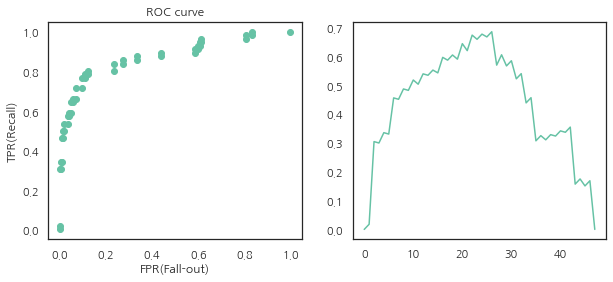

In [81]:
# roc_curve(타겟값, prob of 1)

model = xgb_tuned

y_pred_proba = model.predict_proba(X_val_dumm)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val_dumm, y_pred_proba)

roc = pd.DataFrame({
    'FPR(Fall-out)': fpr, 
    'TPRate(Recall)': tpr, 
    'Threshold': thresholds
})
# print(roc)

# roc 시각화
plt.rcParams["figure.figsize"] = (10,4)
plt.subplot(121)
plt.scatter(fpr, tpr)
plt.title('ROC curve')
plt.xlabel('FPR(Fall-out)')
plt.ylabel('TPR(Recall)');

# threshold 최대값의 인덱스, np.argmax()
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('idx:', optimal_idx, ', threshold:', optimal_threshold)

# auc 시각화
plt.subplot(122)
plt.plot(tpr-fpr);

# threshold 설정 및 레포트
y_pred_optimal = y_pred_proba >= optimal_threshold
print('Report \n',classification_report(y_val_dumm, y_pred_optimal))

# auc 점수
auc_score = roc_auc_score(y_val_dumm, y_pred_optimal)
print('최종 검증 정확도: ', accuracy_score(y_val_dumm, y_pred_optimal))
print('최종 f1 스코어',f1_score(y_val_dumm, y_pred_optimal))
print('최종 auc점수 : ', auc_score)


idx: 40 , threshold: 0.60888016
Report 
               precision    recall  f1-score   support

           0       0.90      0.87      0.88       252
           1       0.61      0.69      0.65        78

    accuracy                           0.82       330
   macro avg       0.76      0.78      0.77       330
weighted avg       0.83      0.82      0.83       330

최종 검증 정확도:  0.8242424242424242
최종 f1 스코어 0.6506024096385543
최종 auc점수 :  0.7786935286935287


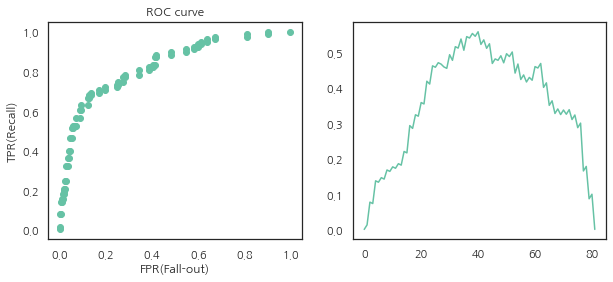

In [82]:
# 테스트 데이터 성능확인
model = xgb_tuned

y_pred_proba = model.predict_proba(X_test_dumm)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_dumm, y_pred_proba)

roc = pd.DataFrame({
    'FPR(Fall-out)': fpr, 
    'TPRate(Recall)': tpr, 
    'Threshold': thresholds
})
# print(roc)

# roc 시각화
plt.rcParams["figure.figsize"] = (10,4)
plt.subplot(121)
plt.scatter(fpr, tpr)
plt.title('ROC curve')
plt.xlabel('FPR(Fall-out)')
plt.ylabel('TPR(Recall)');

# threshold 최대값의 인덱스, np.argmax()
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('idx:', optimal_idx, ', threshold:', optimal_threshold)

# auc 시각화
plt.subplot(122)
plt.plot(tpr-fpr);

# threshold 설정 및 레포트
y_pred_optimal = y_pred_proba >= optimal_threshold
print('Report \n',classification_report(y_test_dumm, y_pred_optimal))

# auc 점수
auc_score = roc_auc_score(y_test_dumm, y_pred_optimal)
print('최종 검증 정확도: ', accuracy_score(y_test_dumm, y_pred_optimal))
print('최종 f1 스코어',f1_score(y_test_dumm, y_pred_optimal))
print('최종 auc점수 : ', auc_score)


# 머신러닝모델해석

### Feature Importance

In [83]:
# 3. EDA한 DATA의 수치데이터 없애고 카테고리화한 데이터로 훈련검증데이터셋 만들기-> 재실행

category_columns=['Ages','MonthlyIncomeSection','DurationOfPitchSection']
numerical_columns=['MonthlyIncome','Age','DurationOfPitch']

data[category_columns] = data[category_columns].astype('category')

# 카테고리화한 데이터를 수치형으로 변경하기
category_data=pd.get_dummies(data,drop_first=True)

# 훈련/검증셋 나누기

train_dumm, test_dumm = train_test_split(category_data, test_size=0.2, random_state=2)
train_dumm, val_dumm = train_test_split(train_dumm, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = category_data.columns.drop([target])


In [84]:
train_dumm_=train_dumm[features]

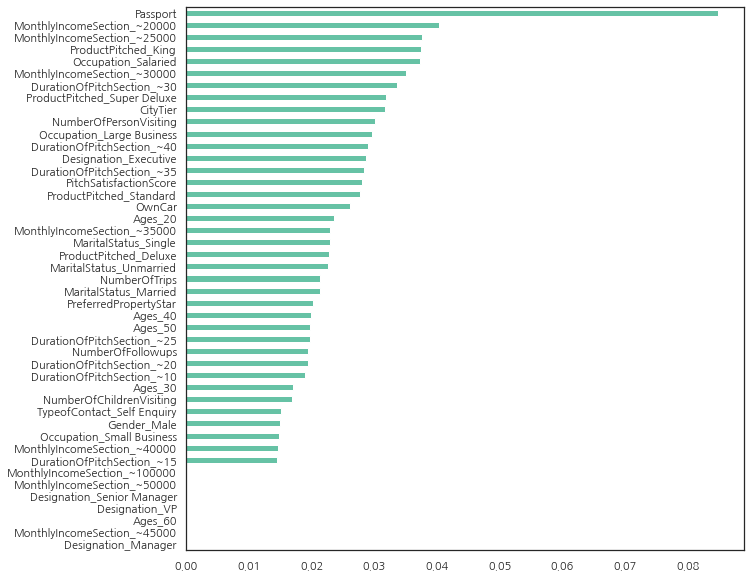

In [85]:
importances = pd.Series(model.feature_importances_, train_dumm_.columns)
plt.figure(figsize=(10,10))
importances.sort_values().plot.barh();

In [86]:
new_category_data=['CityTier', 'NumberOfPersonVisiting', 'NumberOfFollowups',
       'PreferredPropertyStar', 'NumberOfTrips', 'Passport',
       'PitchSatisfactionScore', 'OwnCar', 'NumberOfChildrenVisiting',
       'TypeofContact_Self Enquiry', 'Occupation_Large Business',
       'Occupation_Salaried', 'Occupation_Small Business', 'Gender_Male',
       'ProductPitched_Deluxe', 'ProductPitched_King',
       'ProductPitched_Standard', 'ProductPitched_Super Deluxe',
       'MaritalStatus_Married', 'MaritalStatus_Single',
       'MaritalStatus_Unmarried', 'Designation_Executive',
       'Designation_Manager', 'Designation_Senior Manager', 'Designation_VP',
       'Ages_20', 'Ages_30', 'Ages_40', 'Ages_50', 'Ages_60',
       'DurationOfPitchSection_~10', 'DurationOfPitchSection_~15',
       'DurationOfPitchSection_~20', 'DurationOfPitchSection_~25',
       'DurationOfPitchSection_~30', 'DurationOfPitchSection_~35',
       'DurationOfPitchSection_~40', 'MonthlyIncomeSection_~20000',
       'MonthlyIncomeSection_~25000', 'MonthlyIncomeSection_~30000',
       'MonthlyIncomeSection_~35000', 'MonthlyIncomeSection_~40000',
       'MonthlyIncomeSection_~45000', 'MonthlyIncomeSection_~50000',
       'MonthlyIncomeSection_~100000']

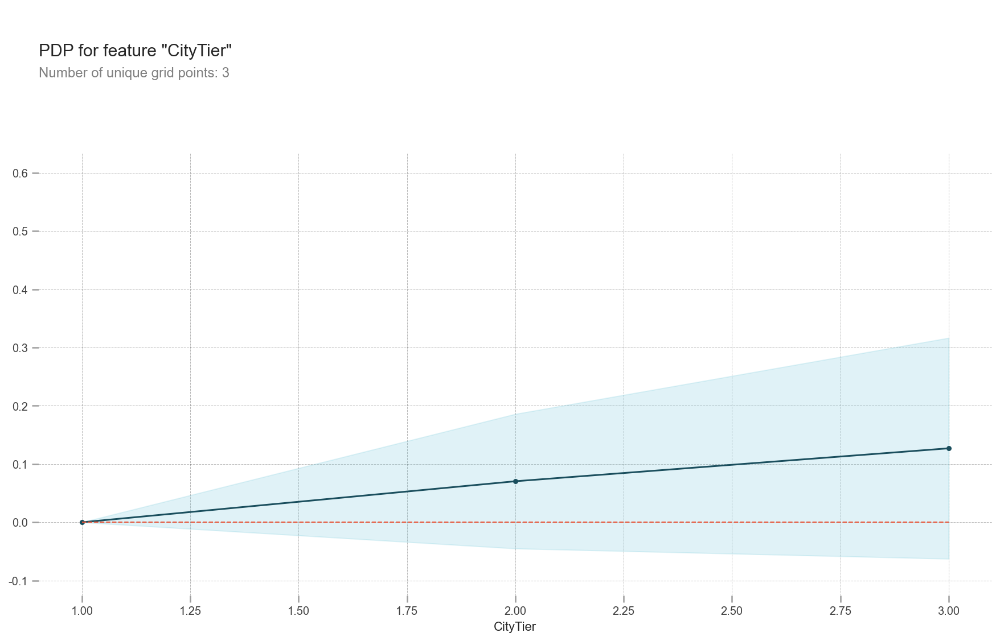

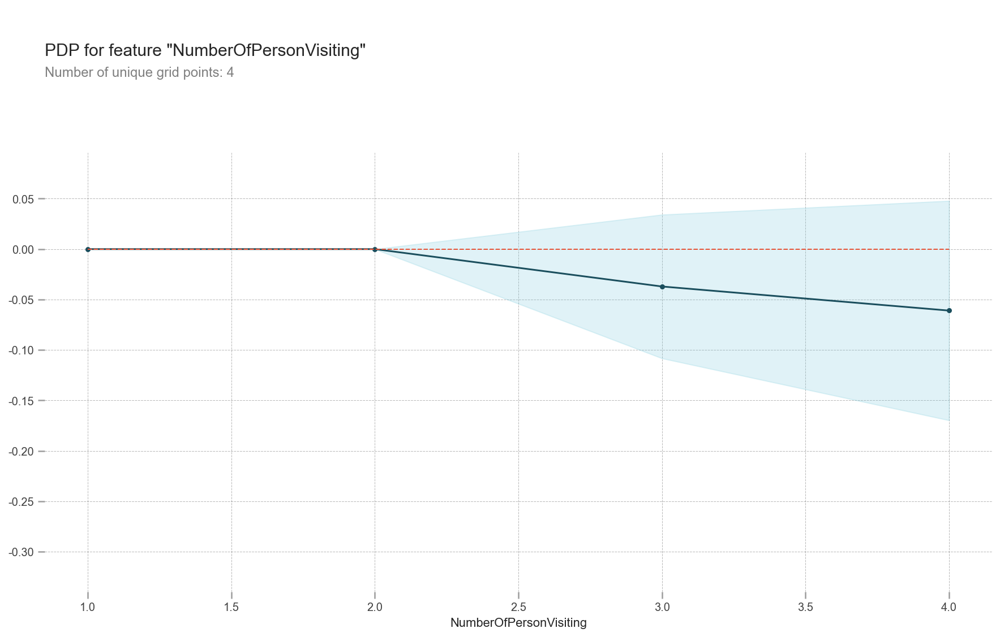

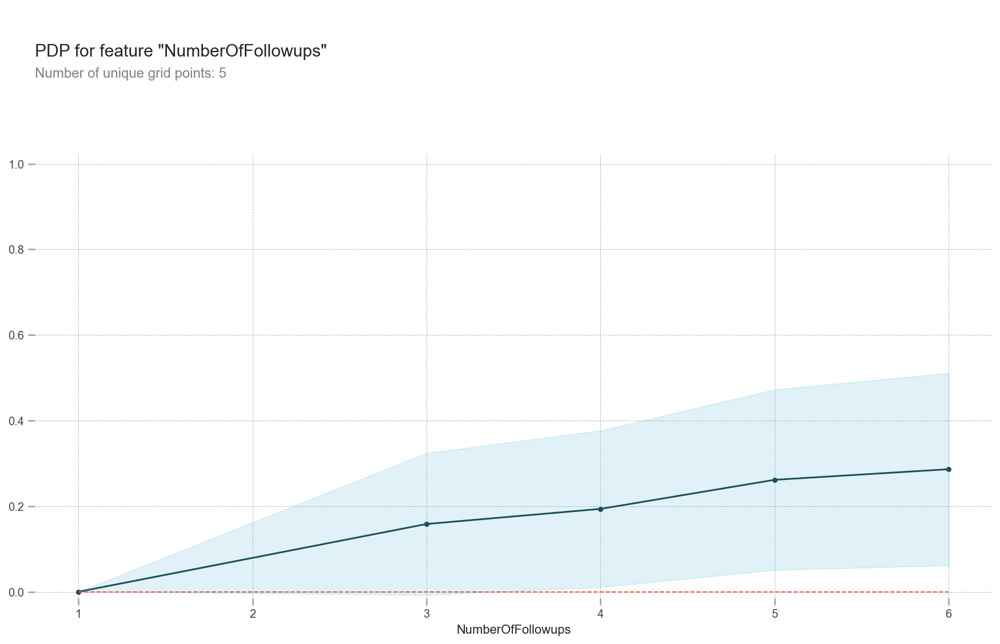

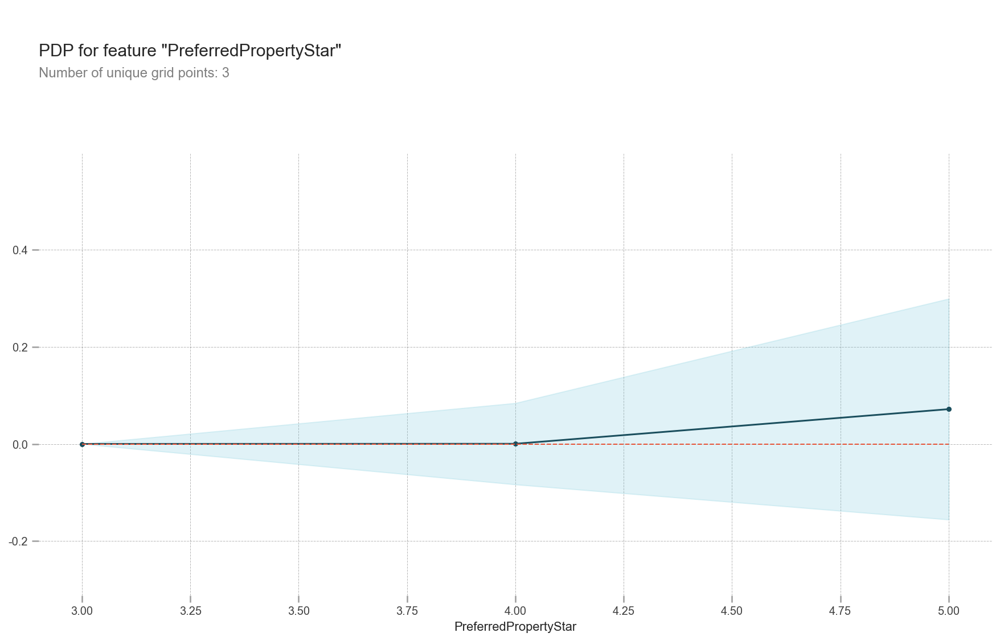

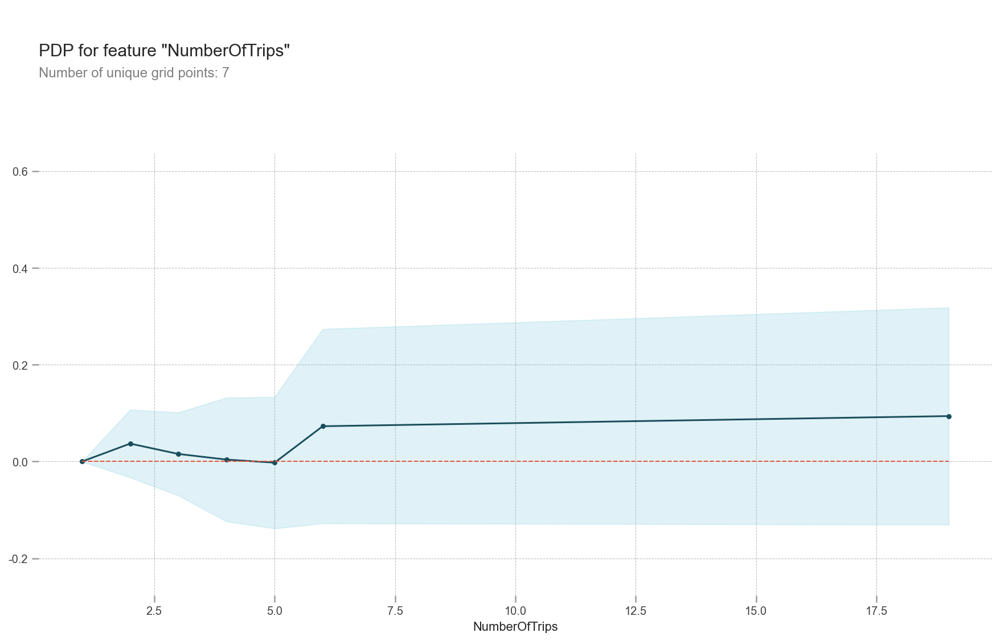

...

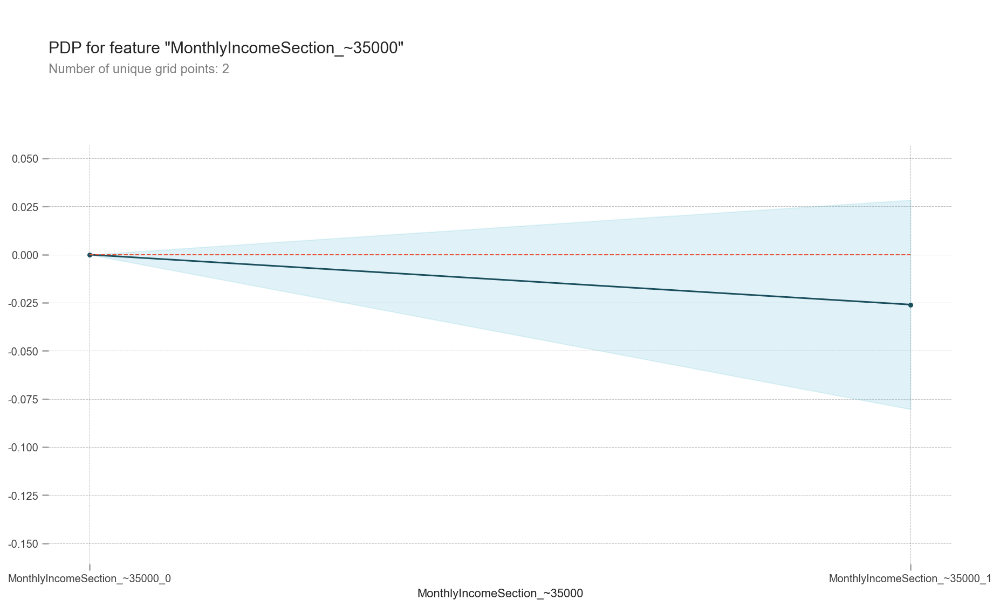

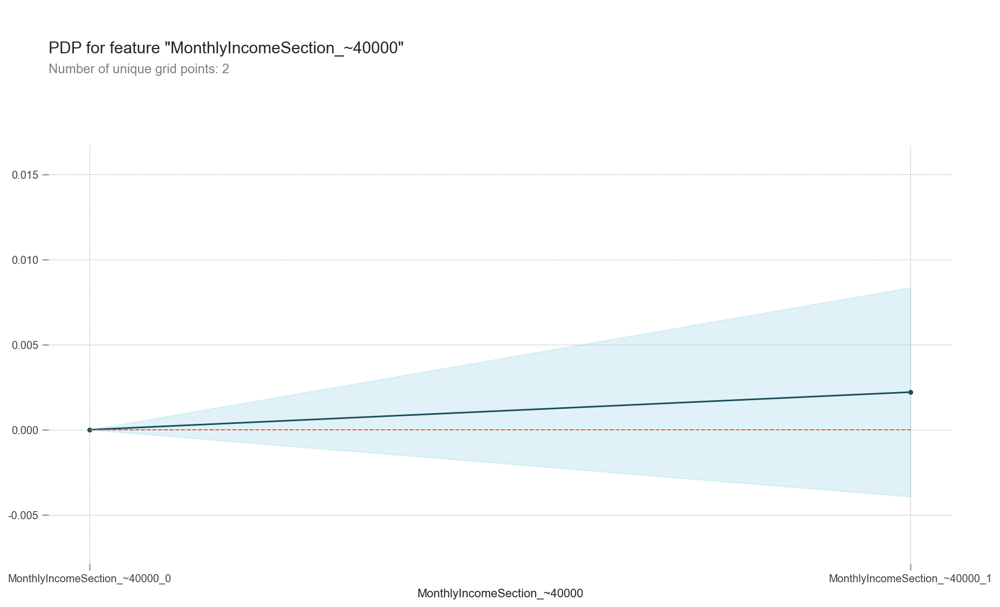

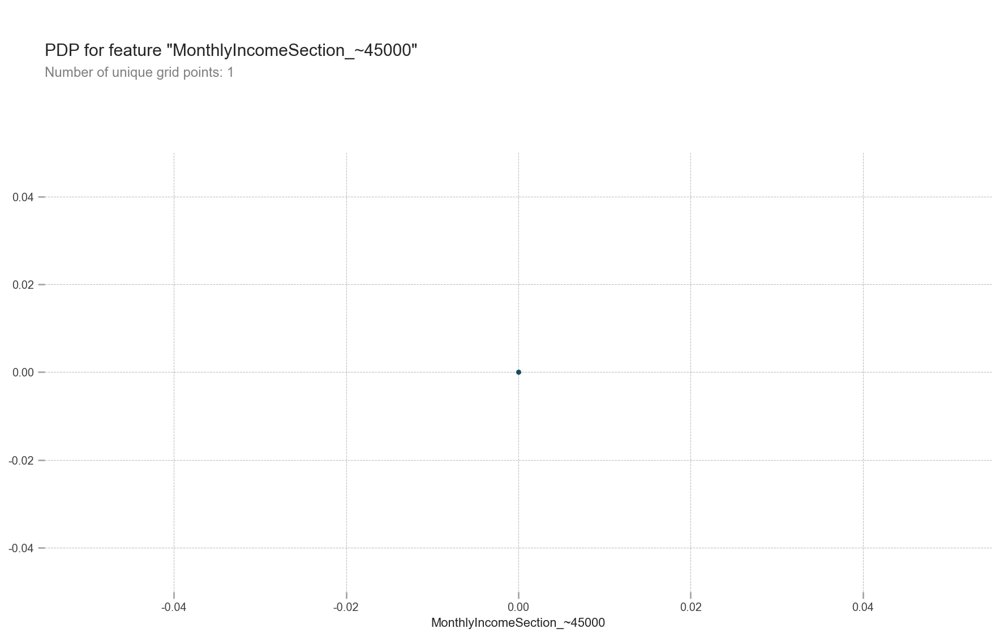

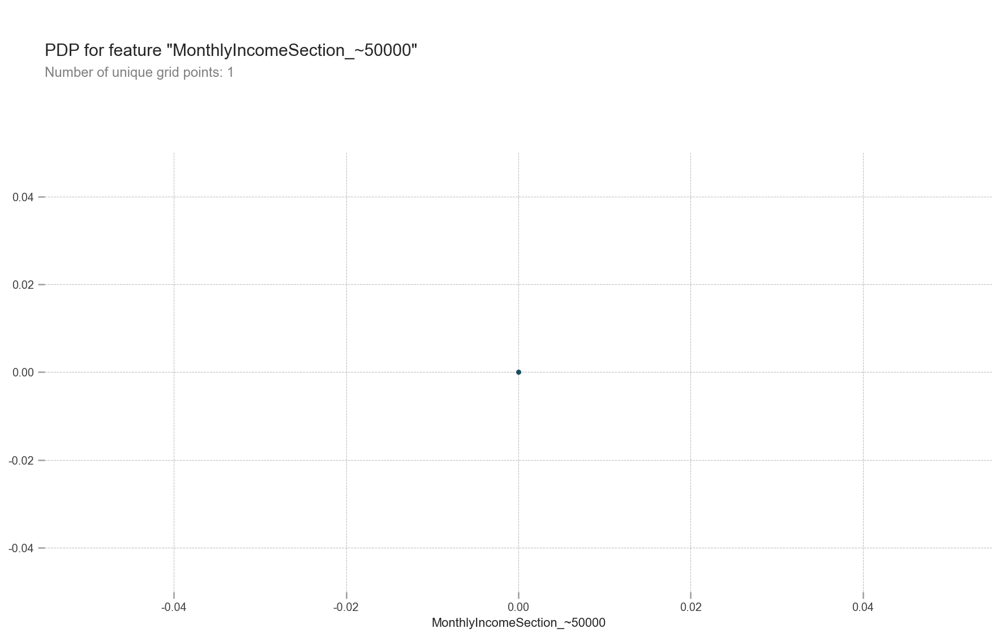

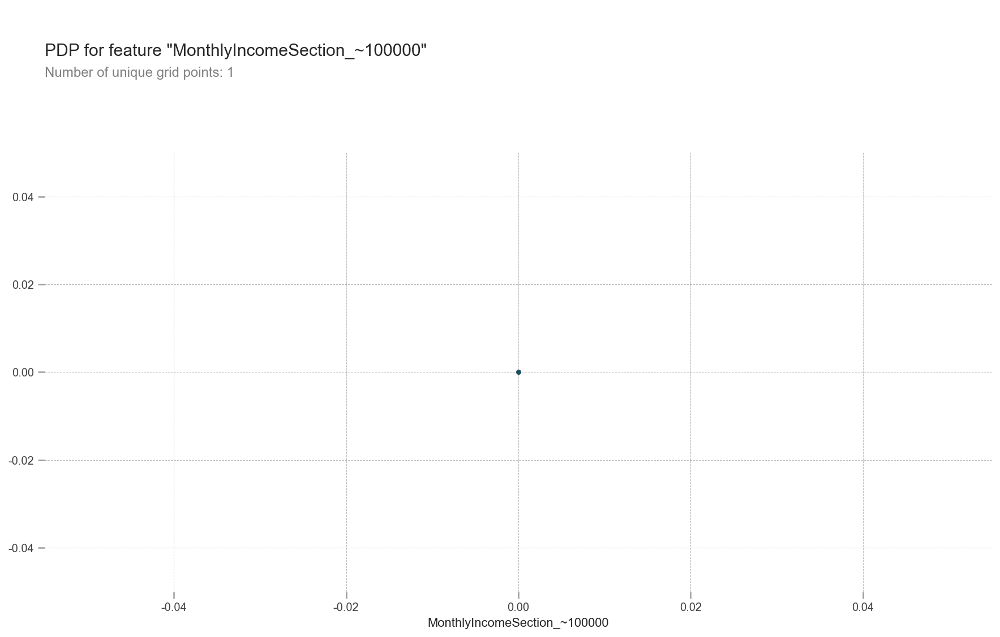

In [87]:
plt.rcParams['figure.dpi'] = 144

for i in new_category_data:
    feature = i
    isolated = pdp_isolate(
        model=model, 
        dataset=train_dumm_, 
        model_features=train_dumm_.columns, 
        feature=feature,
        grid_type='percentile', # default='percentile', or 'equal'
        num_grid_points=10 # default=10
    )
    pdp_plot(isolated, feature_name=feature);

In [88]:
shap.initjs()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_dumm_.iloc[:100])
shap.force_plot(explainer.expected_value, shap_values, train_dumm_.iloc[:100])

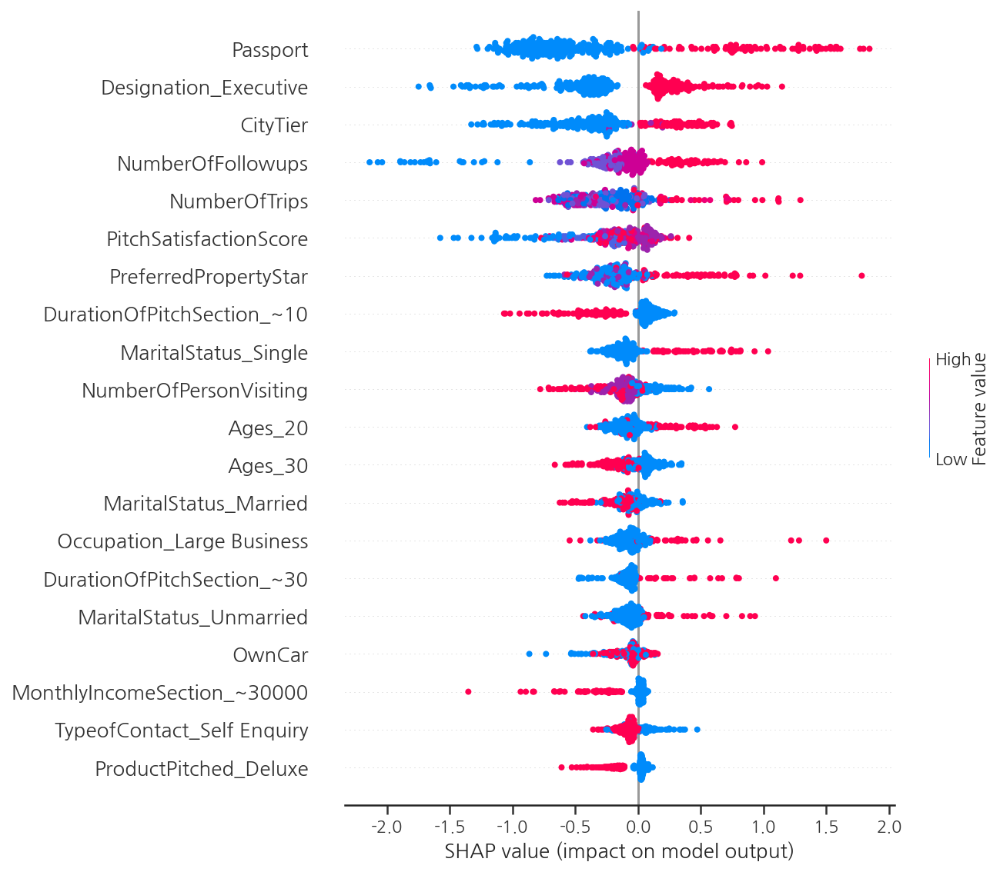

In [89]:
shap_values = explainer.shap_values(train_dumm_.iloc[:300])
shap.summary_plot(shap_values, train_dumm_.iloc[:300])

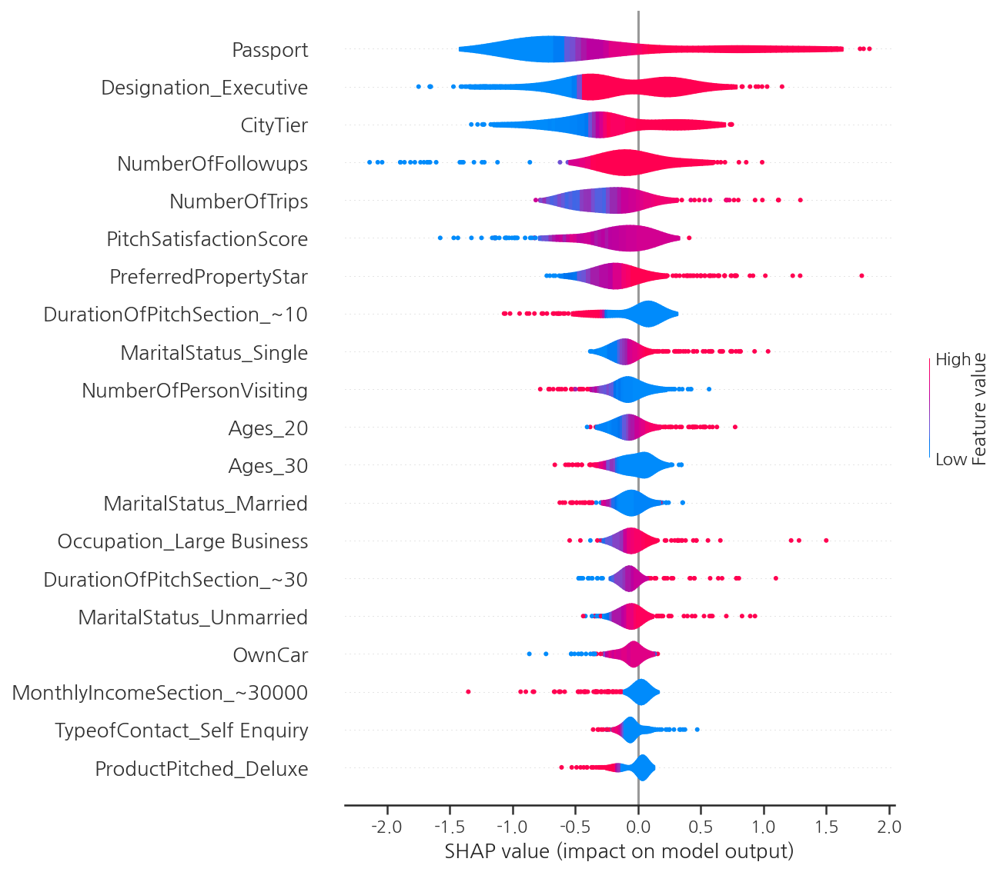

In [90]:
shap.summary_plot(shap_values, train_dumm_.iloc[:300], plot_type="violin")


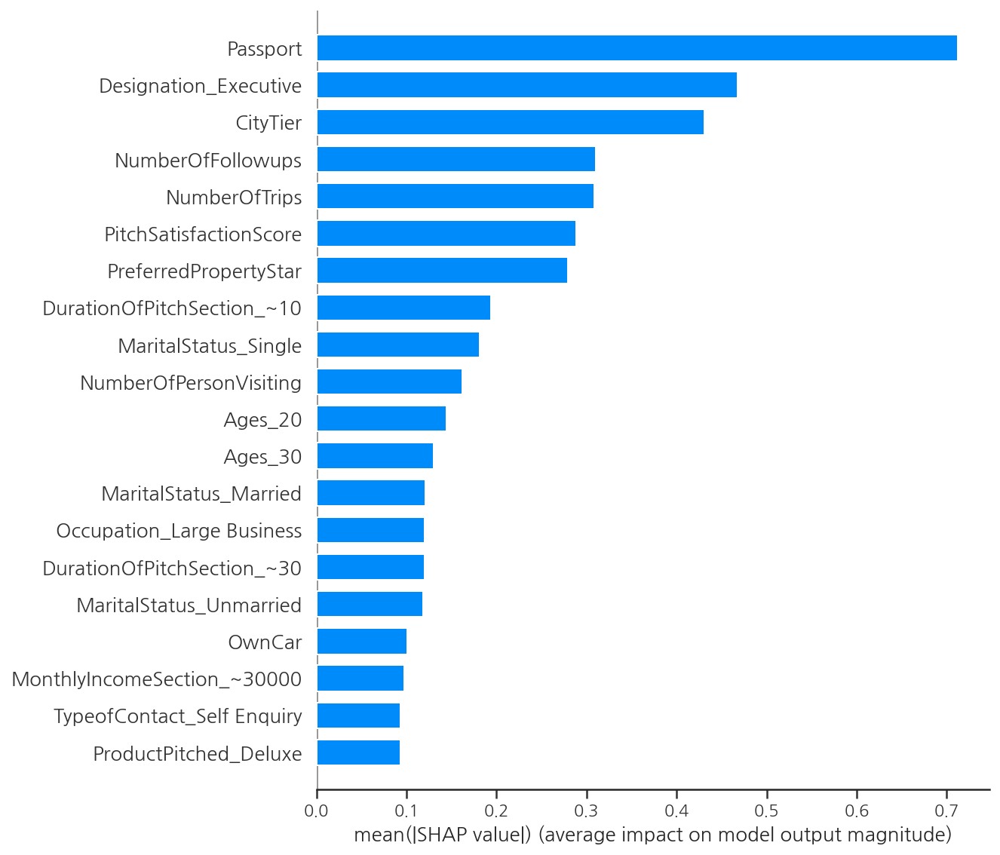

In [91]:
shap.summary_plot(shap_values, train_dumm_.iloc[:300], plot_type="bar")


### 결론

데이터가 다음 아래의 내용이 없어 분석하는데 아쉬운 부분이 있었다.
1. 어떤 사람 대상인지, 
2. 수집된 시점은 언제인지(코로나 전/후), 
3. 어디서 수집 됐는지(어느 지역(나라), 
4. 고객이 만족도를 어떻게 표시한 부분인지,
5. 데이터의 단위누락(소득이 개인인지, 가정인지, 프레젠테이션 기간의 단위는 일인건지)
6. 고객이 선택한 여행을 위해 지출한 비용

하지만 모든 데이터가 완벽할 수 없는 것처럼 우리가 확보한 가장 좋은 것은 VIP에 대한 정보이다.  
각 그래프 확인 결과 당초 특성의 연관분석에 대해 시각화한 것과 마찬가지로 PassPort가 가장 상위에서 연관성이 있음을 확인할 수 있다.  
현재 사용가능한 데이터를 사용한 것이 1955개의 데이터만 사용했음에도 고객이 여행상품을 선택할지에 대한 괜찮은 성능의 Modeling을 했다.  

현재 다뤄본 데이터는 일반적인 여행사가 고객의 소득자료까지는 알 수 없으니 고소득자의 금융권 데이터와 여행사의 합성데이터라고 간주하였다.  
또한 우리나라의 경우 해당 소득군에 있는 사람들은 해외여행을 즐기기에 여권이 있는 경우가 많다고 보아, 여권이 필요없고 고소득자가 많은 곳은 미국으로 간주하였다.   
회사에서 해당 VIP의 고객유치를 확충하기 위해서는 여행을 스스로 알아볼 수 있도록 SNS 바이럴마케팅을 이용하는 것이 효과적일 것으로 보인다.
나이대별로 아이와 같이 지내기 좋은 basic한 등급을 여름휴가, 겨울휴가에 맞춰 바이럴마케팅을 하여 패키지여행을 할 수 있도록 광고해야하는데, 고객군 대부분이 남자인 것을 볼 때, 육아에 지친 엄마를 위해서 아빠가 어떤 특징을 고려하는지 부각시킨다면 효과적으로 보일 것이라 기대한다.  

프레젠테이션 이후 이뤄진 조치의 만족도 또한 고객이 선택하는데 중요한 요소이기에 높이기 위해서는 회사에서 영업사원을 위한 교육이 필요할 것으로 보인다.   
만족도를 높이기 위해 어떤 식으로 말해야하는지 교육을 하며, 주력상품을 홍보하기 위해 리플렛, 홈페이지는 어떤 식으로 관리되고 있는지 확인하고,  
홈페이지에서는 가능한한 어렵지 않게 고객이 여행상품을 구입할 수 있도록 ux-ui를 관리하는 것이 필요할 것으로 보인다.

위의 분석을 바탕으로 여행사에서 갖고있는 추가적인 내부 데이터를 활용하여  
여행사입장에서는 고객에게 맞춤형서비스를 제공하며, 소비자는 추가적인 조사 없이 여행상품을 선택한다면,  
여행사는 광고비용을, 소비자는 시간을 절감하는 데이터분석이 가능할 것으로 기대한다.
